# Predicting Water Well Status in Tanzania using Machine Learning

## Executive Summary

The government of Tanzania seeks to provide clean water to all of its citizens, but over 40% of the population still lacks access to clean water.  The government collaborated with Taarifa, a non-profit organization, to create a database of all of the water supply projects in the country. Data for each water supply project includes information about the project’s geographic location, local water abundance and quality, technical information (e.g., type of well), funder, installer, project administration, and more.

DrivenData, a social enterprise that works with mission-driven organizations, is hosting a competition to predict water well status using machine learning algorithms. The dataset provided by DrivenData contains data for 59,400 water supply projects. There are 39 features in this dataset and three target classes (well status = ‘functional’, ‘non-functional’, or ‘functional; needs repair’).  Thus, this is a **multi-class classification problem.**

For this project, I used data visualization extensively during the exploration phase and evaluated several different supervised machine learning models to predict water well status. I also employed a few different approaches to address class imbalances, significantly improving performance around costly ‘false-negative’ errors (predicting wells to be ‘functional’, when in fact they were ‘non-functional’ or ‘functional needing repair’).  

For an overview of the functions I developed and deployed, check out my blog post at https://github.com/gdurante2019/gdurante2019.github.io/blob/master/_posts/2020-07-22-data_science_toolbox_function_to_create_top_n_values.markdown.

In this project, I found that there is a significant trade-off between 1) better overall test accuracy scores when using the original imbalanced class data, and 2) better performance in minimizing false negative errors by addressing class imbalances.  In fact, the problem with false negatives resulting from the use of imbalanced class data is so great that, for a model to be useful, the class imbalance issue _must_ be addressed.  To do this, I employed either SMOTE resampling or the class_weight='balanced' parameter (where available).

## Background

Tanzania is a developing country that is home to approximately 57,000,000 people. The government seeks to provide clean water to its citizens, but a significant percentage of people (~43%, or 25,000,000) do not yet have access to clean water (1). Over 75,000 water supply projects have been constructed, ranging from large wells for hundreds or thousands of people to shallow wells or hand pumps serving only a few people. Only about 54% of all water supply projects in the country are functional, while 38% are non-functional (needing replacement) and the remaining ~8% are functional, but in need of repair. 

The government of Tanzania has collaborated with Taarifa, a non-profit organization, to create a database of all of the water supply projects in the country (3). Data for each water supply project includes information about the project’s geographic location, local water abundance and quality, technical information (e.g., type of well), funder, installer, project administration, and more.

More information about water infrastructure in Tanzania can be found at the Ministry of Water website (2).

### Machine learning competition to predict functional status of wells
DrivenData, a social enterprise that works with mission-driven organizations, is hosting a competition to predict water well status using machine learning algorithms (4). DrivenData provides data to participants in the competition in the form of a .csv file and very brief descriptors for each field. The dataset provided by DrivenData contains data for 59,400 water supply projects. In total, there are 39 features in this dataset; most are categorical. With three target classes (well status = ‘functional’, ‘non-functional’, or ‘functional; needs repair’), **this is a multi-class classification problem.** 

Participants develop machine learning models and submit their predictions (‘functional’, ‘non-functional’, or ‘functional—needing repair’) for 14850 wells in the test dataset. DrivenData compares each participant’s predictions against the actual status of the wells and returns an accuracy score for the participant’s prediction dataset.


## My Approach
_**Note:**_  I used this dataset to satisfy the project requirement for supervised learning/ensemble methods that had been covered to that point in my data science immersive program, which included decision trees, random forests, bagged trees, boosted trees, and support vector machines.  I chose to evaluate as many algorithms with hyperparameter tuning as possible to get a better sense of how the various models performed given different inputs and hyperparameter settings.

## Methodology

### OSEMiN Framework
* Using tools learned in Flatiron’s Data Science Boot Camp, I developed several machine learning models to evaluate and predict water well status, evaluating various features within those selected
  * To approach the question and structure the project, I used the OSEMiN (Obtain, Scrub, Explore, Model, and iNterpret) methodology 
  * After obtaining the data from the DrivenData website, I performed data cleaning, explored the data using visualizations and tables, and viewed the Tanzanian water well website 
  * After evaluating the quality of the data in various categories and considering issues such as collinearity and value of the information contained, I selected a subset of features to use in modeling 
  * Finally, I evaluated performance of the models—especially regarding how well they did in terms of predicting whether the well was ‘non-functional’ or ‘functional, needing repair’

###  Classification of Categorical Variables
* The model classifies a given well as ‘functional’, ‘non-functional’ (needs replacement), or ‘functional--needing repair’; the target is not a numerical value
* Since a model is a representation of a process, not the process itself, it will never be 100% correct; thus, there will be errors in prediction
* Because there will be prediction errors, results should be interpreted in the context of which errors are more important; for example:
  * A functional well predicted to be non-functional may result in costs for a technician to travel to the well and evaluate its status
  * A non-functional well predicted to be functional may result in delays in repair or replacement, causing possible health consequences and other hardships to those who depend on the well

### Types of Data Available¶
* Location
  * Geographic—e.g., basin, latitude/longitude, altitude, water quality, water quantity
  * Political/social—e.g., region, district, LGA, ward, subvillage, population around well
* Project technical specifics
  * Extraction method/type of well—e.g., gravity, hand-pump, submersible, motorized, wind-powered) 
  * Water source—e.g., lake, river, spring, rainwater harvesting, shallow well
  * Waterpoint type—e.g., hand pump, communal standpipe, cattle trough, improved spring
* Project management specifics
  * Project initiation and construction:  funder, installer, public meeting held, permit issued, construction year
  * Project management—e.g., name and type of managing organization, payment types
  
#### Limitations of the data
  * Significant percentage of values missing ('construction_year' and 'scheme_name', for example)
  * Data quality issues for features with large numbers of values, such as 'funder', 'installer', and 'scheme_name'
    * Different spellings of the same organization's name
    * Shorthand entry--e.g., 'q' 'dw', and no master list is available to decipher this information
    * Organization name vs. organization type (e.g., 'school' or 'church')--primarily for 'scheme_name'

### Observations on results of different modeling approaches
* _**'n' values:**_ 
  * "'n' values" represents the top 'n' number of dummy variables for a feature to be included in the model, sorted in descending order by greatest number of projects attributed to that parameter to the least
  * Created a function that takes top 'n' values of a feature and assign 'other' to the remaining values in that feature (e.g., installer, funder, ward, subvillage); benefits include:
    * Reducing the total number of dummy variables, thereby potentially reducing overfitting and increasing performance along certain measures
    * Easily testing the effects of different numbers of dummy variables on model results
  * 'n' values between 50 and 125 seemed to represent a sweet spot in many models for both test accuracy scores and minimization of false negatives
* _**Decision trees:**_ the hyperparameter '**max_depth**' (the maximum number of decision points that a tree can have) must be carefully considered
  * The default setting, **max_depth=None**, results in higher accuracy scores with training data but a wider spread between training and test scores
  * Larger max_depth values are likely to result in overfitting
* _**Addressing imbalanced classes:**_ 
  * Minimizing costly 'false negative' errors (predicting a well to be 'functional' when it was not) requires addressing imbalanced classes   
    * 'functional needs repair' wells erroneously predicted to be 'functional' between 54% to 77% of the time (depending on the model)  
    * 'non-functional' wells erroneously predicted to be 'functional' around 25-30% of the time (depending on the model)
    * The usefulness of these models is very limited if these false negatives cannot be reduced 
  * Modeling using the class_weight='balanced' or SMOTE resampling had lower overall accuracy but much better performance on minimizing the most costly false negatives 
    * SMOTE often provided slightly higher accuracy scores in the decision tree classifier
    * However, class_weight='balanced' resulting in better performance reducing false negatives
    * Choice of balanced class weights vs. SMOTE resampling will depend on the importance of overall accuracy vs. reduction of certain kinds of errors    


## Findings

### Model Performance: Accuracy and Reduction of False Negatives 
* Imbalanced dataset (original)
  * Training accuracies ranged 77% to 85%
  * Test accuracies ranged from 74% to 80%
  * False negatives were unacceptably high  (up to 77% and 40% for mis-classification of 'functional needs repair' and 'non functional' wells as 'functional', respectively)
* SMOTE resampled data
  * Training accuracies ranged 73% to 80%
  * Test accuracies ranged from 69% to 78%
  * False negatives were noticeably better than for imbalanced dataset, but still higher than for models run with class_weight='balanced' (~30-35% and ~23-30% for mis-classification of 'functional needs repair' and 'non functional' wells as 'functional', respectively)
* class_weight='balanced' (in models where this parameter is available)
  * Training accuracies ranged 65% to 78%
  * Test accuracies ranged from 62% to 74%
  * Best performance of the three options for false negatives (as low as 17% and 17% for mis-classification of 'functional needs repair' and 'non functional' wells as 'functional', respectively)
*   **Conclusion--Class imbalances:**  There is a significant trade-off between overall accuracy and minimizing costly false negatives by addressing class imbalances that contribute to the errors in the smaller classes ('non-functional' and 'functional needs repair'). 
  
### Feature Importances 
* I found that the top features importances will vary depending on the modeling objectives
  * Some specific feature values appear towards the top of the feature importance list for virtually all of the models employed, and for imbalanced or rebalanced data, hyperparameter tuning, etc.
  * Other feature importances as a whole (such as LGA) are greater in models are optimized for accuracy scores with rebalanced data (and they do fairly well with false negatives)
* I recommend looking more closely at these values, since they are likely to contain those specific values that have more wells needing replacement or repair


## Future Work

* Additional modeling with subsets of dummy variables: 
  * Most models have many of the same dummy variables at the top of their feature importance lists
  * May want to explore whether a smaller subset of dummy variables, such as the top 50, would improve model performance
* Improving data completeness--could additional information could be obtained for features with significant missing values or data entry inconsistencies?  For example:
  * ‘Other’ in the category ‘extraction_type’; almost 85% of wells in this category are non-functional
  * Year constructed--no date recorded for significant percentage of wells; do these wells have something in common, such as:
    * Clustered in certain locations where data was/is not collected?
    * Constructed before a certain date?
    * Constructed by certain installers or funded by certain funders?
    * Of a certain type, e.g., handpump?  
* Evaluating whether funder or installer country of origin influences well functionality
  * For example, at least a couple of funders are obviously from Germany, as indicated by their names (there is no other funder/installer location information in the dataset itself, and I couldn't find a comprehensive source anywhere else) 
  * Wells associated with these funders have a very high 'functional' status, with very few projects in need of maintenance or equipment replacement
  * If the government of Tanzania or Taarifa had a complete and accurate list of the location for each funder/installer, the locations of the funders or installers could be another feature on which to model 
* Latitude / longitude—Looking at functional status of wells at various geographic locations to identify possible patterns due to geological differences


# Analysis 

## Obtain Data

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


In [2]:
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 100)

In [3]:
df_train_values = pd.read_csv('tanzania_water_training_set_values.csv')
df_train_values.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,Lake Nyasa,Mnyusi B,Iringa,11,5,Ludewa,Mundindi,109,True,GeoData Consultants Ltd,VWC,Roman,False,1999,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,Lake Victoria,Nyamara,Mara,20,2,Serengeti,Natta,280,NaN,GeoData Consultants Ltd,Other,NaN,True,2010,gravity,gravity,gravity,wug,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,Pangani,Majengo,Manyara,21,4,Simanjiro,Ngorika,250,True,GeoData Consultants Ltd,VWC,Nyumba ya mungu pipe scheme,True,2009,gravity,gravity,gravity,vwc,user-group,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe
3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,Mahakamani,Mtwara,90,63,Nanyumbu,Nanyumbu,58,True,GeoData Consultants Ltd,VWC,NaN,True,1986,submersible,submersible,submersible,vwc,user-group,never pay,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe
4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,Lake Victoria,Kyanyamisa,Kagera,18,1,Karagwe,Nyakasimbi,0,True,GeoData Consultants Ltd,NaN,NaN,True,0,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe


In [4]:
df_train_labels = pd.read_csv('tanzania_water_training_set_labels.csv')
df_train_labels

,id,status_group
0,69572,functional
1,8776,functional
2,34310,functional
3,67743,non functional
4,19728,functional
...,...,...
59395,60739,functional
59396,27263,functional
59397,37057,functional
59398,31282,functional


In [5]:
# df = df_train_values.join(df_train_labels, on='id')
df_train = pd.merge(df_train_values, df_train_labels, on='id')
df_train

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,Lake Nyasa,Mnyusi B,Iringa,11,5,Ludewa,Mundindi,109,True,GeoData Consultants Ltd,VWC,Roman,False,1999,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,Lake Victoria,Nyamara,Mara,20,2,Serengeti,Natta,280,NaN,GeoData Consultants Ltd,Other,NaN,True,2010,gravity,gravity,gravity,wug,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,Pangani,Majengo,Manyara,21,4,Simanjiro,Ngorika,250,True,GeoData Consultants Ltd,VWC,Nyumba ya mungu pipe scheme,True,2009,gravity,gravity,gravity,vwc,user-group,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional
3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,Mahakamani,Mtwara,90,63,Nanyumbu,Nanyumbu,58,True,GeoData Consultants Ltd,VWC,NaN,True,1986,submersible,submersible,submersible,vwc,user-group,never pay,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional
4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,Lake Victoria,Kyanyamisa,Kagera,18,1,Karagwe,Nyakasimbi,0,True,GeoData Consultants Ltd,NaN,NaN,True,0,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59395,60739,10.0,2013-05-03,Germany Republi,1210,CES,37.169807,-3.253847,Area Three Namba 27,0,Pangani,Kiduruni,Kilimanjaro,3,5,Hai,Masama Magharibi,125,True,GeoData Consultants Ltd,Water Board,Losaa Kia water supply,True,1999,gravity,gravity,gravity,water board,user-group,pay per bucket,per bucket,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
59396,27263,4700.0,2011-05-07,Cefa-njombe,1212,Cefa,35.249991,-9.070629,Kwa Yahona Kuvala,0,Rufiji,Igumbilo,Iringa,11,4,Njombe,Ikondo,56,True,GeoData Consultants Ltd,VWC,Ikondo electrical water sch,True,1996,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,river,river/lake,surface,communal standpipe,communal standpipe,functional
59397,37057,0.0,2011-04-11,NaN,0,NaN,34.017087,-8.750434,Mashine,0,Rufiji,Madungulu,Mbeya,12,7,Mbarali,Chimala,0,True,GeoData Consultants Ltd,VWC,NaN,False,0,swn 80,swn 80,handpump,vwc,user-group,pay monthly,monthly,fluoride,fluoride,enough,enough,machine dbh,borehole,groundwater,hand pump,hand pump,functional
59398,31282,0.0,2011-03-08,Malec,0,Musa,35.861315,-6.378573,Mshoro,0,Rufiji,Mwinyi,Dodoma,1,4,Chamwino,Mvumi Makulu,0,True,GeoData Consultants Ltd,VWC,NaN,True,0,nira/tanira,nira/tanira,handpump,vwc,user-group,never pay,never pay,soft,good,insufficient,insufficient,shallow well,shallow well,groundwater,hand pump,hand pump,functional


In [6]:
df_test_vals = pd.read_csv('tanzania_water_test_set_labels.csv')
df_test_vals.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
0,50785,0.0,2013-02-04,Dmdd,1996,DMDD,35.290799,-4.059696,Dinamu Secondary School,0,Internal,Magoma,Manyara,21,3,Mbulu,Bashay,321,True,GeoData Consultants Ltd,Parastatal,NaN,True,2012,other,other,other,parastatal,parastatal,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,other,other
1,51630,0.0,2013-02-04,Government Of Tanzania,1569,DWE,36.656709,-3.309214,Kimnyak,0,Pangani,Kimnyak,Arusha,2,2,Arusha Rural,Kimnyaki,300,True,GeoData Consultants Ltd,VWC,TPRI pipe line,True,2000,gravity,gravity,gravity,vwc,user-group,never pay,never pay,soft,good,insufficient,insufficient,spring,spring,groundwater,communal standpipe,communal standpipe
2,17168,0.0,2013-02-01,NaN,1567,NaN,34.767863,-5.004344,Puma Secondary,0,Internal,Msatu,Singida,13,2,Singida Rural,Puma,500,True,GeoData Consultants Ltd,VWC,P,NaN,2010,other,other,other,vwc,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,other,other
3,45559,0.0,2013-01-22,Finn Water,267,FINN WATER,38.058046,-9.418672,Kwa Mzee Pange,0,Ruvuma / Southern Coast,Kipindimbi,Lindi,80,43,Liwale,Mkutano,250,NaN,GeoData Consultants Ltd,VWC,NaN,True,1987,other,other,other,vwc,user-group,unknown,unknown,soft,good,dry,dry,shallow well,shallow well,groundwater,other,other
4,49871,500.0,2013-03-27,Bruder,1260,BRUDER,35.006123,-10.950412,Kwa Mzee Turuka,0,Ruvuma / Southern Coast,Losonga,Ruvuma,10,3,Mbinga,Mbinga Urban,60,NaN,GeoData Consultants Ltd,Water Board,BRUDER,True,2000,gravity,gravity,gravity,water board,user-group,pay monthly,monthly,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe


In [7]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59400 entries, 0 to 59399
Data columns (total 41 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     59400 non-null  int64  
 1   amount_tsh             59400 non-null  float64
 2   date_recorded          59400 non-null  object 
 3   funder                 55765 non-null  object 
 4   gps_height             59400 non-null  int64  
 5   installer              55745 non-null  object 
 6   longitude              59400 non-null  float64
 7   latitude               59400 non-null  float64
 8   wpt_name               59400 non-null  object 
 9   num_private            59400 non-null  int64  
 10  basin                  59400 non-null  object 
 11  subvillage             59029 non-null  object 
 12  region                 59400 non-null  object 
 13  region_code            59400 non-null  int64  
 14  district_code          59400 non-null  int64  
 15  lg

Identify null values in dataset

In [8]:
df_train.isnull().sum()

id                           0
amount_tsh                   0
date_recorded                0
funder                    3635
gps_height                   0
installer                 3655
longitude                    0
latitude                     0
wpt_name                     0
num_private                  0
basin                        0
subvillage                 371
region                       0
region_code                  0
district_code                0
lga                          0
ward                         0
population                   0
public_meeting            3334
recorded_by                  0
scheme_management         3877
scheme_name              28166
permit                    3056
construction_year            0
extraction_type              0
extraction_type_group        0
extraction_type_class        0
management                   0
management_group             0
payment                      0
payment_type                 0
water_quality                0
quality_

In [9]:
df_train.isna().sum()

id                           0
amount_tsh                   0
date_recorded                0
funder                    3635
gps_height                   0
installer                 3655
longitude                    0
latitude                     0
wpt_name                     0
num_private                  0
basin                        0
subvillage                 371
region                       0
region_code                  0
district_code                0
lga                          0
ward                         0
population                   0
public_meeting            3334
recorded_by                  0
scheme_management         3877
scheme_name              28166
permit                    3056
construction_year            0
extraction_type              0
extraction_type_group        0
extraction_type_class        0
management                   0
management_group             0
payment                      0
payment_type                 0
water_quality                0
quality_

Need to fill null values where appropriate and convert some feature data types:

* construction_year —> from int64 to string
* date_recorded —> to date time object
* district_code —> from int64 to string
* latitude —> from float64 to string (? --or to float, rounded to 4th decimal point?)
* longitude —> from float64 to string (? --or to float, rounded to 4th decimal point?)
* region_code —> from int64 to string
* id —> from int64 to string


## Data cleaning and preprocessing

### Fill null values for selected columns

In [10]:
df_train.funder.fillna('Missing', inplace=True)

In [11]:
df_train.funder.value_counts()

Government Of Tanzania    9084
Missing                   3635
Danida                    3114
Hesawa                    2202
Rwssp                     1374
                          ... 
Daldo                        1
Hery                         1
Sadaqatun Jar                1
Bakwata                      1
Water Aid/dwe                1
Name: funder, Length: 1898, dtype: int64

In [12]:
df_train.installer.fillna('Missing', inplace=True)

In [13]:
df_train.installer.value_counts()

DWE               17402
Missing            3655
Government         1825
RWE                1206
Commu              1060
                  ...  
Nassan workers        1
KURRP                 1
VC                    1
FIDA                  1
Water Aid/DWE         1
Name: installer, Length: 2146, dtype: int64

In [14]:
df_train.scheme_name.fillna('Missing', inplace=True)

In [15]:
df_train.scheme_name.value_counts()

Missing                  28166
K                          682
None                       644
Borehole                   546
Chalinze wate              405
                         ...  
Dam piped scheme             1
Kakerele  water s            1
TM Naibile part three        1
KKKT                         1
Shirimatunda                 1
Name: scheme_name, Length: 2697, dtype: int64

### Changing data types where appropriate

#### Function to change data type in columns

In [16]:
# Function to change data type in columns

def change_dtype(df, col_list, data_type):
    for col in df.columns:
        if col in col_list:
            df[col] = df[col].astype(data_type)
    return df


In [17]:
change_col_dtype = ['id', 'region_code', 'district_code', 'construction_year']


In [18]:
df_train = change_dtype(df_train, change_col_dtype, 'str')

In [19]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59400 entries, 0 to 59399
Data columns (total 41 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     59400 non-null  object 
 1   amount_tsh             59400 non-null  float64
 2   date_recorded          59400 non-null  object 
 3   funder                 59400 non-null  object 
 4   gps_height             59400 non-null  int64  
 5   installer              59400 non-null  object 
 6   longitude              59400 non-null  float64
 7   latitude               59400 non-null  float64
 8   wpt_name               59400 non-null  object 
 9   num_private            59400 non-null  int64  
 10  basin                  59400 non-null  object 
 11  subvillage             59029 non-null  object 
 12  region                 59400 non-null  object 
 13  region_code            59400 non-null  object 
 14  district_code          59400 non-null  object 
 15  lg

In [20]:
# changing lat/long to round to 4 decimal places to be easier to read
df_train.latitude.round(4)

0        -9.8563
1        -2.1475
2        -3.8213
3       -11.1553
4        -1.8254
          ...   
59395    -3.2538
59396    -9.0706
59397    -8.7504
59398    -6.3786
59399    -6.7475
Name: latitude, Length: 59400, dtype: float64

In [21]:
df_train.longitude.round(4)

0        34.9381
1        34.6988
2        37.4607
3        38.4862
4        31.1308
          ...   
59395    37.1698
59396    35.2500
59397    34.0171
59398    35.8613
59399    38.1040
Name: longitude, Length: 59400, dtype: float64

### Basic information about data:  info and value_counts

In [22]:
df_train.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 59400 entries, 0 to 59399
Data columns (total 41 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     59400 non-null  object 
 1   amount_tsh             59400 non-null  float64
 2   date_recorded          59400 non-null  object 
 3   funder                 59400 non-null  object 
 4   gps_height             59400 non-null  int64  
 5   installer              59400 non-null  object 
 6   longitude              59400 non-null  float64
 7   latitude               59400 non-null  float64
 8   wpt_name               59400 non-null  object 
 9   num_private            59400 non-null  int64  
 10  basin                  59400 non-null  object 
 11  subvillage             59029 non-null  object 
 12  region                 59400 non-null  object 
 13  region_code            59400 non-null  object 
 14  district_code          59400 non-null  object 
 15  lg

In [23]:
df_train.status_group.value_counts()

functional                 32259
non functional             22824
functional needs repair     4317
Name: status_group, dtype: int64

In [24]:
df_train['wpt_name'].value_counts()

none                         3563
Shuleni                      1748
Zahanati                      830
Msikitini                     535
Kanisani                      323
                             ... 
Kwa Mganga Mayenge              1
Nyakaroro                       1
Kisima Cha Benki Ya Dunia       1
Kwa Mama Yohana                 1
Kwa Rehema Mng'Ong'O            1
Name: wpt_name, Length: 37400, dtype: int64

In [25]:
df_train.installer.value_counts()

DWE               17402
Missing            3655
Government         1825
RWE                1206
Commu              1060
                  ...  
Nassan workers        1
KURRP                 1
VC                    1
FIDA                  1
Water Aid/DWE         1
Name: installer, Length: 2146, dtype: int64

In [26]:
df_train.construction_year.value_counts()

0       20709
2010     2645
2008     2613
2009     2533
2000     2091
2007     1587
2006     1471
2003     1286
2011     1256
2004     1123
2012     1084
2002     1075
1978     1037
1995     1014
2005     1011
1999      979
1998      966
1990      954
1985      945
1980      811
1996      811
1984      779
1982      744
1994      738
1972      708
1974      676
1997      644
1992      640
1993      608
2001      540
1988      521
1983      488
1975      437
1986      434
1976      414
1970      411
1991      324
1989      316
1987      302
1981      238
1977      202
1979      192
1973      184
2013      176
1971      145
1960      102
1967       88
1963       85
1968       77
1969       59
1964       40
1962       30
1961       21
1965       19
1966       17
Name: construction_year, dtype: int64

In [27]:
df_train.construction_year.replace(to_replace='0', value='Missing', inplace=True)

In [28]:
df_train.construction_year.value_counts()

Missing    20709
2010        2645
2008        2613
2009        2533
2000        2091
2007        1587
2006        1471
2003        1286
2011        1256
2004        1123
2012        1084
2002        1075
1978        1037
1995        1014
2005        1011
1999         979
1998         966
1990         954
1985         945
1980         811
1996         811
1984         779
1982         744
1994         738
1972         708
1974         676
1997         644
1992         640
1993         608
2001         540
1988         521
1983         488
1975         437
1986         434
1976         414
1970         411
1991         324
1989         316
1987         302
1981         238
1977         202
1979         192
1973         184
2013         176
1971         145
1960         102
1967          88
1963          85
1968          77
1969          59
1964          40
1962          30
1961          21
1965          19
1966          17
Name: construction_year, dtype: int64

### Clean up values of text fields to address data entry errors (e.g., capitalization vs. lower case entry for the same organization)

#### Function for standardizing text fields (converting all to lower case and removing non-alphanumeric characters)


In [29]:
# function for standardizing text fields (converting all to lower case and removing non-alphanumeric characters)

def string_field_cleanup(df, cols):
    
    for col in cols:
        
        # set all to lowercase:
        df[col] = df[col].str.lower()

        # replace spaces within text with _
        df[col] = df[col].str.replace(' ', '_')

        # remove all non-alphanumeric characters:
        df[col] = df[col].str.replace('\W', '')
        
        # remove quotation marks
        df[col] = df[col].str.strip("\"")
        
    return df

In [30]:
cols = ['installer', 'funder', 'wpt_name', 'subvillage', 'scheme_name', 'scheme_management', 'management', 'management_group']

In [31]:
df_train = string_field_cleanup(df_train, cols)
df_train

<ipython-input-29-2ffb639925d4>:14: FutureWarning: The default value of regex will change from True to False in a future version.
  df[col] = df[col].str.replace('\W', '')


,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
0,69572,6000.0,2011-03-14,roman,1390,roman,34.938093,-9.856322,none,0,Lake Nyasa,mnyusi_b,Iringa,11,5,Ludewa,Mundindi,109,True,GeoData Consultants Ltd,vwc,roman,False,1999,gravity,gravity,gravity,vwc,usergroup,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
1,8776,0.0,2013-03-06,grumeti,1399,grumeti,34.698766,-2.147466,zahanati,0,Lake Victoria,nyamara,Mara,20,2,Serengeti,Natta,280,NaN,GeoData Consultants Ltd,other,missing,True,2010,gravity,gravity,gravity,wug,usergroup,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
2,34310,25.0,2013-02-25,lottery_club,686,world_vision,37.460664,-3.821329,kwa_mahundi,0,Pangani,majengo,Manyara,21,4,Simanjiro,Ngorika,250,True,GeoData Consultants Ltd,vwc,nyumba_ya_mungu_pipe_scheme,True,2009,gravity,gravity,gravity,vwc,usergroup,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional
3,67743,0.0,2013-01-28,unicef,263,unicef,38.486161,-11.155298,zahanati_ya_nanyumbu,0,Ruvuma / Southern Coast,mahakamani,Mtwara,90,63,Nanyumbu,Nanyumbu,58,True,GeoData Consultants Ltd,vwc,missing,True,1986,submersible,submersible,submersible,vwc,usergroup,never pay,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional
4,19728,0.0,2011-07-13,action_in_a,0,artisan,31.130847,-1.825359,shuleni,0,Lake Victoria,kyanyamisa,Kagera,18,1,Karagwe,Nyakasimbi,0,True,GeoData Consultants Ltd,NaN,missing,True,Missing,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59395,60739,10.0,2013-05-03,germany_republi,1210,ces,37.169807,-3.253847,area_three_namba_27,0,Pangani,kiduruni,Kilimanjaro,3,5,Hai,Masama Magharibi,125,True,GeoData Consultants Ltd,water_board,losaa_kia_water_supply,True,1999,gravity,gravity,gravity,water_board,usergroup,pay per bucket,per bucket,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
59396,27263,4700.0,2011-05-07,cefanjombe,1212,cefa,35.249991,-9.070629,kwa_yahona_kuvala,0,Rufiji,igumbilo,Iringa,11,4,Njombe,Ikondo,56,True,GeoData Consultants Ltd,vwc,ikondo_electrical_water_sch,True,1996,gravity,gravity,gravity,vwc,usergroup,pay annually,annually,soft,good,enough,enough,river,river/lake,surface,communal standpipe,communal standpipe,functional
59397,37057,0.0,2011-04-11,missing,0,missing,34.017087,-8.750434,mashine,0,Rufiji,madungulu,Mbeya,12,7,Mbarali,Chimala,0,True,GeoData Consultants Ltd,vwc,missing,False,Missing,swn 80,swn 80,handpump,vwc,usergroup,pay monthly,monthly,fluoride,fluoride,enough,enough,machine dbh,borehole,groundwater,hand pump,hand pump,functional
59398,31282,0.0,2011-03-08,malec,0,musa,35.861315,-6.378573,mshoro,0,Rufiji,mwinyi,Dodoma,1,4,Chamwino,Mvumi Makulu,0,True,GeoData Consultants Ltd,vwc,missing,True,Missing,nira/tanira,nira/tanira,handpump,vwc,usergroup,never pay,never pay,soft,good,insufficient,insufficient,shallow well,shallow well,groundwater,hand pump,hand pump,functional


## EDA and Visualizations

### Basic visualizations

<AxesSubplot:>

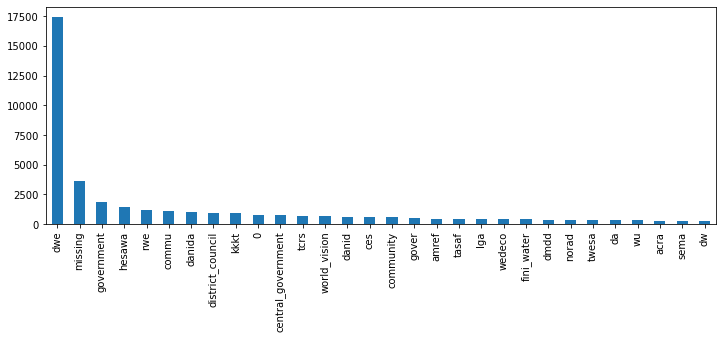

In [32]:
df_train.installer.value_counts()[:30].plot(kind='bar', figsize=(12, 4))

extraction_type_class,gravity,handpump,motorpump,other,rope pump,submersible,wind-powered
status_group,,,,,,,
functional,16048,10375,1135,1029,293,3329,50
functional needs repair,2701,995,138,206,17,253,7
non functional,8031,5086,1714,5195,141,2597,60


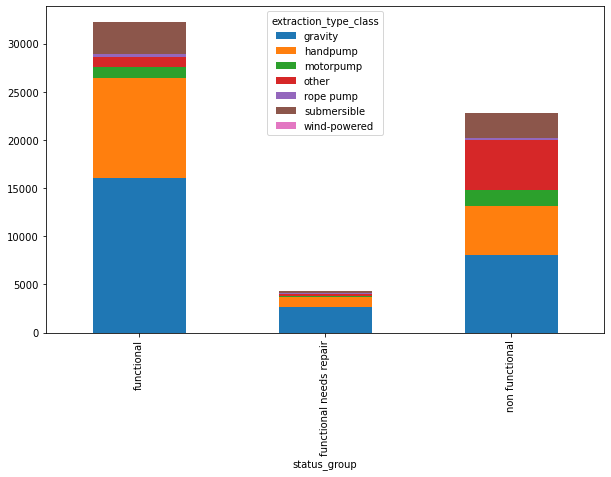

In [33]:
# df_extrct_status = df_train.groupby(['status_group', 'extraction_type_class', 'id']).count()
# df_extrct_status

df_grp_status = df_train.groupby(['status_group', 'extraction_type_class'])['status_group'].count().unstack('extraction_type_class')
df_grp_status.plot(kind='bar', stacked=True, figsize=(10, 6))
df_grp_status

### Functions for selecting dataframe subsets and graphing


#### Function displaying *table* of values and percent-of-total for status_group by feature (e.g., functional status by lga)

In [34]:
def status_by_feat(df, col1, col2='status_group'):

    df_subset = df.copy()
    df_subset.reset_index(inplace=True)

    # Create dataframe grouped by primary variable of interest, sorted by number of projects (greatest number to fewest)
    df_subset_grpd = df_subset.groupby(col1).count().sort_values(by='id', ascending=False).reset_index()

    # Convert sorted variable column to list
    sorted_list = df_subset_grpd[col1].tolist()

    # Convert column of primary variable of interest to categorical, to maintain sort order
    df_subset[col1] = pd.Categorical(df_subset[col1], sorted_list)

    # group dataframe by primary and secondary columns of interest
    df_subset_grpd = df_subset.groupby([col1, col2])[col1].count().unstack(col2)
    df_subset_grpd

    # create percentage values of targets for each grouping
    # Create the total score for each feature grouping
    totals = [i+j+k for i,j,k in zip(df_subset_grpd['functional'], 
                                     df_subset_grpd['functional needs repair'], 
                                     df_subset_grpd['non functional'])]

    # Create the percentage of the total for 'functional' for each feature datapoint/grouping
    funct = [i / j * 100 for  i,j in zip(df_subset_grpd['functional'], totals)]

    # Create the percentage of the total for 'functional needs repair' for each feature datapoint/grouping
    funct_needs_repair = [i / j * 100 for  i,j in zip(df_subset_grpd['functional needs repair'], totals)]

    # Create the percentage of the total for 'non functional' for each feature datapoint/grouping
    non_funct = [i / j * 100 for  i,j in zip(df_subset_grpd['non functional'], totals)]
    
    # Create column for totals
    df_subset_grpd['totals'] = totals    
    
    # Create columns for percentage values
    df_subset_grpd['funct_pct'] = np.round(np.array([funct]).T, 2)
    df_subset_grpd['funct_needs_repair_pct'] = np.round(np.array([funct_needs_repair]).T, 2)
    df_subset_grpd['non_funct_pct'] = np.round(np.array([non_funct]).T, 2)
    df_subset_grpd

    return df_subset_grpd

#### Function displaying *table* of values AND vertical stacked bar *chart*

In [35]:
colors = ['#019600', '#219AD8', '#3C5F5A']

# sorting by two columns; graphing stacked bar chart of top n items, starting at number m from top

def dataset_eda_subset(df, col1, col2='status_group', sort_by='id', figsize=(12, 6), m=0, n=20, 
                       legend = True, legend_loc = 'best', legend_cols=1, rotation=45, width=0.8,
                       colors=['#019600', '#219AD8', '#3C5F5A'], alpha=0.8, fontsize=14):
    
    df_subset = df.copy()
    
    # Create dataframe grouped by primary variable of interest, sorted by number of projects (greatest number to fewest)
    df_subset_grpd = df_subset.groupby(col1).count().sort_values(by=sort_by, ascending=False).reset_index()
    
    # Convert sorted variable column to list
    sorted_list = df_subset_grpd[col1].tolist()
    
    # Convert column of primary variable of interest to categorical, to maintain sort order
    df_subset[col1] = pd.Categorical(df_subset[col1], sorted_list)
    
    # group dataframe by primary and secondary columns of interest
    df_subset_grpd = df_subset.groupby([col1, col2])[col1].count().unstack(col2)
        
    # plot on stacked bar graph and show results
    # if/else statement for legend
    if legend:
        ax = df_subset_grpd[m:n].plot(kind='bar', stacked=True, figsize=figsize, color=colors, 
                                      alpha=alpha, fontsize=fontsize, width=width)
        ax.legend(loc=legend_loc, ncol=legend_cols, fontsize=12)   
        
    else:
        ax = df_subset_grpd[m:n].plot(kind='bar', stacked=True, figsize=figsize, color=colors, 
                                      alpha=alpha, fontsize=fontsize, legend=False, width=width)        
    # Plot labels
    ax.set_xlabel("{}: m = {} through n = {}".format(col1, m, n), fontsize=fontsize, labelpad=18)
    ax.set_ylabel("Number of wells", fontsize=fontsize, labelpad=18)
    plt.setp(plt.gca().get_xticklabels(), rotation=rotation, 
             horizontalalignment='right', fontsize=fontsize)
    ax.set_title(label='{} by {}'.format(col2, col1), fontsize=fontsize)
        
    return df_subset_grpd[m:n]
    

#### Function displaying *vertical* stacked bar chart of percentages

In [59]:
# Percent vertical stacked bar graph created adapting code from 
# https://chrisalbon.com/python/data_visualization/matplotlib_percentage_stacked_bar_plot/

colors = ['#019600', '#219AD8', '#3C5F5A']

# sorting by two columns; percent stacked bar chart of top n items, starting from number m from top
def dataset_eda_subset_pct(df, col1, col2='status_group', sort_by='id', figsize=(15, 6), rotation=45,
                           m=0, n=20, legend = True, legend_loc = 'best', legend_cols=3, 
                           colors = ['#019600', '#219AD8', '#3C5F5A'], fontsize=14, bar_width=0.8):

    df_subset = df.copy()
    
    # Create dataframe grouped by primary variable of interest, sorted by number of projects (greatest number to fewest)
    df_subset_grpd = df_subset.groupby(col1).count().sort_values(by=sort_by, ascending=False).reset_index()
    
    # Convert sorted variable column to list
    sorted_list = df_subset_grpd[col1].tolist()
    
    # Convert column of primary variable of interest to categorical, to maintain sort order
    df_subset[col1] = pd.Categorical(df_subset[col1], sorted_list)
    
    # group dataframe by primary and secondary columns of interest
    df_subset_grpd = df_subset.groupby([col1, col2])[col1].count().unstack(col2)
    
    # replace NaN values with 0
    df_subset_grpd.fillna(value=0, inplace=True)    

    # create percentage values of targets for each grouping
    # Create the total score for each feature grouping
    totals = [i+j+k for i,j,k in zip(df_subset_grpd['functional'][m:n], 
                                     df_subset_grpd['functional needs repair'][m:n], 
                                     df_subset_grpd['non functional'][m:n])]

    # Create the percentage of the total for 'functional' for each feature datapoint/grouping
    funct = [i / j * 100 for  i,j in zip(df_subset_grpd['functional'][m:n], totals)]

    # Create the percentage of the total for 'functional needs repair' for each feature datapoint/grouping
    funct_needs_repair = [i / j * 100 for  i,j in zip(df_subset_grpd['functional needs repair'][m:n], totals)]

    # Create the percentage of the total for 'non functional' for each feature datapoint/grouping
    non_funct = [i / j * 100 for  i,j in zip(df_subset_grpd['non functional'][m:n], totals)]
    
    # Create a figure with a single subplot
    f, ax = plt.subplots(1, figsize=figsize)

    # Set bar width at 1
    bar_width = bar_width
    
#     # positions of the left bar boundaries
#     bar_l = [i+(bar_width/2) for i in range(len(df_subset_grpd['functional'][m:n]))] 
    
    # positions of the left bar boundaries
    bar_l = [i+(bar_width/2) for i in range(n)] 

    # positions of the x-axis ticks (center of the bars as bar labels)
    tick_pos = [i for i in bar_l] 
    
    # Create a bar chart in position bar_1
    ax.bar(bar_l, 
           # using 'functional' data
           funct, 
           # labeled 
           label='Functional', 
           # with alpha
           alpha=0.9, 
           # with color
           color=colors[0],
           # with bar width
           width=bar_width,
           # with border color
           edgecolor='white'
           )

    # Create a bar chart in position bar_1
    ax.bar(bar_l, 
           # using 'functional needs repair' data
           funct_needs_repair, 
           # with pre_rel
           bottom=funct, 
           # labeled 
           label='Functional--Needs Repair', 
           # with alpha
           alpha=0.9, 
           # with color
           color=colors[1], 
           # with bar width
           width=bar_width,
           # with border color
           edgecolor='white'
           )

    # Create a bar chart in position bar_1
    ax.bar(bar_l, 
           # using 'non functional' data
           non_funct, 
           # with pre_rel and mid_rel on bottom
           bottom=[i+j for i,j in zip(funct, funct_needs_repair)], 
           # labeled 
           label='Non-Functional',
           # with alpha
           alpha=0.8, 
           # with color
           color=colors[2], 
           # with bar width
           width=bar_width,
           # with border color
           edgecolor='white'
           )

    # Set the ticks to be col1
    plt.xticks(tick_pos, df_subset_grpd.index[m:n])
    ax.set_xlabel("{}: m = {} through n = {}".format(col1, m, n), labelpad=18, fontsize=fontsize)
    plt.setp(plt.gca().get_yticklabels(), fontsize=fontsize)
    ax.set_ylabel("Percentage", fontsize=fontsize)

    # Set the borders of the graphic
    plt.xlim([min(tick_pos) - (bar_width + .2), max(tick_pos) + (bar_width + .2)])
    plt.ylim(-10, 115)

    # rotate axis labels
    plt.setp(plt.gca().get_xticklabels(), rotation=rotation, 
             horizontalalignment='right', fontsize=fontsize)
    
    # set title
    # plt.title('{} by {}'.format(col2, col1), fontsize=fontsize)
    ax.set_title(label='{} by {}'.format(col2, col1), fontsize=fontsize)
    
    if legend:
        ax.legend(loc='upper center', bbox_to_anchor=(0.5, 1.0), fontsize=12, ncol=legend_cols)

    return df_subset_grpd[m:n]
    

#### Function displaying *horizontal* stacked bar chart of percentages

In [64]:
# HORIZONTAL

# Percent horizontal stacked bar graph created adapting code from 
# https://chrisalbon.com/python/data_visualization/matplotlib_percentage_stacked_bar_plot/

colors = ['#019600', '#219AD8', '#3C5F5A']

# sorting by two columns; percent stacked bar chart of top n items, starting from number m from top
def dataset_eda_subset_pct_h(df, col1, col2='status_group', sort_by='id', figsize=(12, 30), 
                             m=0, n=20, legend = True, legend_loc = 'best', legend_cols=1, 
                             colors = ['#019600', '#219AD8', '#3C5F5A'], fontsize=14, bar_height=0.8):

    df_subset = df.copy()
    
    # Create dataframe grouped by primary variable of interest, sorted by number of projects (greatest number to fewest)
    df_subset_grpd = df_subset.groupby(col1).count().sort_values(by=sort_by, ascending=False).reset_index()
    
    # Convert sorted variable column to list
    sorted_list = df_subset_grpd[col1].tolist()
    
    # Convert column of primary variable of interest to categorical, to maintain sort order
    df_subset[col1] = pd.Categorical(df_subset[col1], sorted_list)
    
    # group dataframe by primary and secondary columns of interest
    df_subset_grpd = df_subset.groupby([col1, col2])[col1].count().unstack(col2)
    
    # replace NaN values with 0
    df_subset_grpd.fillna(value=0, inplace=True)    

    # create percentage values of targets for each grouping
    # Create the total score for each feature grouping
    totals = [i+j+k for i,j,k in zip(df_subset_grpd['functional'][m:n], 
                                     df_subset_grpd['functional needs repair'][m:n], 
                                     df_subset_grpd['non functional'][m:n])]

    # Create the percentage of the total for 'functional' for each feature datapoint/grouping
    funct = [i / j * 100 for  i,j in zip(df_subset_grpd['functional'][m:n], totals)]

    # Create the percentage of the total for 'functional needs repair' for each feature datapoint/grouping
    funct_needs_repair = [i / j * 100 for  i,j in zip(df_subset_grpd['functional needs repair'][m:n], totals)]

    # Create the percentage of the total for 'non functional' for each feature datapoint/grouping
    non_funct = [i / j * 100 for  i,j in zip(df_subset_grpd['non functional'][m:n], totals)]
    
    # Create a figure with a single subplot
    f, ax = plt.subplots(1, figsize=figsize)

    # Set bar height at 0.8
    bar_height = bar_height
    
    # positions of the top bar-boundaries
    bar_l = [i for i in range(len(df_subset_grpd['functional'][m:n]))] 

    # positions of the y-axis ticks (center of the bars as bar labels)
    tick_pos = [i for i in bar_l] 
    
    # Create a bar chart in position bar_1
    ax.barh(bar_l, 
           # using 'functional' data
           funct, 
           # labeled 
           label='Functional', 
           # with alpha
           alpha=0.9, 
           # with color
           color=colors[0],
           # with bar width
           height=bar_height,
           # with border color
           edgecolor='white'
           )

    # Create a bar chart in position bar_1
    ax.barh(bar_l, 
           # using 'functional needs repair' data
           funct_needs_repair, 
           # with pre_rel
           left=funct, 
           # labeled 
           label='Functional--Needs Repair', 
           # with alpha
           alpha=0.9, 
           # with color
           color=colors[1], 
           # with bar width
           height=bar_height,
           # with border color
           edgecolor='white'
           )

    # Create a bar chart in position bar_1
    ax.barh(bar_l, 
           # using 'non functional' data
           non_funct, 
           # with pre_rel and mid_rel on bottom
           left=[i+j for i,j in zip(funct, funct_needs_repair)], 
           # labeled 
           label='Non-Functional',
           # with alpha
           alpha=0.8, 
           # with color
           color=colors[2], 
           # with bar width
           height=bar_height,
           # with border color
           edgecolor='white'
           )

    # Set the borders of the graphic
    plt.ylim([min(tick_pos) - (bar_height + .01), max(tick_pos) + (bar_height + .03)])
    plt.xlim(-10, 110)

    # Set ticks and labels
    plt.yticks(tick_pos, df_subset_grpd.index[m:n])
    plt.setp(plt.gca().get_yticklabels(), horizontalalignment='right', fontsize=fontsize)
    ax.set_xlabel("Percentage", fontsize=fontsize)
    ax.set_ylabel("{}: m = {} through n = {}".format(col1, m, n), labelpad=18, fontsize=fontsize)
    
    # rotate axis labels
    plt.setp(plt.gca().get_xticklabels(), horizontalalignment='right',  fontsize=fontsize)
    
    # set title
    plt.title('{} by {}'.format(col2, col1), fontsize=fontsize)
    ax.legend(loc='upper left', bbox_to_anchor=(-0.5, 1.0), ncol=legend_cols)
    
    return df_subset_grpd[m:n]
    

### Visualizations of status by number of projects by category/variable

#### Funders

status_group,functional,functional needs repair,non functional
funder,,,
government_of_tanzania,3720,701,4663
missing,1981,437,1217
danida,1713,159,1242
hesawa,936,232,1034
rwssp,805,109,460
world_bank,545,97,707
kkkt,723,66,498
world_vision,743,131,372
unicef,600,99,358


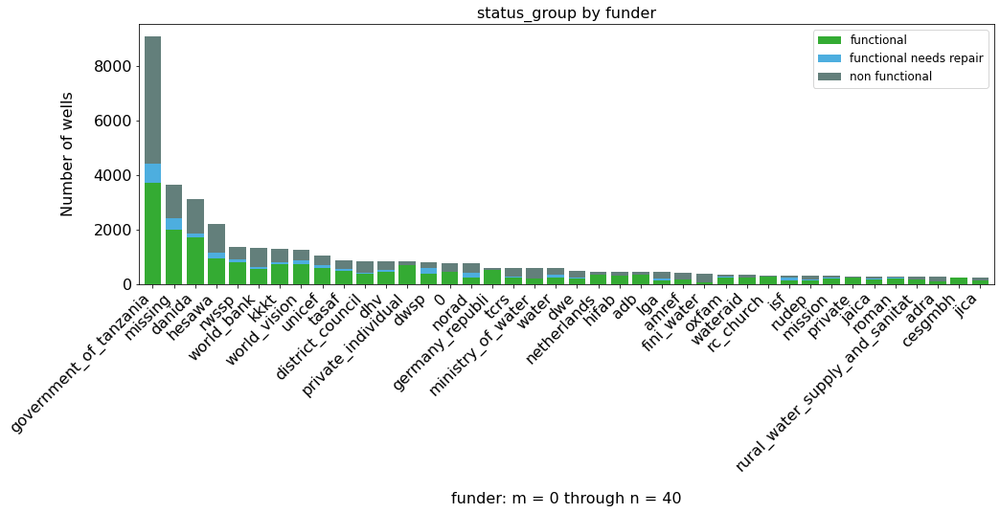

In [61]:
top_n_funders = dataset_eda_subset(df_train, col1='funder', col2='status_group', 
                                   rotation = 45, m=0, n=40, figsize=(16,5), fontsize=16)
top_n_funders.head(10)

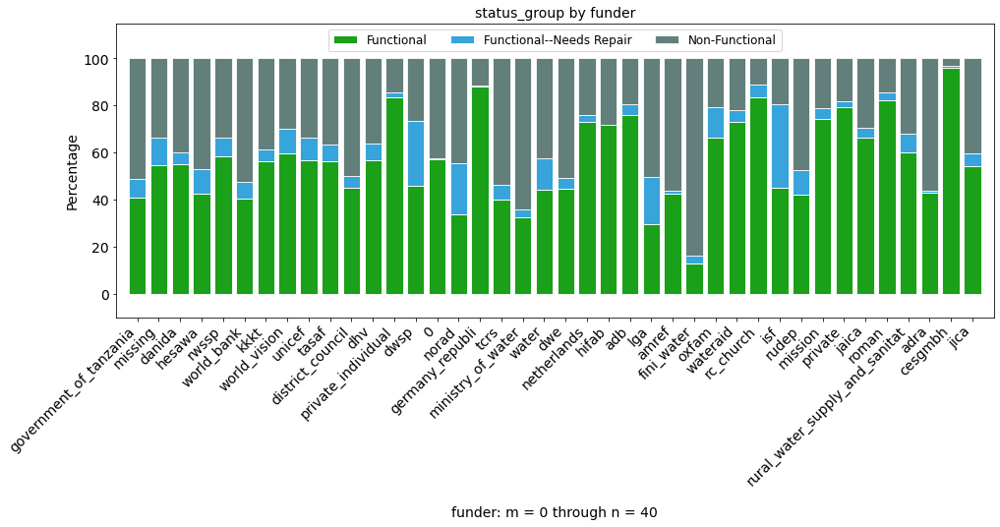

In [62]:
top_n_funders_pct = dataset_eda_subset_pct(df_train, col1='funder', col2='status_group', 
                                           m=0, n=40, figsize=(16, 5.5), legend_cols=3)

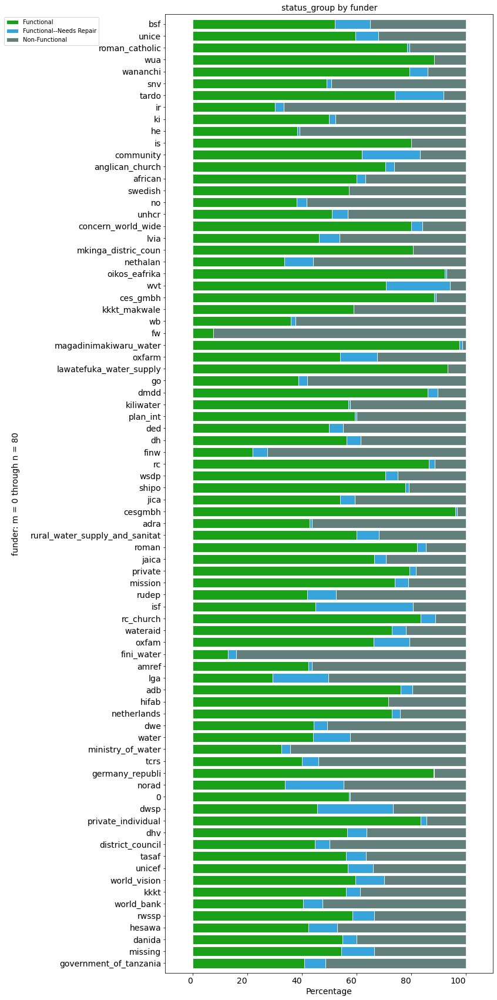

In [65]:
top_n_funders_pct_h = dataset_eda_subset_pct_h(df_train, col1='funder', col2='status_group', 
                                               m=0, n=80, figsize=(10, 30))

In [66]:
df = df_train
df.head(3)

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
0,69572,6000.0,2011-03-14,roman,1390,roman,34.938093,-9.856322,none,0,Lake Nyasa,mnyusi_b,Iringa,11,5,Ludewa,Mundindi,109,True,GeoData Consultants Ltd,vwc,roman,False,1999,gravity,gravity,gravity,vwc,usergroup,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
1,8776,0.0,2013-03-06,grumeti,1399,grumeti,34.698766,-2.147466,zahanati,0,Lake Victoria,nyamara,Mara,20,2,Serengeti,Natta,280,NaN,GeoData Consultants Ltd,other,missing,True,2010,gravity,gravity,gravity,wug,usergroup,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
2,34310,25.0,2013-02-25,lottery_club,686,world_vision,37.460664,-3.821329,kwa_mahundi,0,Pangani,majengo,Manyara,21,4,Simanjiro,Ngorika,250,True,GeoData Consultants Ltd,vwc,nyumba_ya_mungu_pipe_scheme,True,2009,gravity,gravity,gravity,vwc,usergroup,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional


In [67]:
# can change column widths if desired using this code:
# status_by_funder.style.set_table_styles([dict(selector="th",props=[('max-width', '300px')])])

In [68]:
status_by_funder = status_by_feat(df, col1='funder', col2='status_group')
status_by_funder.head(50)
status_by_funder.sort_values(by='non functional', ascending=False).head(20)

status_group,functional,functional needs repair,non functional,totals,funct_pct,funct_needs_repair_pct,non_funct_pct
funder,,,,,,,
government_of_tanzania,3720,701,4663,9084,40.95,7.72,51.33
danida,1713,159,1242,3114,55.01,5.11,39.88
missing,1981,437,1217,3635,54.50,12.02,33.48
hesawa,936,232,1034,2202,42.51,10.54,46.96
world_bank,545,97,707,1349,40.40,7.19,52.41
kkkt,723,66,498,1287,56.18,5.13,38.69
rwssp,805,109,460,1374,58.59,7.93,33.48
district_council,378,45,420,843,44.84,5.34,49.82
ministry_of_water,192,19,379,590,32.54,3.22,64.24


In [69]:
# displaying top project funders by # of project (default) or by column of choice
status_by_funder = status_by_feat(df, col1='funder', col2='status_group')
funder_top_60 = status_by_funder.head(60)
funder_top_60
funder_top_60.sort_values(by='funct_pct', ascending=False).head(20)  # showing top 20 by best funct_pct

# notice funders from many other countries on the list; at least two German organizations are 
# near the top: cesgmbh, ces_gmbh (these two are the same org), germany_republi)

status_group,functional,functional needs repair,non functional,totals,funct_pct,funct_needs_repair_pct,non_funct_pct
funder,,,,,,,
magadinimakiwaru_water,171,2,2,175,97.71,1.14,1.14
cesgmbh,250,2,8,260,96.15,0.77,3.08
lawatefuka_water_supply,168,0,12,180,93.33,0.00,6.67
oikos_eafrika,143,1,11,155,92.26,0.65,7.10
ces_gmbh,146,1,18,165,88.48,0.61,10.91
germany_republi,538,1,71,610,88.20,0.16,11.64
rc,199,5,26,230,86.52,2.17,11.30
dmdd,160,7,19,186,86.02,3.76,10.22
private_individual,690,18,118,826,83.54,2.18,14.29


In [70]:
# From https://stackoverflow.com/questions/45043968/pandas-display-truncate-column-display-rather-than-wrapping/45078833#45078833

with pd.option_context('display.max_colwidth', 18, 'expand_frame_repr', False):
    mw = pd.get_option('display.max_colwidth')
    display(status_by_funder.rename(columns=lambda x: x[:mw-3] + '...' if len(x) > mw else x).head(100))


status_group,functional,functional need...,non functional,totals,funct_pct,funct_needs_rep...,non_funct_pct
funder,,,,,,,
government_of_tanzania,3720,701,4663,9084,40.95,7.72,51.33
missing,1981,437,1217,3635,54.50,12.02,33.48
danida,1713,159,1242,3114,55.01,5.11,39.88
hesawa,936,232,1034,2202,42.51,10.54,46.96
rwssp,805,109,460,1374,58.59,7.93,33.48
world_bank,545,97,707,1349,40.40,7.19,52.41
kkkt,723,66,498,1287,56.18,5.13,38.69
world_vision,743,131,372,1246,59.63,10.51,29.86
unicef,600,99,358,1057,56.76,9.37,33.87


#### Installers

status_group,functional,functional needs repair,non functional
installer,,,
dwe,9450,1622,6354
missing,2000,440,1215
government,552,258,1081
hesawa,786,54,555
rwe,304,137,765
commu,726,32,307
danida,542,83,425
district_council,385,61,515
kkkt,425,62,423


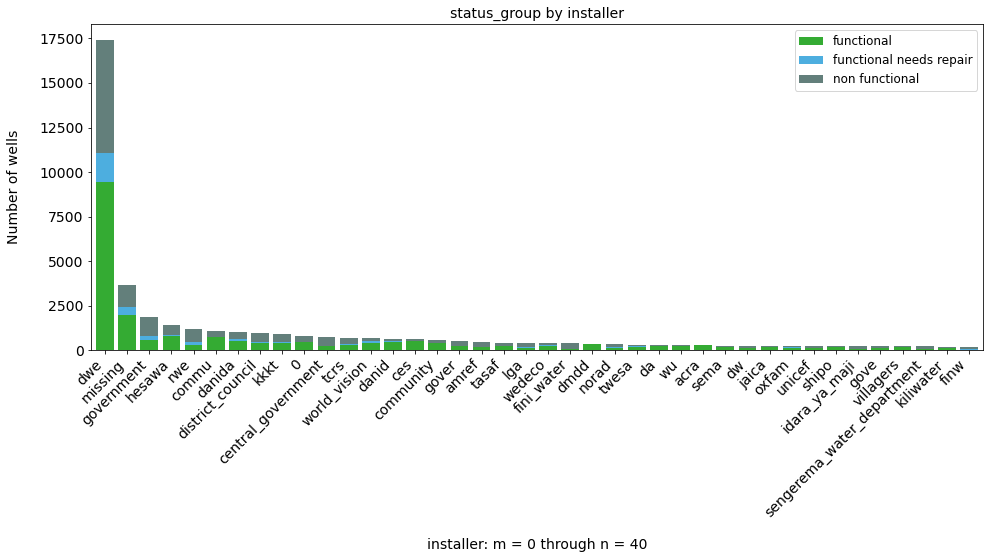

In [71]:
top_n_installers = dataset_eda_subset(df_train, col1='installer', figsize=(16,6),
                                      col2='status_group', m=0, n=40)
top_n_installers.head(10)

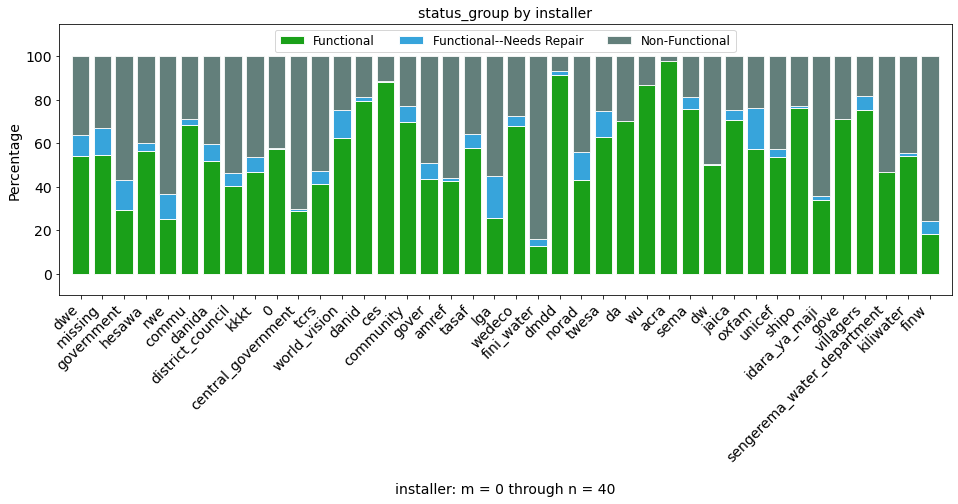

In [72]:
top_n_installers_pct = dataset_eda_subset_pct(df_train, col1='installer', col2='status_group', 
                                           figsize=(16, 5), m=0, n=40, fontsize=14)

In [73]:
status_by_instlr = status_by_feat(df, col1='installer', col2='status_group')
top_60_instlr = status_by_instlr.head(60)
top_60_instlr.head(30)
# top_60_instlr.sort_values(by='funct_pct', ascending=False)

status_group,functional,functional needs repair,non functional,totals,funct_pct,funct_needs_repair_pct,non_funct_pct
installer,,,,,,,
dwe,9450,1622,6354,17426,54.23,9.31,36.46
missing,2000,440,1215,3655,54.72,12.04,33.24
government,552,258,1081,1891,29.19,13.64,57.17
hesawa,786,54,555,1395,56.34,3.87,39.78
rwe,304,137,765,1206,25.21,11.36,63.43
commu,726,32,307,1065,68.17,3.00,28.83
danida,542,83,425,1050,51.62,7.90,40.48
district_council,385,61,515,961,40.06,6.35,53.59
kkkt,425,62,423,910,46.70,6.81,46.48


#### Installer by lga

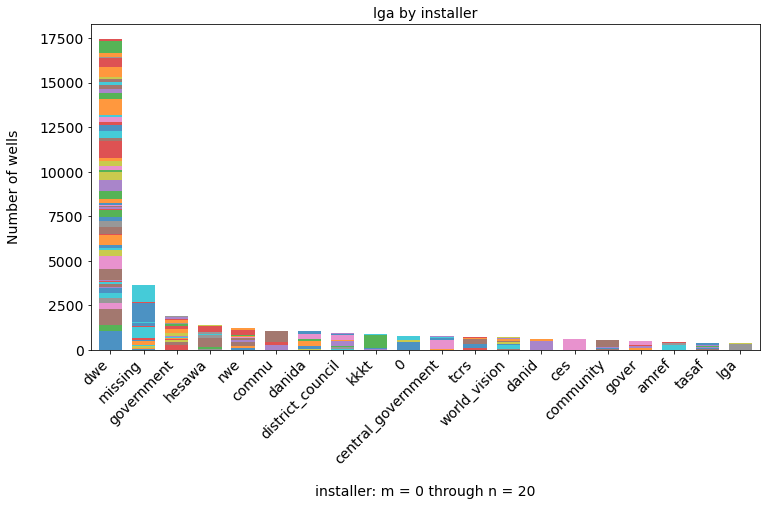

In [74]:
geog_loc_installer = dataset_eda_subset(df_train, col1='installer', col2='lga', m=0, n=20, 
                                        rotation=45, legend=False, colors=None, width=0.7)


#### Payment type

status_group,functional,functional needs repair,non functional
payment_type,,,
never pay,11379,1907,12062
per bucket,6090,409,2486
monthly,5482,927,1891
unknown,3528,432,4197
on failure,2429,277,1208
annually,2740,247,655
other,611,118,325


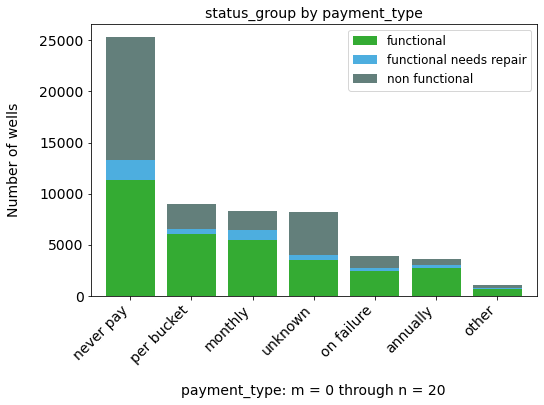

In [75]:
status_by_payment_type = dataset_eda_subset(df_train, col1='payment_type', figsize=(8,5),
                                            col2='status_group', n=20, rotation=45, fontsize=14)
status_by_payment_type

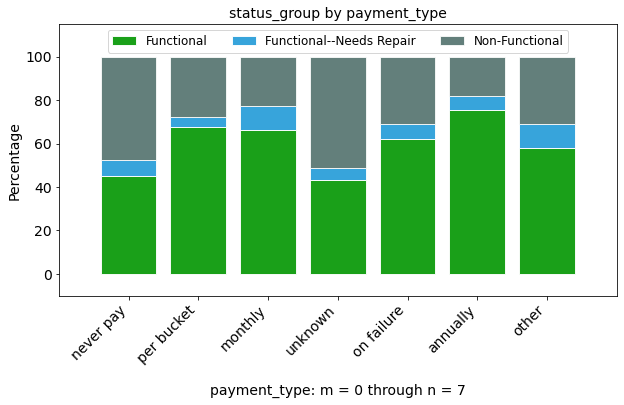

In [76]:
payment_type_pct = dataset_eda_subset_pct(df_train, col1='payment_type', col2='status_group', 
                                           figsize=(10, 5), m=0, n=7)

#### Payment

status_group,functional,functional needs repair,non functional
payment,,,
never pay,11379,1907,12062
pay per bucket,6090,409,2486
pay monthly,5482,927,1891
unknown,3528,432,4197
pay when scheme fails,2429,277,1208
pay annually,2740,247,655
other,611,118,325


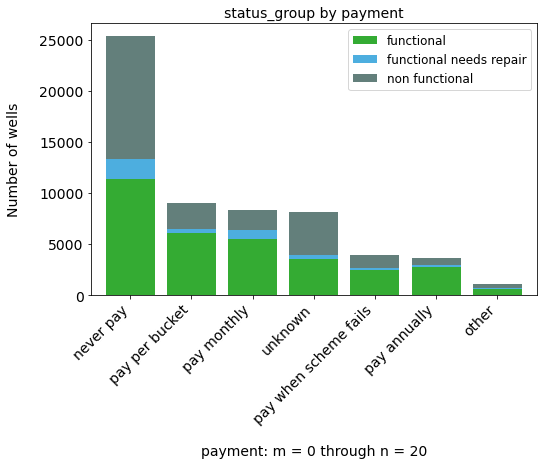

In [77]:
status_by_payment = dataset_eda_subset(df_train, col1='payment', figsize=(8,5), 
                                       col2='status_group', rotation=45, n=20, fontsize=14)
status_by_payment

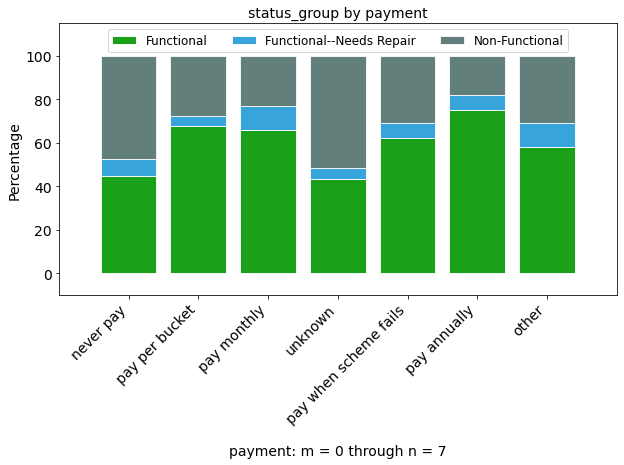

In [78]:
payment_pct = dataset_eda_subset_pct(df_train, col1='payment', col2='status_group', 
                                           figsize=(10, 5), m=0, n=7, fontsize=14)

#### Amount_tsh

status_group,functional,functional needs repair,non functional
amount_tsh,,,
0.0,19706,3048,18885
500.0,2226,274,602
50.0,1634,107,731
1000.0,1121,86,281
20.0,970,76,417
200.0,789,120,311
100.0,557,60,199
10.0,623,16,167
30.0,528,35,180


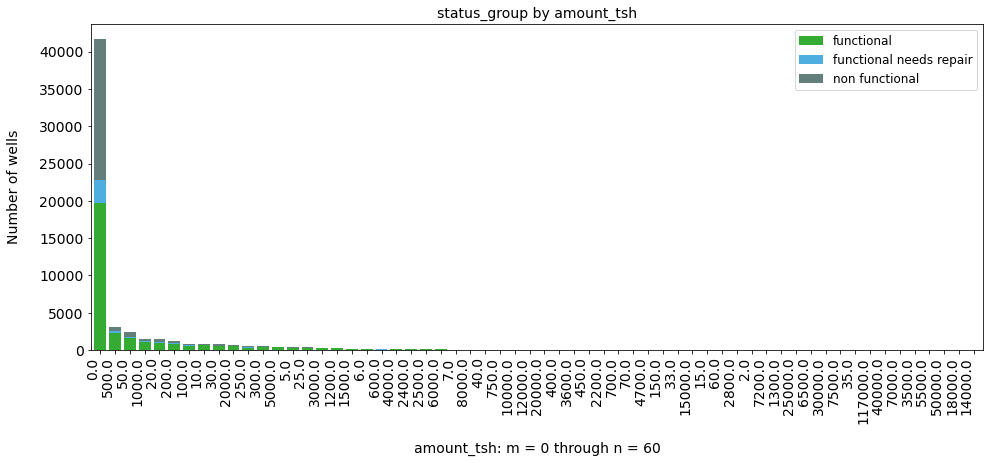

In [79]:
status_by_amount_tsh = dataset_eda_subset(df_train, col1='amount_tsh', col2='status_group', 
                                          figsize=(16, 6), m=0, n=60, rotation=90)
status_by_amount_tsh.head(10)

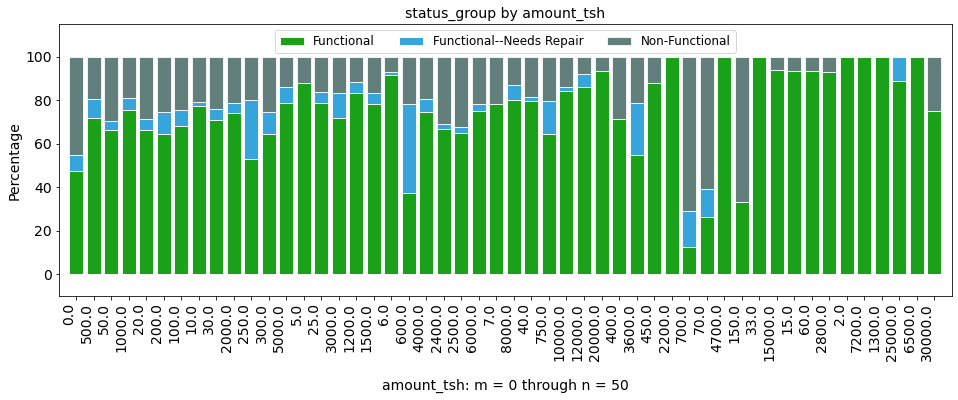

In [80]:
amt_tsh_pct = dataset_eda_subset_pct(df_train, col1='amount_tsh', col2='status_group', 
                                     figsize=(16, 5), m=0, n=50, rotation=90)

#### GPS (height)

status_group,functional,functional needs repair,non functional
gps_height,,,
0,10469,1763,8206
-15,31,1,28
-13,23,1,31
-16,25,4,26
1290,27,4,21
-20,34,1,17
303,29,4,18
-14,28,0,23
-18,24,1,24


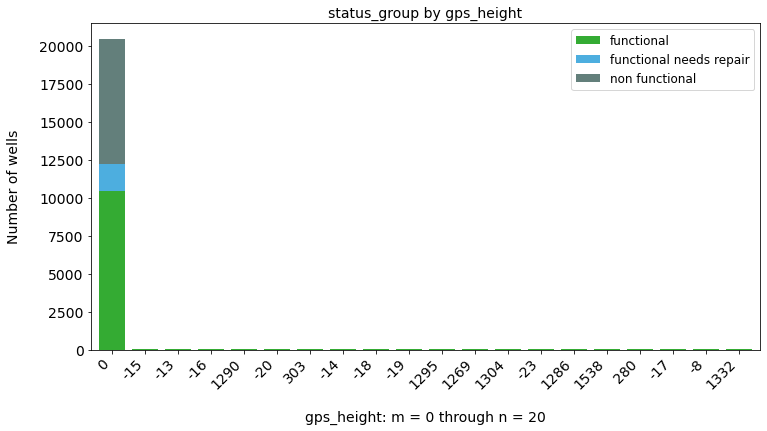

In [81]:
status_by_gps_height = dataset_eda_subset(df_train, col1='gps_height', col2='status_group', n=20)
status_by_gps_height

#### Basin

status_group,functional,functional needs repair,non functional
basin,,,
Lake Victoria,5100,989,4159
Pangani,5372,477,3091
Rufiji,5068,437,2471
Internal,4482,557,2746
Lake Tanganyika,3107,742,2583
Wami / Ruvu,3136,269,2582
Lake Nyasa,3324,250,1511
Ruvuma / Southern Coast,1670,326,2497
Lake Rukwa,1000,270,1184


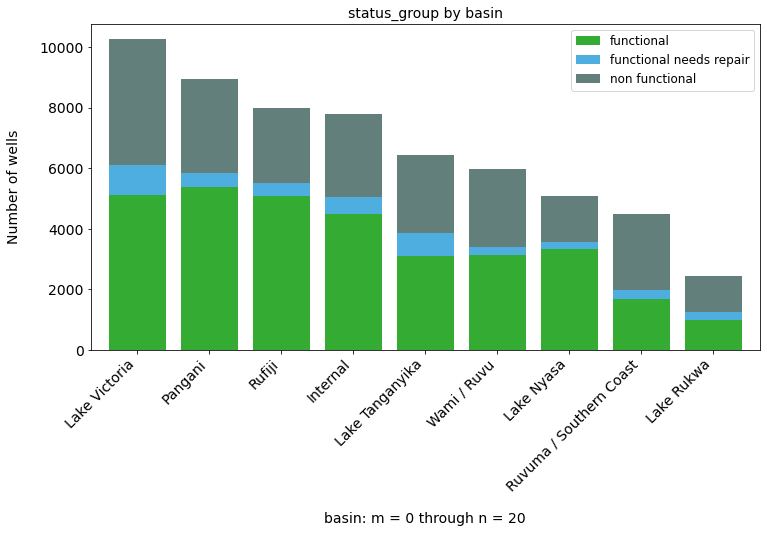

In [82]:
status_by_basin = dataset_eda_subset(df_train, col1='basin', col2='status_group', n=20)
status_by_basin

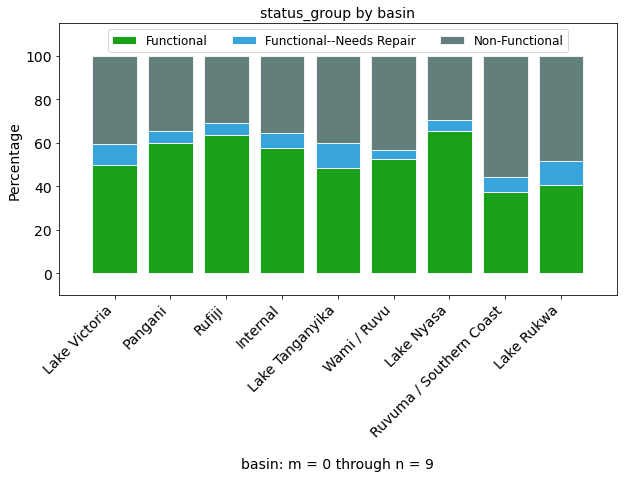

In [83]:
basin_pct = dataset_eda_subset_pct(df_train, col1='basin', col2='status_group', 
                                           figsize=(10, 5), m=0, n=9)

#### Region

status_group,functional,functional needs repair,non functional
region,,,
Iringa,4141,123,1030
Shinyanga,2789,635,1558
Mbeya,2319,504,1816
Kilimanjaro,2640,322,1417
Morogoro,2119,300,1587
Arusha,2294,175,881
Kagera,1727,304,1285
Mwanza,1502,183,1417
Kigoma,1363,603,850


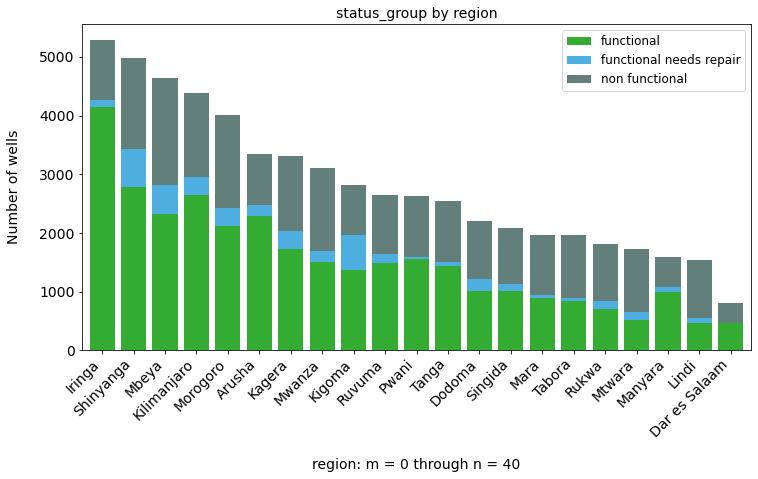

In [84]:
status_by_region = dataset_eda_subset(df_train, col1='region', col2='status_group', n=40)
status_by_region

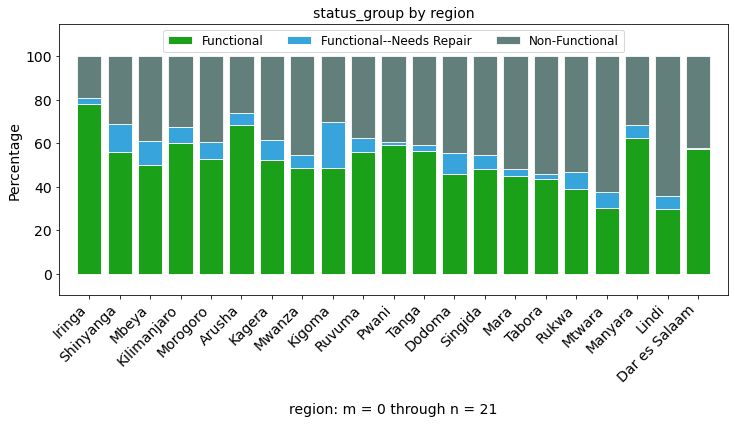

In [85]:
region_pct = dataset_eda_subset_pct(df_train, col1='region', col2='status_group', 
                                           figsize=(12, 5), m=0, n=21)

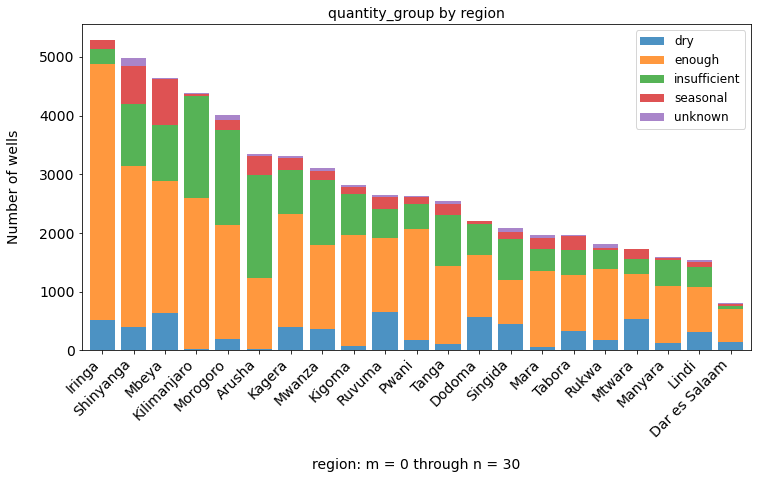

In [86]:
qty_region = dataset_eda_subset(df_train, col1='region', col2='quantity_group', m=0, n=30, 
                                legend=True, colors=None)


#### Region code

status_group,functional,functional needs repair,non functional
region_code,,,
11,4143,123,1034
17,2807,638,1566
12,2319,504,1816
3,2640,322,1417
5,2147,300,1593
18,1729,304,1291
19,1468,178,1401
2,1978,174,872
16,1363,603,850


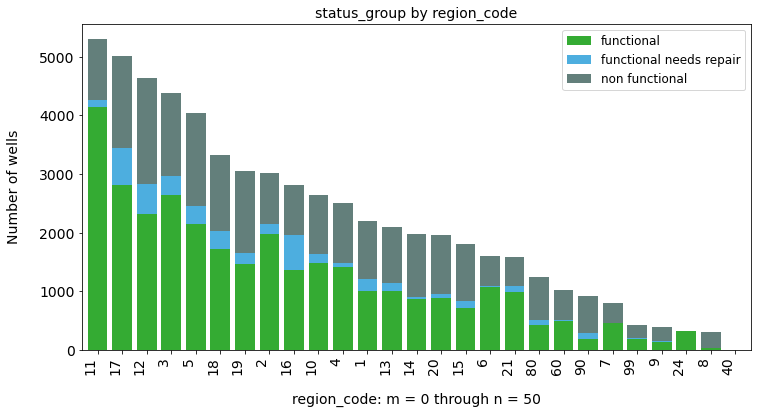

In [87]:
status_by_region_code = dataset_eda_subset(df_train, col1='region_code', 
                                           col2='status_group', n=50, rotation=90)
status_by_region_code

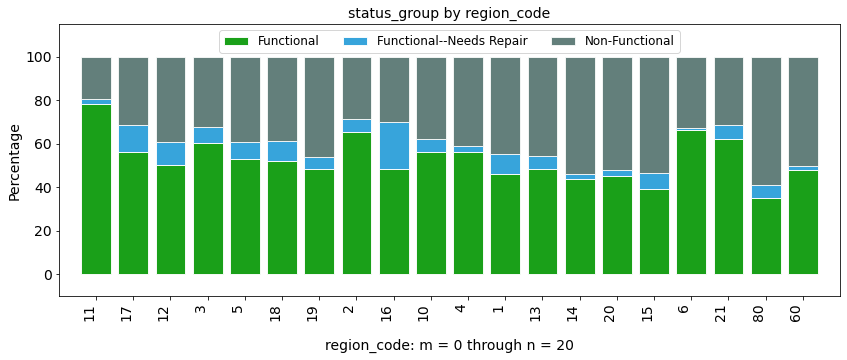

In [101]:
region_code_pct = dataset_eda_subset_pct(df_train, col1='region_code', col2='status_group', 
                                           figsize=(14, 5), rotation=90)

#### District Code

status_group,functional,functional needs repair,non functional
district_code,,,
1,6558,1287,4358
2,6203,844,4126
3,4954,699,4345
4,5595,509,2895
5,2479,194,1683
6,2055,232,1787
7,2014,214,1115
8,589,53,401
30,689,86,220


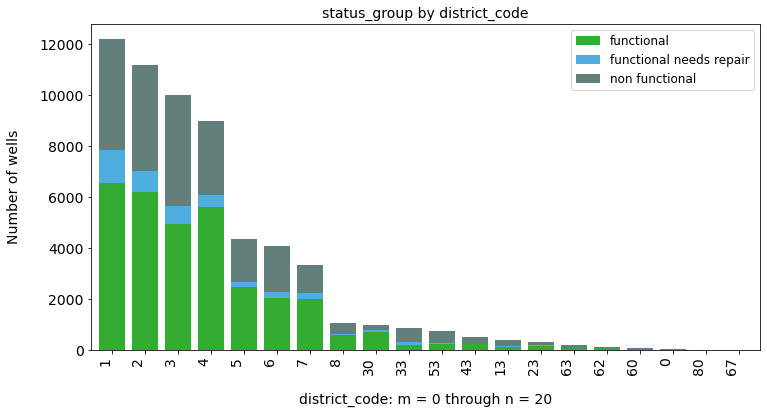

In [102]:
status_by_district_code = dataset_eda_subset(df_train, col1='district_code', 
                                             rotation=90, col2='status_group', n=20)
status_by_district_code

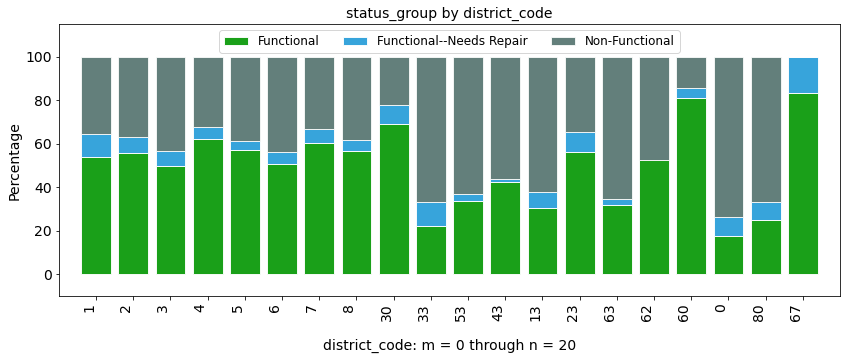

In [103]:
district_code_pct = dataset_eda_subset_pct(df_train, col1='district_code', col2='status_group', 
                                           figsize=(14, 5), m=0, n=20, rotation=90)

#### LGA

status_group,functional,functional needs repair,non functional
lga,,,
Njombe,2007,94,402
Arusha Rural,875,48,329
Moshi Rural,733,119,399
Bariadi,580,409,188
Rungwe,676,161,269
Kilosa,587,73,434
Kasulu,611,201,235
Mbozi,450,70,514
Meru,657,32,320


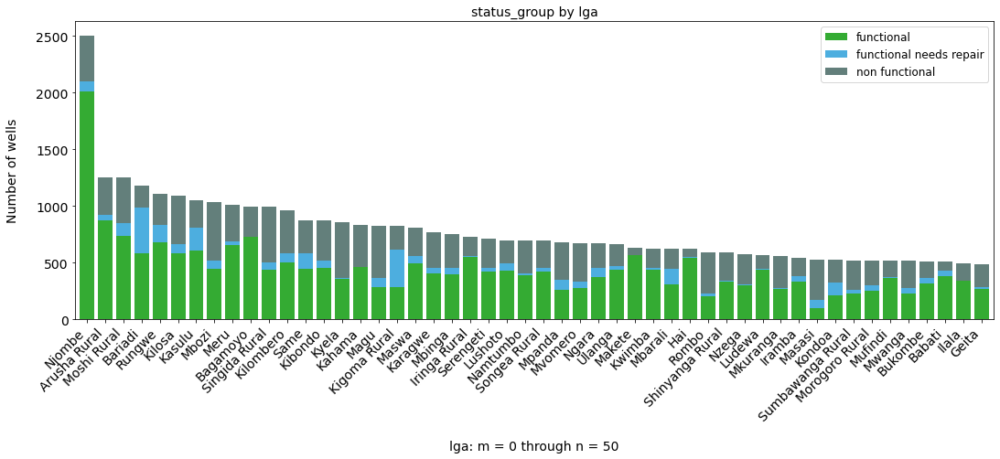

In [104]:
status_by_lga = dataset_eda_subset(df_train, col1='lga', col2='status_group', 
                                   figsize=(18, 6), m=0, n=50)
status_by_lga.head(10)

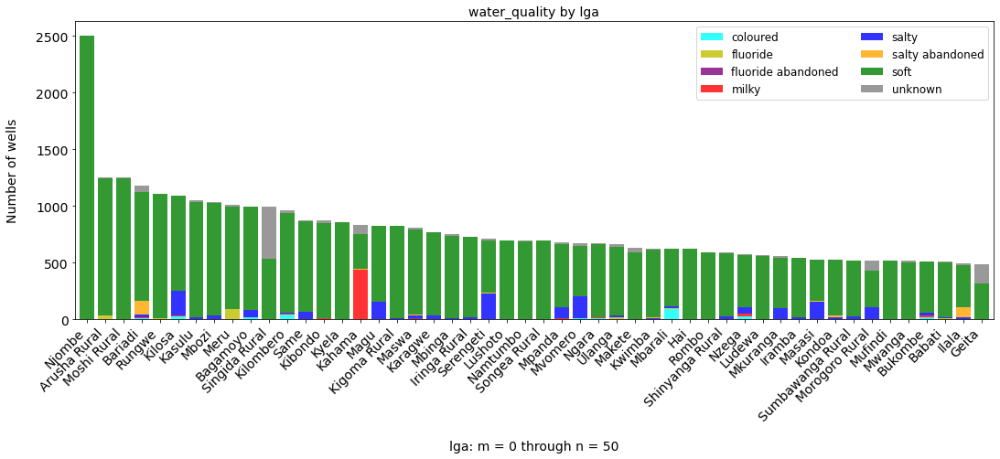

In [105]:
quality_lga = dataset_eda_subset(df_train, col1='lga', col2='water_quality', m=0, n=50, 
                                 figsize=(18, 6), legend=True, legend_cols=2,
                                 colors = ['cyan','y', 'purple', 'r', 'b', 'orange', 'g', 'gray'])


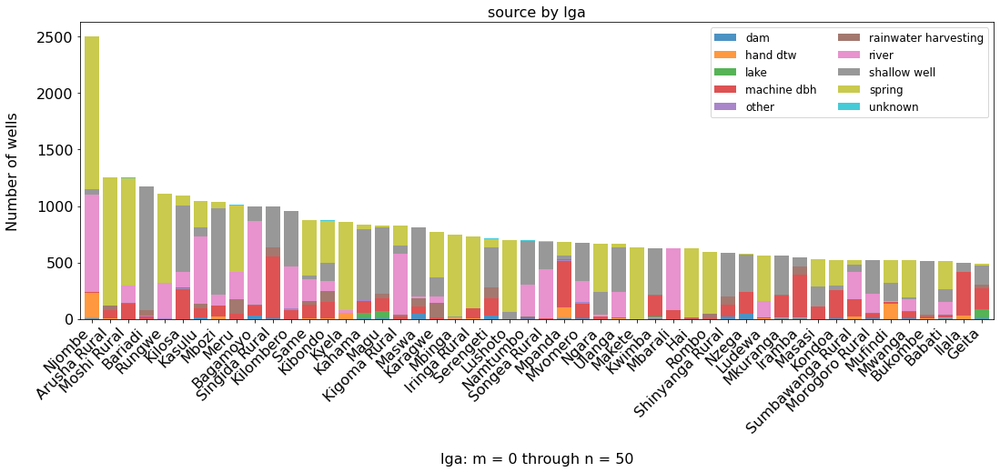

In [106]:
source_lga = dataset_eda_subset(df_train, col1='lga', col2='source', m=0, n=50, figsize=(18, 6),
                                legend=True, colors=None, legend_cols=2, fontsize=16)


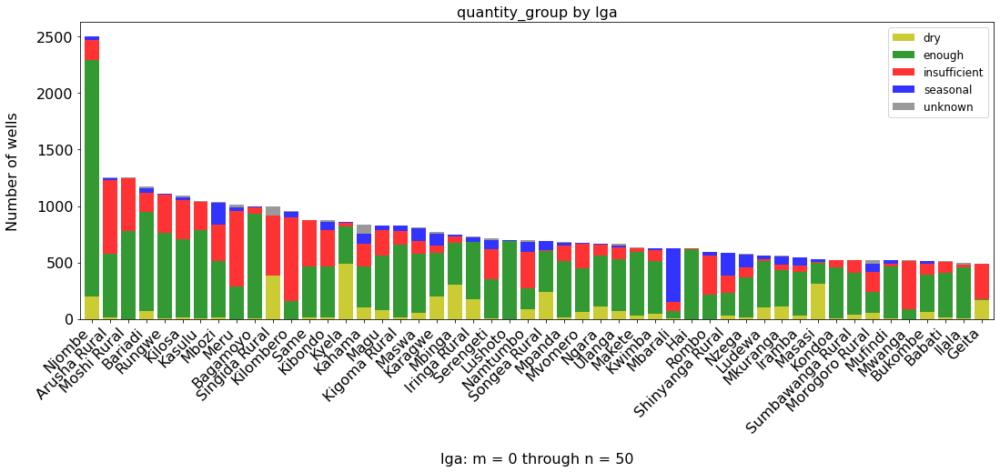

In [107]:
qty_lga = dataset_eda_subset(df_train, col1='lga', col2='quantity_group', m=0, n=50, figsize=(18, 6),
                                legend=True, colors = ['y', 'g', 'r', 'b', 'gray'], fontsize=16)


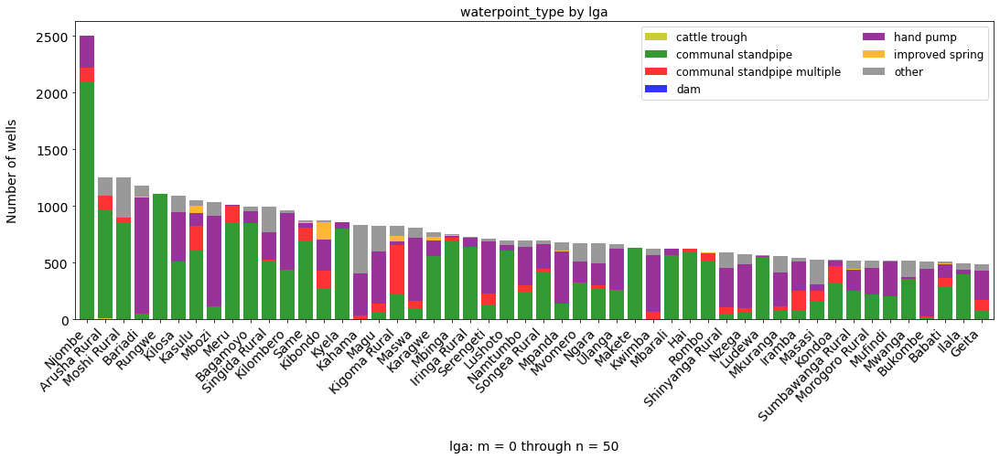

In [108]:
wpt_type_lga = dataset_eda_subset(df_train, col1='lga', col2='waterpoint_type', m=0, n=50, 
                                  figsize=(18, 6), legend=True, legend_cols=2,
                                  colors = ['y', 'g', 'r', 'b', 'purple', 'orange', 'gray'])


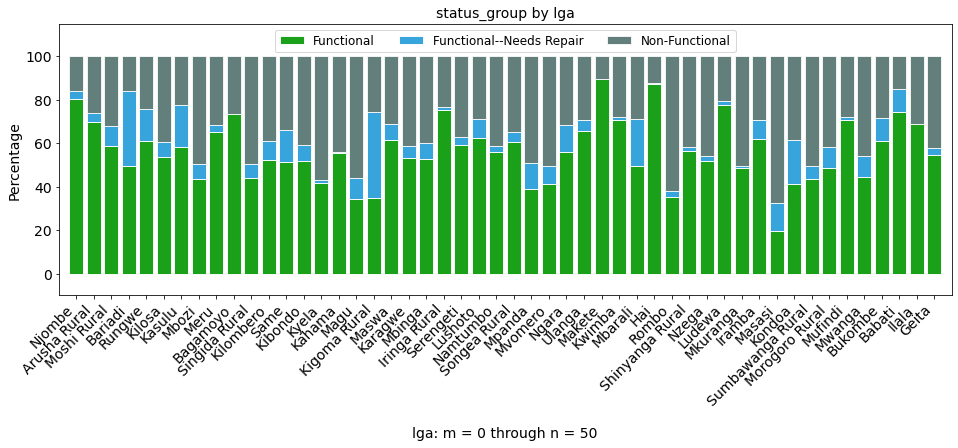

In [109]:
status_lga_pct = dataset_eda_subset_pct(df_train, col1='lga', col2='status_group', figsize=(16, 5), m=0, n=50)

#### Ward

status_group,functional,functional needs repair,non functional
ward,,,
Igosi,289,0,18
Imalinyi,240,3,9
Siha Kati,228,2,2
Mdandu,202,13,16
Nduruma,137,16,64
Kitunda,161,0,42
Mishamo,43,15,145
Msindo,139,14,48
Chalinze,153,0,43


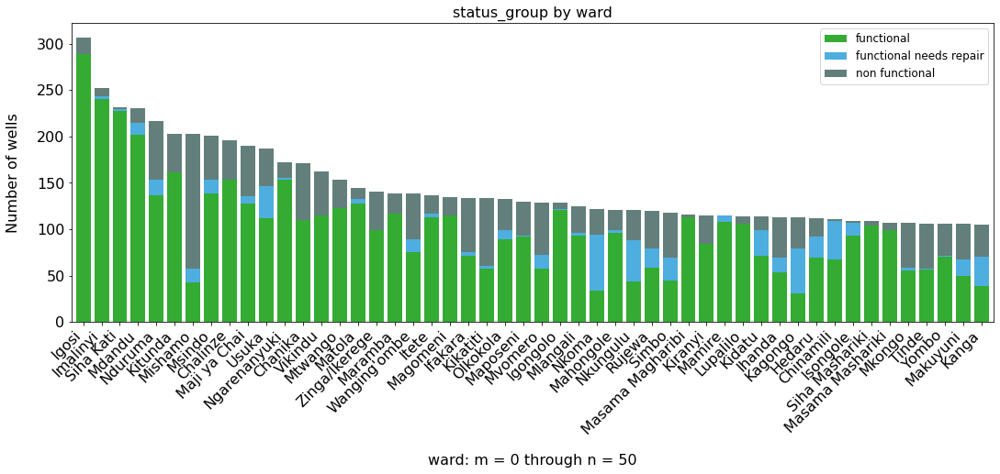

In [110]:
status_by_ward = dataset_eda_subset(df_train, col1='ward', col2='status_group', 
                                    figsize=(18, 6), n=50, alpha=0.8, fontsize=16)
status_by_ward.head(10)

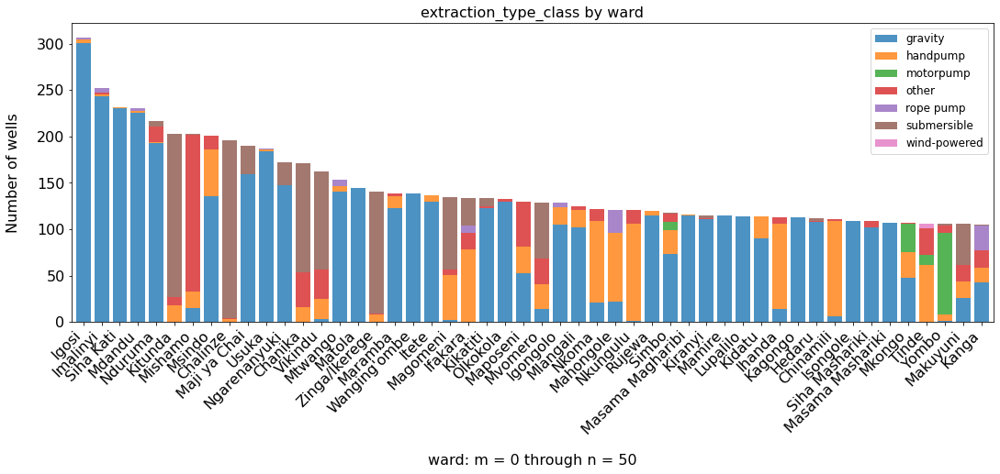

In [111]:
extr_ward = dataset_eda_subset(df_train, col1='ward', col2='extraction_type_class', m=0, n=50, 
                               figsize=(18, 6), legend=True, colors=None, alpha=0.8, fontsize=16)

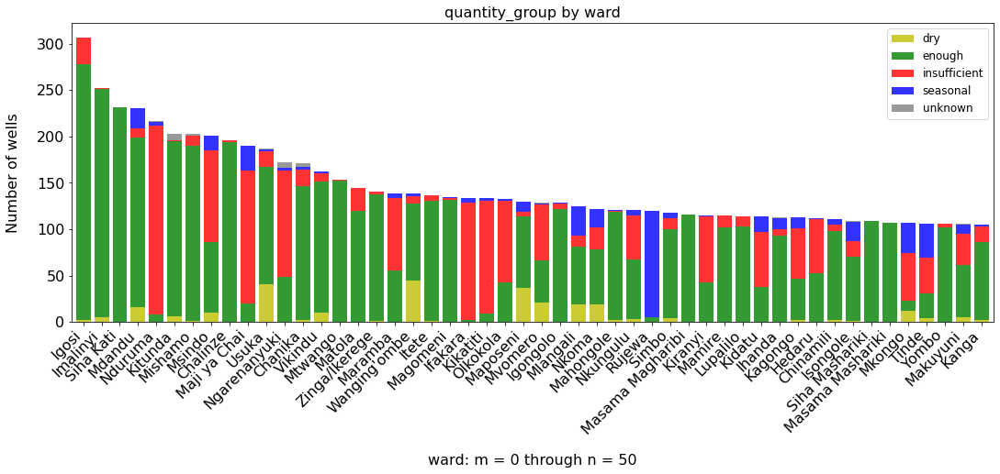

In [112]:
qty_ward = dataset_eda_subset(df_train, col1='ward', col2='quantity_group', m=0, n=50, fontsize=16,
                              figsize=(18, 6), legend=True, colors = ['y', 'g', 'r', 'b', 'gray'])

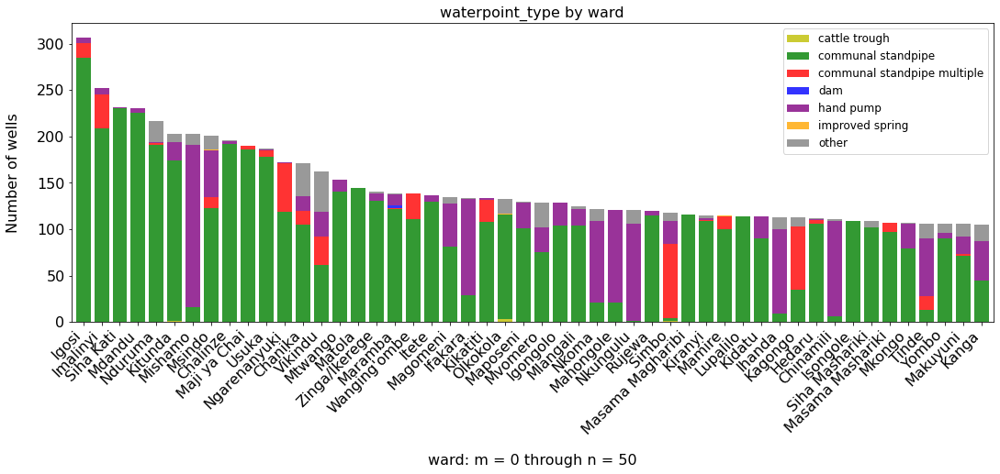

In [113]:
wpt_type_ward = dataset_eda_subset(df_train, col1='ward', col2='waterpoint_type', m=0, n=50, 
                                  figsize=(18, 6), legend=True, fontsize=16,
                                  colors = ['y', 'g', 'r', 'b', 'purple', 'orange', 'gray'])

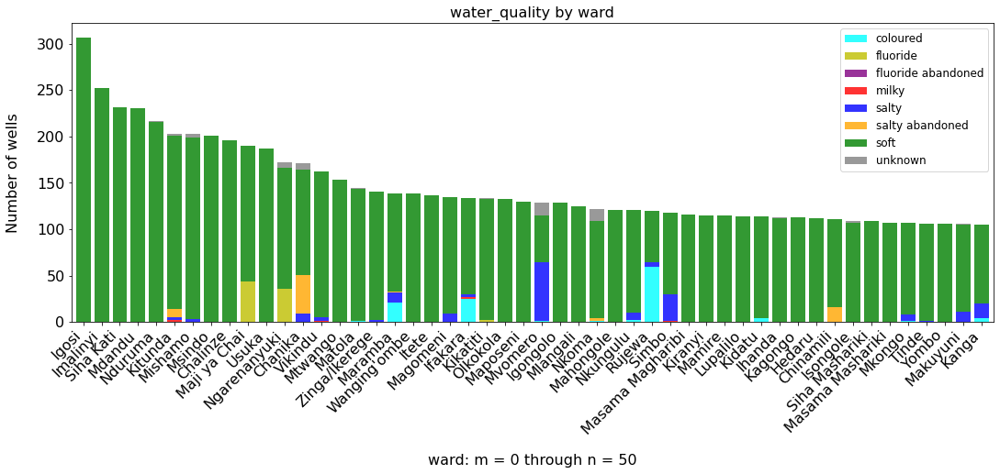

In [114]:
quality_ward = dataset_eda_subset(df_train, col1='ward', col2='water_quality', 
                                  m=0, n=50, figsize=(18, 6), legend=True, fontsize=16, 
                                  colors = ['cyan','y', 'purple', 'r', 'b', 'orange', 'g', 'gray'])

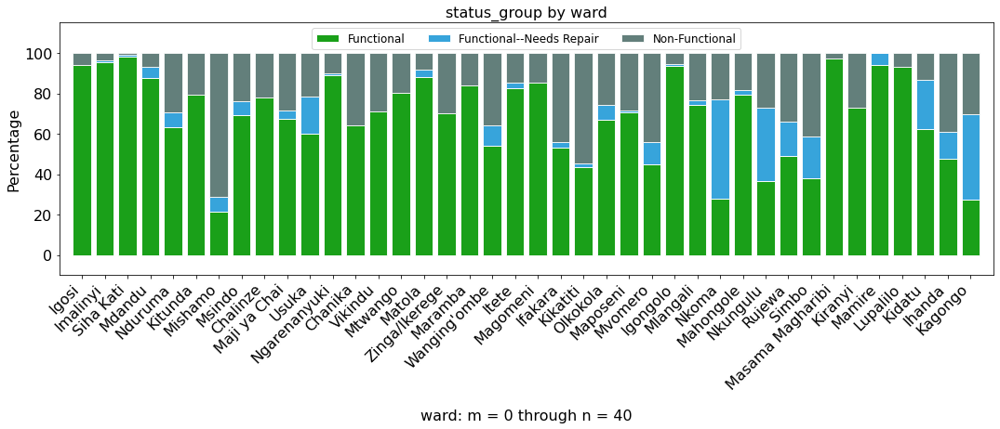

In [115]:
status_ward_pct = dataset_eda_subset_pct(df_train, col1='ward', col2='status_group', 
                                         figsize=(18, 5), fontsize=16, m=0, n=40)

<AxesSubplot:ylabel='Frequency'>

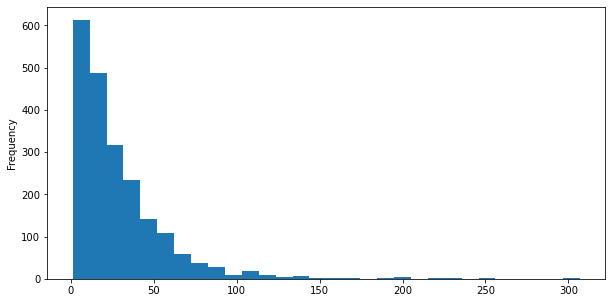

In [116]:
df_train['ward'].value_counts().plot(kind='hist', bins=30, figsize=(10, 5))

In [117]:
df_train['ward'].value_counts()

Igosi            307
Imalinyi         252
Siha Kati        232
Mdandu           231
Nduruma          217
                ... 
Linda              1
Kihangimahuka      1
Chinugulu          1
Mitole             1
Uchindile          1
Name: ward, Length: 2092, dtype: int64

#### Population

status_group,functional,functional needs repair,non functional
population,,,
0,11274,1775,8332
1,2911,354,3760
200,1139,97,704
150,1183,107,602
250,774,92,815
300,775,83,618
100,694,62,390


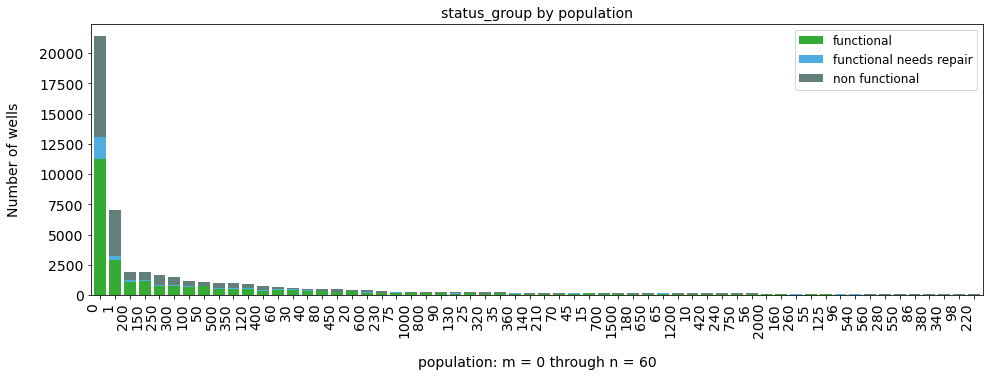

In [118]:
status_by_population = dataset_eda_subset(df_train, col1='population', col2='status_group', 
                                          rotation=90, figsize=(16, 5), m=0, n=60)
status_by_population.head(7)

# need to modify population numbers (put into bins) to get a better idea of what's going on 


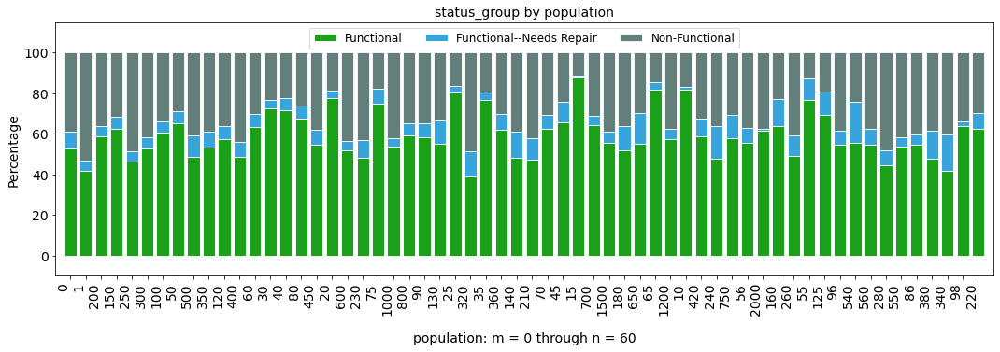

In [119]:
status_popn_pct = dataset_eda_subset_pct(df_train, col1='population', col2='status_group', 
                                         rotation=90, figsize=(18, 5), m=0, n=60)

In [120]:
df_train['population'].value_counts()

0       21381
1        7025
200      1940
150      1892
250      1681
        ...  
1160        1
3241        1
1960        1
2248        1
1439        1
Name: population, Length: 1049, dtype: int64

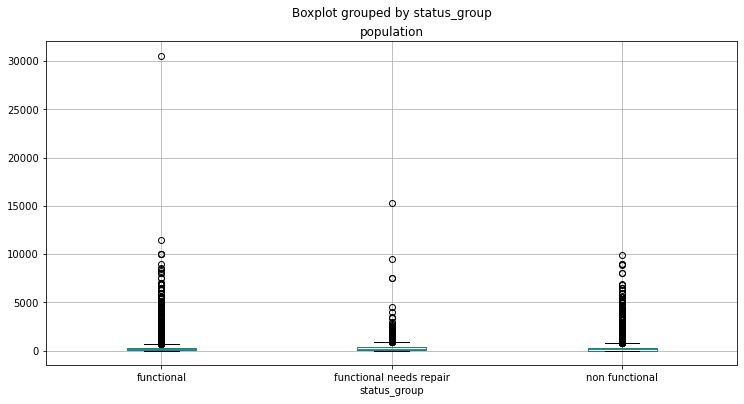

In [121]:
# Boxplot of population vs. status_group

# df_train['population'].dtype

df_train_popn_not_zero = df_train.loc[df_train['population'] > 0]  # note that there are over 14000 values with popn = 0 and over 7000 with popn =1 

# df_train_popn_not_zero['population'].value_counts()

df_train_popn_not_zero.boxplot('population', 'status_group', figsize=(12, 6));

# Because there are so many waterpoints with population = 0 or population = 1, and thousands more with populations 
# between 2 and 200, population appears to be of limited value for classification purposes

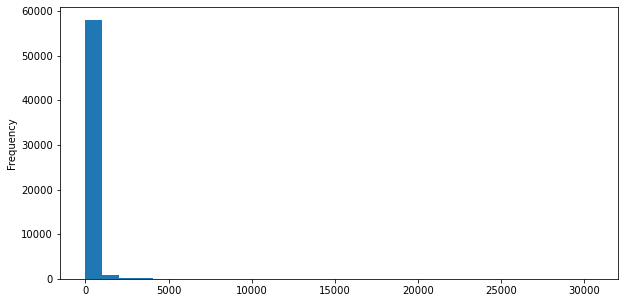

In [123]:
df_train['population'].plot(kind='hist', bins=30, figsize=(10, 5));

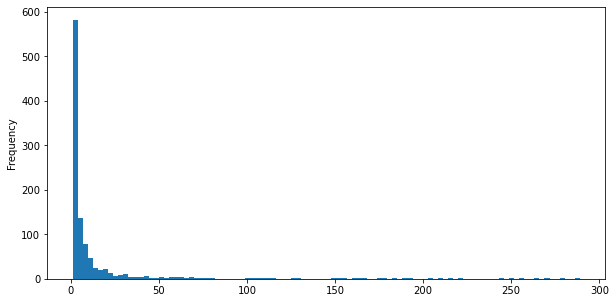

In [124]:
df_train['population'].value_counts()[20:].plot(kind='hist', bins=100, figsize=(10, 5));

##### Put population numbers into bins

In [125]:
cut_bins = [-1, 0, 1, 2, 5, 10, 25, 50, 100, 150, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1200, 1500, 1800, 
            2000, 2500, 3000, 3500, 5000, 10000, 15000, 20000, 30000, 100000]
df_train['pop_binned'] = pd.cut(df_train['population'], bins=cut_bins)
df_train['pop_binned']

0        (100, 150]
1        (200, 300]
2        (200, 300]
3         (50, 100]
4           (-1, 0]
            ...    
59395    (100, 150]
59396     (50, 100]
59397       (-1, 0]
59398       (-1, 0]
59399    (100, 150]
Name: pop_binned, Length: 59400, dtype: category
Categories (31, interval[int64]): [(-1, 0] < (0, 1] < (1, 2] < (2, 5] ... (10000, 15000] < (15000, 20000] < (20000, 30000] < (30000, 100000]]

<AxesSubplot:ylabel='Frequency'>

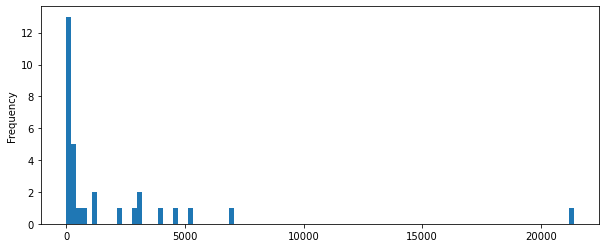

In [126]:
df_train['pop_binned'].value_counts().plot(kind='hist', bins=100, figsize=(10,4))

In [127]:
df_train['pop_binned'].value_counts()

(-1, 0]            21381
(0, 1]              7025
(200, 300]          5323
(50, 100]           4528
(100, 150]          4015
(300, 400]          3062
(25, 50]            3000
(150, 200]          2862
(400, 500]          2212
(500, 600]          1212
(10, 25]            1080
(600, 700]           677
(700, 800]           611
(900, 1000]          417
(1200, 1500]         376
(800, 900]           299
(1000, 1200]         271
(5, 10]              219
(1800, 2000]         166
(2000, 2500]         142
(1500, 1800]         117
(5000, 10000]        100
(3500, 5000]          98
(2500, 3000]          88
(2, 5]                61
(3000, 3500]          51
(1, 2]                 4
(10000, 15000]         1
(15000, 20000]         1
(30000, 100000]        1
(20000, 30000]         0
Name: pop_binned, dtype: int64

In [128]:
df_train.head(3)

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group,pop_binned
0,69572,6000.0,2011-03-14,roman,1390,roman,34.938093,-9.856322,none,0,Lake Nyasa,mnyusi_b,Iringa,11,5,Ludewa,Mundindi,109,True,GeoData Consultants Ltd,vwc,roman,False,1999,gravity,gravity,gravity,vwc,usergroup,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional,"(100, 150]"
1,8776,0.0,2013-03-06,grumeti,1399,grumeti,34.698766,-2.147466,zahanati,0,Lake Victoria,nyamara,Mara,20,2,Serengeti,Natta,280,NaN,GeoData Consultants Ltd,other,missing,True,2010,gravity,gravity,gravity,wug,usergroup,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional,"(200, 300]"
2,34310,25.0,2013-02-25,lottery_club,686,world_vision,37.460664,-3.821329,kwa_mahundi,0,Pangani,majengo,Manyara,21,4,Simanjiro,Ngorika,250,True,GeoData Consultants Ltd,vwc,nyumba_ya_mungu_pipe_scheme,True,2009,gravity,gravity,gravity,vwc,usergroup,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional,"(200, 300]"


#### Public Meeting

status_group,functional,functional needs repair,non functional
public_meeting,,,
True,28408,3719,18884
False,2173,442,2440


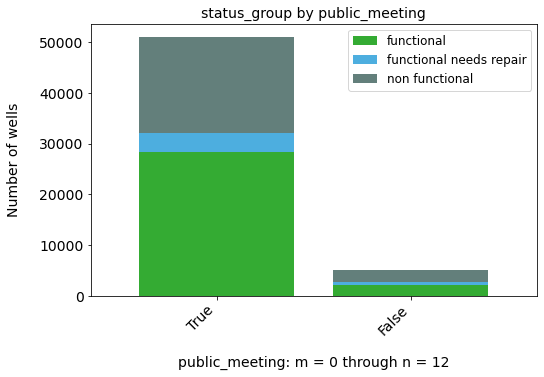

In [136]:
status_by_public_meeting = dataset_eda_subset(df_train, col1='public_meeting', col2='status_group', 
                                              figsize=(8, 5), n=12)
status_by_public_meeting


#### Permit

status_group,functional,functional needs repair,non functional
permit,,,
True,21541,2697,14614
False,9045,1320,7127


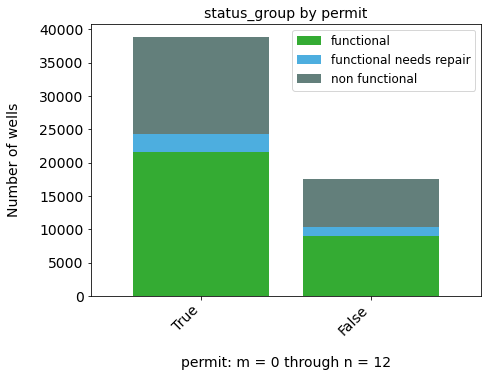

In [138]:
status_by_permit = dataset_eda_subset(df_train, col1='permit', col2='status_group', figsize=(7,5), n=12)
status_by_permit

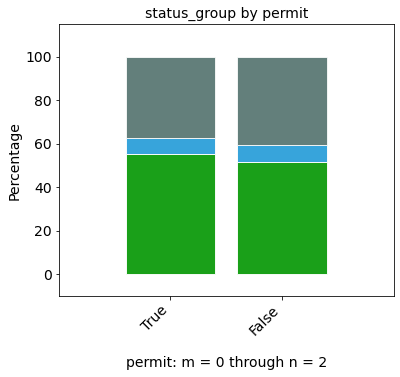

In [141]:
status_permit_pct = dataset_eda_subset_pct(df_train, col1='permit', col2='status_group', 
                                                figsize=(6, 5), m=0, n=2, legend=False)

#### Scheme_name

status_group,functional,functional needs repair,non functional
scheme_name,,,
missing,14488,2004,11674
k,377,115,193
none,426,30,213
borehole,204,26,316
chalinze_wate,349,0,57
m,197,56,147
danida,199,17,163
government,150,32,138
bagamoyo_wate,208,0,88


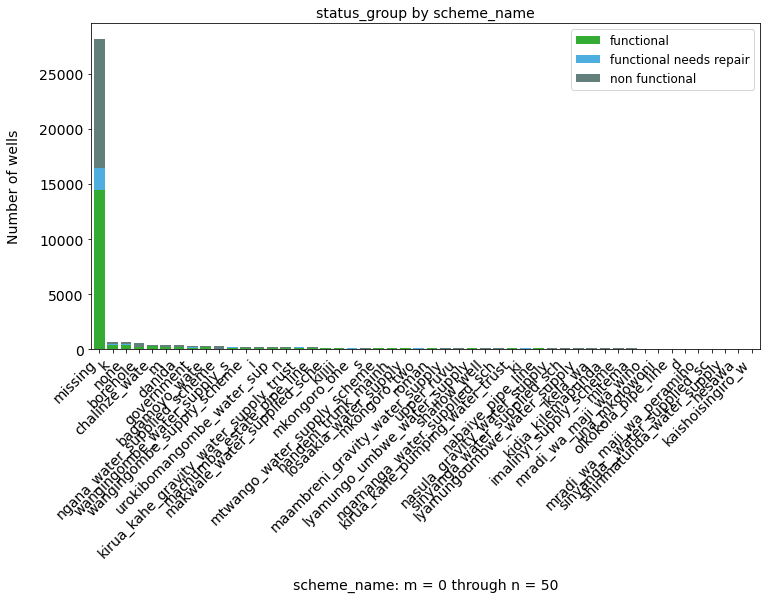

In [142]:
status_by_scheme_name = dataset_eda_subset(df_train, col1='scheme_name', col2='status_group', n=50)
status_by_scheme_name


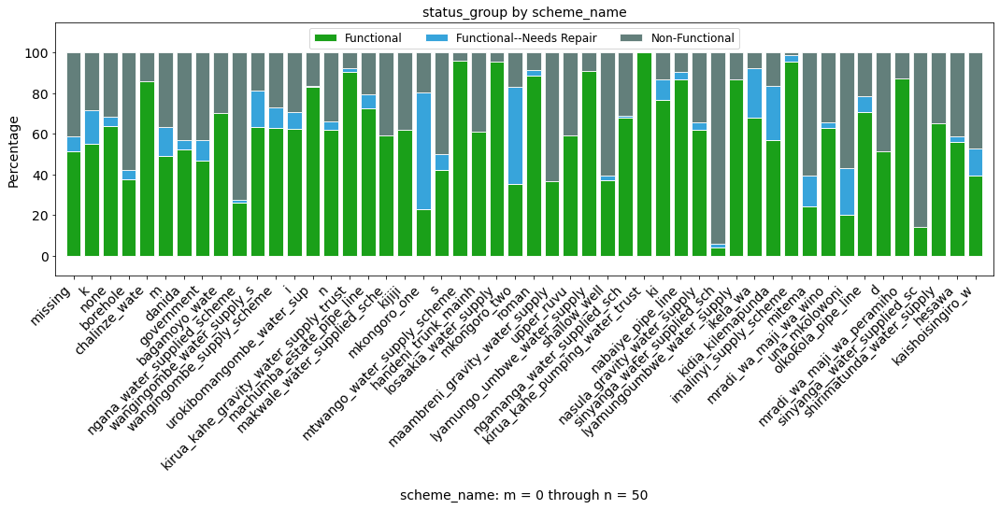

In [143]:
status_scheme_name_pct = dataset_eda_subset_pct(df_train, col1='scheme_name', col2='status_group', 
                                                figsize=(18, 5), m=0, n=50)

Over half of the scheme_name values are missing; based on this, I'm going to eliminate scheme_name from the modeling

#### Scheme management

status_group,functional,functional needs repair,non functional
scheme_management,,,
vwc,18960,2334,15499
wug,3006,672,1528
water_authority,1618,448,1087
wua,1995,239,649
water_board,2053,111,584
parastatal,966,202,512
private_operator,729,23,311
company,534,37,490
other,458,22,286


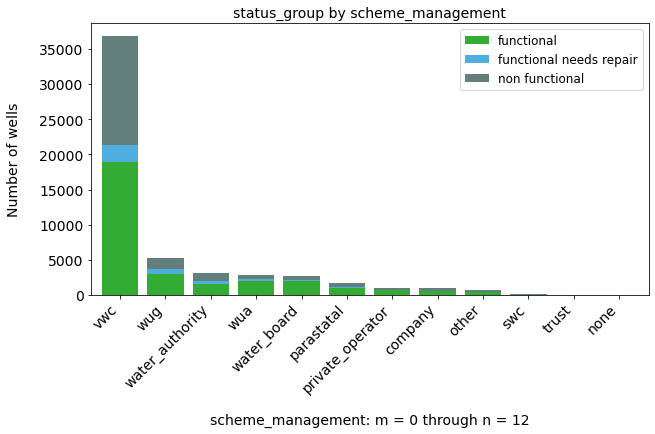

In [144]:
status_by_scheme_management = dataset_eda_subset(df_train, col1='scheme_management', 
                                                 col2='status_group', n=12, figsize=(10, 5))
status_by_scheme_management


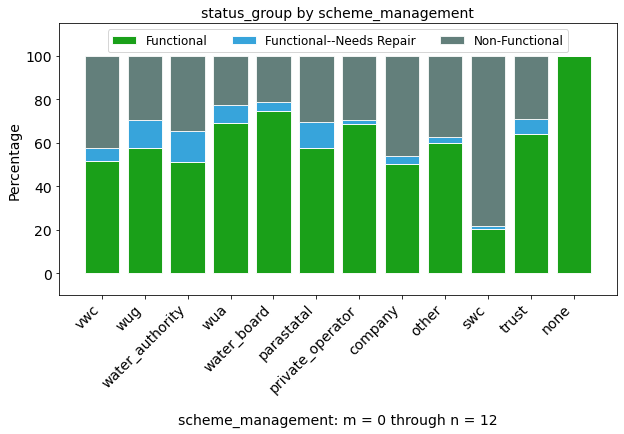

In [145]:
status_scheme_mgmt_pct = dataset_eda_subset_pct(df_train, col1='scheme_management', col2='status_group', 
                                                figsize=(10, 5), m=0, n=12)

#### Management group

status_group,functional,functional needs repair,non functional
management_group,,,
usergroup,28252,3906,20332
commercial,2235,117,1286
parastatal,1020,211,537
other,528,56,359
unknown,224,27,310


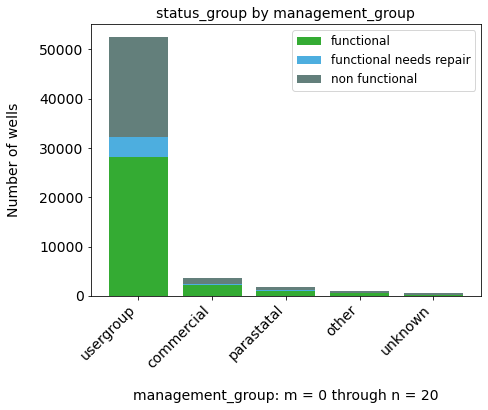

In [146]:
status_by_mgmt_grp = dataset_eda_subset(df_train, col1='management_group', col2='status_group', 
                                        figsize=(7, 5), n=20)
status_by_mgmt_grp


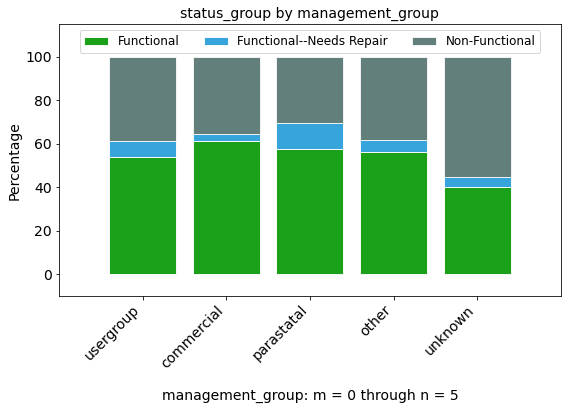

In [147]:
status_mgmt_grp_pct = dataset_eda_subset_pct(df_train, col1='management_group', col2='status_group', 
                                                figsize=(9, 5), m=0, n=5)

#### Management

status_group,functional,functional needs repair,non functional
management,,,
vwc,20425,2791,17291
wug,3906,645,1964
water_board,2170,265,498
wua,1751,205,579
private_operator,1476,44,451
parastatal,1020,211,537
water_authority,446,52,406
other,505,55,284
company,267,15,403


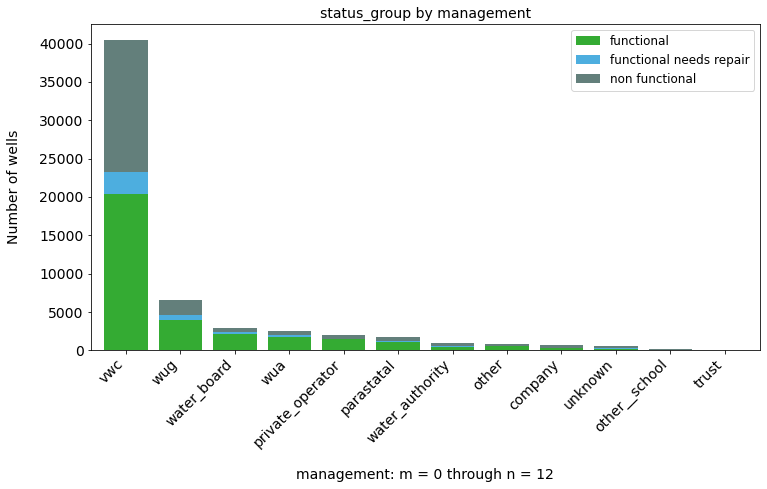

In [153]:
status_by_mgmt = dataset_eda_subset(df_train, col1='management', col2='status_group', n=12)
status_by_mgmt


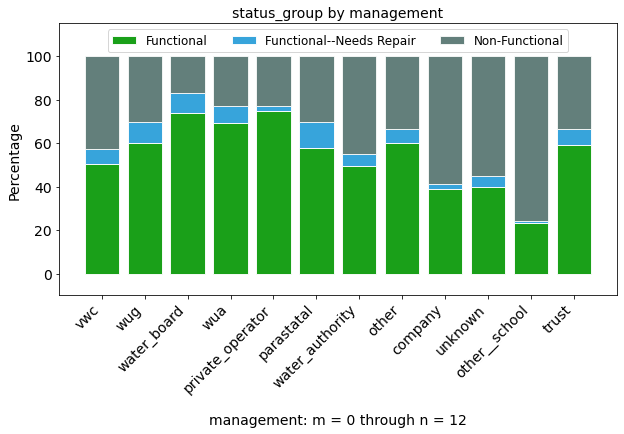

In [154]:
status_mgmt = dataset_eda_subset_pct(df_train, col1='management', col2='status_group', figsize=(10, 5), n=12)

This information seems very similar to scheme_management, except that it seems to be more complete, and more detailed than management_group.  Therefore, I will use management going forward.

#### Construction year

status_group,functional,functional needs repair,non functional
construction_year,,,
Missing,10555,1789,8365
2010,2023,90,532
2008,1839,127,647
2009,1774,138,621
2000,1279,136,676
2007,1081,116,390
2006,883,135,453
2003,828,71,387
2011,943,78,235


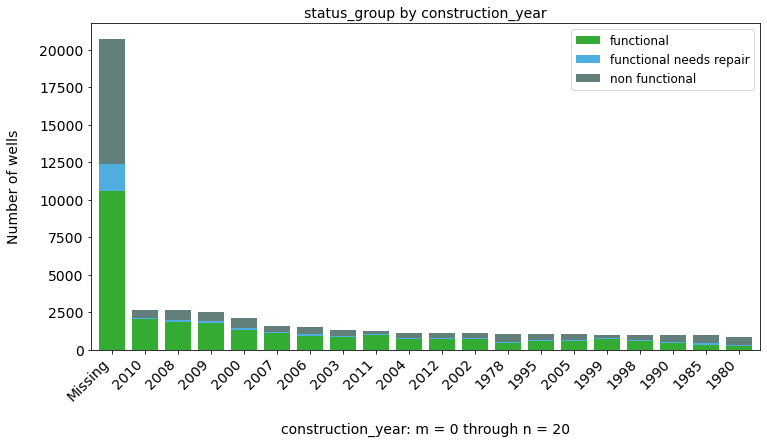

In [155]:
# Construction_year data sorted by function default (number of project per year)

status_by_construction_year = dataset_eda_subset(df_train, col1='construction_year', 
                                                 col2='status_group', n=20)
status_by_construction_year

status_group,functional,functional needs repair,non functional
construction_year,,,
Missing,10555,1789,8365
2013,102,1,73
2012,726,51,307
2011,943,78,235
2010,2023,90,532
2009,1774,138,621
2008,1839,127,647
2007,1081,116,390
2006,883,135,453


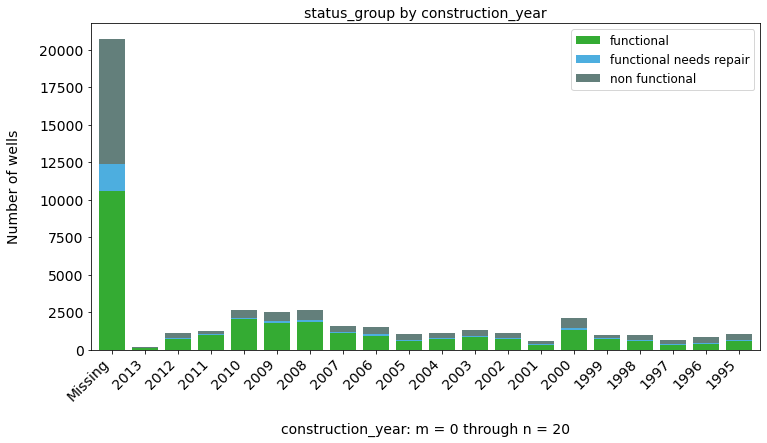

In [156]:
# sorted by construction_year rather than by number of projects

status_by_construction_year  = dataset_eda_subset(df_train, col1='construction_year', 
                                                  col2='status_group', rotation=45,
                                                  sort_by='construction_year', n=20)

status_by_construction_year

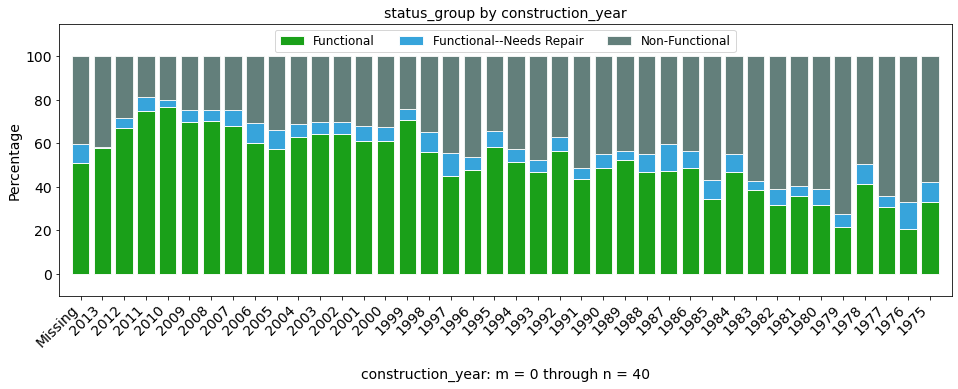

In [161]:
# sorted by construction_year

status_constr_yr_pct = dataset_eda_subset_pct(df_train, col1='construction_year', 
                                              col2='status_group', sort_by='construction_year', 
                                              figsize=(16, 5), m=0, n=40, rotation=45)


#### Extraction type

status_group,functional,functional needs repair,non functional
extraction_type,,,
gravity,16048,2701,8031
nira/tanira,5421,641,2092
other,1029,206,5195
submersible,2626,227,1911
swn 80,2090,212,1368
mono,1082,129,1654
india mark ii,1448,79,873
afridev,1200,42,528
ksb,703,26,686


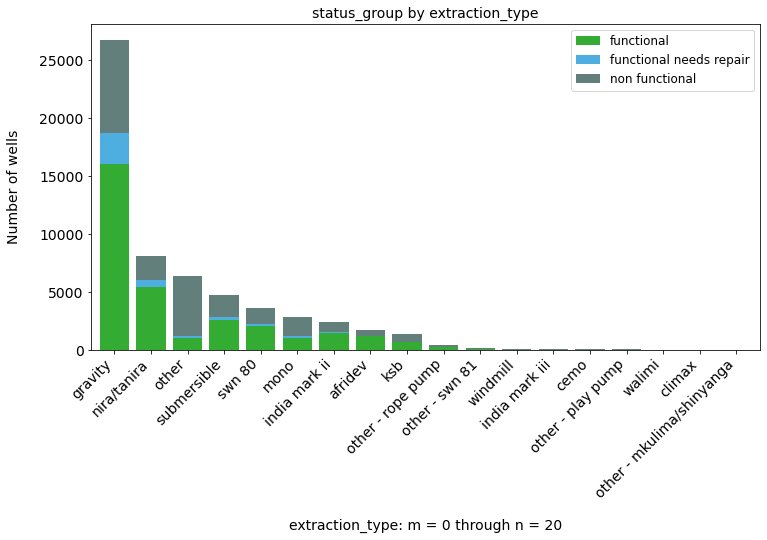

In [162]:
status_by_extraction_type = dataset_eda_subset(df_train, col1='extraction_type', 
                                               col2='status_group', m=0, n=20)
status_by_extraction_type

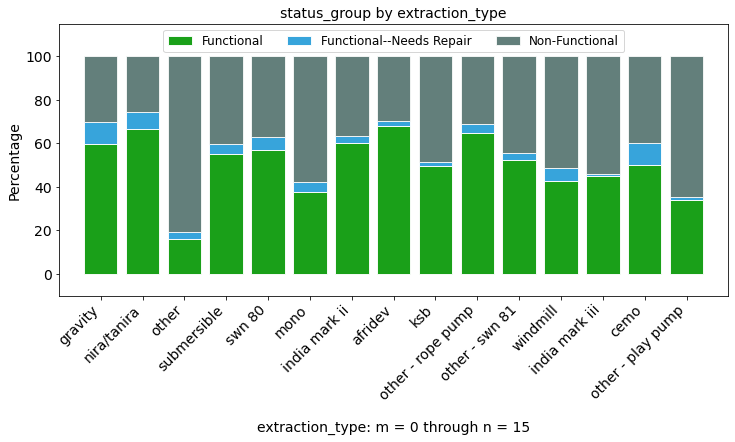

In [163]:
status_extr_type_pct = dataset_eda_subset_pct(df_train, col1='extraction_type', col2='status_group', 
                                                figsize=(12, 5), m=0, n=15)

#### Extraction type group

status_group,functional,functional needs repair,non functional
extraction_type_group,,,
gravity,16048,2701,8031
nira/tanira,5421,641,2092
other,1029,206,5195
submersible,3329,253,2597
swn 80,2090,212,1368
mono,1082,129,1654
india mark ii,1448,79,873
afridev,1200,42,528
rope pump,293,17,141


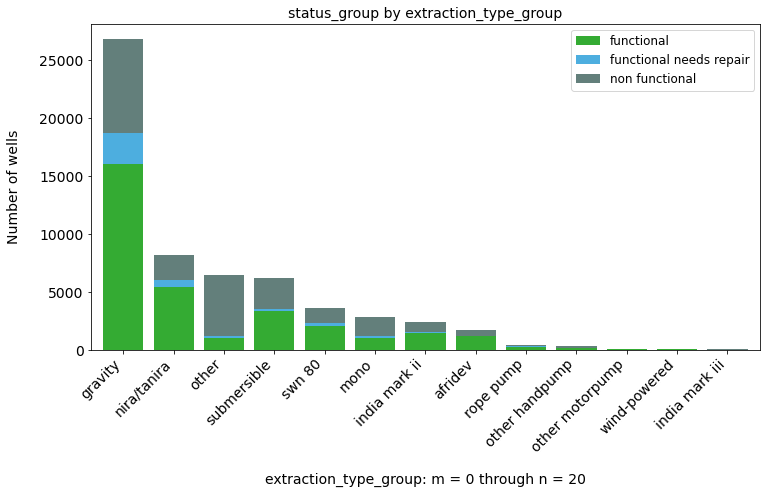

In [164]:
status_by_extraction_type_group = dataset_eda_subset(df_train, col1='extraction_type_group', col2='status_group', m=0, n=20)
status_by_extraction_type_group

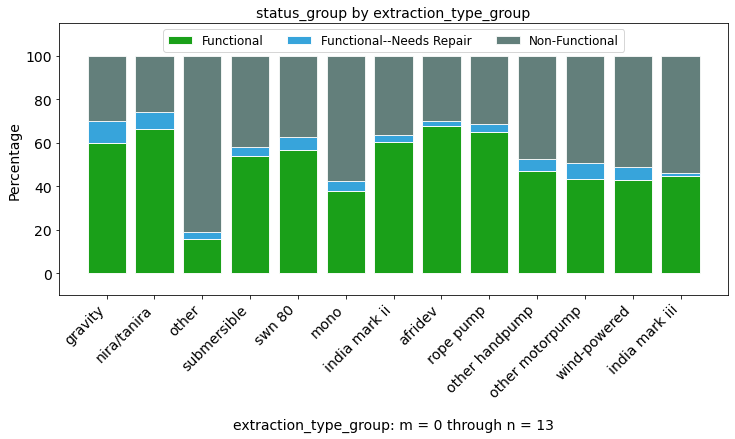

In [166]:
status_extr_type_grp_pct = dataset_eda_subset_pct(df_train, col1='extraction_type_group', col2='status_group', 
                                                figsize=(12, 5), m=0, n=13)

#### Extraction type class

status_group,functional,functional needs repair,non functional
extraction_type_class,,,
gravity,16048,2701,8031
handpump,10375,995,5086
other,1029,206,5195
submersible,3329,253,2597
motorpump,1135,138,1714
rope pump,293,17,141
wind-powered,50,7,60


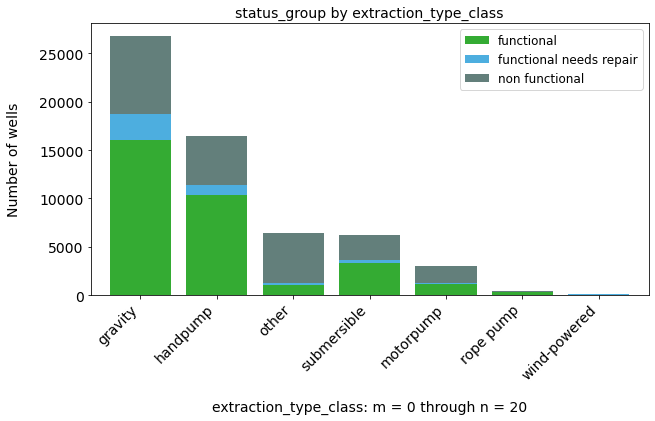

In [167]:
status_by_extraction_type_class = dataset_eda_subset(df_train, col1='extraction_type_class', 
                                                     figsize=(10, 5), col2='status_group', n=20)
status_by_extraction_type_class

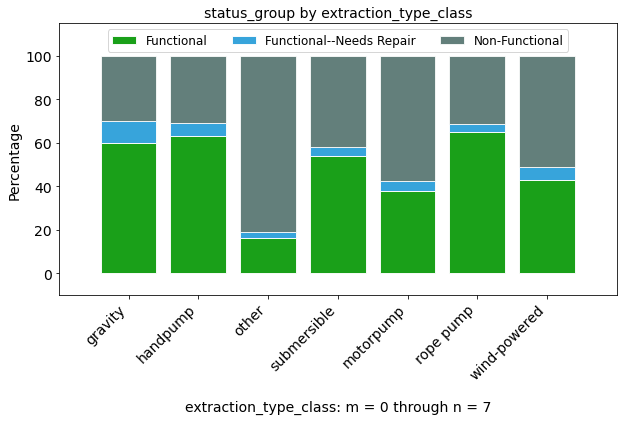

In [168]:
status_extr_type_class_pct = dataset_eda_subset_pct(df_train, col1='extraction_type_class', col2='status_group', 
                                                figsize=(10, 5), m=0, n=7)

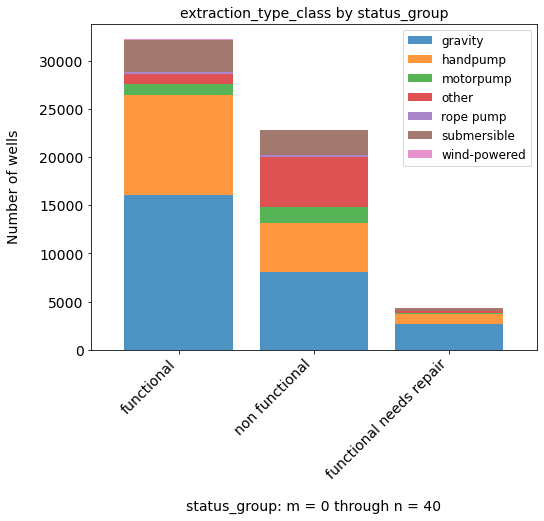

In [169]:
extr_class_status = dataset_eda_subset(df_train, col1='status_group',
                                       col2='extraction_type_class', 
                                       m=0, n=40, figsize=(8, 6), 
                                       legend=True, colors=None, 
                                       rotation=45, fontsize=14)

In [170]:
df['extraction_type_class'].value_counts()

gravity         26780
handpump        16456
other            6430
submersible      6179
motorpump        2987
rope pump         451
wind-powered      117
Name: extraction_type_class, dtype: int64

#### Water quality

status_group,functional,functional needs repair,non functional
water_quality,,,
soft,28760,3904,18154
salty,2220,225,2411
unknown,264,35,1577
milky,438,14,352
coloured,246,54,190
salty abandoned,174,72,93
fluoride,151,13,36
fluoride abandoned,6,0,11


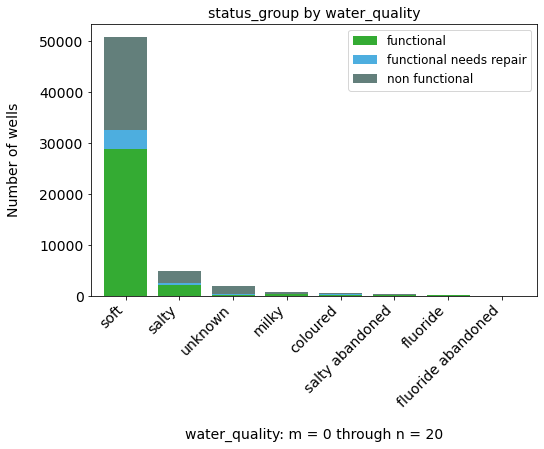

In [171]:
status_by_water_quality = dataset_eda_subset(df_train, col1='water_quality', 
                                             col2='status_group', figsize=(8, 5), m=0, n=20)
status_by_water_quality

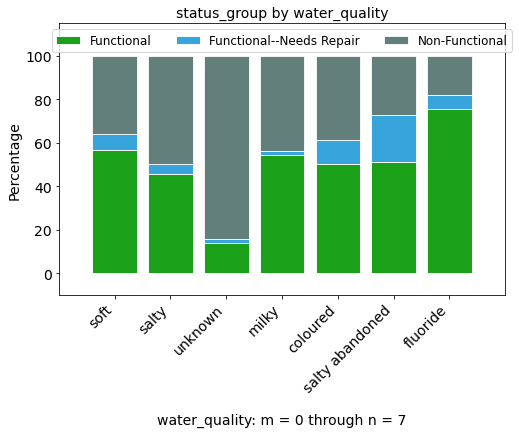

In [172]:
status_water_qual_pct = dataset_eda_subset_pct(df_train, col1='water_quality', col2='status_group', 
                                                figsize=(8, 5), m=0, n=7)

#### Quality group

status_group,functional,functional needs repair,non functional
quality_group,,,
salty,2394,297,2504
unknown,264,35,1577
milky,438,14,352
colored,246,54,190
fluoride,157,13,47


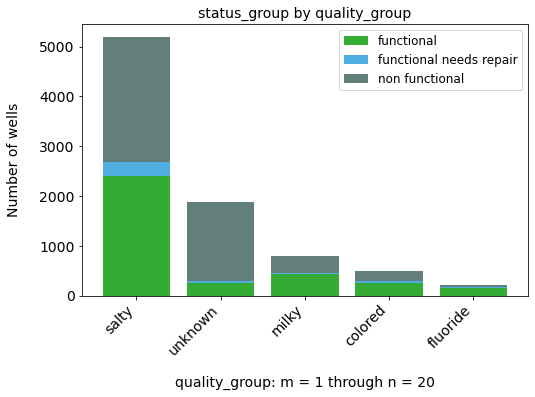

In [173]:
status_by_quality_group = dataset_eda_subset(df_train, col1='quality_group', figsize=(8, 5), 
                                             col2='status_group', m=1,  n=20)
status_by_quality_group

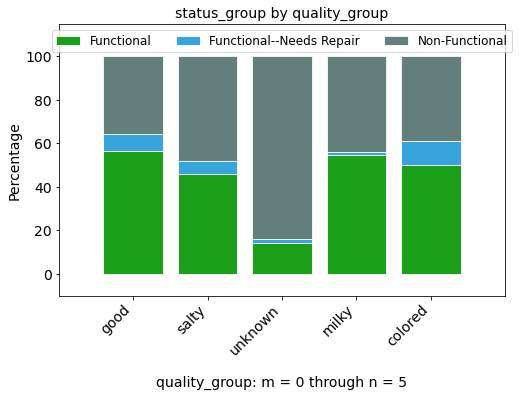

In [174]:
status_quality_grp_pct = dataset_eda_subset_pct(df_train, col1='quality_group', col2='status_group', 
                                                figsize=(8, 5), m=0, n=5)

#### Quantity

status_group,functional,functional needs repair,non functional
quantity,,,
enough,21648,2400,9138
insufficient,7916,1450,5763
dry,157,37,6052
seasonal,2325,416,1309
unknown,213,14,562


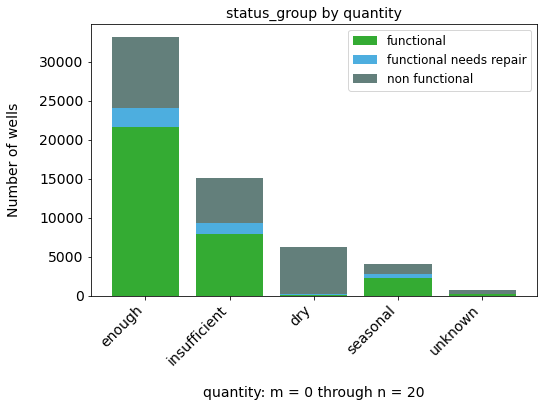

In [175]:
status_by_quantity = dataset_eda_subset(df_train, col1='quantity', figsize=(8, 5), 
                                        col2='status_group', n=20)
status_by_quantity

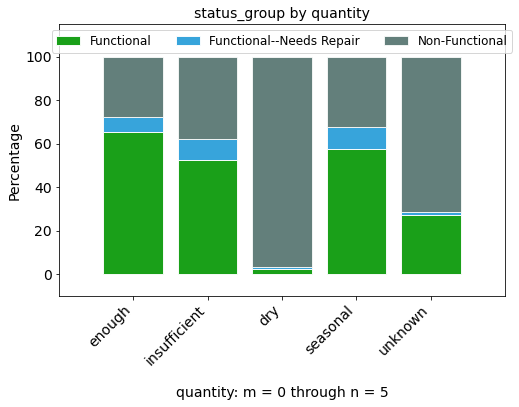

In [176]:
status_quantity_pct = dataset_eda_subset_pct(df_train, col1='quantity', col2='status_group', 
                                                figsize=(8, 5), m=0, n=5)

#### Quantity group

status_group,functional,functional needs repair,non functional
quantity_group,,,
enough,21648,2400,9138
insufficient,7916,1450,5763
dry,157,37,6052
seasonal,2325,416,1309
unknown,213,14,562


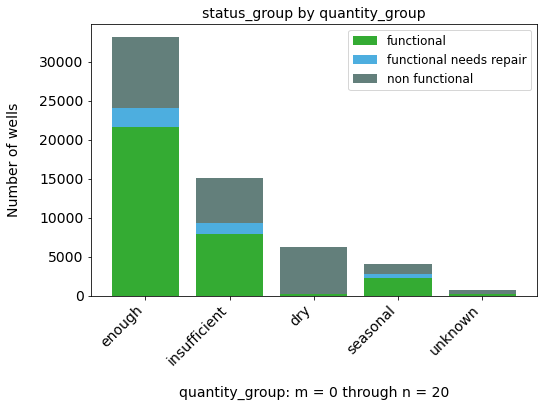

In [177]:
status_by_quantity_group = dataset_eda_subset(df_train, col1='quantity_group', figsize=(8, 5), 
                                              col2='status_group', n=20)
status_by_quantity_group

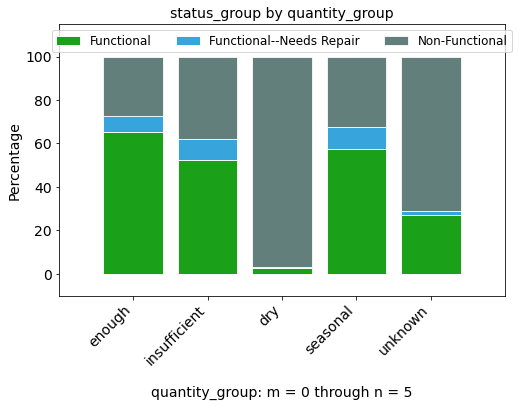

In [178]:
status_quantity_grp_pct = dataset_eda_subset_pct(df_train, col1='quantity_group', col2='status_group', 
                                                figsize=(8, 5), m=0, n=5)

#### Source

status_group,functional,functional needs repair,non functional
source,,,
spring,10592,1276,5153
shallow well,8324,957,7543
machine dbh,5422,491,5162
river,5465,1221,2926
rainwater harvesting,1386,314,595
hand dtw,497,17,360
lake,162,12,591
dam,253,24,379
other,126,1,85


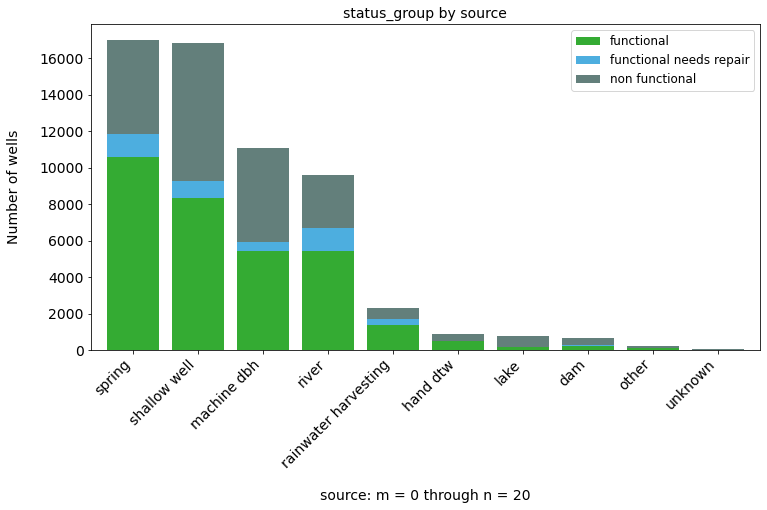

In [179]:
status_by_source = dataset_eda_subset(df_train, col1='source', col2='status_group', n=20)
status_by_source

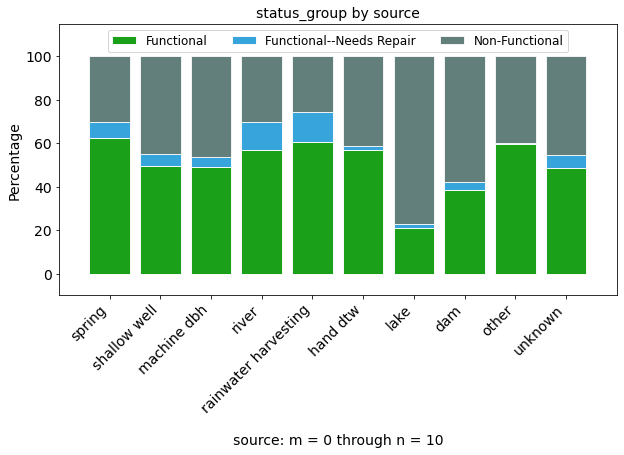

In [180]:
status_source_pct = dataset_eda_subset_pct(df_train, col1='source', col2='status_group', 
                                            figsize=(10, 5), m=0, n=10)

#### Source type

status_group,functional,functional needs repair,non functional
source_type,,,
spring,10592,1276,5153
shallow well,8324,957,7543
borehole,5919,508,5522
river/lake,5627,1233,3517
rainwater harvesting,1386,314,595
dam,253,24,379
other,158,5,115


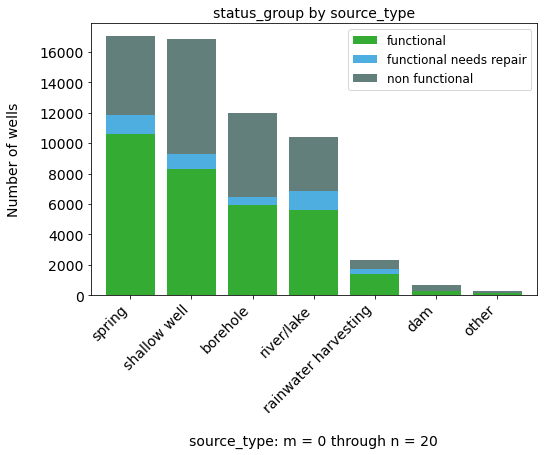

In [181]:
status_by_source_type = dataset_eda_subset(df_train, col1='source_type', 
                                           figsize=(8, 5), col2='status_group', n=20)
status_by_source_type

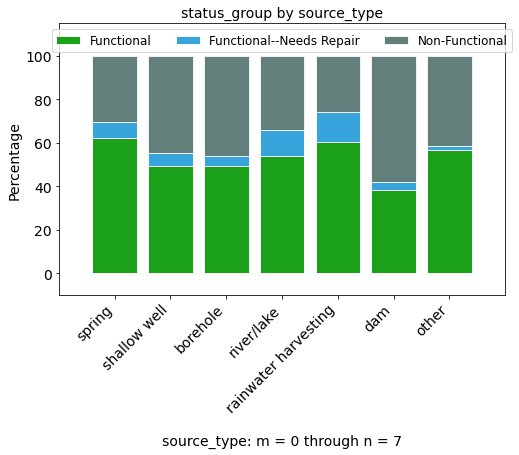

In [182]:
status_source_type_pct = dataset_eda_subset_pct(df_train, col1='source_type', col2='status_group', 
                                                figsize=(8, 5), m=0, n=7)

#### Source class

status_group,functional,functional needs repair,non functional
source_class,,,
groundwater,24835,2741,18218
surface,7266,1571,4491
unknown,158,5,115


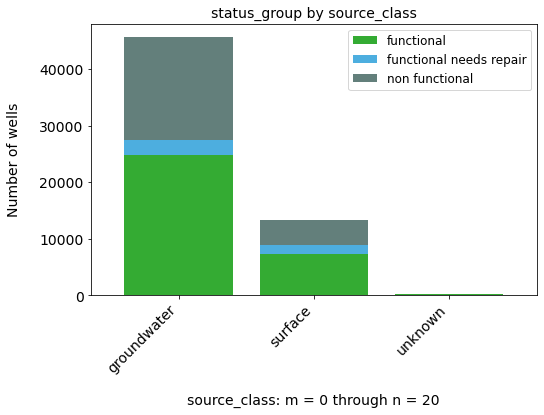

In [183]:
status_by_source_class = dataset_eda_subset(df_train, col1='source_class', figsize=(8, 5),
                                            col2='status_group', n=20)
status_by_source_class

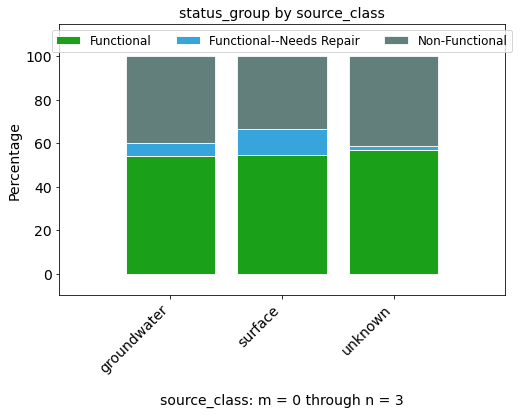

In [184]:
status_source_class_pct = dataset_eda_subset_pct(df_train, col1='source_class', col2='status_group', 
                                                figsize=(8, 5), m=0, n=3)

#### Waterpoint type

status_group,functional,functional needs repair,non functional
waterpoint_type,,,
communal standpipe,17726,2260,8536
hand pump,10805,1029,5654
other,840,293,5247
communal standpipe multiple,2235,648,3220
improved spring,563,85,136
cattle trough,84,2,30
dam,6,0,1


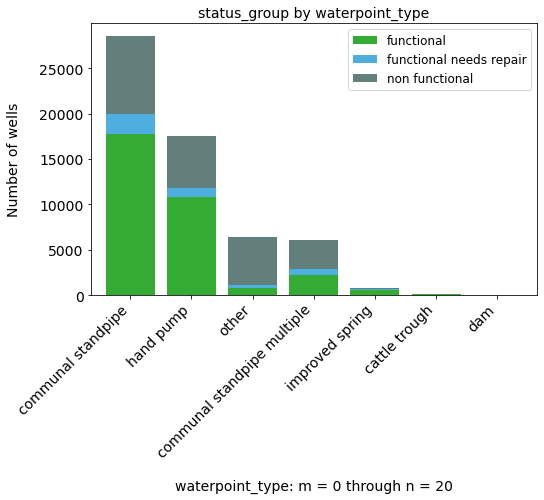

In [185]:
status_by_waterpoint_type = dataset_eda_subset(df_train, col1='waterpoint_type', figsize=(8, 5),
                                               col2='status_group', m=0, n=20)
status_by_waterpoint_type

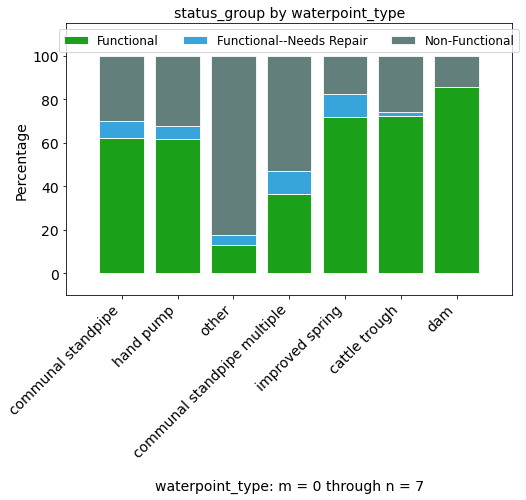

In [186]:
status_waterpt_type_pct = dataset_eda_subset_pct(df_train, col1='waterpoint_type', col2='status_group', 
                                                figsize=(8, 5), m=0, n=7)

#### Waterpoint type group

status_group,functional,functional needs repair,non functional
waterpoint_type_group,,,
communal standpipe,19961,2908,11756
hand pump,10805,1029,5654
other,840,293,5247
improved spring,563,85,136
cattle trough,84,2,30
dam,6,0,1


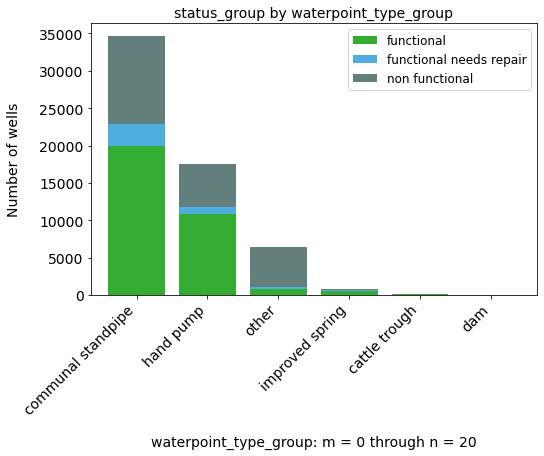

In [187]:
status_by_waterpoint_type_group = dataset_eda_subset(df_train, col1='waterpoint_type_group', 
                                                     figsize=(8, 5), col2='status_group', n=20)
status_by_waterpoint_type_group

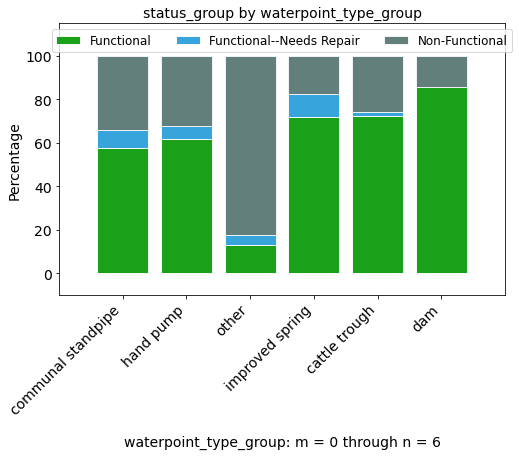

In [188]:
status_waterpt_type_grp_pct = dataset_eda_subset_pct(df_train, col1='waterpoint_type_group', col2='status_group', 
                                                figsize=(8, 5), m=0, n=6)

#### Waterpoint name

status_group,functional,functional needs repair,non functional
wpt_name,,,
none,2630,76,859
shuleni,859,143,746
zahanati,430,78,322
msikitini,263,44,228
kanisani,155,21,147
bombani,158,21,92
sokoni,120,26,114
ofisini,110,11,133
school,87,13,108


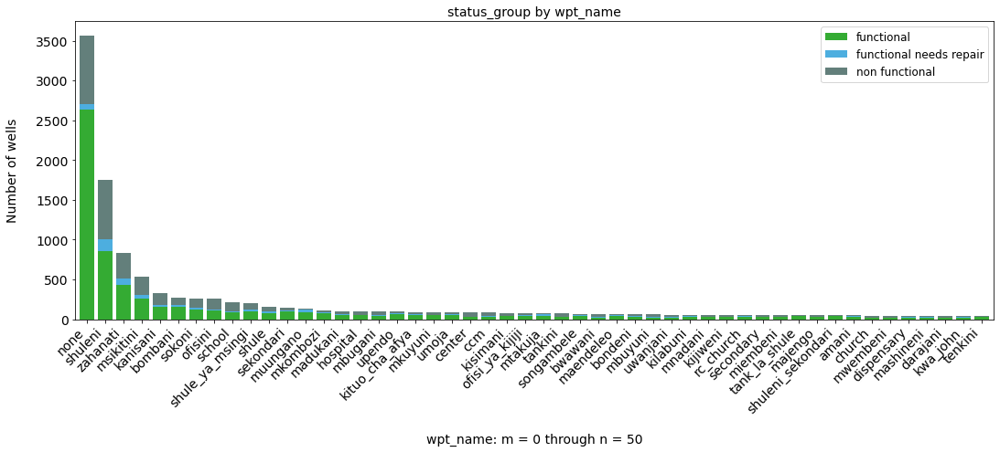

In [189]:
status_by_wpt_name = dataset_eda_subset(df_train, col1='wpt_name', col2='status_group', m=0, n=50, figsize=(18, 6))
status_by_wpt_name

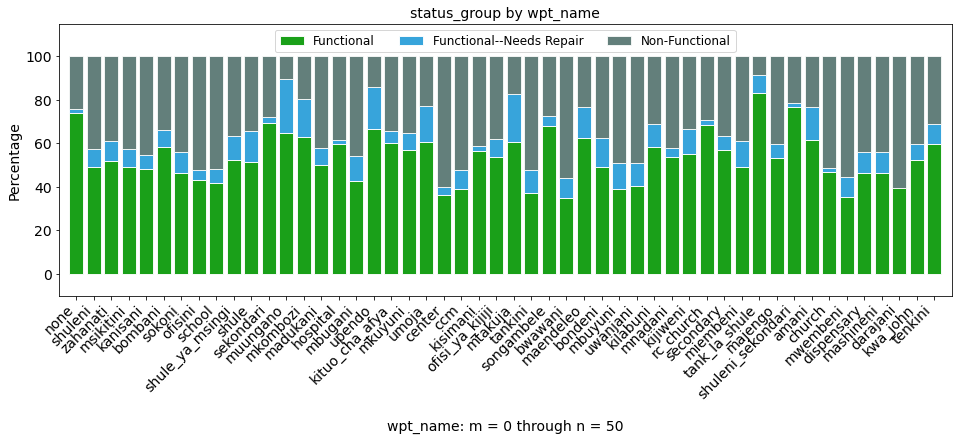

In [190]:
status_waterpt_name_pct = dataset_eda_subset_pct(df_train, col1='wpt_name', col2='status_group', 
                                                figsize=(16, 5), m=0, n=50)

## Modeling:  Prep Work 

### Import libraries for modeling and analysis

In [192]:
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, roc_curve, auc, confusion_matrix, plot_confusion_matrix
from sklearn.metrics import jaccard_score
from sklearn.metrics import multilabel_confusion_matrix
from sklearn.tree import export_graphviz, plot_tree
from IPython.display import Image
from pydotplus import graph_from_dot_data
import warnings
warnings.filterwarnings("ignore")

Code for measuring run time of modeling functions:

In [502]:
# import timeit
# start = timeit.default_timer()
# end = timeit.default_timer()
# print('Run time (seconds):', end-start)
# print()

### Preparing dataframe for modeling

### Columns to use for modeling

I propose using the following columns for modeling:

1. funder OR installer (use only one of these to avoid multi-collinearity)
2. management (over management_group, scheme_management, or scheme_name)
3. basin, district_code, region, lga, ward, OR subvillage (use only one to avoid multi-collinearity)
4. payment OR payment_type (choosing payment)
6. water_quality OR quality_group (choosing water_quality) 
7. quantity_group OR quantity (choosing quantity_group)  
8. source (choosing source over source_type or source_class, as 'source' is a bit more specific)
9. extraction_type_group, extraction_type, OR extraction_type_class (choosing extraction_type_class)
10. waterpoint_type OR waterpoint_type_group (choosing waterpoint_type)

I've decided to drop columns for the following reasons:
* Data integrity problems, such as missing or unclear entries (e.g., 'amount_tsh', 'construction_year', 'population', 'scheme_name') 
* The data doesn't add anything (e.g., 'date_recorded', 'num_private', 'recorded_by', 'region' over 'region_code')
* Potential collinearity problems (e.g., 'district_code' vs. other geographic locators; 'source' over 'source_type'; 'management' over 'scheme_management' or 'management_group')
* I'm not able to utilize it at this time (e.g., 'gps_height', 'longitude', 'latitude', 'public_meeting', 'permit')


###### Create new dataframe:  df_train1

In [193]:
df_train1 = df_train.copy()
df_train1.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group,pop_binned
0,69572,6000.0,2011-03-14,roman,1390,roman,34.938093,-9.856322,none,0,Lake Nyasa,mnyusi_b,Iringa,11,5,Ludewa,Mundindi,109,True,GeoData Consultants Ltd,vwc,roman,False,1999,gravity,gravity,gravity,vwc,usergroup,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional,"(100, 150]"
1,8776,0.0,2013-03-06,grumeti,1399,grumeti,34.698766,-2.147466,zahanati,0,Lake Victoria,nyamara,Mara,20,2,Serengeti,Natta,280,NaN,GeoData Consultants Ltd,other,missing,True,2010,gravity,gravity,gravity,wug,usergroup,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional,"(200, 300]"
2,34310,25.0,2013-02-25,lottery_club,686,world_vision,37.460664,-3.821329,kwa_mahundi,0,Pangani,majengo,Manyara,21,4,Simanjiro,Ngorika,250,True,GeoData Consultants Ltd,vwc,nyumba_ya_mungu_pipe_scheme,True,2009,gravity,gravity,gravity,vwc,usergroup,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional,"(200, 300]"
3,67743,0.0,2013-01-28,unicef,263,unicef,38.486161,-11.155298,zahanati_ya_nanyumbu,0,Ruvuma / Southern Coast,mahakamani,Mtwara,90,63,Nanyumbu,Nanyumbu,58,True,GeoData Consultants Ltd,vwc,missing,True,1986,submersible,submersible,submersible,vwc,usergroup,never pay,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional,"(50, 100]"
4,19728,0.0,2011-07-13,action_in_a,0,artisan,31.130847,-1.825359,shuleni,0,Lake Victoria,kyanyamisa,Kagera,18,1,Karagwe,Nyakasimbi,0,True,GeoData Consultants Ltd,NaN,missing,True,Missing,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional,"(-1, 0]"


### Removing unneeded columns from dataframe for further analysis

In [194]:
cols_to_remove = ['amount_tsh', 'date_recorded', 'gps_height', 'longitude', 'latitude', 'num_private', 
                  'recorded_by', 'payment_type', 'waterpoint_type_group', 'source_type',
                  'source_class', 'quality_group', 'quantity', 'district_code', 'scheme_management', 'region_code',
                  'scheme_name', 'management_group', 'extraction_type', 'population', 'extraction_type_group']

In [195]:
all_cols = df_train1.columns
type(all_cols)
all_cols_list = list(all_cols)
all_cols_list

['id',
 'amount_tsh',
 'date_recorded',
 'funder',
 'gps_height',
 'installer',
 'longitude',
 'latitude',
 'wpt_name',
 'num_private',
 'basin',
 'subvillage',
 'region',
 'region_code',
 'district_code',
 'lga',
 'ward',
 'population',
 'public_meeting',
 'recorded_by',
 'scheme_management',
 'scheme_name',
 'permit',
 'construction_year',
 'extraction_type',
 'extraction_type_group',
 'extraction_type_class',
 'management',
 'management_group',
 'payment',
 'payment_type',
 'water_quality',
 'quality_group',
 'quantity',
 'quantity_group',
 'source',
 'source_type',
 'source_class',
 'waterpoint_type',
 'waterpoint_type_group',
 'status_group',
 'pop_binned']

In [196]:
cols_to_keep = set(all_cols_list).difference(cols_to_remove)
cols_to_keep

{'basin',
 'construction_year',
 'extraction_type_class',
 'funder',
 'id',
 'installer',
 'lga',
 'management',
 'payment',
 'permit',
 'pop_binned',
 'public_meeting',
 'quantity_group',
 'region',
 'source',
 'status_group',
 'subvillage',
 'ward',
 'water_quality',
 'waterpoint_type',
 'wpt_name'}

In [197]:
cols_to_keep = list(cols_to_keep)
cols_to_keep

['basin',
 'water_quality',
 'lga',
 'source',
 'funder',
 'subvillage',
 'management',
 'installer',
 'region',
 'ward',
 'construction_year',
 'waterpoint_type',
 'id',
 'pop_binned',
 'extraction_type_class',
 'status_group',
 'payment',
 'wpt_name',
 'permit',
 'public_meeting',
 'quantity_group']

In [198]:
df_train1 = df_train1.drop(columns = cols_to_remove, axis=1)

In [199]:
df_train1.columns

Index(['id', 'funder', 'installer', 'wpt_name', 'basin', 'subvillage',
       'region', 'lga', 'ward', 'public_meeting', 'permit',
       'construction_year', 'extraction_type_class', 'management', 'payment',
       'water_quality', 'quantity_group', 'source', 'waterpoint_type',
       'status_group', 'pop_binned'],
      dtype='object')

In [200]:
df_train1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59400 entries, 0 to 59399
Data columns (total 21 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   id                     59400 non-null  object  
 1   funder                 59400 non-null  object  
 2   installer              59400 non-null  object  
 3   wpt_name               59400 non-null  object  
 4   basin                  59400 non-null  object  
 5   subvillage             59029 non-null  object  
 6   region                 59400 non-null  object  
 7   lga                    59400 non-null  object  
 8   ward                   59400 non-null  object  
 9   public_meeting         56066 non-null  object  
 10  permit                 56344 non-null  object  
 11  construction_year      59400 non-null  object  
 12  extraction_type_class  59400 non-null  object  
 13  management             59400 non-null  object  
 14  payment                59400 non-null 

In [201]:
df_train1.head()

,id,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,permit,construction_year,extraction_type_class,management,payment,water_quality,quantity_group,source,waterpoint_type,status_group,pop_binned
0,69572,roman,roman,none,Lake Nyasa,mnyusi_b,Iringa,Ludewa,Mundindi,True,False,1999,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,functional,"(100, 150]"
1,8776,grumeti,grumeti,zahanati,Lake Victoria,nyamara,Mara,Serengeti,Natta,NaN,True,2010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional,"(200, 300]"
2,34310,lottery_club,world_vision,kwa_mahundi,Pangani,majengo,Manyara,Simanjiro,Ngorika,True,True,2009,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,functional,"(200, 300]"
3,67743,unicef,unicef,zahanati_ya_nanyumbu,Ruvuma / Southern Coast,mahakamani,Mtwara,Nanyumbu,Nanyumbu,True,True,1986,submersible,vwc,never pay,soft,dry,machine dbh,communal standpipe multiple,non functional,"(50, 100]"
4,19728,action_in_a,artisan,shuleni,Lake Victoria,kyanyamisa,Kagera,Karagwe,Nyakasimbi,True,True,Missing,gravity,other,never pay,soft,seasonal,rainwater harvesting,communal standpipe,functional,"(-1, 0]"


In [202]:
df_train1.management.value_counts()

vwc                 40507
wug                  6515
water_board          2933
wua                  2535
private_operator     1971
parastatal           1768
water_authority       904
other                 844
company               685
unknown               561
other__school          99
trust                  78
Name: management, dtype: int64

In [203]:
df_train1.set_index('id', inplace=True)

In [204]:
df_train1.columns

Index(['funder', 'installer', 'wpt_name', 'basin', 'subvillage', 'region',
       'lga', 'ward', 'public_meeting', 'permit', 'construction_year',
       'extraction_type_class', 'management', 'payment', 'water_quality',
       'quantity_group', 'source', 'waterpoint_type', 'status_group',
       'pop_binned'],
      dtype='object')

In [205]:
df_train1.head(3)

,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,permit,construction_year,extraction_type_class,management,payment,water_quality,quantity_group,source,waterpoint_type,status_group,pop_binned
id,,,,,,,,,,,,,,,,,,,,
69572,roman,roman,none,Lake Nyasa,mnyusi_b,Iringa,Ludewa,Mundindi,True,False,1999,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,functional,"(100, 150]"
8776,grumeti,grumeti,zahanati,Lake Victoria,nyamara,Mara,Serengeti,Natta,NaN,True,2010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional,"(200, 300]"
34310,lottery_club,world_vision,kwa_mahundi,Pangani,majengo,Manyara,Simanjiro,Ngorika,True,True,2009,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,functional,"(200, 300]"


### Grouping values below top 'n' in select categories into 'other'

Certain features in this dataframe, such as 'funder' and 'installer', have over 2000 unique values per feature; others, such as 'subvillage', have over 20,000  Creating dummy variables for just one of these features could result in anywhere between 2000 and 20,000 columns!  Since all of the features that I will be using are categorical (and thus will require conversion into dummy variables), the sheer number of dummy variables could exceed 10,000 and result in a dataset that is exceedingly time-consuming to run in models.  

To address this issue, I will select a subset of values and then put the remaining project records into an 'other' category.  For example, I can select the top 50 funders by how many projects they have funded, and place all of the remaining funders' records into an 'other' category.  That would result in 51 dummy variables for 'funder' -- far more manageable than 2000!   The cutoff value for 'n' can be based on an evaluation of the outcomes as one goes further down the list of funders and viewing their results.  For example, if the percentages of functional, non-functional, and 'needs repair' are pretty similar for the remaining funders, or if the number of projects for each funder becomes very small, then it's unlikely that creating separate dummy variables for each of these smaller funders (or installers, or whatever) will produce better outcomes when modeling.  

Preprocessing the data to allow for 'n' plus 'other' (n + 1) requires renaming those records for which the variable value is not on the top-n list to 'other'.  To retain the information in the original records, I will first create columns that duplicate those for which I will be keeping the top 'n' (e.g., n=50) values (sorted by number of projects from greatest to smallest).  Then, I will run the function below to replace those not on the top 50 list with the value 'other'.  

The function works as follows: 

1. Create a list of all of the values for that variable, sorted by number of projects from greatest to least 
2. Create a 'top-n' list with the top 'n' values and a 'not-top-n' list of all the other variable values
3. Replace the name of the datapoint with 'other' if the name is on the 'not-top-n' list 
4. Return dataframe with new 'other' values for those not on the 'top-n' list


### Functions for modeling

#### Function to group values below top 'n' into 'other'

In [206]:
def name_replace_less_than_n(df, col, n=125, p=126, new_name='other'):

    dup_col = '{}_duplicate'.format(col)
    
    df[dup_col] = df[col]
    
    # First:  create sorted list of all col by project count
    sorted_list_all = df[dup_col].value_counts().index.tolist()
    
    # Second:  create top 'n' list and not-top-n list
    sorted_list_top_n = sorted_list_all[:n]
    sorted_list_not_top_n = sorted_list_all[p:]

    # Third:  change name of items on not-top-n list
    df.loc[df[dup_col].isin(sorted_list_not_top_n), dup_col] = new_name
    
    # Fourth:  
    return df


#### Function to create top 'n' dataframe, encode features and target producing X and y

In [207]:
def top_n_encode(df, features, features_top_n, all_model_features, n=125, p=126):

    df = df[features]
    
    # First:  create duplicate columns for features of interest, then replace those values NOT
    #         in the top 'n' list with value = 'other' 
    for col in features_top_n:
        name_replace_less_than_n(df, col, n=n, p=p, new_name='other')
        
    # Second:  set features to include
    df_n = df[all_model_features]
    
    # label encoding for target
    le = LabelEncoder()
    y = le.fit_transform(df_n['status_group'].astype(str))
    
    # get feature dummy variables 
    data = df_n.drop('status_group', axis=1)
    X = pd.get_dummies(data, drop_first=True)
        
    return df_n, X, y

#### Function to create top 'n' dataframe, encode features and target, AND perform train-test-split

In [208]:
def top_n_encode_tts(df, features, features_top_n, all_model_features, 
                     n=125, p=126, test_size=0.25, random_state=123):

    df = df[features]
    
    # First:  create duplicate columns for features of interest, then replace those values NOT
    #         in the top 'n' list with value = 'other' 
    for col in features_top_n:
        name_replace_less_than_n(df, col, n=n, p=p, new_name='other')
        
    # Second:  set features to include
    df_n = df[all_model_features]
    
    # label encoding for target
    le = LabelEncoder() 
    y = le.fit_transform(df_n['status_group'].astype(str))
    
    # get feature dummy variables 
    data = df_n.drop('status_group', axis=1)
    X = pd.get_dummies(data, drop_first=True)
    
    # perform train-test-split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)
        
    return df_n, X_train, X_test, y_train, y_test



#     df_n, X_train, X_test, y_train, y_test  = top_n_encode_tts(df, features, features_top_n, all_model_features, 
#                                                                n=125, p=126, test_size=0.25, random_state=123)

Code for measuring run time of modeling functions:

In [502]:
# import timeit
# start = timeit.default_timer()
# end = timeit.default_timer()
# print('Run time (seconds):', end-start)
# print()

#### Function to perform train-test-split and produce decision tree classifier model 

In [506]:
def clf_tts_model(X, y, test_size=0.25, random_state=123, criterion='entropy', max_depth=20, min_samples_split=2):
    
    start = timeit.default_timer()

    # train_test_split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)
    
    # instantiate decision tree model
    clf = DecisionTreeClassifier(criterion=criterion, max_depth=max_depth, 
                                 random_state=random_state, min_samples_split=min_samples_split)
    
    # fit dt model
    clf.fit(X_train, y_train)
    
    # predictions
    y_preds = clf.predict(X_test)
    
    end = timeit.default_timer()
    print('Run time (seconds):', end-start)
    print()
    
    return X_train, X_test, y_train, y_test, clf, y_preds 

#     X_train, X_test, y_train, y_test, clf, y_preds = clf_tts_model(X, y, test_size=0.25, random_state=123, 
#                                                                    criterion='entropy', max_depth=20, 
#                                                                    min_samples_split=2)

#### Function to produce and fit decision tree classifier model 

In [507]:
def clf_model(X_train, X_test, y_train, y_test, random_state=123, max_depth=20, 
              criterion='entropy', min_samples_split=2):
    
    start = timeit.default_timer()

    # instantiate decision tree model
    clf = DecisionTreeClassifier(criterion=criterion, random_state=random_state, max_depth=max_depth, 
                                 min_samples_split=min_samples_split)
    
    # fit dt model
    clf.fit(X_train, y_train)
    
    # predictions
    y_preds = clf.predict(X_test)
    
    end = timeit.default_timer()
    print('Run time (seconds):', end-start)
    print()
    
    return clf, y_preds 


#     clf, y_preds = clf_model(X_train, X_test, y_train, y_test, random_state=123, 
#                              max_depth=20, criterion='entropy', min_samples_split=2)

#### Function for printing accuracy and jaccard scores


In [508]:
def acc_jaccard_scores(y_test, y_preds, jac_average=None):
    
    # Calculate accuracy score
    accuracy = accuracy_score(y_test,y_preds) * 100
    print('Test accuracy score: ', accuracy)
    # calculate Jaccard score
    jaccard = jaccard_score(y_test, y_preds, average=jac_average, )
    print('Jaccard score: ', jaccard)
    
    return accuracy, jaccard

In [509]:
def acc_train_test_jaccard_scores(X_train, X_test, y_train, y_test, clf, y_preds, jac_average=None):
    
    # Calculate accuracy score
    accuracy = accuracy_score(y_test, y_preds) * 100
    print('Accuracy score: ', accuracy)
    
    # Calculate training and test scores
    # Mean training score
    training_score = clf.score(X_train, y_train)
    # Mean test score
    testing_score = clf.score(X_test, y_test)

    print(f"Mean Training Score: {training_score :.2%}")
    print(f"Mean Test Score: {testing_score :.2%}")

    # calculate Jaccard score
    jaccard = jaccard_score(y_test, y_preds, average=jac_average)
    print('Jaccard score: ', jaccard)
    
    return accuracy, training_score, testing_score, jaccard

#     accuracy, training_score, testing_score, jaccard = acc_train_test_jaccard_scores(X_train, X_test, y_train, 
#                                                                                      y_test, clf, y_preds, 
#                                                                                      jac_average=None)

#### Function to create ALL dummy variable-importance table 

In [510]:
# Function to create importance table

def importance_table(X_train, clf):
 
    feats = {} # a dict to hold feature_name: feature_importance
    
    for feature, importance in zip(X_train.columns, clf.feature_importances_):
        feats[feature] = importance     # add the name/value pair 

    importances = pd.DataFrame.from_dict(feats, orient='index').rename(columns={0: 'Importance'})
    importances_sorted_values = importances.sort_values(by='Importance', ascending=False)
    return importances_sorted_values
    

#### Function to create SUBSET dummy variable feature importances table

In [511]:
# function to compute summary importance table for a subset of features (e.g., top 50 features in terms of importance)

def imp_table_sub(X_train, clf, num_feats_incl=100):
    
    # Create importance table
    feats = {} # a dict to hold feature_name:feature_importance
    
    for feature, importance in zip(X_train.columns, clf.feature_importances_):
        feats[feature] = importance     # add the name/value pair 

    importances = pd.DataFrame.from_dict(feats, orient='index').rename(columns={0: 'Importance'})
    importances_sorted_values = importances.sort_values(by='Importance', ascending=False)
    
    # Take subset of features and sum for table
    importances_sub = importances_sorted_values[:num_feats_incl]
    
    return importances_sub


#### Function to create summary roll-up table of ALL dummy variables

In [512]:
# Function to create summary importance table

def summary_imp_table(X_train, clf, col_title_length=7):

    # Create importance table
    feats = {} # a dict to hold feature_name:feature_importance
    
    for feature, importance in zip(X_train.columns, clf.feature_importances_):
        feats[feature] = importance     # add the name/value pair 

    importances = pd.DataFrame.from_dict(feats, orient='index').rename(columns={0: 'Importance'})
    importances_sorted_values = importances.sort_values(by='Importance', ascending=False)
    
    # Manipulate table to enable consolidation of dummy variables into high-level features
    importances_var_index = pd.DataFrame.from_dict(feats, orient='index').rename(columns={0: 'Importance'})
    importances_var_index.reset_index(inplace=True)
    importances_var_index['var_abbr'] = importances_var_index['index'].str[:col_title_length]
    
    # Summation of cumulative importances of dummy variables by feature
    summ_imp_table = importances_var_index.groupby('var_abbr').sum().sort_values(by='Importance', ascending=False)
    
    return summ_imp_table
    

#### Function to create SUBSET summary feature importances table

In [513]:
# function to compute summary importance table for a subset of features

def summary_imp_table_sub(X_train, clf, num_feats_incl=100, col_title_length=7):
    
    # Create importance table
    feats = {} # a dict to hold feature_name:feature_importance
    
    for feature, importance in zip(X_train.columns, clf.feature_importances_):
        feats[feature] = importance     # add the name/value pair 

    importances = pd.DataFrame.from_dict(feats, orient='index').rename(columns={0: 'Importance'})
    importances_sorted_values = importances.sort_values(by='Importance', ascending=False)
    
    # Take subset of features and sum for table
    importances_sub = importances_sorted_values.iloc[:num_feats_incl] 
    
    # Manipulate table to enable consolidation of dummy variables into high-level features
    importances_sub.reset_index(inplace=True)
    importances_sub['var_abbr'] = importances_sub['index'].str[:col_title_length]

    # Summation of cumulative importances of dummy variables by feature
    summ_imp_table_sub = importances_sub.groupby('var_abbr').sum().sort_values(by='Importance', ascending=False)
    
    return summ_imp_table_sub


#### Function to display MULTIPLE feature importances tables (detailed, summary, and subset summary)

In [514]:
def feat_imp_tables(X_train, clf, col_title_length=7, num_feats_incl=100):
    
    # Detailed feature importances table
    print("Individual feature importances, top 10")
    imp_table = importance_table(X_train, clf)
    display(imp_table.head(10))
    print()
    
    # Summary feature importances table
    print("Roll-up summary feature importance table, all features")
    summ_imp_table = summary_imp_table(X_train, clf, col_title_length=col_title_length)
    display(summ_imp_table)
    print()
    
    # Summary subset-of-features importance table
    print('Roll-up summary feature importances, summing up top {} most important features ONLY:'.format(num_feats_incl))
    summ_imp_sub_table = summary_imp_table_sub(X_train, clf, num_feats_incl=num_feats_incl, 
                                               col_title_length=col_title_length)
    display(summ_imp_sub_table)
    print()
    
    return imp_table, summ_imp_table, summ_imp_sub_table


#### Function to create *horizontal* bar chart of dummy variable-feature importance table 

In [515]:
def plot_feature_importances(imp_table, n=100):
    imp_table = imp_table.copy()
    imp_table.reset_index(inplace=True)
    plt.figure(figsize=(8,30))
    plt.barh(range(n), imp_table['Importance'][:n])
    plt.yticks(np.arange(n), imp_table['index'][:n], fontsize=12)
    plt.xlabel('Feature importance')
    plt.ylabel('Feature')
    plt.gca().invert_yaxis()


#### Function for create SUBSET of dummy variables for modeling

In [516]:
def subset_dvs_X(X, imp_table, sub_n=100, reset_index=False):
    if reset_index:
        imp_table.reset_index(inplace=True)    
    top_feats = list(imp_table['index'][:sub_n])
    X = X[X.columns[X.columns.isin(top_feats)]]
    return X, top_feats


In [517]:
def subset_dvs_create_X(X_train, X_test, imp_table, sub_n=100, reset_index=False):
    
    # reset index if necessary
    if reset_index:
        imp_table.reset_index(inplace=True)    
        
    # Make list of dummy variables to include in subset
    top_feats = list(imp_table['index'][:sub_n])
    
    # Concat X_train and X_test to feed into subset modeling function
    X_sub = pd.concat([X_train, X_test])
    
    # create subset X for modeling function
    X_sub = X_sub[X_sub.columns[X_sub.columns.isin(top_feats)]]
    
    return X_sub, top_feats


In [518]:
def subset_dvs_X_train_test(X_train, X_test, imp_table, sub_n=100, reset_index=False):

    # reset index if necessary
    if reset_index:
        imp_table.reset_index(inplace=True)    

    # Make list of dummy variables to include in subset
    top_feats = list(imp_table['index'][:sub_n])
    
    # create subset X_train for modeling function
    X_train = X_train[X_train.columns[X_train.columns.isin(top_feats)]]
    
    # create subset X_test for modeling function
    X_test = X_test[X_test.columns[X_test.columns.isin(top_feats)]]
    
    return X_train, X_test, top_feats

#     X_train, X_test, top_feats = subset_dvs_X_train_test(X_train, X_test, imp_table, sub_n=100, reset_index=False)


#### Function to plot a formatted confusion matrix

In [519]:
def plot_conf_matrix(df, clf, X_test, y_test, title='Confusion Matrix, Percentages',
                     normalize='true', titlefont=14, x_y_tick_font=12, 
                     x_y_label_font=12, pad=14,xticks_rotation=45, cmap=plt.cm.Blues):
    
    # Create list of class names for confusion matrix labels
    class_names = list(df.unique())
    
    # Text wrap labels to reduce sprawl and tighten up plots
    wrapped_labels = [label.replace(' ', '\n') for label in class_names]
    
    # Use plot_confusion_matrix function to generate formatted confusion matrix
    disp = plot_confusion_matrix(clf, X_test, y_test, display_labels=wrapped_labels, 
                                 normalize=normalize, cmap=plt.cm.Blues, 
                                 xticks_rotation=xticks_rotation);
    
    disp.ax_.set_xticklabels(wrapped_labels, fontsize=x_y_tick_font)
    disp.ax_.set_yticklabels(wrapped_labels, fontsize=x_y_tick_font)
    disp.ax_.set_title(title, fontsize=titlefont, pad=pad)
    disp.ax_.set_xlabel('Predicted Label', fontsize=x_y_label_font)
    disp.ax_.set_ylabel('True Label', fontsize=x_y_label_font)


#### Function to plot a formatted confusion matrix (normalized and absolute numbers)

In [520]:
def plot_conf_matrix_norm_abs(df, clf, X_test, y_test, title='Confusion Matrix', 
                              titlefont=14, x_y_tick_font=12, pad=14, x_y_label_font=12, 
                              xticks_rotation=45, cmap=plt.cm.Blues):
    
    # Create list of class names for confusion matrix labels
    class_names = list(df.status_group.unique())
    
    # Text wrap labels to reduce sprawl and tighten up plots
    wrapped_labels = [label.replace(' ', '\n') for label in class_names]
    
    # Generate formatted confusion matrix, normalized
    disp = plot_confusion_matrix(clf, X_test, y_test, display_labels=wrapped_labels, 
                                 normalize='true', cmap=cmap, 
                                 xticks_rotation=xticks_rotation);
    
    disp.ax_.set_xticklabels(wrapped_labels, fontsize=x_y_tick_font)
    disp.ax_.set_yticklabels(wrapped_labels, fontsize=x_y_tick_font)
    disp.ax_.set_title(title + ', ' + 'Percentages', fontsize=titlefont, pad=pad)
    disp.ax_.set_xlabel('Predicted Label', fontsize=x_y_label_font)
    disp.ax_.set_ylabel('True Label', fontsize=x_y_label_font)
    
    
    # Generate formatted confusion matrix, not normalized
    disp = plot_confusion_matrix(clf, X_test, y_test, display_labels=wrapped_labels, 
                                 normalize=None, cmap=plt.cm.Greens, 
                                 xticks_rotation=xticks_rotation);
    
    disp.ax_.set_xticklabels(wrapped_labels, fontsize=x_y_tick_font)
    disp.ax_.set_yticklabels(wrapped_labels, fontsize=x_y_tick_font)
    disp.ax_.set_title(title + ', ' + '# Wells', fontsize=titlefont, pad=pad)
    disp.ax_.set_xlabel('Predicted Label', fontsize=x_y_label_font)
    disp.ax_.set_ylabel('True Label', fontsize=x_y_label_font)


In [521]:
# import timeit
# start = timeit.default_timer()
# end = timeit.default_timer()
# print('Run time (seconds):', end-start)
# print()

#### Function for running decision tree model, one 'n' value, and producing scores, feature importance tables, and confusion matrices


In [522]:
def top_n_features_dt_model(df, features, features_top_n, all_model_features, n=125, p=126, test_size=0.25,
                            criterion='entropy', max_depth=20, col_title_length=7, min_samples_split=2,
                            random_state=123, cmap=plt.cm.Blues):
    
    start = timeit.default_timer()
    
    df = df.copy()
    
    # select top 'n' dummy variables, encode features, and perform train-test-split
    df_n, X_train, X_test, y_train, y_test = top_n_encode_tts(df, features, features_top_n, 
                                                              all_model_features, n=n, p=p, 
                                                              test_size=test_size, random_state=random_state)
        
    # Produce decision tree classifier model and predictions 
    clf, y_preds = clf_model(X_train, X_test, y_train, y_test, random_state=random_state, 
                             max_depth=max_depth, criterion=criterion, min_samples_split=min_samples_split)
    
    
    # Print accuracy and jaccard scores
#     accuracy, jaccard = acc_jaccard_scores(y_test, y_preds, jac_average=None)
    accuracy, training_score, \
    testing_score, jaccard = acc_train_test_jaccard_scores(X_train, X_test, y_train, y_test, \
                                                           clf, y_preds, jac_average=None)


    # Generate detailed feature importances table
    print("Individual feature importances--showing top 10:")
    imp_table = importance_table(X_train, clf)
    display(imp_table.head(10))
    print()
    
    # Generate high-level feature importances table
    print("Roll-up summary feature importance table, all features:")
    summ_imp_table = summary_imp_table(X_train, clf, col_title_length=7)
    display(summ_imp_table)
    print()
        
    # Plot confusion matrices
    title = "Confusion Matrix for Top {} Features".format(n)
    plot_conf_matrix_norm_abs(df_n, clf, X_test, y_test, title=title, cmap=cmap)
    
    end = timeit.default_timer()
    print('Run time (seconds):', end-start)
    print()
    
    return df_n, X_train, clf, accuracy, jaccard, clf.feature_importances_, clf.get_params(), \
           imp_table, summ_imp_table


#### Function for running SUBSET decision tree model, one 'n' value, and producing scores, feature importance tables, and confusion matrices


In [523]:
def top_n_features_dt_model_subset(df, features, features_top_n, all_model_features, set_dummy_var_table, 
                                   n=125, p=126, sub_n=100, reset_index=True, random_state=123, 
                                   test_size=0.25, criterion='entropy', max_depth=20, 
                                   col_title_length=7, min_samples_split=2, cmap=plt.cm.Blues):
    
    start = timeit.default_timer()
    
    df = df.copy()
    
    # select top 'n' dummy variable and encode features
    df_n, X, y = top_n_encode(df, features, features_top_n, all_model_features, n=125, p=126)
    
    # Create subset X df
    X, top_feats = subset_dvs_X(X, imp_table=set_dummy_var_table, sub_n=sub_n, reset_index=reset_index)
    
    # perform train-test-split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)
            
    # Produce decision tree classifier model and predictions 
    clf, y_preds = clf_model(X_train, X_test, y_train, y_test, random_state=random_state, max_depth=max_depth, 
                             criterion=criterion, min_samples_split=min_samples_split)
    
    
    # Print accuracy and jaccard scores
#     accuracy, jaccard = acc_jaccard_scores(y_test, y_preds, jac_average=None)
    accuracy, training_score, \
    testing_score, jaccard = acc_train_test_jaccard_scores(X_train, X_test, y_train, y_test, \
                                                           clf, y_preds, jac_average=None)

    # Generate detailed feature importances table
    print("Individual feature importances--showing top 10:")
    imp_table = importance_table(X_train, clf)
    display(imp_table.head(10))
    print()
    
    # Generate high-level feature importances table
    print("Roll-up summary feature importance table, all features:")
    summ_imp_table = summary_imp_table(X_train, clf, col_title_length=7)
    display(summ_imp_table)
    print()
    
    feat_imps = clf.feature_importances_
    clf_params = clf.get_params()
    
    # Plot confusion matrices
    title = "Confusion Matrix for Top {} Features".format(n)
    plot_conf_matrix_norm_abs(df_n, clf, X_test, y_test, title=title, cmap=cmap)
    
    end = timeit.default_timer()
    print('Run time (seconds):', end-start)
    print()
    
    return df_n, top_feats, X_train, clf, accuracy, jaccard, feat_imps, clf_params, imp_table, summ_imp_table

#     df_n, top_feats, X_train, \
#     clf, accuracy, jaccard, \
#     feat_imps, clf_params, \
#     imp_table, summ_imp_table = top_n_features_dt_model_subset(df, features, features_top_n, all_model_features, 
#                                                                n=125, p=126, set_dummy_var_table=imp_table, 
#                                                                sub_n=100, reset_index=True, random_state=123, 
#                                                                test_size=0.25, criterion='entropy', max_depth=20, 
#                                                                col_title_length=7, min_samples_split=2, 
#                                                                cmap=plt.cm.Blues)

#### Function for running decision tree model, one 'n' value, printing accuracy, confusion matrix, feature importances tables (all), WITH subset tables

In [524]:
# also returns subset table

def top_n_features_dt_model_subs(df, features, features_top_n, all_model_features, n=125, p=126, test_size=0.25,
                                 random_state=123, criterion='entropy', max_depth=20, col_title_length = 7, 
                                 min_samples_split=2, cmap=plt.cm.Blues, num_feats_incl=50):
    
    start = timeit.default_timer()
    
    df = df.copy()
    
    # Encode features to generate features (X) and target (y) encoded data
    df_n, X, y = top_n_encode(df, features, features_top_n, all_model_features, n=n, p=p)
    
    # Producing decision tree classifier model with X, y encoded data 
    X_train, X_test, y_train, y_test, clf, y_preds = clf_tts_model(X, y, random_state=random_state, 
                                                                   test_size=test_size, 
                                                                   max_depth=max_depth,
                                                                   criterion=criterion,  
                                                                   min_samples_split=min_samples_split)
    
    # Print accuracy and jaccard scores
#     accuracy, jaccard = acc_jaccard_scores(y_test, y_preds, jac_average=None)
    print()
    accuracy, training_score, \
    testing_score, jaccard = acc_train_test_jaccard_scores(X_train, X_test, y_train, y_test, \
                                                           clf, y_preds, jac_average=None)

    # Generate feature importance tables
    imp_table, summ_imp_table, summ_imp_sub_table = feat_imp_tables(X_train, clf, col_title_length=col_title_length, 
                                                                    num_feats_incl=num_feats_incl)    
    
    # Print the % of importance contribted by the top n features included in sub-table:
    sub_feats_imp = summ_imp_sub_table.sum()
    print("The top {} dummy variables contribute {}".format(num_feats_incl, sub_feats_imp))
    
    # Plot confusion matrices    
    title = "Confusion Matrix for Top {} Features".format(n)
    plot_conf_matrix_norm_abs(df_n, clf, X_test, y_test, title=title, cmap=cmap)
    
    end = timeit.default_timer()
    print('Run time (seconds):', end-start)
    print()
    
    return df_n, X_train, clf, accuracy, jaccard, clf.feature_importances_, clf.get_params(), \
           imp_table, summ_imp_table, summ_imp_sub_table


#### Function for iterating through values for 'n', each time selecting columns for top 'n' values and running decision tree model with one hot encoding for that 'n', with feat_importances table for ALL features

In [526]:
# NOTE:  uses one hot encoding for X and label encoding for y

def top_n_multiple_dt_model(df, features, features_top_n, all_model_features, n_range=[50, 100, 500, 1000], 
                            random_state=123, test_size=0.25, criterion='entropy', max_depth=20, 
                            col_title_length=7, min_samples_split=2):
    
    start = timeit.default_timer()
    
    # Set up variables to hold results for each 'n' value
    X_train_vals = []
    clfs = []
    acc_scores = []
    jaccard_scores = []
    feat_importances = []
    parameters = []
    imp_tables = []
    summ_importance_tables = []
    
    # Create iterative loop
    for n in n_range:
        
        df1 = df.copy()
        
        print('Accuracy score, Jaccard score, and confusion matrix for n = {}:'.format(n))
        X_train, clf, acc, js, \
        feat_imp, params, \
        imp_table, summ_imp_table = top_n_features_dt_model(df1, features=features, features_top_n=features_top_n,
                                                            n=n, p=n+1, all_model_features=all_model_features, 
                                                            random_state=random_state, test_size=test_size,
                                                            criterion=criterion, max_depth=max_depth, 
                                                            col_title_length=col_title_length, 
                                                            min_samples_split=min_samples_split)
        
        X_train_vals.append(X_train)
        clfs.append(clf)
        acc_scores.append(acc)
        jaccard_scores.append(js)
        feat_importances.append(feat_imp)
        parameters.append(params)
        imp_tables.append(imp_table)
        summ_importance_tables.append(summ_imp_table)
        
        print()
        
    end = timeit.default_timer()
    print('Run time (seconds):', end-start)
    print()
    
    return X_train_vals, clfs, acc_scores, jaccard_scores, feat_importances, \
           parameters, imp_tables, summ_importance_tables


#### Function for iterating through values for 'n', each time selecting columns for top 'n' values and running decision tree model with one hot encoding for that 'n', with feat_importances table for ALL features

In [527]:
# NOTE:  uses one hot encoding for X and label encoding for y
# NOTE:  returns df_n, the dataset that comes from setting 
#        top 'n' values of selected features, sorted by by # of projects 

def top_n_multiple_dt_model(df, features, features_top_n, all_model_features, test_size=0.25,
                            n_range=[50, 100, 500, 1000], random_state=123, criterion='entropy', 
                            max_depth=20, col_title_length = 7, min_samples_split=2):
    
#     start = timeit.default_timer()
    
    # Set up variables to hold results for each 'n' value
    df_ns = []
    X_train_vals = []
    clfs = []
    acc_scores = []
    jaccard_scores = []
    feat_importances = []
    parameters = []
    imp_tables = []
    summ_importance_tables = []
    
    # Create iterative loop
    for n in n_range:
        
        df1 = df.copy()
        
        print('Accuracy score, Jaccard score, and confusion matrix for n = {}:'.format(n))
        df_n, X_train, clf, \
        acc, js, feat_imp, \
        params, imp_table, \
        summ_imp_table = top_n_features_dt_model(df1, features=features, features_top_n=features_top_n,
                                                 n=n, p=n+1, all_model_features=all_model_features, 
                                                 random_state=random_state, test_size=test_size, 
                                                 criterion=criterion, max_depth=max_depth, 
                                                 col_title_length=col_title_length, 
                                                 min_samples_split=min_samples_split)
        
        df_ns.append(df_n)
        X_train_vals.append(X_train)
        clfs.append(clf)
        acc_scores.append(acc)
        jaccard_scores.append(js)
        feat_importances.append(feat_imp)
        parameters.append(params)
        imp_tables.append(imp_table)
        summ_importance_tables.append(summ_imp_table)
        
        print()
    
#     end = timeit.default_timer()
#     print('Run time (seconds):', end-start)
#     print()
    
    return df_ns, X_train_vals, clfs, acc_scores, jaccard_scores, feat_importances, \
           parameters, imp_tables, summ_importance_tables


#### Function for iterating through values for 'n', each time selecting columns for top 'n' values and running decision tree model with one hot encoding for that 'n'... also produces SUBSET feature importances table

In [528]:
# print subset feature importance summary table

def top_n_multiple_dt_model_subs(df, features, features_top_n, all_model_features, 
                                 n_range=[50, 100, 500, 1000], test_size=0.25, random_state=123, 
                                 criterion='entropy', max_depth=20, col_title_length=7, 
                                 min_samples_split=2, num_feats_incl=100):
    
#     start = timeit.default_timer()

    # Set up variables to hold results for each 'n' value
    df_ns = []
    X_train_vals = []
    clfs = []
    acc_scores = []
    jaccard_scores = []
    feat_importances = []
    parameters = []
    imp_tables = []
    summ_importance_tables = []
    sub_summ_importance_tables = []
    
    # Create iterative loop
    for n in n_range:
        
        df1 = df.copy()
        
        print('Accuracy score, Jaccard score, and confusion matrix for n = {}:'.format(n))
        df_n, X_train, clf, acc, js, \
        feat_imp, params, \
        imp_table, summ_imp_table, \
        summ_imp_sub_table = top_n_features_dt_model_subs(df1, features = features, n=n, p=n+1, 
                                                          features_top_n=features_top_n,
                                                          all_model_features=all_model_features, 
                                                          test_size=test_size, random_state=random_state,
                                                          criterion=criterion, max_depth=max_depth, 
                                                          min_samples_split=min_samples_split,
                                                          col_title_length=col_title_length, 
                                                          num_feats_incl=num_feats_incl)
        
        df_ns.append(df_n)
        X_train_vals.append(X_train)
        clfs.append(clf)
        acc_scores.append(acc)
        jaccard_scores.append(js)
        feat_importances.append(feat_imp)
        parameters.append(params)
        imp_tables.append(imp_table)
        summ_importance_tables.append(summ_imp_table)
        sub_summ_importance_tables.append(summ_imp_sub_table)
        
        print()
    
#     end = timeit.default_timer()
#     print('Run time (seconds):', end-start)
#     print()
    
    return df_ns, X_train_vals, clfs, acc_scores, jaccard_scores, feat_importances, \
           parameters, imp_tables, summ_importance_tables, sub_summ_importance_tables

#### Function for iterating through values for 'n', each time selecting columns for top 'n' values and running decision tree model with one hot encoding for that 'n'... also produces SUBSET feature importances table

In [529]:
# print subset feature importance summary table

def top_n_multiple_dt_model_subs(df, features, features_top_n, all_model_features, 
                                 n_range=[50, 100, 500, 1000], test_size=0.25, random_state=123,
                                 criterion='entropy', max_depth=20, min_samples_split=2, 
                                 col_title_length=7, num_feats_incl=100):
    
#     start = timeit.default_timer()
    
    # Set up variables to hold results for each 'n' value
    df_ns = []
    X_train_vals = []
    clfs = []
    acc_scores = []
    jaccard_scores = []
    feat_importances = []
    parameters = []
    imp_tables = []
    summ_importance_tables = []
    sub_summ_importance_tables = []
    
    # Create iterative loop
    for n in n_range:
        
        df1 = df.copy()
        
        print('Accuracy score, Jaccard score, and confusion matrix for n = {}:'.format(n))
        df_n, X_train, clf, acc, js, \
        feat_imp, params, \
        imp_table, summ_imp_table, \
        summ_imp_sub_table = top_n_features_dt_model_subs(df1, features = features, n=n, p=n+1, 
                                                          features_top_n=features_top_n, 
                                                          all_model_features=all_model_features, 
                                                          test_size=test_size, random_state=random_state,
                                                          criterion=criterion, max_depth=max_depth, 
                                                          min_samples_split=min_samples_split,
                                                          col_title_length=col_title_length, 
                                                          num_feats_incl=num_feats_incl)
        
        df_ns.append(df_n)
        X_train_vals.append(X_train)
        clfs.append(clf)
        acc_scores.append(acc)
        jaccard_scores.append(js)
        feat_importances.append(feat_imp)
        parameters.append(params)
        imp_tables.append(imp_table)
        summ_importance_tables.append(summ_imp_table)
        sub_summ_importance_tables.append(summ_imp_sub_table)
        
        print()
        
#     end = timeit.default_timer()
#     print('Run time (seconds):', end-start)    
#     print()
    
    return df_ns, X_train_vals, clfs, acc_scores, jaccard_scores, feat_importances, \
           parameters, imp_tables, summ_importance_tables, sub_summ_importance_tables

## Modeling:  Baseline Performance

Before running supervised machine learning models, let's look at what we could expect from the most rudimentary approaches to determining whether a well is functional or not:  random guessing, and the Zero Rule.

### Random guess

Performance from randomly guessing informed by the overall percentage of wells that are functional, non-functional, or functional but in need of repair would be as follows:

Percent correct = (%functional * %guess functional) + (%non-functional * %guess non-functional) + (%functional, needs repair * %guess functional, needs repair)

In this dataset, this works out to (.543 * .543) + (.384 * .384) + (.0727 * 0.727) = 44%

### Zero Rule

The Zero Rule states that the simple heuristic of always guessing the dominant class (the mode in statistical parlance) for any unknown target will give you a better result than will random guessing (guessing whether a particular well, in this case, is functional, non-functional, or functional but in need of repair in proportion to the overall proportion of each of these classes).  

In this case, the Zero Rule says that if we guess the dominant class ('functional') for each well, we will have an accuracy of 54.3%.  

Since 54.3% is greater than 44%, we would select the Zero Rule result of 54.3% as our baseline accuracy.  We should be able to signficantly improve upon this with skillful modeling. 

Below I will utilize several ML modeling techniques, including decision trees and GridSearchCV for hyperparameter tuning, bagging trees, random forests and hyperparameter tuning, gradient boosting and Adaboost, XGBoost with parameter tuning, and finally support vector machines.

## Modeling, Decision Trees: Original data (imbalanced classes)

### Decision Trees using one hot encoding (dummy variables)

#### FUNDER (n=125); REGION, management, payment, water_quality, quantity_group, waterpoint_type, source, extraction_type_class, permit, public_meeting, max_depth=20

In [530]:
# uncomment and run this cell if df is different from df_train1

df = df_train1.copy()
df.head(3)

,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,permit,construction_year,extraction_type_class,management,payment,water_quality,quantity_group,source,waterpoint_type,status_group,pop_binned
id,,,,,,,,,,,,,,,,,,,,
69572,roman,roman,none,Lake Nyasa,mnyusi_b,Iringa,Ludewa,Mundindi,True,False,1999,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,functional,"(100, 150]"
8776,grumeti,grumeti,zahanati,Lake Victoria,nyamara,Mara,Serengeti,Natta,NaN,True,2010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional,"(200, 300]"
34310,lottery_club,world_vision,kwa_mahundi,Pangani,majengo,Manyara,Simanjiro,Ngorika,True,True,2009,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,functional,"(200, 300]"


In [531]:
features = ['funder', 'management', 'region', 'payment', 'water_quality', 
            'quantity_group', 'source', 'extraction_type_class', 'status_group',
           'waterpoint_type', 'public_meeting', 'permit']

features_top_n = ['funder']

all_model_features = ['funder_duplicate', 'management', 'region', 'public_meeting', 'permit',
                      'payment', 'water_quality', 'quantity_group', 'source', 
                      'extraction_type_class', 'status_group', 'waterpoint_type']


Run time (seconds): 0.3379545829993731

Accuracy score:  76.47811447811448
Mean Training Score: 80.84%
Mean Test Score: 76.48%
Jaccard score:  [0.69192015 0.20867614 0.5857231 ]
Individual feature importances--showing top 10:


,Importance
waterpoint_type_other,0.111437
quantity_group_seasonal,0.087162
quantity_group_enough,0.062081
quantity_group_insufficient,0.050768
permit_True,0.034174
source_spring,0.024686
management_vwc,0.023816
waterpoint_type_communal standpipe multiple,0.021151
payment_pay per bucket,0.020404
region_Iringa,0.019907



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
quantit,0.208688
waterpo,0.149923
region_,0.146657
funder_,0.145671
payment,0.081613
source_,0.075193
managem,0.064003
extract,0.048248
permit_,0.034174



Run time (seconds): 0.5559032500004832



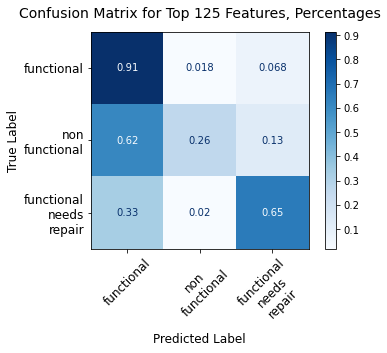

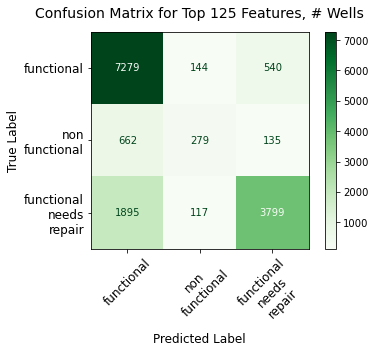

In [532]:
# Running model with summary tables for all included features 

df_n, X_train, clf, accuracy, jaccard, \
clf_feat_imps, clf_params, \
imp_table, summ_imp_table = top_n_features_dt_model(df, features, features_top_n, all_model_features, n=125, p=126, 
                                                    criterion='entropy', max_depth=20, col_title_length = 7, 
                                                    random_state=123)


#### FUNDER (mult 'n's); REGION, management, payment, water_quality, quantity_group, waterpoint_type, source, extraction_type_class, permit, public_meeting, max_depth=20

In [545]:
# df = df_train1.copy()       # uncomment to reset df
df.head(3)

,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,permit,construction_year,extraction_type_class,management,payment,water_quality,quantity_group,source,waterpoint_type,status_group,pop_binned
id,,,,,,,,,,,,,,,,,,,,
69572,roman,roman,none,Lake Nyasa,mnyusi_b,Iringa,Ludewa,Mundindi,True,False,1999,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,functional,"(100, 150]"
8776,grumeti,grumeti,zahanati,Lake Victoria,nyamara,Mara,Serengeti,Natta,NaN,True,2010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional,"(200, 300]"
34310,lottery_club,world_vision,kwa_mahundi,Pangani,majengo,Manyara,Simanjiro,Ngorika,True,True,2009,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,functional,"(200, 300]"


In [546]:
features = ['funder', 'management', 'region', 'payment', 'water_quality', 'permit', 'public_meeting', 
            'quantity_group', 'source', 'extraction_type_class', 'status_group',
           'waterpoint_type']

features_top_n = ['funder']

all_model_features = ['funder_duplicate', 'management', 'region', 'permit', 'public_meeting', 
                      'payment', 'water_quality', 'quantity_group', 'source', 
                      'extraction_type_class', 'status_group', 'waterpoint_type']


Accuracy score, Jaccard score, and confusion matrix for n = 50:
Run time (seconds): 0.22902170899942575

Accuracy score:  76.1952861952862
Mean Training Score: 80.74%
Mean Test Score: 76.20%
Jaccard score:  [0.68816692 0.20264317 0.58464838]
Individual feature importances--showing top 10:


,Importance
waterpoint_type_other,0.111086
quantity_group_seasonal,0.086911
quantity_group_enough,0.061936
quantity_group_insufficient,0.051103
permit_True,0.034714
source_spring,0.025519
management_vwc,0.024150
waterpoint_type_communal standpipe multiple,0.020878
payment_unknown,0.020769
funder_duplicate_other,0.020510



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
quantit,0.208769
region_,0.153724
waterpo,0.149200
funder_,0.126225
payment,0.085303
source_,0.077348
managem,0.066712
extract,0.049244
permit_,0.034714



Run time (seconds): 0.4176984160003485


Accuracy score, Jaccard score, and confusion matrix for n = 100:
Run time (seconds): 0.2992582909992052

Accuracy score:  76.51178451178451
Mean Training Score: 80.85%
Mean Test Score: 76.51%
Jaccard score:  [0.69260812 0.20518519 0.58767334]
Individual feature importances--showing top 10:


,Importance
waterpoint_type_other,0.111543
quantity_group_seasonal,0.087233
quantity_group_enough,0.062395
quantity_group_insufficient,0.050773
permit_True,0.032396
source_spring,0.024203
management_vwc,0.023592
waterpoint_type_communal standpipe multiple,0.021528
region_Iringa,0.019929
extraction_type_class_submersible,0.019721



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
quantit,0.209085
waterpo,0.150932
region_,0.150696
funder_,0.140043
payment,0.079990
source_,0.076879
managem,0.064003
extract,0.047995
permit_,0.032396



Run time (seconds): 0.4939481669989618


Accuracy score, Jaccard score, and confusion matrix for n = 125:
Run time (seconds): 0.35666775000026973

Accuracy score:  76.47138047138047
Mean Training Score: 80.85%
Mean Test Score: 76.47%
Jaccard score:  [0.69163498 0.20911128 0.58596762]
Individual feature importances--showing top 10:


,Importance
waterpoint_type_other,0.111336
quantity_group_seasonal,0.087247
quantity_group_enough,0.062080
quantity_group_insufficient,0.050528
permit_True,0.033464
source_spring,0.024736
management_vwc,0.023018
waterpoint_type_communal standpipe multiple,0.021598
extraction_type_class_submersible,0.020724
region_Iringa,0.019975



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
quantit,0.208523
waterpo,0.149925
region_,0.148063
funder_,0.144578
payment,0.078940
source_,0.076675
managem,0.063930
extract,0.048373
permit_,0.033464



Run time (seconds): 0.5684304579990567


Accuracy score, Jaccard score, and confusion matrix for n = 250:
Run time (seconds): 0.4763317500000994

Accuracy score:  76.55892255892256
Mean Training Score: 81.09%
Mean Test Score: 76.56%
Jaccard score:  [0.69229296 0.2056213  0.59075605]
Individual feature importances--showing top 10:


,Importance
waterpoint_type_other,0.111638
quantity_group_seasonal,0.087335
quantity_group_enough,0.061901
quantity_group_insufficient,0.051129
permit_True,0.030096
management_vwc,0.024371
source_spring,0.022694
waterpoint_type_communal standpipe multiple,0.020954
region_Iringa,0.019425
payment_pay per bucket,0.019351



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
quantit,0.209202
funder_,0.162218
waterpo,0.149801
region_,0.145233
payment,0.078666
source_,0.071957
managem,0.062067
extract,0.045104
permit_,0.030096



Run time (seconds): 0.7237475830006588


Accuracy score, Jaccard score, and confusion matrix for n = 500:
Run time (seconds): 0.6959248749990365

Accuracy score:  76.60606060606061
Mean Training Score: 81.08%
Mean Test Score: 76.61%
Jaccard score:  [0.69152089 0.20198171 0.59181804]
Individual feature importances--showing top 10:


,Importance
waterpoint_type_other,0.111479
quantity_group_seasonal,0.087441
quantity_group_enough,0.061750
quantity_group_insufficient,0.051009
permit_True,0.029016
management_vwc,0.023605
source_spring,0.023266
waterpoint_type_communal standpipe multiple,0.020022
payment_pay per bucket,0.019858
region_Iringa,0.019397



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
quantit,0.209075
funder_,0.173688
waterpo,0.148346
region_,0.141095
payment,0.078745
source_,0.069543
managem,0.060486
extract,0.045111
permit_,0.029016



Run time (seconds): 1.0303188340003544


TOTAL run time (seconds): 3.2928778329987836


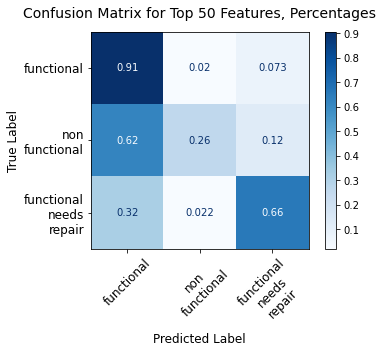

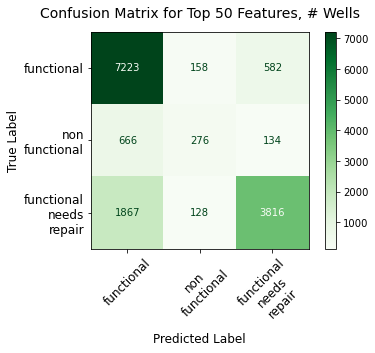

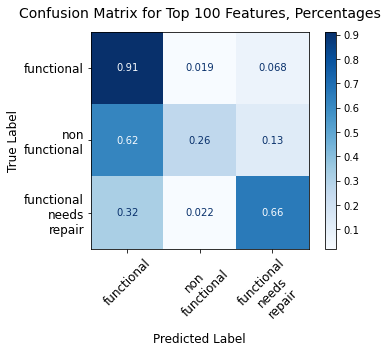

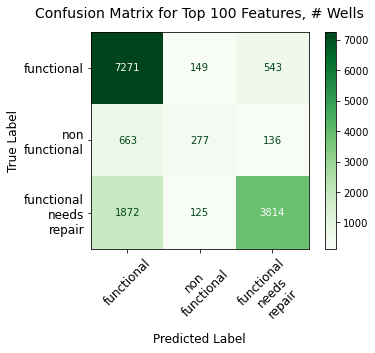

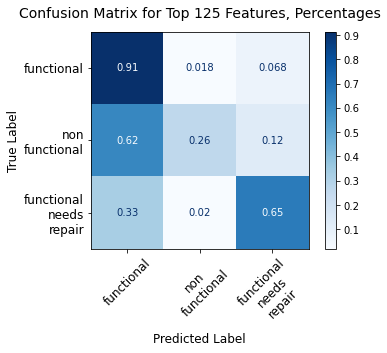

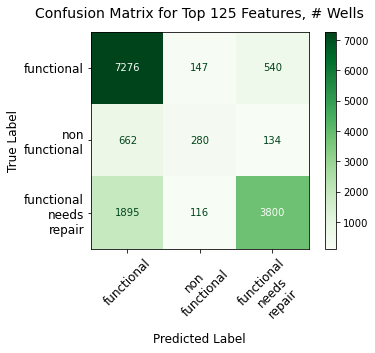

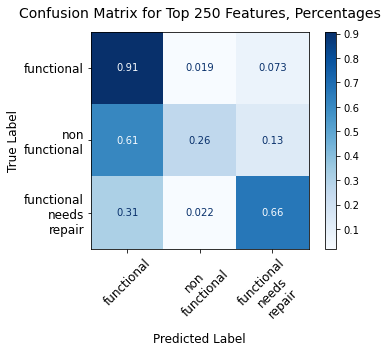

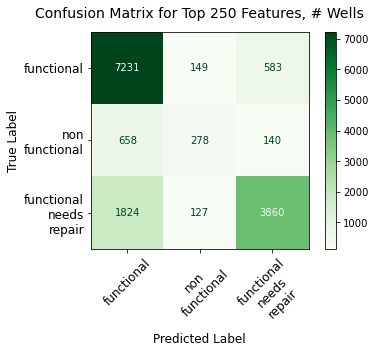

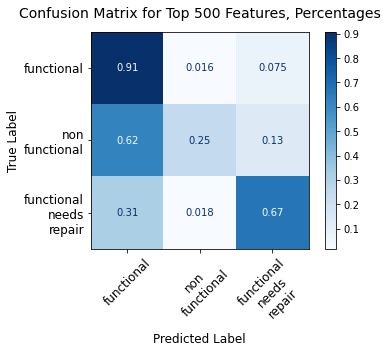

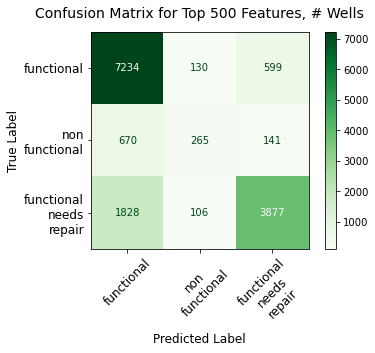

In [547]:
start = timeit.default_timer()

df_ns, X_train_vals_1, clfs_1, \
acc_scores_1, jaccard_scores_1, \
feat_importances_1, parameters_1, \
imp_tables_1, summ_imp_table_1  = top_n_multiple_dt_model(df, features, features_top_n, all_model_features, 
                                                          n_range = [50, 100, 125, 250, 500], criterion='entropy', 
                                                          col_title_length=7, max_depth=20)

end = timeit.default_timer()
print('TOTAL run time (seconds):', end-start)    


In [482]:
acc_scores_1    # n = [50, 100, 125, 250, 500]


[76.1952861952862,
 76.51178451178451,
 76.47138047138047,
 76.55892255892256,
 76.60606060606061]

In [483]:
# n = 50 for funder, management, region

importance_table(X_train_vals_1[0], clfs_1[0]).head(40)

,Importance
waterpoint_type_other,0.111086
quantity_group_seasonal,0.086911
quantity_group_enough,0.061936
quantity_group_insufficient,0.051103
permit_True,0.034714
source_spring,0.025519
management_vwc,0.024150
waterpoint_type_communal standpipe multiple,0.020878
payment_unknown,0.020769
funder_duplicate_other,0.020510


In [484]:
# n = 250 for funder, region, management

importance_table(X_train_vals_1[3], clfs_1[3]).head(20)

,Importance
waterpoint_type_other,0.111638
quantity_group_seasonal,0.087335
quantity_group_enough,0.061901
quantity_group_insufficient,0.051129
permit_True,0.030096
management_vwc,0.024371
source_spring,0.022694
waterpoint_type_communal standpipe multiple,0.020954
region_Iringa,0.019425
payment_pay per bucket,0.019351


#### FUNDER, LGA (mult 'n's); management, payment, water_quality, quantity_group, waterpoint_type, source, extraction_type_class, permit & public_meeting, max_depth=20

In [551]:
# df = df_train1.copy()
df.head(3)


,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,permit,construction_year,extraction_type_class,management,payment,water_quality,quantity_group,source,waterpoint_type,status_group,pop_binned
id,,,,,,,,,,,,,,,,,,,,
69572,roman,roman,none,Lake Nyasa,mnyusi_b,Iringa,Ludewa,Mundindi,True,False,1999,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,functional,"(100, 150]"
8776,grumeti,grumeti,zahanati,Lake Victoria,nyamara,Mara,Serengeti,Natta,NaN,True,2010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional,"(200, 300]"
34310,lottery_club,world_vision,kwa_mahundi,Pangani,majengo,Manyara,Simanjiro,Ngorika,True,True,2009,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,functional,"(200, 300]"


In [552]:
features = ['funder', 'management', 'lga', 'payment', 'water_quality', 
            'quantity_group', 'source', 'extraction_type_class', 'status_group',
           'waterpoint_type', 'permit', 'public_meeting']

features_top_n = ['funder', 'lga']

all_model_features = ['funder_duplicate', 'management', 'lga_duplicate', 'permit', 'public_meeting',
                      'payment', 'water_quality', 'quantity_group', 'source', 
                      'extraction_type_class', 'status_group', 'waterpoint_type']


Accuracy score, Jaccard score, and confusion matrix for n = 50:
Run time (seconds): 0.32889774999966903


Accuracy score:  76.01346801346801
Mean Training Score: 79.81%
Mean Test Score: 76.01%
Jaccard score:  [0.68834459 0.19112114 0.57554069]
Individual feature importances, top 10


,Importance
waterpoint_type_other,0.120131
quantity_group_seasonal,0.093963
quantity_group_enough,0.066843
quantity_group_insufficient,0.054116
waterpoint_type_communal standpipe multiple,0.023936
extraction_type_class_submersible,0.021236
payment_pay per bucket,0.020613
lga_duplicate_Bariadi,0.020504
permit_True,0.020072
funder_duplicate_government_of_tanzania,0.019476



Roll-up summary feature importance table, all features


,Importance
var_abbr,
quantit,0.224968
lga_dup,0.188334
waterpo,0.164545
funder_,0.116737
payment,0.070129
source_,0.065558
extract,0.056319
managem,0.053821
water_q,0.022624



Roll-up summary feature importances, summing up top 100 most important features ONLY:


,Importance
var_abbr,
quantit,0.224968
lga_dup,0.178932
waterpo,0.164545
funder_,0.096911
payment,0.070129
source_,0.064237
extract,0.055616
managem,0.051305
permit_,0.020072



The top 100 dummy variables contribute Importance    0.962723
dtype: float64
Run time (seconds): 0.5007132920000004


Accuracy score, Jaccard score, and confusion matrix for n = 100:
Run time (seconds): 0.5648022919995128


Accuracy score:  76.23569023569023
Mean Training Score: 79.61%
Mean Test Score: 76.24%
Jaccard score:  [0.69063058 0.2004662  0.57572469]
Individual feature importances, top 10


,Importance
waterpoint_type_other,0.124043
quantity_group_seasonal,0.096931
quantity_group_enough,0.068223
quantity_group_insufficient,0.055914
waterpoint_type_communal standpipe multiple,0.024281
lga_duplicate_Bariadi,0.021026
payment_pay per bucket,0.020831
funder_duplicate_government_of_tanzania,0.019246
extraction_type_class_submersible,0.019133
source_spring,0.018473



Roll-up summary feature importance table, all features


,Importance
var_abbr,
lga_dup,0.240245
quantit,0.231273
waterpo,0.169333
funder_,0.102980
payment,0.066089
source_,0.056821
extract,0.048442
managem,0.042083
water_q,0.017696



Roll-up summary feature importances, summing up top 100 most important features ONLY:


,Importance
var_abbr,
quantit,0.231273
lga_dup,0.191133
waterpo,0.169333
funder_,0.077398
payment,0.066089
source_,0.056096
extract,0.046657
managem,0.038274
water_q,0.013572



The top 100 dummy variables contribute Importance    0.914864
dtype: float64
Run time (seconds): 0.7623752079998667


Accuracy score, Jaccard score, and confusion matrix for n = 125:
Run time (seconds): 0.640954790998876


Accuracy score:  76.22895622895622
Mean Training Score: 79.58%
Mean Test Score: 76.23%
Jaccard score:  [0.68970381 0.20062451 0.57673267]
Individual feature importances, top 10


,Importance
waterpoint_type_other,0.124348
quantity_group_seasonal,0.096786
quantity_group_enough,0.067913
quantity_group_insufficient,0.056126
waterpoint_type_communal standpipe multiple,0.023674
lga_duplicate_Bariadi,0.021095
payment_pay per bucket,0.020288
funder_duplicate_government_of_tanzania,0.019567
extraction_type_class_submersible,0.018852
source_spring,0.018072



Roll-up summary feature importance table, all features


,Importance
var_abbr,
lga_dup,0.246554
quantit,0.231027
waterpo,0.168678
funder_,0.102175
payment,0.062603
source_,0.058762
extract,0.047465
managem,0.041150
water_q,0.017057



Roll-up summary feature importances, summing up top 100 most important features ONLY:


,Importance
var_abbr,
quantit,0.231027
lga_dup,0.192420
waterpo,0.168678
funder_,0.073910
payment,0.062603
source_,0.056316
extract,0.046488
managem,0.037201
water_q,0.014750



The top 100 dummy variables contribute Importance    0.907922
dtype: float64
Run time (seconds): 0.854316041999482


Accuracy score, Jaccard score, and confusion matrix for n = 250:
Run time (seconds): 0.847651042000507


Accuracy score:  76.26936026936026
Mean Training Score: 79.74%
Mean Test Score: 76.27%
Jaccard score:  [0.69069833 0.20496894 0.5765251 ]
Individual feature importances, top 10


,Importance
waterpoint_type_other,0.123622
quantity_group_seasonal,0.096147
quantity_group_enough,0.067524
quantity_group_insufficient,0.055637
waterpoint_type_communal standpipe multiple,0.023727
lga_duplicate_Bariadi,0.020853
payment_pay per bucket,0.019576
extraction_type_class_submersible,0.018739
funder_duplicate_government_of_tanzania,0.018450
source_spring,0.017484



Roll-up summary feature importance table, all features


,Importance
var_abbr,
lga_dup,0.239724
quantit,0.229650
waterpo,0.167815
funder_,0.115316
payment,0.062515
source_,0.055067
extract,0.047276
managem,0.041847
water_q,0.016694



Roll-up summary feature importances, summing up top 100 most important features ONLY:


,Importance
var_abbr,
quantit,0.229650
lga_dup,0.188532
waterpo,0.166473
funder_,0.073019
payment,0.062515
source_,0.052725
extract,0.046167
managem,0.037642
public_,0.012964



The top 100 dummy variables contribute Importance    0.893777
dtype: float64
Run time (seconds): 1.074095333000514


Accuracy score, Jaccard score, and confusion matrix for n = 500:
Run time (seconds): 1.1080880419995083


Accuracy score:  76.43097643097643
Mean Training Score: 79.72%
Mean Test Score: 76.43%
Jaccard score:  [0.69241639 0.20510836 0.5796989 ]
Individual feature importances, top 10


,Importance
waterpoint_type_other,0.123764
quantity_group_seasonal,0.096310
quantity_group_enough,0.067931
quantity_group_insufficient,0.055516
waterpoint_type_communal standpipe multiple,0.023667
lga_duplicate_Bariadi,0.020877
payment_pay per bucket,0.019987
funder_duplicate_government_of_tanzania,0.018823
extraction_type_class_submersible,0.018502
source_spring,0.017825



Roll-up summary feature importance table, all features


,Importance
var_abbr,
lga_dup,0.233963
quantit,0.230116
waterpo,0.168229
funder_,0.121221
payment,0.061253
source_,0.056802
extract,0.046917
managem,0.041886
water_q,0.016343



Roll-up summary feature importances, summing up top 100 most important features ONLY:


,Importance
var_abbr,
quantit,0.230116
lga_dup,0.187207
waterpo,0.168229
funder_,0.062557
payment,0.061253
source_,0.055797
extract,0.046843
managem,0.038740
water_q,0.012521



The top 100 dummy variables contribute Importance    0.886533
dtype: float64
Run time (seconds): 1.3722322499997972


TOTAL RUN TIME (seconds): 4.616867665999962


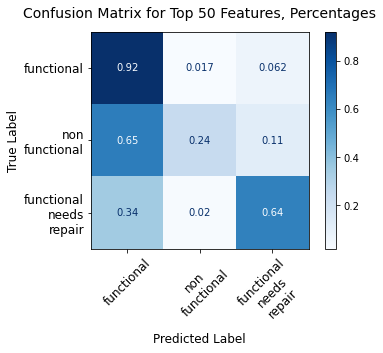

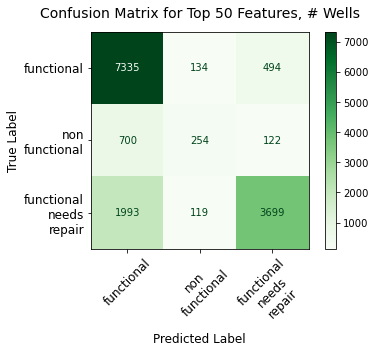

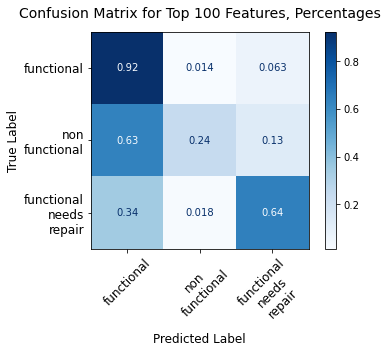

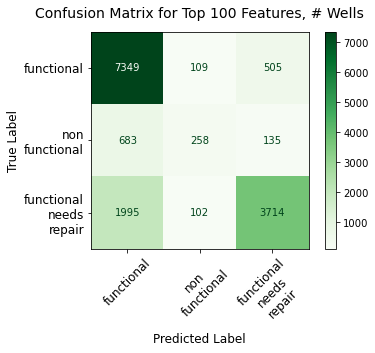

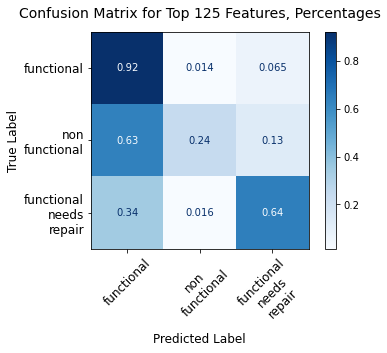

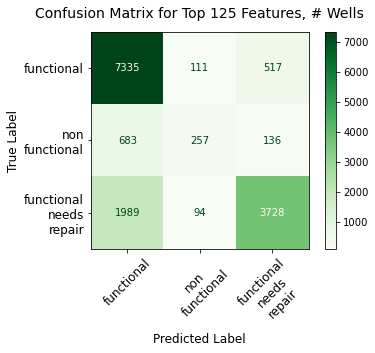

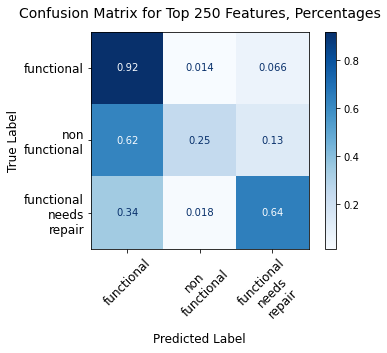

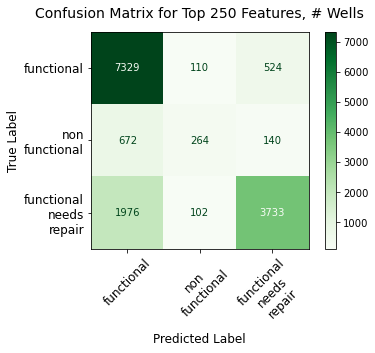

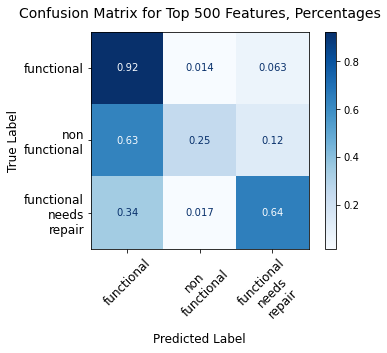

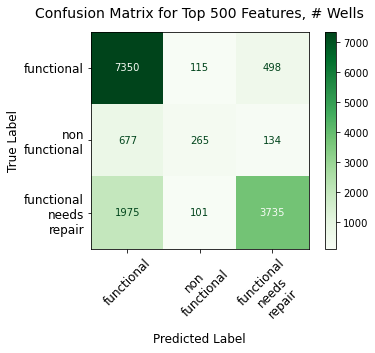

In [555]:
start = timeit.default_timer()


df_ns, X_train_vals_1a, clfs_1a, \
acc_scores_1a, jaccard_scores_1a, \
feat_importances_1a, \
parameters_1a, imp_table_1a, \
summ_imp_table_1a, \
summ_imp_table_subs_1a = top_n_multiple_dt_model_subs(df, features, features_top_n, 
                                                      all_model_features, max_depth=20,
                                                      n_range = [50, 100, 125, 250, 500], 
                                                      criterion='entropy', 
                                                      col_title_length=7, num_feats_incl=100)


end = timeit.default_timer()
print('=====================================================')
print('TOTAL RUN TIME (seconds):', end-start)    
print('=====================================================')


# High rates of false negatives for all due to class imbalances

In [556]:
acc_scores_1a    # n = [50, 100, 125, 250, 500]

[76.01346801346801,
 76.23569023569023,
 76.22895622895622,
 76.26936026936026,
 76.43097643097643]

In [557]:
# n = 50 for funder and scheme_name lists; location = lga
importance_table(X_train_vals_1a[0], clfs_1a[0]).head(30)

,Importance
waterpoint_type_other,0.120131
quantity_group_seasonal,0.093963
quantity_group_enough,0.066843
quantity_group_insufficient,0.054116
waterpoint_type_communal standpipe multiple,0.023936
extraction_type_class_submersible,0.021236
payment_pay per bucket,0.020613
lga_duplicate_Bariadi,0.020504
permit_True,0.020072
funder_duplicate_government_of_tanzania,0.019476


#### TEST:  max_depth=30 vs. 20--FUNDER, LGA, management, payment, water_quality, quantity_group, waterpoint_type, source, permit, public_meeting, extraction_type_class

In [558]:
# df = df_train1.copy()
df.head(3)

,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,permit,construction_year,extraction_type_class,management,payment,water_quality,quantity_group,source,waterpoint_type,status_group,pop_binned
id,,,,,,,,,,,,,,,,,,,,
69572,roman,roman,none,Lake Nyasa,mnyusi_b,Iringa,Ludewa,Mundindi,True,False,1999,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,functional,"(100, 150]"
8776,grumeti,grumeti,zahanati,Lake Victoria,nyamara,Mara,Serengeti,Natta,NaN,True,2010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional,"(200, 300]"
34310,lottery_club,world_vision,kwa_mahundi,Pangani,majengo,Manyara,Simanjiro,Ngorika,True,True,2009,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,functional,"(200, 300]"


In [559]:
features = ['funder', 'management', 'lga', 'payment', 'water_quality', 
            'quantity_group', 'source', 'extraction_type_class', 'status_group',
           'waterpoint_type', 'permit', 'public_meeting']

features_top_n = ['funder', 'lga']

all_model_features = ['funder_duplicate', 'management', 'lga_duplicate', 'permit', 'public_meeting',
                      'payment', 'water_quality', 'quantity_group', 'source', 
                      'extraction_type_class', 'status_group', 'waterpoint_type']

Accuracy score, Jaccard score, and confusion matrix for n = 50:
Run time (seconds): 0.3395911250008794

Accuracy score:  76.73400673400673
Mean Training Score: 82.95%
Mean Test Score: 76.73%
Jaccard score:  [0.6919187  0.20406681 0.60180587]
Individual feature importances--showing top 10:


,Importance
waterpoint_type_other,0.100652
quantity_group_seasonal,0.078590
quantity_group_enough,0.056135
quantity_group_insufficient,0.045647
permit_True,0.022441
funder_duplicate_other,0.022104
payment_pay per bucket,0.022044
public_meeting_True,0.021623
extraction_type_class_submersible,0.020731
waterpoint_type_communal standpipe multiple,0.020351



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
lga_dup,0.190497
quantit,0.188913
funder_,0.143252
waterpo,0.140964
payment,0.078069
source_,0.069887
managem,0.059427
extract,0.054575
water_q,0.030352



Run time (seconds): 0.6077303749989369


Accuracy score, Jaccard score, and confusion matrix for n = 100:
Run time (seconds): 0.6076035829992179

Accuracy score:  77.05050505050505
Mean Training Score: 82.55%
Mean Test Score: 77.05%
Jaccard score:  [0.69573662 0.21397059 0.60399939]
Individual feature importances--showing top 10:


,Importance
waterpoint_type_other,0.102075
quantity_group_seasonal,0.079760
quantity_group_enough,0.055932
quantity_group_insufficient,0.046220
payment_pay per bucket,0.020161
waterpoint_type_communal standpipe multiple,0.019836
extraction_type_class_submersible,0.019245
funder_duplicate_government_of_tanzania,0.018616
management_vwc,0.017849
lga_duplicate_Bariadi,0.017303



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
lga_dup,0.252611
quantit,0.190288
waterpo,0.142572
funder_,0.126774
payment,0.071346
source_,0.059213
managem,0.050590
extract,0.050514
water_q,0.024303



Run time (seconds): 0.8392748749993189


Accuracy score, Jaccard score, and confusion matrix for n = 125:
Run time (seconds): 0.7072522079997725

Accuracy score:  77.32659932659932
Mean Training Score: 82.47%
Mean Test Score: 77.33%
Jaccard score:  [0.69946937 0.21524664 0.60561867]
Individual feature importances--showing top 10:


,Importance
waterpoint_type_other,0.103034
quantity_group_seasonal,0.080227
quantity_group_enough,0.056916
quantity_group_insufficient,0.046386
waterpoint_type_communal standpipe multiple,0.019912
payment_pay per bucket,0.019181
funder_duplicate_government_of_tanzania,0.018460
lga_duplicate_Bariadi,0.017566
extraction_type_class_submersible,0.017442
management_vwc,0.016521



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
lga_dup,0.258260
quantit,0.192152
waterpo,0.144922
funder_,0.126467
payment,0.070124
source_,0.057893
managem,0.048724
extract,0.046902
water_q,0.024356



Run time (seconds): 0.962911124999664


Accuracy score, Jaccard score, and confusion matrix for n = 250:
Run time (seconds): 0.897101874999862

Accuracy score:  77.13804713804714
Mean Training Score: 82.61%
Mean Test Score: 77.14%
Jaccard score:  [0.69699003 0.21056548 0.60302983]
Individual feature importances--showing top 10:


,Importance
waterpoint_type_other,0.102211
quantity_group_seasonal,0.079607
quantity_group_enough,0.056176
quantity_group_insufficient,0.046068
payment_pay per bucket,0.020002
waterpoint_type_communal standpipe multiple,0.019676
funder_duplicate_government_of_tanzania,0.017926
lga_duplicate_Bariadi,0.017315
extraction_type_class_submersible,0.016628
source_spring,0.016618



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
lga_dup,0.249953
quantit,0.190402
funder_,0.144525
waterpo,0.143619
payment,0.069386
source_,0.057531
extract,0.045876
managem,0.044826
water_q,0.023012



Run time (seconds): 1.190676500000336


Accuracy score, Jaccard score, and confusion matrix for n = 500:
Run time (seconds): 1.2647637500012934

Accuracy score:  77.21885521885523
Mean Training Score: 82.70%
Mean Test Score: 77.22%
Jaccard score:  [0.69824764 0.21111111 0.60489457]
Individual feature importances--showing top 10:


,Importance
waterpoint_type_other,0.102361
quantity_group_seasonal,0.079889
quantity_group_enough,0.056477
quantity_group_insufficient,0.045968
payment_pay per bucket,0.020264
waterpoint_type_communal standpipe multiple,0.019812
funder_duplicate_government_of_tanzania,0.017926
lga_duplicate_Bariadi,0.017401
source_spring,0.016877
extraction_type_class_submersible,0.016437



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
lga_dup,0.241716
quantit,0.190901
funder_,0.153671
waterpo,0.143235
payment,0.069081
source_,0.058506
extract,0.045458
managem,0.044946
water_q,0.022950



Run time (seconds): 1.6242461669990007


TOTAL RUN TIME (seconds): 5.281245875001332


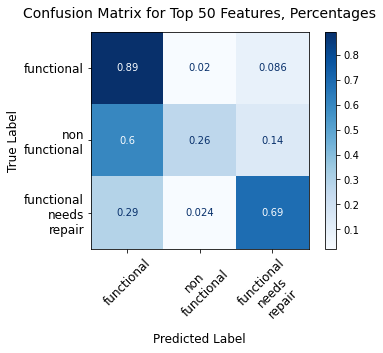

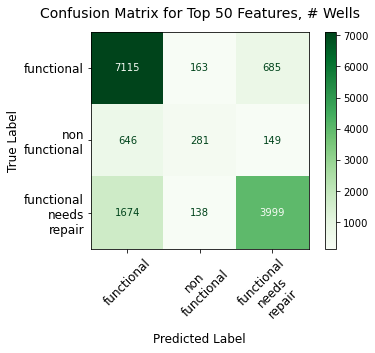

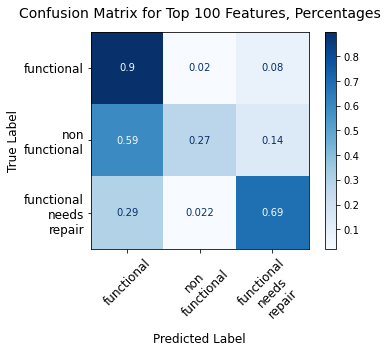

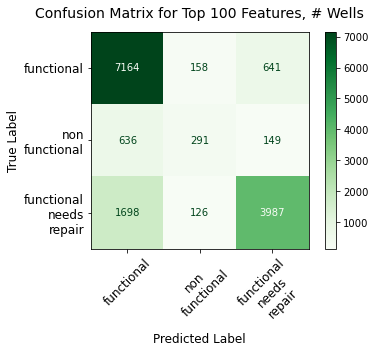

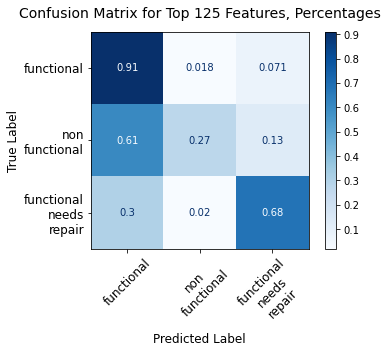

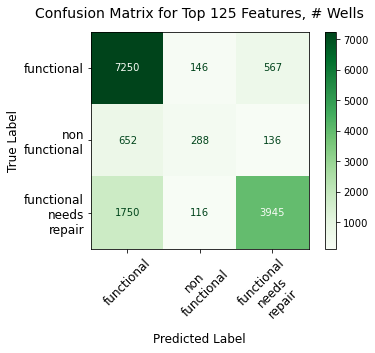

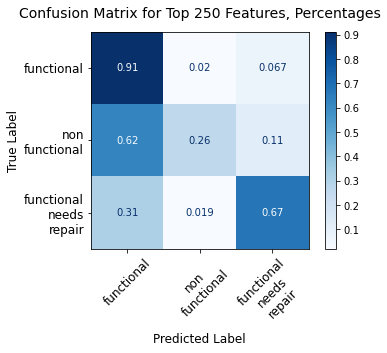

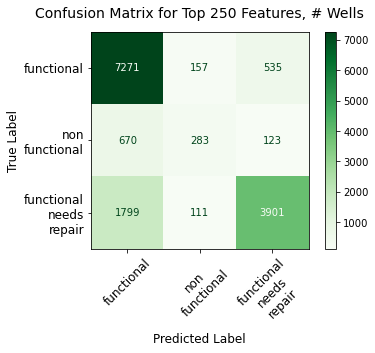

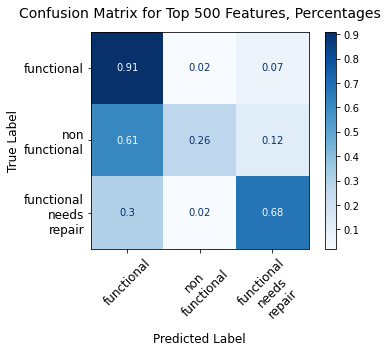

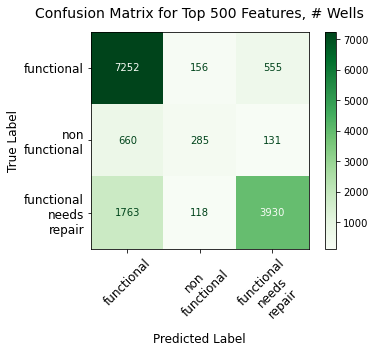

In [560]:
start = timeit.default_timer()


df_ns, X_train_vals_1a, clfs_1a, \
acc_scores_1a, jaccard_scores_1a, \
feat_importances_1a, \
parameters_1a, imp_table_1a, \
summ_imp_table_1a = top_n_multiple_dt_model(df, features, features_top_n, 
                                                      all_model_features, max_depth=30,
                                                      n_range = [50, 100, 125, 250, 500], 
                                                      criterion='entropy', 
                                                      col_title_length=7)


end = timeit.default_timer()
print('=====================================================')
print('TOTAL RUN TIME (seconds):', end-start)    
print('=====================================================')

# Still have high rates of false negatives

In [561]:
acc_scores_1a    # n = [50, 100, 250, 500]


[76.73400673400673,
 77.05050505050505,
 77.32659932659932,
 77.13804713804714,
 77.21885521885523]

In [562]:
summ_imp_table_1a[2]

,Importance
var_abbr,
lga_dup,0.258260
quantit,0.192152
waterpo,0.144922
funder_,0.126467
payment,0.070124
source_,0.057893
managem,0.048724
extract,0.046902
water_q,0.024356


In [563]:
# n = 250 for funder and scheme_name lists; location = lga
importance_table(X_train_vals_1a[3], clfs_1a[3]).head(30)

,Importance
waterpoint_type_other,0.102211
quantity_group_seasonal,0.079607
quantity_group_enough,0.056176
quantity_group_insufficient,0.046068
payment_pay per bucket,0.020002
waterpoint_type_communal standpipe multiple,0.019676
funder_duplicate_government_of_tanzania,0.017926
lga_duplicate_Bariadi,0.017315
extraction_type_class_submersible,0.016628
source_spring,0.016618


#### INSTALLER, REGION, management, payment, water_quality, quantity_group, waterpoint_type, source, extraction_type_class, permit, public_meeting, max_depth=20

In [566]:
df.head(3)

,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,permit,construction_year,extraction_type_class,management,payment,water_quality,quantity_group,source,waterpoint_type,status_group,pop_binned
id,,,,,,,,,,,,,,,,,,,,
69572,roman,roman,none,Lake Nyasa,mnyusi_b,Iringa,Ludewa,Mundindi,True,False,1999,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,functional,"(100, 150]"
8776,grumeti,grumeti,zahanati,Lake Victoria,nyamara,Mara,Serengeti,Natta,NaN,True,2010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional,"(200, 300]"
34310,lottery_club,world_vision,kwa_mahundi,Pangani,majengo,Manyara,Simanjiro,Ngorika,True,True,2009,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,functional,"(200, 300]"


In [567]:
features = ['installer', 'management', 'region', 'payment', 'water_quality', 
            'quantity_group', 'source', 'extraction_type_class', 'status_group',
           'waterpoint_type', 'permit', 'public_meeting']

features_top_n = ['installer']

all_model_features = ['installer_duplicate', 'management', 'region', 'permit', 'public_meeting',
                      'payment', 'water_quality', 'quantity_group', 'source', 
                      'extraction_type_class', 'status_group', 'waterpoint_type']


Accuracy score, Jaccard score, and confusion matrix for n = 50:
Run time (seconds): 0.24084470799971314


Accuracy score:  75.7104377104377
Mean Training Score: 80.13%
Mean Test Score: 75.71%
Jaccard score:  [0.68530681 0.18580834 0.57291667]
Individual feature importances, top 10


,Importance
waterpoint_type_other,0.115544
quantity_group_seasonal,0.091102
quantity_group_enough,0.063717
quantity_group_insufficient,0.052971
permit_True,0.030821
source_spring,0.024461
management_vwc,0.023841
payment_pay per bucket,0.022003
waterpoint_type_communal standpipe multiple,0.020541
extraction_type_class_submersible,0.020158



Roll-up summary feature importance table, all features


,Importance
var_abbr,
quantit,0.217142
region_,0.155917
waterpo,0.155259
install,0.115184
payment,0.082478
source_,0.077218
managem,0.066825
extract,0.048809
permit_,0.030821



Roll-up summary feature importances, summing up top 100 most important features ONLY:


,Importance
var_abbr,
quantit,0.217142
region_,0.155917
waterpo,0.154711
install,0.110499
payment,0.082478
source_,0.077218
managem,0.066299
extract,0.048809
permit_,0.030821



The top 100 dummy variables contribute Importance    0.994108
dtype: float64
Run time (seconds): 0.4201139169999806


Accuracy score, Jaccard score, and confusion matrix for n = 100:
Run time (seconds): 0.3142776659988158


Accuracy score:  75.69023569023568
Mean Training Score: 80.31%
Mean Test Score: 75.69%
Jaccard score:  [0.68553696 0.17655678 0.57405974]
Individual feature importances, top 10


,Importance
waterpoint_type_other,0.115018
quantity_group_seasonal,0.090720
quantity_group_enough,0.063292
quantity_group_insufficient,0.052385
permit_True,0.029559
source_spring,0.024215
payment_pay per bucket,0.022483
management_vwc,0.021827
waterpoint_type_communal standpipe multiple,0.020167
extraction_type_class_submersible,0.019846



Roll-up summary feature importance table, all features


,Importance
var_abbr,
quantit,0.215633
waterpo,0.154374
region_,0.148406
install,0.134992
payment,0.081657
source_,0.073908
managem,0.064575
extract,0.048134
permit_,0.029559



Roll-up summary feature importances, summing up top 100 most important features ONLY:


,Importance
var_abbr,
quantit,0.215633
waterpo,0.154261
region_,0.148406
install,0.113928
payment,0.081657
source_,0.073908
managem,0.064068
extract,0.047573
permit_,0.029559



The top 100 dummy variables contribute Importance    0.976924
dtype: float64
Run time (seconds): 0.5436225829998875


Accuracy score, Jaccard score, and confusion matrix for n = 125:
Run time (seconds): 0.37901458400119736


Accuracy score:  75.92592592592592
Mean Training Score: 80.49%
Mean Test Score: 75.93%
Jaccard score:  [0.68714609 0.1761194  0.57913392]
Individual feature importances, top 10


,Importance
waterpoint_type_other,0.115263
quantity_group_seasonal,0.090859
quantity_group_enough,0.063791
quantity_group_insufficient,0.052204
permit_True,0.028170
source_spring,0.024127
management_vwc,0.022044
payment_pay per bucket,0.021799
waterpoint_type_communal standpipe multiple,0.020674
region_Iringa,0.019598



Roll-up summary feature importance table, all features


,Importance
var_abbr,
quantit,0.216368
waterpo,0.155413
region_,0.150017
install,0.140851
payment,0.079267
source_,0.072019
managem,0.063305
extract,0.045937
water_q,0.029315



Roll-up summary feature importances, summing up top 100 most important features ONLY:


,Importance
var_abbr,
quantit,0.216368
waterpo,0.155413
region_,0.150017
install,0.114531
payment,0.079267
source_,0.070569
managem,0.062192
extract,0.045201
water_q,0.028480



The top 100 dummy variables contribute Importance    0.969547
dtype: float64
Run time (seconds): 0.5550099160009268


Accuracy score, Jaccard score, and confusion matrix for n = 250:
Run time (seconds): 0.5081081249991257


Accuracy score:  75.93265993265993
Mean Training Score: 80.55%
Mean Test Score: 75.93%
Jaccard score:  [0.68674132 0.18133935 0.57776747]
Individual feature importances, top 10


,Importance
waterpoint_type_other,0.115079
quantity_group_seasonal,0.090326
quantity_group_enough,0.063714
quantity_group_insufficient,0.052478
permit_True,0.026892
source_spring,0.024283
management_vwc,0.022703
payment_pay per bucket,0.020782
waterpoint_type_communal standpipe multiple,0.020677
region_Iringa,0.019894



Roll-up summary feature importance table, all features


,Importance
var_abbr,
quantit,0.215909
install,0.160905
waterpo,0.153243
region_,0.145450
payment,0.074018
source_,0.073104
managem,0.060718
extract,0.046048
permit_,0.026892



Roll-up summary feature importances, summing up top 100 most important features ONLY:


,Importance
var_abbr,
quantit,0.215909
waterpo,0.152667
region_,0.145450
install,0.113031
payment,0.074018
source_,0.072518
managem,0.059766
extract,0.045621
permit_,0.026892



The top 100 dummy variables contribute Importance    0.949475
dtype: float64
Run time (seconds): 0.7072478329992009


Accuracy score, Jaccard score, and confusion matrix for n = 500:
Run time (seconds): 0.7488320000011299


Accuracy score:  75.98653198653199
Mean Training Score: 80.53%
Mean Test Score: 75.99%
Jaccard score:  [0.68693524 0.18037736 0.57940312]
Individual feature importances, top 10


,Importance
waterpoint_type_other,0.115991
quantity_group_seasonal,0.091103
quantity_group_enough,0.064042
quantity_group_insufficient,0.053096
permit_True,0.026837
management_vwc,0.023632
source_spring,0.022705
waterpoint_type_communal standpipe multiple,0.020410
region_Iringa,0.019849
payment_pay per bucket,0.019814



Roll-up summary feature importance table, all features


,Importance
var_abbr,
quantit,0.217312
install,0.166970
waterpo,0.155137
region_,0.142880
payment,0.073254
source_,0.068272
managem,0.060067
extract,0.044744
water_q,0.027191



Roll-up summary feature importances, summing up top 100 most important features ONLY:


,Importance
var_abbr,
quantit,0.217312
waterpo,0.155023
region_,0.142880
install,0.103408
payment,0.073254
source_,0.067431
managem,0.059050
extract,0.044525
water_q,0.027085



The top 100 dummy variables contribute Importance    0.93414
dtype: float64
Run time (seconds): 0.9990690000013274


TOTAL RUN TIME (seconds): 3.2806962089998706


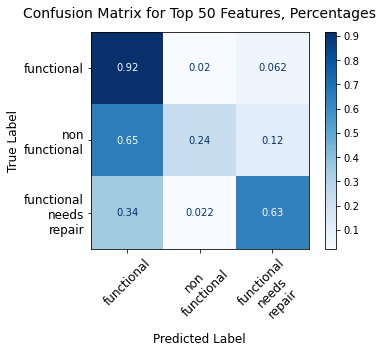

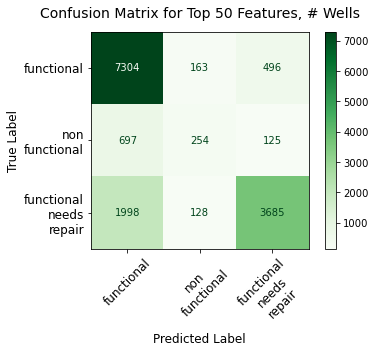

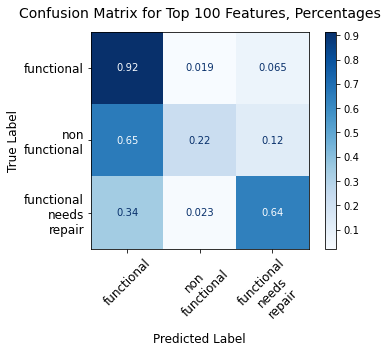

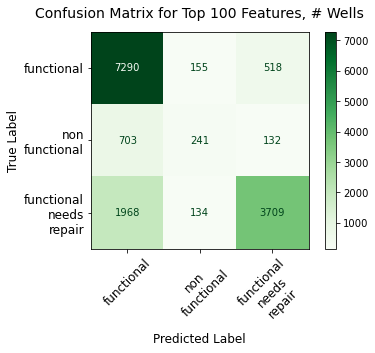

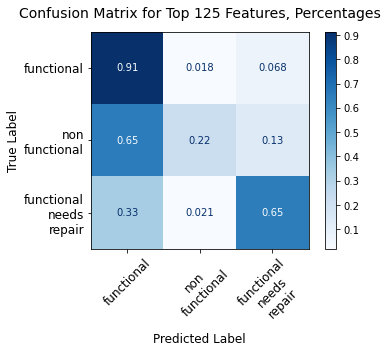

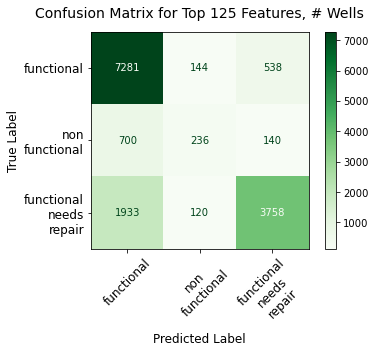

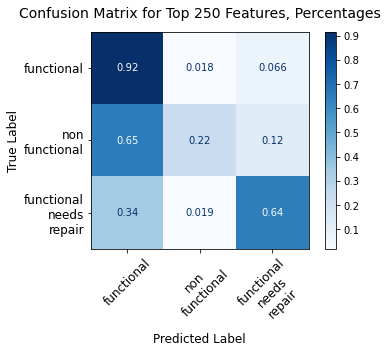

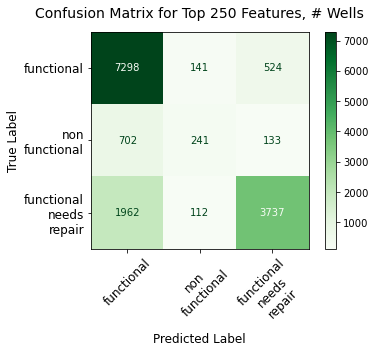

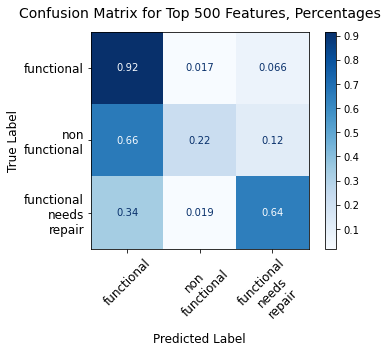

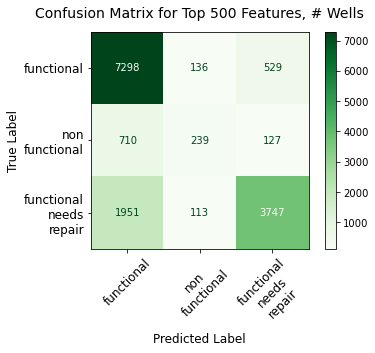

In [568]:
start = timeit.default_timer()

df_ns, X_trains, clfs, \
acc_scores, jaccard_scores, \
feat_importances, parameters, \
imp_tables, summ_imp_tables, \
summ_imp_tables_subs_fs = top_n_multiple_dt_model_subs(df, features, features_top_n, all_model_features, 
                                                       n_range = [50, 100, 125, 250, 500], criterion='entropy', 
                                                       max_depth=20, col_title_length=7, num_feats_incl=100)


end = timeit.default_timer()
print('=====================================================')
print('TOTAL RUN TIME (seconds):', end-start)    
print('=====================================================')


# Still have high rates of false negatives, as with funder
# Need to deal with imbalanced classes

In [569]:
acc_scores

[75.7104377104377,
 75.69023569023568,
 75.92592592592592,
 75.93265993265993,
 75.98653198653199]

In [570]:
summ_imp_tables[0]

,Importance
var_abbr,
quantit,0.217142
region_,0.155917
waterpo,0.155259
install,0.115184
payment,0.082478
source_,0.077218
managem,0.066825
extract,0.048809
permit_,0.030821


#### INSTALLER, LGA, management, payment, water_quality, quantity_group, waterpoint_type, source, extraction_type_class, permit, public_meeting, max_depth=20

In [571]:
df.head(3)

,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,permit,construction_year,extraction_type_class,management,payment,water_quality,quantity_group,source,waterpoint_type,status_group,pop_binned
id,,,,,,,,,,,,,,,,,,,,
69572,roman,roman,none,Lake Nyasa,mnyusi_b,Iringa,Ludewa,Mundindi,True,False,1999,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,functional,"(100, 150]"
8776,grumeti,grumeti,zahanati,Lake Victoria,nyamara,Mara,Serengeti,Natta,NaN,True,2010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional,"(200, 300]"
34310,lottery_club,world_vision,kwa_mahundi,Pangani,majengo,Manyara,Simanjiro,Ngorika,True,True,2009,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,functional,"(200, 300]"


Accuracy score, Jaccard score, and confusion matrix for n = 50:
Run time (seconds): 0.3198994579997816


Accuracy score:  75.8114478114478
Mean Training Score: 79.59%
Mean Test Score: 75.81%
Jaccard score:  [0.68493795 0.18650493 0.57453368]
Individual feature importances, top 10


,Importance
waterpoint_type_other,0.123433
quantity_group_seasonal,0.097133
quantity_group_enough,0.068473
quantity_group_insufficient,0.056391
waterpoint_type_communal standpipe multiple,0.024777
extraction_type_class_submersible,0.023957
permit_True,0.022381
lga_duplicate_Bariadi,0.021076
payment_pay per bucket,0.019104
public_meeting_True,0.018963



Roll-up summary feature importance table, all features


,Importance
var_abbr,
quantit,0.232379
lga_dup,0.186250
waterpo,0.167384
install,0.105947
payment,0.070021
source_,0.065102
managem,0.055668
extract,0.053902
permit_,0.022381



Roll-up summary feature importances, summing up top 100 most important features ONLY:


,Importance
var_abbr,
quantit,0.232379
lga_dup,0.178076
waterpo,0.167384
install,0.089832
payment,0.070021
source_,0.063555
managem,0.052694
extract,0.051708
permit_,0.022381



The top 100 dummy variables contribute Importance    0.96864
dtype: float64
Run time (seconds): 0.5038539170000149


Accuracy score, Jaccard score, and confusion matrix for n = 100:
Run time (seconds): 0.532140959001481


Accuracy score:  75.83164983164983
Mean Training Score: 78.81%
Mean Test Score: 75.83%
Jaccard score:  [0.68766282 0.19307692 0.56626506]
Individual feature importances, top 10


,Importance
waterpoint_type_other,0.128819
quantity_group_seasonal,0.100543
quantity_group_enough,0.070977
quantity_group_insufficient,0.057845
waterpoint_type_communal standpipe multiple,0.024720
lga_duplicate_Bariadi,0.022103
extraction_type_class_submersible,0.021227
payment_pay monthly,0.016553
source_spring,0.016474
permit_True,0.015957



Roll-up summary feature importance table, all features


,Importance
var_abbr,
lga_dup,0.241868
quantit,0.240242
waterpo,0.170026
install,0.089189
payment,0.060235
source_,0.059932
extract,0.048080
managem,0.043980
water_q,0.016606



Roll-up summary feature importances, summing up top 100 most important features ONLY:


,Importance
var_abbr,
quantit,0.240242
lga_dup,0.204450
waterpo,0.170026
install,0.060508
payment,0.060235
source_,0.059113
extract,0.047115
managem,0.040510
permit_,0.015957



The top 100 dummy variables contribute Importance    0.926563
dtype: float64
Run time (seconds): 0.7223455420007667


Accuracy score, Jaccard score, and confusion matrix for n = 125:
Run time (seconds): 0.6257040000000416


Accuracy score:  75.74410774410775
Mean Training Score: 78.79%
Mean Test Score: 75.74%
Jaccard score:  [0.68697108 0.19266055 0.56470036]
Individual feature importances, top 10


,Importance
waterpoint_type_other,0.129063
quantity_group_seasonal,0.100507
quantity_group_enough,0.070259
quantity_group_insufficient,0.058332
waterpoint_type_communal standpipe multiple,0.024516
lga_duplicate_Bariadi,0.022039
extraction_type_class_submersible,0.021292
payment_pay monthly,0.016545
source_spring,0.015883
management_vwc,0.015424



Roll-up summary feature importance table, all features


,Importance
var_abbr,
lga_dup,0.244761
quantit,0.239786
waterpo,0.171971
install,0.088306
source_,0.059666
payment,0.059211
extract,0.047282
managem,0.043367
water_q,0.017193



Roll-up summary feature importances, summing up top 100 most important features ONLY:


,Importance
var_abbr,
quantit,0.239786
lga_dup,0.201309
waterpo,0.171971
payment,0.059211
source_,0.058989
install,0.057211
extract,0.046994
managem,0.042145
permit_,0.015231



The top 100 dummy variables contribute Importance    0.920849
dtype: float64
Run time (seconds): 0.8202752920005878


Accuracy score, Jaccard score, and confusion matrix for n = 250:
Run time (seconds): 0.7998240840006474


Accuracy score:  75.77104377104376
Mean Training Score: 78.82%
Mean Test Score: 75.77%
Jaccard score:  [0.68662136 0.20076336 0.56495232]
Individual feature importances, top 10


,Importance
waterpoint_type_other,0.128906
quantity_group_seasonal,0.100044
quantity_group_enough,0.070369
quantity_group_insufficient,0.058029
waterpoint_type_communal standpipe multiple,0.024197
lga_duplicate_Bariadi,0.022061
extraction_type_class_submersible,0.020321
payment_pay monthly,0.016890
permit_True,0.015491
source_spring,0.015100



Roll-up summary feature importance table, all features


,Importance
var_abbr,
lga_dup,0.239935
quantit,0.239117
waterpo,0.171516
install,0.100388
payment,0.059200
source_,0.056235
extract,0.045790
managem,0.043533
water_q,0.015688



Roll-up summary feature importances, summing up top 100 most important features ONLY:


,Importance
var_abbr,
quantit,0.239117
lga_dup,0.199820
waterpo,0.171516
payment,0.059200
install,0.057953
source_,0.055594
extract,0.045514
managem,0.041067
permit_,0.015491



The top 100 dummy variables contribute Importance    0.911929
dtype: float64
Run time (seconds): 1.0721009589997266


Accuracy score, Jaccard score, and confusion matrix for n = 500:
Run time (seconds): 1.079629040999862


Accuracy score:  75.78451178451179
Mean Training Score: 78.84%
Mean Test Score: 75.78%
Jaccard score:  [0.68751745 0.19847328 0.56436728]
Individual feature importances, top 10


,Importance
waterpoint_type_other,0.129244
quantity_group_seasonal,0.100348
quantity_group_enough,0.070679
quantity_group_insufficient,0.057690
waterpoint_type_communal standpipe multiple,0.024076
lga_duplicate_Bariadi,0.022025
extraction_type_class_submersible,0.020205
payment_pay monthly,0.016278
permit_True,0.015795
source_spring,0.015642



Roll-up summary feature importance table, all features


,Importance
var_abbr,
quantit,0.239324
lga_dup,0.237023
waterpo,0.168592
install,0.107031
source_,0.058091
payment,0.057744
extract,0.046394
managem,0.041594
permit_,0.015795



Roll-up summary feature importances, summing up top 100 most important features ONLY:


,Importance
var_abbr,
quantit,0.239324
lga_dup,0.198097
waterpo,0.168592
payment,0.057744
source_,0.056184
install,0.054417
extract,0.046234
managem,0.039194
permit_,0.015795



The top 100 dummy variables contribute Importance    0.901557
dtype: float64
Run time (seconds): 1.3474079580009857


TOTAL RUN TIME (seconds): 4.5229618749999645


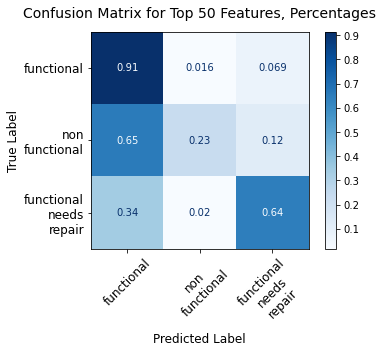

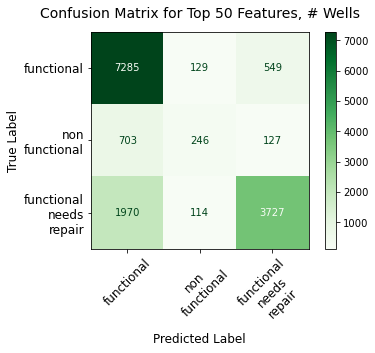

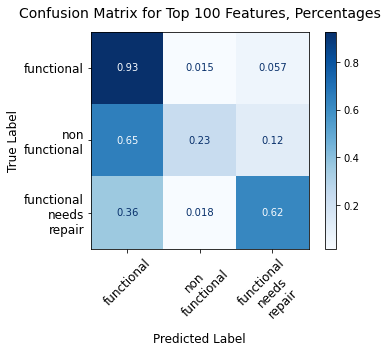

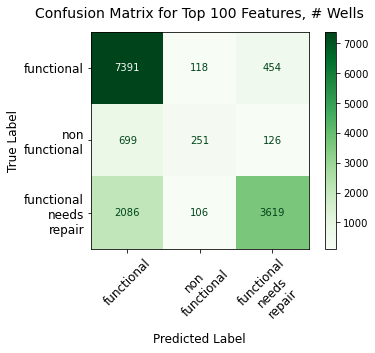

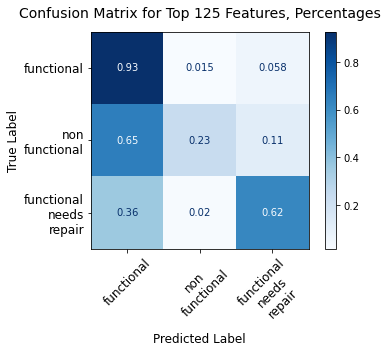

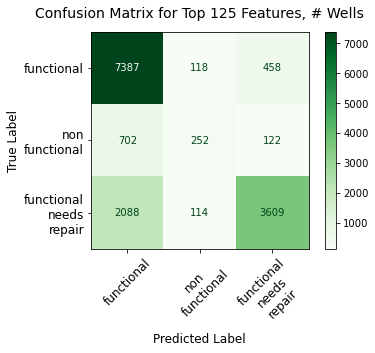

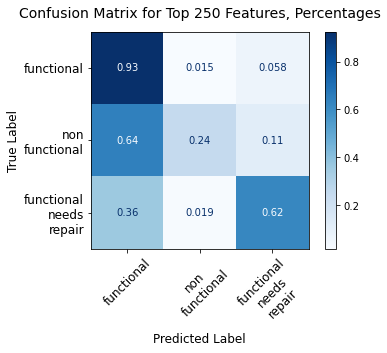

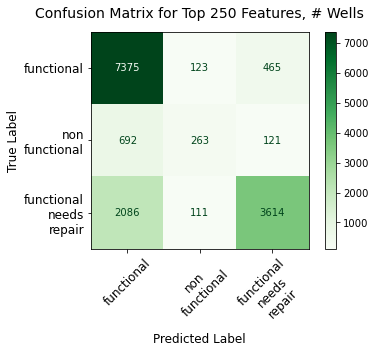

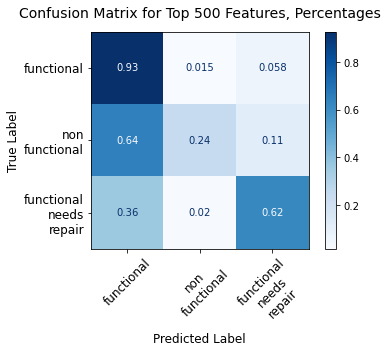

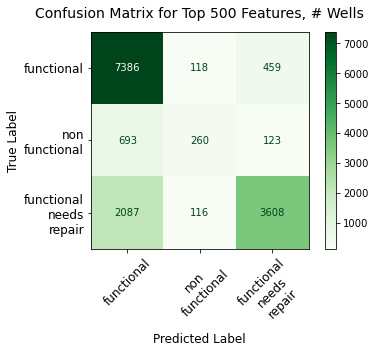

In [572]:
features = ['installer', 'management', 'lga', 'payment', 'water_quality', 
            'quantity_group', 'source', 'extraction_type_class', 'status_group',
           'waterpoint_type', 'permit', 'public_meeting']

features_top_n = ['installer', 'lga']

all_model_features = ['installer_duplicate', 'lga_duplicate', 'permit', 'public_meeting',
                      'payment', 'water_quality', 'quantity_group', 'source', 'management', 
                      'extraction_type_class', 'status_group', 'waterpoint_type']


start = timeit.default_timer()

df_ns, X_train_vals_3, clfs_3, accs_3, \
js_3, feat_imp_3, \
params_3, imp_tables_3, \
sum_imps_3, sum_sub_imps_3 = top_n_multiple_dt_model_subs(df, features, features_top_n, 
                                                          all_model_features, max_depth=20,
                                                          n_range = [50, 100, 125, 250, 500], 
                                                          criterion='entropy', col_title_length=7, 
                                                          num_feats_incl=100)


end = timeit.default_timer()
print('=====================================================')
print('TOTAL RUN TIME (seconds):', end-start)    
print('=====================================================')


# Mediocre accuracy and continued poor performance on false negatives
# Need to address class imbalances

In [573]:
accs_3


[75.8114478114478,
 75.83164983164983,
 75.74410774410775,
 75.76430976430977,
 75.8114478114478]

In [574]:
# n = 50 for funder and scheme_name lists; location = lga

importance_table(X_train_vals_3[0], clfs_3[0]).head(20)

,Importance
waterpoint_type_other,0.123433
quantity_group_seasonal,0.097133
quantity_group_enough,0.068473
quantity_group_insufficient,0.056391
waterpoint_type_communal standpipe multiple,0.024777
extraction_type_class_submersible,0.023957
permit_True,0.022381
lga_duplicate_Bariadi,0.021076
payment_pay per bucket,0.019104
public_meeting_True,0.018963


In [575]:
# n = 500 for funder and scheme_name lists; location = lga

importance_table(X_train_vals_3[3], clfs_3[3]).head(20)

,Importance
waterpoint_type_other,0.128906
quantity_group_seasonal,0.100044
quantity_group_enough,0.070369
quantity_group_insufficient,0.058029
waterpoint_type_communal standpipe multiple,0.024197
lga_duplicate_Bariadi,0.022061
extraction_type_class_submersible,0.020321
payment_pay monthly,0.016890
permit_True,0.015491
source_spring,0.015100


### Commentary

#### Need to address class imbalances
Errors predicting wells that are non-functional or needing repair are very high with the existing (unbalanced) dataset.  Before continuing with modeling, need to address these imbalances.

#### Decision tree modeling results before addressing imbalanced classes
* **Funder vs. installer**:  As described above, results from the first three model sets suggest that 'funder' gives slightly higher accuracy values, all other things held equal.
* **Choice of 'n' values**:  
  * Generally, the higher the 'n' value, the more accurate the classification across all classes, but more dummy variables can lead to a risk of overfitting.  
  * Initially, I had set 'n' anywhere from 50 to 2000, but have found that higher n's don't always yield better accuracies, and so most of my models going forward will use a range of 'n's between 50 and 250.
  * In the range of 50-250, optimal 'n's from an accuracy standpoint are usually between 50 and 250, with a sweet spot around 50-125.  These 'n' values also seem to produce lower rates of errors marking non-functional wells or wells needed repair as 'functional'.  
  * For single runs, I've decided to set n=125.  
* **Political geographic features**:  As described above (before hyperparameter tuning section), I decided to use 'lga' as my default political geographic parameter, since it gives slightly better results than 'region' and better results than any other political geographic feature.  
  * 'LGA' (Local Government Authority) seem to perform better than other geopolitical locators (e.g., basin, district_code, ward, subvillage).  
  * The difference between LGA and Region may be due to the fact that there are multiple LGAs per region, so there are more LGA values than Region values.  
  * However, the more granular (more numerous) features 'ward' and 'subvillage' give poorer performance than do region or LGA.  
  * Basin also has suboptimal performance relative to region and LGA. 
* **Waterpoint management**:  There are at least four different features associated with management of a waterpoint.  In reviewing these values, I felt that 'management' would be the best one to use.  
  * 'Management' seems slightly more descriptive than 'scheme_management' or 'management_group'.  
  * While 'scheme_name' is meant to give the actual name of the group managing a specific waterpoint, there are many problems with the data, including values missing for over 40% of waterpoints, actual names for some and generic names (e.g., 'school') for others, and a lack of consistency in data entry.
* **Population**: The inclusion of population (whether original numbers or binned) seems to reduce the accuracy score in virtually every test I've done.  Thus, I will remove it for most model runs going forward.
* **Construction_year**:  In earlier modeling, this feature was associated with slightly higher accuracy scores sometimes, but worse at others.  Further, it seems to increase the number of errors marking non-functional or needs-repair wells as functional.  Thus, I'm going to eliminate construction_year from further runs.

#### Features to keep or exclude
The above decision tree model results suggest the following:
  * 'funder' has slightly more importance than 'installer' 
  * Geographic features:
    * 'region' or 'lga' give better results than the more granular features 'ward' or 'subvillage'
    * Earlier modeling not shown above indicates that 'region' and 'lga' also give better model performance than 'basin' or 'district_code'
    * 'region_code' does not perform significantly better than 'region', AND it would require an additional step for interpretation and communicating results (putting in region names for region codes)
    * 'region' vs. 'lga':
      * Interestingly, when 'funder' is used, 'lga' gives better results at lower values of 'n' (top 'n' of the features list), whereas 'region' gives better values at higher n's
      * Also interesting is that, when 'installer' is used, 'lga' gives better results across all values of 'n'
      * Given the above results, and my preference for using lower 'n' values, I'm inclined to go forward with 'lga' as my default for subsequent models
    
Based on the above, my default parameters of those discussed above will be **'funder'** (instead of 'installer'), **'lga'** (instead of 'region'), and **'management'** (instead of 'management_group' or 'scheme_management' or 'scheme_name'), and **n=125**.

#### Addressing imbalanced classes 
Because class imbalance seems to play an imporantant role in the problems of correctly predicting non-functional and functional-needing-repair wells, it's necessary to address this issue; otherwise, the model is not much good for correctly predicting the wells most in need of repair.  

There are a number of ways to address the imbalanced class issue.  I will utilize two approaches in this decision tree modeling section:  class_weight (setting class_weight='balanced' or to a dictionary of weights for the target classes) and SMOTE (Synthetic Minority Oversampling Technique). 

The class_weight argument is used when instantiating the decision tree classifier in scikit-learn, and enables us to adjust how the algorithm treats errors of different kinds.  The default value for class_weight is 'None', which basically means that classification errors are treated the same whether the error is a false negative (e.g., a non-functional well categorized as functional) or a false positive (e.g., a functional well categorized as non-functional).  However, I would argue that these errors are not equal; mis-identifying non-functional wells as functional is a bigger problem than is identifying functional wells as non-functional.  

SMOTE takes a different approach to the imbalanced classes problem by oversampling the minority classes to arrive at a distribution of classes and supporting data that are equal in size.  Having equal classes gives the algorithm a better shot at correctly predicting a new well that it has not encountered before.  To understand how to perform the SMOTE transformation, I extensively referenced Dr. Jason Brownlee's article "SMOTE for Imbalanced Classification with Python"; URL is https://machinelearningmastery.com/smote-oversampling-for-imbalanced-classification/ .

Whereas the class_weight argument is made when instantiating the decision tree classifier (after train-test-split), SMOTE resampling must be done before train-test-split.  After resampling is completed, the data is fed into the train-test-split process and modeling process as before.  

## Modeling, Decision Trees: Class_weight='balanced' 

### Functions

#### Function to perform train-test-split and producing decision tree classifier model with class_weight

In [262]:
# Function to perform train-test-split and producing decision tree classifier model with class_weight

def clf_model_cw(X, y, test_size=0.25, random_state=123, min_samples_split=2, 
                 criterion='entropy', max_depth=20, class_weight='balanced'):

    # train_test_split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)
    
    # instantiate decision tree model
    clf = DecisionTreeClassifier(class_weight=class_weight, criterion=criterion, max_depth=max_depth, 
                                 min_samples_split=min_samples_split, random_state=random_state)
    
    # fit dt model
    clf.fit(X_train, y_train)
    
    # predictions
    y_preds = clf.predict(X_test)
    
    return X_train, X_test, y_train, y_test, clf, y_preds 


#### Function for running class_weight decision tree model, one 'n' value, and producing scores, feature importance tables, and confusion matrices


In [263]:
def top_n_features_dt_model_cw(df, features, features_top_n, all_model_features, n=125, p=126,  
                               random_state=123, class_weight='balanced', criterion='entropy', 
                               max_depth=20, min_samples_split=2, col_title_length=7, cmap=plt.cm.Blues):
    
    df = df.copy()
    
    # Encode features to generate features (X) and target (y) encoded data
    df_n, X, y = top_n_encode(df, features, features_top_n, all_model_features, n=n, p=p)
    
    # Producing decision tree classifier model with X, y encoded data 
    X_train, X_test, y_train, y_test, clf, y_preds = clf_model_cw(X, y, random_state=random_state, 
                                                                  class_weight=class_weight, 
                                                                  criterion=criterion, max_depth=max_depth, 
                                                                  min_samples_split=min_samples_split)
    
    # Print accuracy and jaccard scores
#     accuracy, jaccard = acc_jaccard_scores(y_test, y_preds, jac_average=None)
    accuracy, training_score, \
    testing_score, jaccard = acc_train_test_jaccard_scores(X_train, X_test, y_train, y_test, \
                                                           clf, y_preds, jac_average=None)

    # Generate detailed feature importances table
    print("Individual feature importances--showing top 10:")
    imp_table = importance_table(X_train, clf)
    display(imp_table.head(10))
    print()
    
    # Generate high-level feature importances table
    print("Roll-up summary feature importance table, all features:")
    summ_imp_table = summary_imp_table(X_train, clf, col_title_length=7)
    display(summ_imp_table)
    print()
        
    # Plot confusion matrices
    title = "Confusion Matrix for Top {} Features".format(n)
    plot_conf_matrix_norm_abs(df_n, clf, X_test, y_test, title=title, cmap=cmap)
    
    return X_train, clf, accuracy, jaccard, clf.feature_importances_, clf.get_params(), imp_table, summ_imp_table


#### Function for running class_weight decision tree model iterating through values for 'n', each time selecting columns for top 'n' values and with one hot encoding for that 'n', with feat_importances table 

In [264]:
# NOTE:  only use when setting value to class_weight

def top_n_multiple_dt_model_cw(df, features, features_top_n, all_model_features, n_range=[25, 50, 100, 125, 250], 
                               random_state=123, criterion='gini', min_samples_split=2, max_depth=20, 
                               col_title_length = 7, class_weight='balanced'):
    
    df = df.copy()
    
    # Set up variables to hold results for each 'n' value
    X_train_vals = []
    clfs = []
    acc_scores = []
    jaccard_scores = []
    feat_importances = []
    parameters = []
    imp_tables = []
    summ_importance_tables = []
    
    # Create iterative loop
    for n in n_range:
        
        df1 = df.copy()
        print('Accuracy score, Jaccard score, and confusion matrix for n = {}:'.format(n))
        
        X_train, clf, acc, js, \
        feat_imp, params, \
        imp_table, summ_imp_table = top_n_features_dt_model_cw(df1, features=features, features_top_n=features_top_n, 
                                                               n=n, p=n+1, all_model_features=all_model_features, 
                                                               random_state=random_state, criterion=criterion, 
                                                               min_samples_split=min_samples_split, 
                                                               max_depth=max_depth, col_title_length=col_title_length, 
                                                               class_weight=class_weight)
        
        X_train_vals.append(X_train)
        clfs.append(clf)
        acc_scores.append(acc)
        jaccard_scores.append(js)
        feat_importances.append(feat_imp)
        parameters.append(params)
        imp_tables.append(imp_table)
        summ_importance_tables.append(summ_imp_table)
        
        print()
    
    return X_train_vals, clfs, acc_scores, jaccard_scores, feat_importances, \
           parameters, imp_tables, summ_importance_tables


### Class_weight='balanced' models

#### FUNDER, LGA (multiple 'n' values); payment, water_quality, quantity_group, waterpoint_type, source, extraction_type_class, permit, public_meeting; max_depth=20 -->class_weight='balanced'

In [265]:
df.head(3)


,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,permit,construction_year,extraction_type_class,management,payment,water_quality,quantity_group,source,waterpoint_type,status_group,pop_binned
id,,,,,,,,,,,,,,,,,,,,
69572,roman,roman,none,Lake Nyasa,mnyusi_b,Iringa,Ludewa,Mundindi,True,False,1999,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,functional,"(100, 150]"
8776,grumeti,grumeti,zahanati,Lake Victoria,nyamara,Mara,Serengeti,Natta,NaN,True,2010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional,"(200, 300]"
34310,lottery_club,world_vision,kwa_mahundi,Pangani,majengo,Manyara,Simanjiro,Ngorika,True,True,2009,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,functional,"(200, 300]"


In [266]:
features = ['funder', 'management', 'lga', 'payment', 'water_quality', 
            'quantity_group', 'source', 'extraction_type_class', 'status_group',
           'waterpoint_type', 'permit', 'public_meeting']

features_top_n = ['funder', 'lga']

all_model_features = ['funder_duplicate', 'management', 'lga_duplicate', 'permit', 'public_meeting', 
                      'payment', 'water_quality', 'quantity_group', 'source', 
                      'extraction_type_class', 'status_group', 'waterpoint_type']


Accuracy score, Jaccard score, and confusion matrix for n = 25:
Accuracy score:  61.90572390572391
Mean Training Score: 65.35%
Mean Test Score: 61.91%
Jaccard score:  [0.52233602 0.16000837 0.55497862]
Individual feature importances--showing top 10:


,Importance
quantity_group_seasonal,0.094561
extraction_type_class_other,0.093982
quantity_group_insufficient,0.050194
quantity_group_enough,0.047716
lga_duplicate_Bariadi,0.044353
lga_duplicate_Kigoma Rural,0.039183
source_spring,0.031008
permit_True,0.023494
payment_pay per bucket,0.022644
management_vwc,0.021419



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
quantit,0.195291
lga_dup,0.190819
extract,0.134668
install,0.112389
source_,0.090313
payment,0.083101
managem,0.075591
waterpo,0.057447
permit_,0.023494




Accuracy score, Jaccard score, and confusion matrix for n = 50:
Accuracy score:  61.131313131313135
Mean Training Score: 64.22%
Mean Test Score: 61.13%
Jaccard score:  [0.51341623 0.15944084 0.54986192]
Individual feature importances--showing top 10:


,Importance
quantity_group_seasonal,0.094008
extraction_type_class_other,0.093470
quantity_group_insufficient,0.049799
quantity_group_enough,0.046719
lga_duplicate_Bariadi,0.044180
lga_duplicate_Kigoma Rural,0.036141
source_spring,0.027730
payment_pay per bucket,0.021727
installer_duplicate_dwe,0.019012
source_rainwater harvesting,0.018752



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
lga_dup,0.242033
quantit,0.193331
extract,0.135002
install,0.110162
source_,0.081279
payment,0.071029
managem,0.067079
waterpo,0.053255
water_q,0.018046




Accuracy score, Jaccard score, and confusion matrix for n = 100:
Accuracy score:  61.986531986531986
Mean Training Score: 64.86%
Mean Test Score: 61.99%
Jaccard score:  [0.52363479 0.16434893 0.55113373]
Individual feature importances--showing top 10:


,Importance
quantity_group_seasonal,0.097011
extraction_type_class_other,0.095935
quantity_group_insufficient,0.052282
quantity_group_enough,0.048838
lga_duplicate_Bariadi,0.045147
lga_duplicate_Kigoma Rural,0.036598
source_spring,0.027298
installer_duplicate_government,0.019611
payment_pay per bucket,0.018211
source_rainwater harvesting,0.017909



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
lga_dup,0.293924
quantit,0.200961
extract,0.132704
install,0.095940
source_,0.075144
payment,0.063423
managem,0.054062
waterpo,0.049574
water_q,0.013022




Accuracy score, Jaccard score, and confusion matrix for n = 125:
Accuracy score:  62.01346801346801
Mean Training Score: 64.88%
Mean Test Score: 62.01%
Jaccard score:  [0.52344003 0.16469345 0.55121876]
Individual feature importances--showing top 10:


,Importance
quantity_group_seasonal,0.097281
extraction_type_class_other,0.095708
quantity_group_insufficient,0.052021
quantity_group_enough,0.050216
lga_duplicate_Bariadi,0.045040
lga_duplicate_Kigoma Rural,0.036511
source_spring,0.027248
installer_duplicate_government,0.019071
payment_pay per bucket,0.018036
waterpoint_type_hand pump,0.017596



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
lga_dup,0.295178
quantit,0.202337
extract,0.131412
install,0.096350
source_,0.076159
payment,0.063545
managem,0.052696
waterpo,0.049344
water_q,0.011985




Accuracy score, Jaccard score, and confusion matrix for n = 250:
Accuracy score:  60.16161616161616
Mean Training Score: 63.04%
Mean Test Score: 60.16%
Jaccard score:  [0.50443641 0.16089731 0.54082895]
Individual feature importances--showing top 10:


,Importance
quantity_group_seasonal,0.095874
extraction_type_class_other,0.095160
quantity_group_insufficient,0.051823
quantity_group_enough,0.049976
lga_duplicate_Bariadi,0.044782
lga_duplicate_Kigoma Rural,0.036302
source_spring,0.024701
installer_duplicate_government,0.018743
source_rainwater harvesting,0.017661
waterpoint_type_hand pump,0.016996



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
lga_dup,0.287056
quantit,0.200475
extract,0.136636
install,0.109963
source_,0.069921
payment,0.061140
managem,0.052472
waterpo,0.049075
water_q,0.012226




TOTAL RUN TIME (seconds): 3.6673505839989957



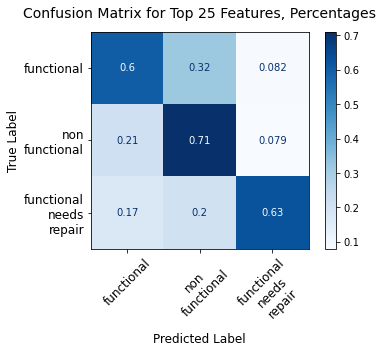

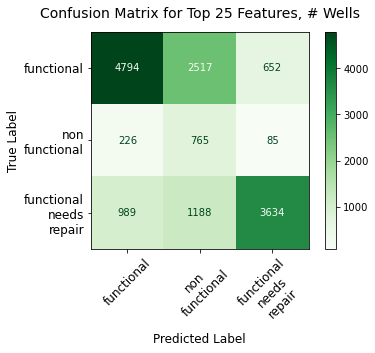

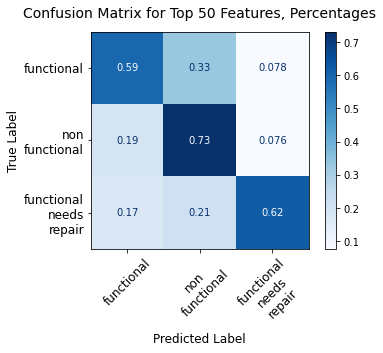

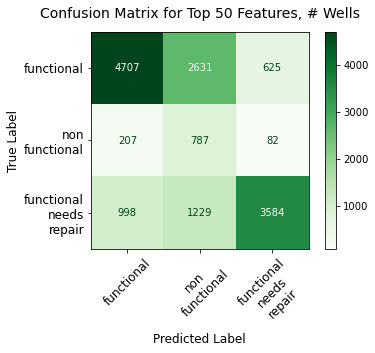

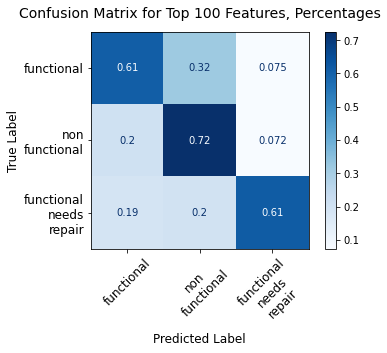

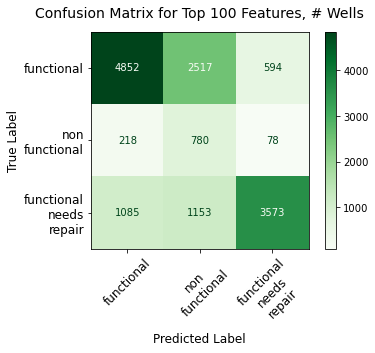

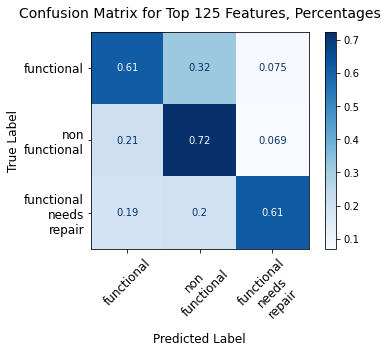

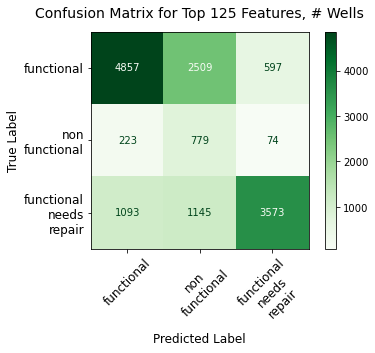

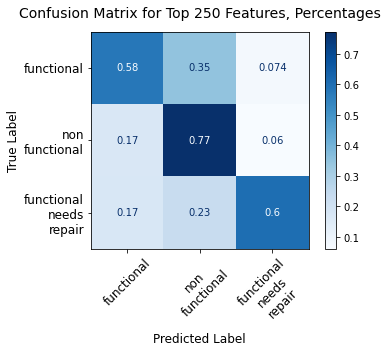

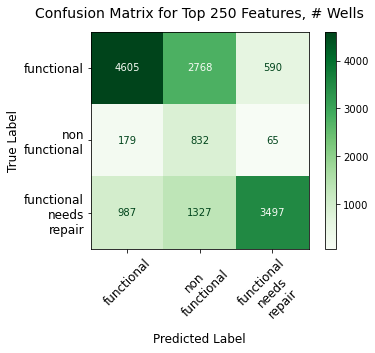

In [579]:
start = timeit.default_timer()

X_trains, clfs, acc_scores, \
jaccard_scores, \
feat_importances, parameters, \
imp_tables, summ_imp_tables = top_n_multiple_dt_model_cw(df, features, features_top_n, all_model_features, 
                                                         random_state=123, n_range = [25, 50, 100, 125, 250], 
                                                         criterion='gini', max_depth=20, min_samples_split=10,
                                                         col_title_length = 7, class_weight='balanced')



end = timeit.default_timer()
print('=====================================================')
print('TOTAL RUN TIME (seconds):', end-start)    
print('=====================================================')
print()

In [580]:
acc_scores

[61.90572390572391,
 61.131313131313135,
 61.986531986531986,
 62.01346801346801,
 60.16161616161616]

In [581]:
jaccard_scores

[array([0.52233602, 0.16000837, 0.55497862]),
 array([0.51341623, 0.15944084, 0.54986192]),
 array([0.52363479, 0.16434893, 0.55113373]),
 array([0.52344003, 0.16469345, 0.55121876]),
 array([0.50443641, 0.16089731, 0.54082895])]

In [582]:
imp_tables[3][:50]   # n= 125

,Importance
quantity_group_seasonal,0.097281
extraction_type_class_other,0.095708
quantity_group_insufficient,0.052021
quantity_group_enough,0.050216
lga_duplicate_Bariadi,0.045040
lga_duplicate_Kigoma Rural,0.036511
source_spring,0.027248
installer_duplicate_government,0.019071
payment_pay per bucket,0.018036
waterpoint_type_hand pump,0.017596


In [583]:
summ_imp_tables[0]

,Importance
var_abbr,
quantit,0.195291
lga_dup,0.190819
extract,0.134668
install,0.112389
source_,0.090313
payment,0.083101
managem,0.075591
waterpo,0.057447
permit_,0.023494


#### FUNDER (mult 'n's); REGION, management, payment, water_quality, quantity_group, waterpoint_type, source, extraction_type_class, permit, public_meeting; max_depth=20 -->class_weight='balanced'

In [584]:
# df = df_train1.copy()
df.head(3)

,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,permit,construction_year,extraction_type_class,management,payment,water_quality,quantity_group,source,waterpoint_type,status_group,pop_binned
id,,,,,,,,,,,,,,,,,,,,
69572,roman,roman,none,Lake Nyasa,mnyusi_b,Iringa,Ludewa,Mundindi,True,False,1999,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,functional,"(100, 150]"
8776,grumeti,grumeti,zahanati,Lake Victoria,nyamara,Mara,Serengeti,Natta,NaN,True,2010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional,"(200, 300]"
34310,lottery_club,world_vision,kwa_mahundi,Pangani,majengo,Manyara,Simanjiro,Ngorika,True,True,2009,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,functional,"(200, 300]"


In [585]:
features = ['funder', 'management', 'region', 'payment', 'water_quality', 
            'quantity_group', 'source', 'extraction_type_class', 'status_group',
           'waterpoint_type', 'permit', 'public_meeting']

features_top_n = ['funder']

all_model_features = ['funder_duplicate', 'management', 'region', 'permit', 'public_meeting', 
                      'payment', 'water_quality', 'quantity_group', 'source', 
                      'extraction_type_class', 'status_group', 'waterpoint_type']


Accuracy score, Jaccard score, and confusion matrix for n = 25:
Accuracy score:  67.26599326599326
Mean Training Score: 71.63%
Mean Test Score: 67.27%
Jaccard score:  [0.5766344  0.19081465 0.58163265]
Individual feature importances--showing top 10:


,Importance
quantity_group_seasonal,0.086452
extraction_type_class_other,0.084835
quantity_group_insufficient,0.047685
quantity_group_enough,0.041590
permit_True,0.034022
region_Kigoma,0.032972
source_spring,0.026554
payment_pay per bucket,0.025550
region_Iringa,0.024606
public_meeting_True,0.020653



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
region_,0.183334
quantit,0.178157
extract,0.129296
funder_,0.124660
payment,0.085925
source_,0.080726
managem,0.080292
waterpo,0.058972
permit_,0.034022




Accuracy score, Jaccard score, and confusion matrix for n = 50:
Accuracy score:  67.75084175084174
Mean Training Score: 71.82%
Mean Test Score: 67.75%
Jaccard score:  [0.59005679 0.1933466  0.57062896]
Individual feature importances--showing top 10:


,Importance
quantity_group_seasonal,0.087466
extraction_type_class_other,0.085644
quantity_group_insufficient,0.048140
quantity_group_enough,0.041852
region_Kigoma,0.034133
permit_True,0.032100
payment_pay per bucket,0.025764
source_spring,0.025706
region_Iringa,0.024611
management_water_board,0.020721



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
quantit,0.179912
region_,0.176688
funder_,0.143325
extract,0.129982
payment,0.087406
managem,0.075271
source_,0.075148
waterpo,0.059641
permit_,0.032100




Accuracy score, Jaccard score, and confusion matrix for n = 100:
Accuracy score:  64.75420875420875
Mean Training Score: 68.84%
Mean Test Score: 64.75%
Jaccard score:  [0.54913671 0.1806913  0.56901198]
Individual feature importances--showing top 10:


,Importance
quantity_group_seasonal,0.087961
extraction_type_class_other,0.086316
quantity_group_insufficient,0.048278
quantity_group_enough,0.042400
region_Kigoma,0.034204
permit_True,0.031643
source_spring,0.026963
payment_pay per bucket,0.025925
region_Iringa,0.024855
management_water_board,0.020962



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
quantit,0.181112
region_,0.170165
funder_,0.158793
extract,0.128804
payment,0.079442
source_,0.076411
managem,0.074513
waterpo,0.058906
permit_,0.031643




Accuracy score, Jaccard score, and confusion matrix for n = 125:
Accuracy score:  64.61952861952862
Mean Training Score: 68.76%
Mean Test Score: 64.62%
Jaccard score:  [0.54840113 0.17985782 0.56726457]
Individual feature importances--showing top 10:


,Importance
quantity_group_seasonal,0.087983
extraction_type_class_other,0.086337
quantity_group_insufficient,0.048290
quantity_group_enough,0.042411
region_Kigoma,0.034212
permit_True,0.030859
source_spring,0.026543
payment_pay per bucket,0.026376
region_Iringa,0.024808
management_water_board,0.020825



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
quantit,0.181163
region_,0.169687
funder_,0.162358
extract,0.128290
payment,0.079670
source_,0.075514
managem,0.074019
waterpo,0.059418
permit_,0.030859




Accuracy score, Jaccard score, and confusion matrix for n = 250:
Accuracy score:  64.68013468013469
Mean Training Score: 68.97%
Mean Test Score: 64.68%
Jaccard score:  [0.55652824 0.18015231 0.55700276]
Individual feature importances--showing top 10:


,Importance
quantity_group_seasonal,0.088135
extraction_type_class_other,0.086736
quantity_group_insufficient,0.048754
quantity_group_enough,0.042386
region_Kigoma,0.034492
permit_True,0.030372
source_spring,0.026260
payment_pay per bucket,0.025714
region_Iringa,0.024934
management_water_board,0.020547



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
quantit,0.181741
funder_,0.175515
region_,0.165643
extract,0.128993
payment,0.076977
source_,0.072367
managem,0.072190
waterpo,0.059117
permit_,0.030372




TOTAL RUN TIME (seconds): 2.7326272080008494



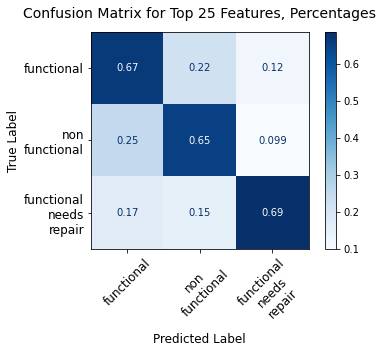

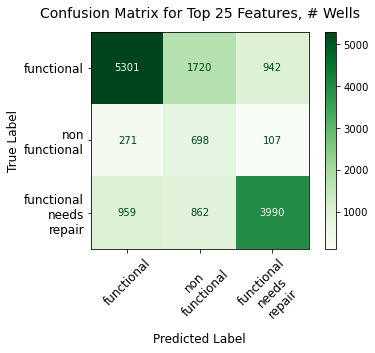

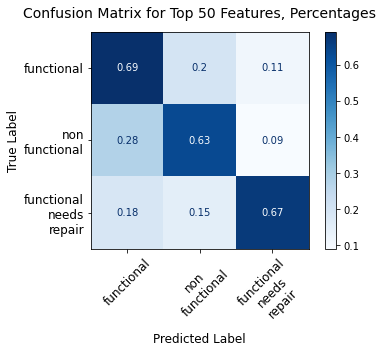

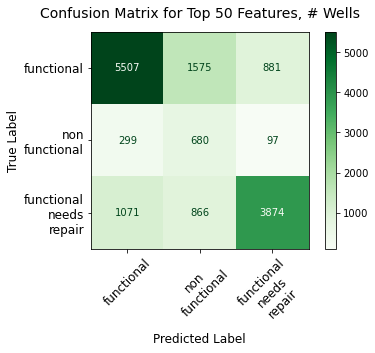

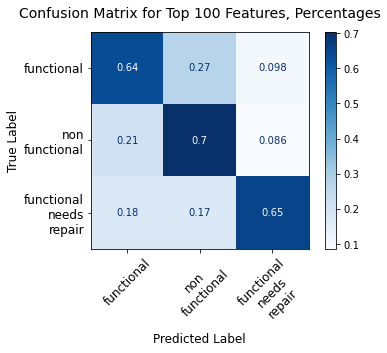

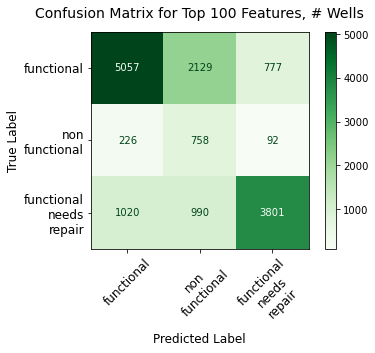

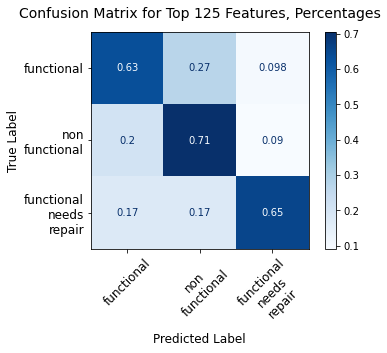

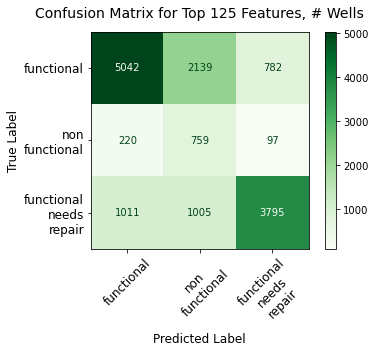

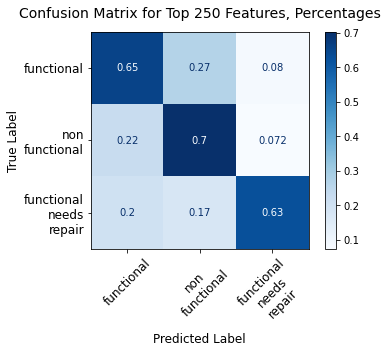

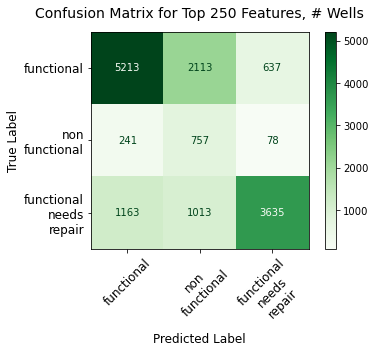

In [586]:
start = timeit.default_timer()

X_trains, clfs, acc_scores, \
jaccard_scores, \
feat_importances, parameters, \
imp_tables, summ_imp_tables = top_n_multiple_dt_model_cw(df, features, features_top_n, all_model_features, 
                                                         random_state=123, n_range = [25, 50, 100, 125, 250], 
                                                         criterion='gini', max_depth=20, min_samples_split=10,
                                                         col_title_length = 7, class_weight='balanced')

end = timeit.default_timer()
print('=====================================================')
print('TOTAL RUN TIME (seconds):', end-start)    
print('=====================================================')
print()

In [587]:
acc_scores

[67.26599326599326,
 67.75084175084174,
 64.75420875420875,
 64.61952861952862,
 64.68013468013469]

In [588]:
jaccard_scores

[array([0.5766344 , 0.19081465, 0.58163265]),
 array([0.59005679, 0.1933466 , 0.57062896]),
 array([0.54913671, 0.1806913 , 0.56901198]),
 array([0.54840113, 0.17985782, 0.56726457]),
 array([0.55652824, 0.18015231, 0.55700276])]

#### FUNDER, WARD, management, payment, water_quality, quantity_group, waterpoint_type, source, extraction_type_class, permit, public_meeting, max_depth=20

In [589]:
# df = df_train1.copy()
df.head(3)

,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,permit,construction_year,extraction_type_class,management,payment,water_quality,quantity_group,source,waterpoint_type,status_group,pop_binned
id,,,,,,,,,,,,,,,,,,,,
69572,roman,roman,none,Lake Nyasa,mnyusi_b,Iringa,Ludewa,Mundindi,True,False,1999,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,functional,"(100, 150]"
8776,grumeti,grumeti,zahanati,Lake Victoria,nyamara,Mara,Serengeti,Natta,NaN,True,2010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional,"(200, 300]"
34310,lottery_club,world_vision,kwa_mahundi,Pangani,majengo,Manyara,Simanjiro,Ngorika,True,True,2009,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,functional,"(200, 300]"


In [590]:
features = ['funder', 'management', 'ward', 'payment', 'water_quality', 
            'quantity_group', 'source', 'extraction_type_class', 'status_group',
           'waterpoint_type', 'permit', 'public_meeting']

features_top_n = ['funder', 'ward']

all_model_features = ['funder_duplicate', 'management', 'ward_duplicate', 'permit', 'public_meeting',
                      'payment', 'water_quality', 'quantity_group', 'source', 
                      'extraction_type_class', 'status_group', 'waterpoint_type']

Accuracy score, Jaccard score, and confusion matrix for n = 25:
Accuracy score:  66.24242424242425
Mean Training Score: 71.59%
Mean Test Score: 66.24%
Jaccard score:  [0.56773308 0.18054795 0.56377929]
Individual feature importances--showing top 10:


,Importance
quantity_group_seasonal,0.082397
extraction_type_class_other,0.074224
permit_True,0.044855
quantity_group_enough,0.044223
quantity_group_insufficient,0.043218
payment_pay per bucket,0.029590
payment_pay monthly,0.028578
public_meeting_True,0.028493
source_spring,0.027812
management_vwc,0.026720



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
quantit,0.175723
funder_,0.165148
extract,0.119457
payment,0.115797
source_,0.112360
managem,0.098371
waterpo,0.071199
permit_,0.044855
water_q,0.036740




Accuracy score, Jaccard score, and confusion matrix for n = 50:
Accuracy score:  64.9023569023569
Mean Training Score: 69.65%
Mean Test Score: 64.90%
Jaccard score:  [0.57165404 0.16747019 0.53574127]
Individual feature importances--showing top 10:


,Importance
quantity_group_seasonal,0.087239
extraction_type_class_other,0.078344
quantity_group_enough,0.046403
quantity_group_insufficient,0.045580
permit_True,0.037972
source_spring,0.025146
payment_pay monthly,0.024467
source_machine dbh,0.023842
public_meeting_True,0.023700
payment_pay per bucket,0.023166



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
funder_,0.185858
quantit,0.185400
extract,0.114731
source_,0.103870
payment,0.101145
managem,0.087070
waterpo,0.066055
ward_du,0.062327
permit_,0.037972




Accuracy score, Jaccard score, and confusion matrix for n = 100:
Accuracy score:  64.57239057239057
Mean Training Score: 69.37%
Mean Test Score: 64.57%
Jaccard score:  [0.57356189 0.16933916 0.53006475]
Individual feature importances--showing top 10:


,Importance
quantity_group_seasonal,0.085218
extraction_type_class_other,0.076664
quantity_group_enough,0.045836
quantity_group_insufficient,0.044841
permit_True,0.031241
source_spring,0.024528
payment_pay monthly,0.023763
payment_pay per bucket,0.023045
waterpoint_type_communal standpipe,0.022278
source_machine dbh,0.022159



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
funder_,0.201609
quantit,0.181972
extract,0.113520
source_,0.098829
payment,0.094822
managem,0.080067
ward_du,0.078373
waterpo,0.067072
water_q,0.031685




Accuracy score, Jaccard score, and confusion matrix for n = 125:
Accuracy score:  66.33670033670033
Mean Training Score: 70.95%
Mean Test Score: 66.34%
Jaccard score:  [0.57926894 0.17868163 0.54704756]
Individual feature importances--showing top 10:


,Importance
quantity_group_seasonal,0.084658
extraction_type_class_other,0.076341
quantity_group_enough,0.045212
quantity_group_insufficient,0.044415
permit_True,0.032804
source_spring,0.025122
payment_pay monthly,0.024266
ward_duplicate_other,0.022653
waterpoint_type_communal standpipe,0.022121
source_machine dbh,0.022059



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
funder_,0.201895
quantit,0.180337
extract,0.111555
source_,0.096665
payment,0.095018
ward_du,0.091456
managem,0.075545
waterpo,0.065725
permit_,0.032804




Accuracy score, Jaccard score, and confusion matrix for n = 250:
Accuracy score:  67.21885521885523
Mean Training Score: 72.34%
Mean Test Score: 67.22%
Jaccard score:  [0.58810163 0.18504902 0.54400473]
Individual feature importances--showing top 10:


,Importance
quantity_group_seasonal,0.084181
extraction_type_class_other,0.075683
quantity_group_enough,0.044832
quantity_group_insufficient,0.044032
permit_True,0.028799
ward_duplicate_other,0.025377
source_spring,0.024236
waterpoint_type_communal standpipe,0.023206
payment_pay monthly,0.021870
public_meeting_True,0.021781



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
funder_,0.200080
quantit,0.178109
ward_du,0.125840
extract,0.111209
source_,0.095947
payment,0.089338
managem,0.065552
waterpo,0.058674
permit_,0.028799




TOTAL RUN TIME (seconds): 3.465325250001115



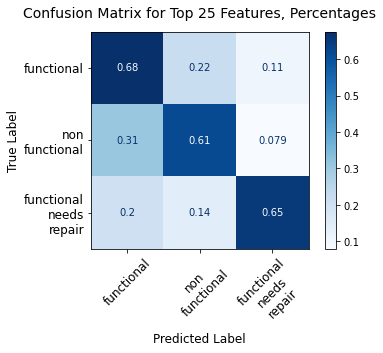

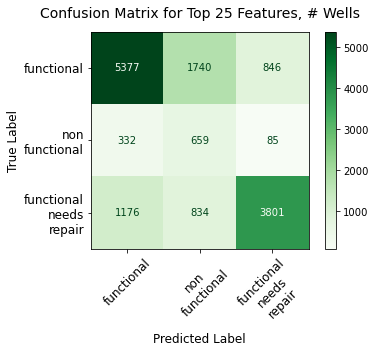

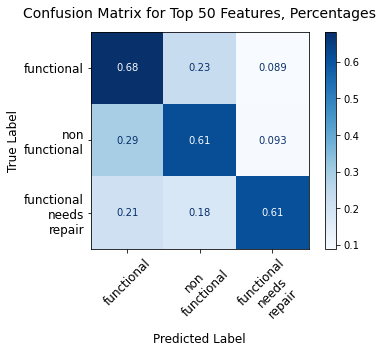

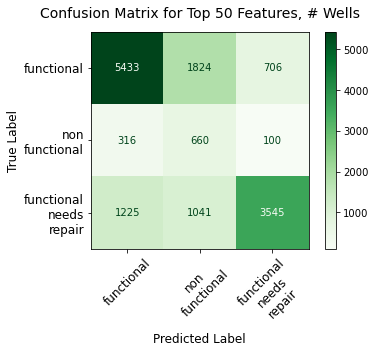

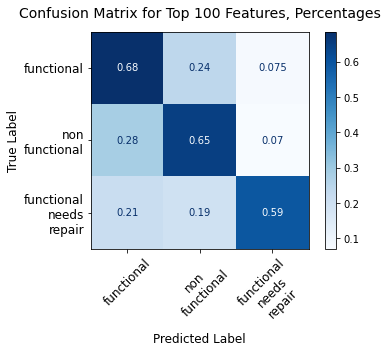

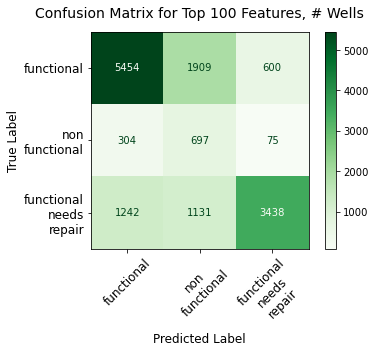

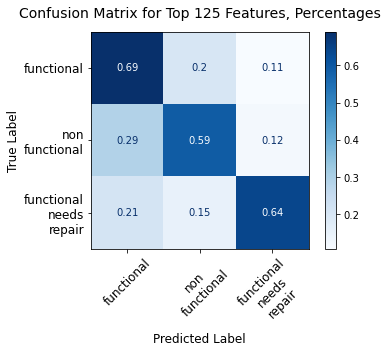

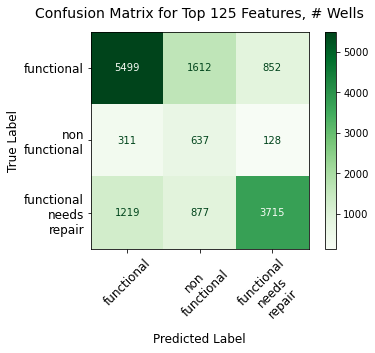

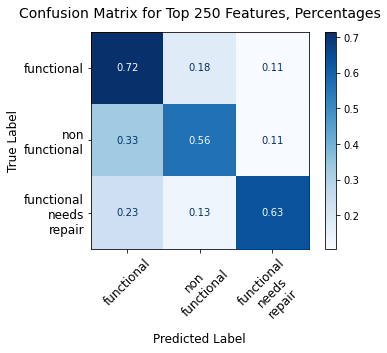

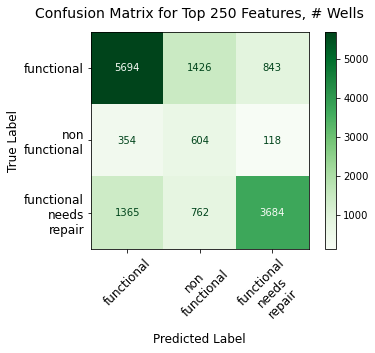

In [591]:
start = timeit.default_timer()


X_trains, clfs, acc_scores, \
jaccard_scores, \
feat_importances, parameters, \
imp_tables, summ_imp_tables = top_n_multiple_dt_model_cw(df, features, features_top_n, 
                                                      all_model_features, random_state=123,
                                                      n_range = [25, 50, 100, 125, 250], 
                                                      criterion='entropy', max_depth=20, 
                                                      col_title_length = 7, class_weight='balanced')


end = timeit.default_timer()
print('=====================================================')
print('TOTAL RUN TIME (seconds):', end-start)    
print('=====================================================')
print()

# False negative performance is worse than for LGA

In [592]:
acc_scores

[66.24242424242425,
 64.9023569023569,
 64.57239057239057,
 66.33670033670033,
 67.21885521885523]

#### FUNDER, SUBVILLAGE, management, payment, water_quality, quantity_group, waterpoint_type, source, extraction_type_class, permit, public_meeting, max_depth=20

In [593]:
features = ['funder', 'management', 'subvillage', 'payment', 'water_quality', 
            'quantity_group', 'source', 'extraction_type_class', 'status_group',
           'waterpoint_type', 'permit', 'public_meeting']

features_top_n = ['funder', 'subvillage']

all_model_features = ['funder_duplicate', 'management', 'subvillage_duplicate', 'permit', 'public_meeting',
                      'payment', 'water_quality', 'quantity_group', 'source', 
                      'extraction_type_class', 'status_group', 'waterpoint_type']

Accuracy score, Jaccard score, and confusion matrix for n = 25:
Accuracy score:  67.38720538720538
Mean Training Score: 71.80%
Mean Test Score: 67.39%
Jaccard score:  [0.5858322  0.18620286 0.56155798]
Individual feature importances--showing top 10:


,Importance
quantity_group_seasonal,0.091411
extraction_type_class_other,0.089309
quantity_group_insufficient,0.051147
quantity_group_enough,0.045434
payment_pay per bucket,0.039832
source_spring,0.037335
permit_True,0.036598
management_vwc,0.027812
source_river,0.026419
public_meeting_True,0.025622



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
quantit,0.190616
funder_,0.163399
extract,0.125018
payment,0.117905
source_,0.111165
managem,0.095172
waterpo,0.066086
subvill,0.040869
permit_,0.036598




Accuracy score, Jaccard score, and confusion matrix for n = 50:
Accuracy score:  64.96969696969697
Mean Training Score: 68.38%
Mean Test Score: 64.97%
Jaccard score:  [0.5558302  0.17309698 0.55158443]
Individual feature importances--showing top 10:


,Importance
quantity_group_seasonal,0.097404
extraction_type_class_other,0.095191
quantity_group_insufficient,0.054408
quantity_group_enough,0.048433
source_spring,0.037734
payment_pay per bucket,0.035866
permit_True,0.032207
funder_duplicate_dwsp,0.025063
source_river,0.024270
management_vwc,0.022675



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
quantit,0.203041
funder_,0.190044
extract,0.124154
payment,0.108413
source_,0.104136
managem,0.084983
waterpo,0.068088
subvill,0.041675
permit_,0.032207




Accuracy score, Jaccard score, and confusion matrix for n = 100:
Accuracy score:  63.39393939393939
Mean Training Score: 67.20%
Mean Test Score: 63.39%
Jaccard score:  [0.55064655 0.16578157 0.53722846]
Individual feature importances--showing top 10:


,Importance
quantity_group_seasonal,0.096934
extraction_type_class_other,0.094249
quantity_group_insufficient,0.053476
quantity_group_enough,0.047809
source_spring,0.035879
payment_pay per bucket,0.034916
permit_True,0.031941
funder_duplicate_dwsp,0.024741
source_river,0.023459
payment_pay monthly,0.021280



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
funder_,0.206435
quantit,0.201059
extract,0.121432
payment,0.103499
source_,0.100033
managem,0.076442
waterpo,0.065223
subvill,0.054829
permit_,0.031941




Accuracy score, Jaccard score, and confusion matrix for n = 125:
Accuracy score:  63.68350168350169
Mean Training Score: 67.76%
Mean Test Score: 63.68%
Jaccard score:  [0.55697288 0.16800567 0.53127806]
Individual feature importances--showing top 10:


,Importance
quantity_group_seasonal,0.096900
extraction_type_class_other,0.094216
quantity_group_insufficient,0.053458
quantity_group_enough,0.047792
source_spring,0.035111
payment_pay per bucket,0.034404
permit_True,0.031595
funder_duplicate_dwsp,0.024706
source_river,0.023771
payment_pay monthly,0.021297



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
funder_,0.206566
quantit,0.200988
extract,0.120967
payment,0.100917
source_,0.099112
managem,0.076197
waterpo,0.065541
subvill,0.060365
permit_,0.031595




Accuracy score, Jaccard score, and confusion matrix for n = 250:
Accuracy score:  63.010101010101
Mean Training Score: 66.73%
Mean Test Score: 63.01%
Jaccard score:  [0.54559156 0.16473792 0.53603129]
Individual feature importances--showing top 10:


,Importance
quantity_group_seasonal,0.098117
extraction_type_class_other,0.095548
quantity_group_insufficient,0.054474
quantity_group_enough,0.048228
source_spring,0.034856
payment_pay per bucket,0.034672
permit_True,0.028197
funder_duplicate_dwsp,0.025200
source_river,0.023790
payment_pay monthly,0.020976



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
funder_,0.217722
quantit,0.203537
extract,0.119760
payment,0.102323
source_,0.098436
managem,0.068826
subvill,0.066605
waterpo,0.062559
permit_,0.028197




TOTAL RUN TIME (seconds): 3.797368458999699



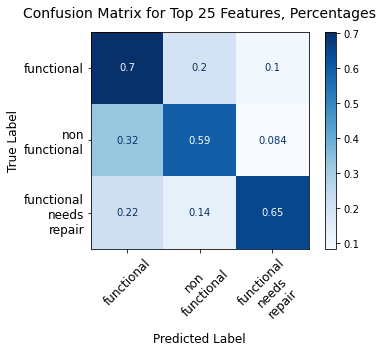

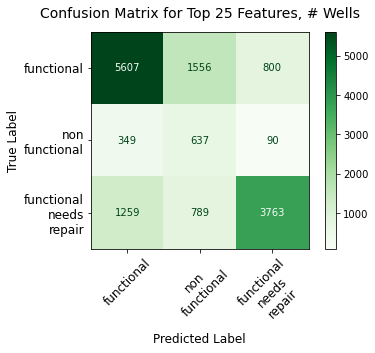

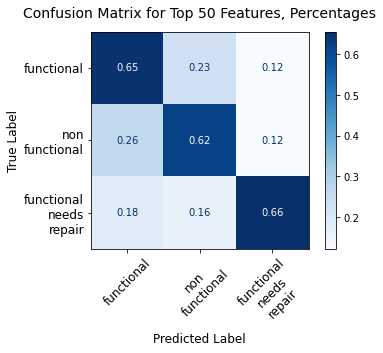

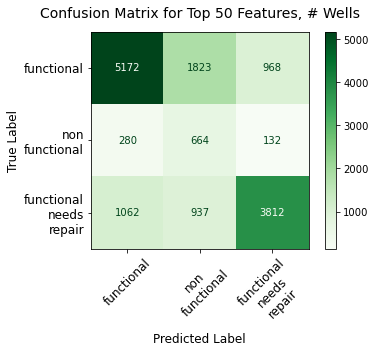

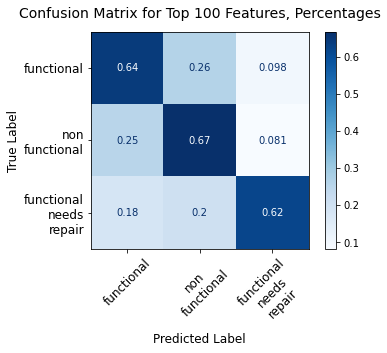

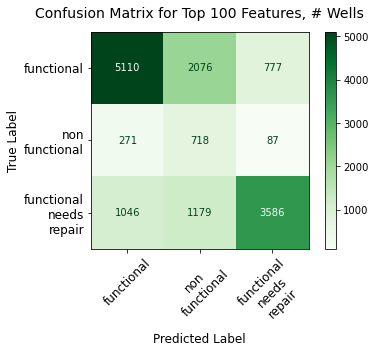

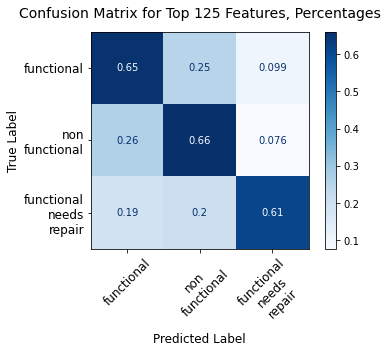

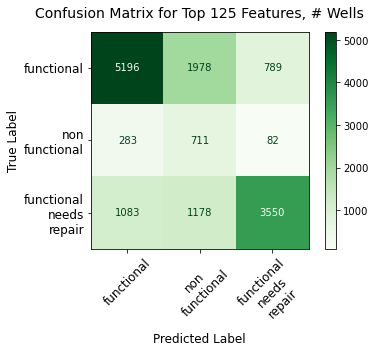

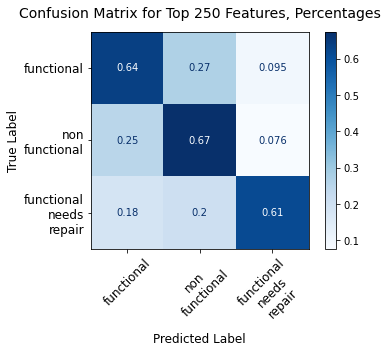

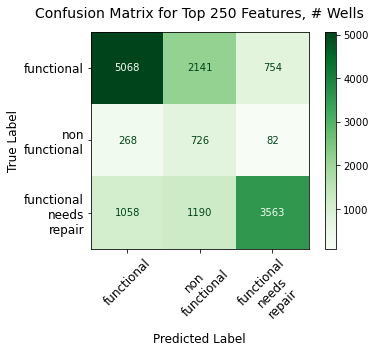

In [595]:
start = timeit.default_timer()


X_trains, clfs, acc_scores, \
jaccard_scores, \
feat_importances, parameters, \
imp_tables, summ_imp_tables = top_n_multiple_dt_model_cw(df, features, features_top_n, all_model_features, 
                                                         random_state=123, n_range = [25, 50, 100, 125, 250], 
                                                         criterion='gini', max_depth=20, min_samples_split=10,
                                                         col_title_length = 7, class_weight='balanced')


end = timeit.default_timer()
print('=====================================================')
print('TOTAL RUN TIME (seconds):', end-start)    
print('=====================================================')
print()

# Accuracies worse than for ward, though false negative performance is better than for ward

In [596]:
acc_scores

[67.38720538720538,
 64.96969696969697,
 63.39393939393939,
 63.68350168350169,
 63.010101010101]

#### INSTALLER, LGA (multiple 'n's); management, payment, water_quality, quantity_group, waterpoint_type, source, extraction_type_class, permit, public_meeting; max_depth=20; SUBSET summary table produced -->class_weight='balanced'

In [597]:
df.head(3)

,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,permit,construction_year,extraction_type_class,management,payment,water_quality,quantity_group,source,waterpoint_type,status_group,pop_binned
id,,,,,,,,,,,,,,,,,,,,
69572,roman,roman,none,Lake Nyasa,mnyusi_b,Iringa,Ludewa,Mundindi,True,False,1999,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,functional,"(100, 150]"
8776,grumeti,grumeti,zahanati,Lake Victoria,nyamara,Mara,Serengeti,Natta,NaN,True,2010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional,"(200, 300]"
34310,lottery_club,world_vision,kwa_mahundi,Pangani,majengo,Manyara,Simanjiro,Ngorika,True,True,2009,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,functional,"(200, 300]"


In [598]:
features = ['installer', 'management', 'lga', 'payment', 'water_quality', 
            'quantity_group', 'source', 'extraction_type_class', 'status_group',
           'waterpoint_type', 'permit', 'public_meeting']

features_top_n = ['installer', 'lga']

all_model_features = ['installer_duplicate', 'management', 'lga_duplicate', 'permit', 'public_meeting',
                      'payment', 'water_quality', 'quantity_group', 'source', 
                      'extraction_type_class', 'status_group', 'waterpoint_type']


Accuracy score, Jaccard score, and confusion matrix for n = 25:
Accuracy score:  61.91245791245791
Mean Training Score: 65.36%
Mean Test Score: 61.91%
Jaccard score:  [0.5219002  0.16010883 0.55557252]
Individual feature importances--showing top 10:


,Importance
quantity_group_seasonal,0.094546
extraction_type_class_other,0.093980
quantity_group_insufficient,0.050193
quantity_group_enough,0.047890
lga_duplicate_Bariadi,0.044347
lga_duplicate_Kigoma Rural,0.039049
source_spring,0.031269
permit_True,0.022821
payment_pay per bucket,0.022565
management_vwc,0.021798



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
quantit,0.195450
lga_dup,0.191342
extract,0.136107
install,0.112307
source_,0.088143
payment,0.082452
managem,0.076476
waterpo,0.057456
water_q,0.023781




Accuracy score, Jaccard score, and confusion matrix for n = 50:
Accuracy score:  61.131313131313135
Mean Training Score: 64.20%
Mean Test Score: 61.13%
Jaccard score:  [0.51363736 0.15951417 0.54972376]
Individual feature importances--showing top 10:


,Importance
quantity_group_seasonal,0.094041
extraction_type_class_other,0.093498
quantity_group_insufficient,0.049814
quantity_group_enough,0.046739
lga_duplicate_Bariadi,0.044193
lga_duplicate_Kigoma Rural,0.036680
source_spring,0.027710
payment_pay per bucket,0.021569
source_rainwater harvesting,0.018770
installer_duplicate_government,0.018708



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
lga_dup,0.244728
quantit,0.193400
extract,0.135381
install,0.109260
source_,0.081286
payment,0.070122
managem,0.065731
waterpo,0.053240
water_q,0.018209




Accuracy score, Jaccard score, and confusion matrix for n = 100:
Accuracy score:  61.993265993265986
Mean Training Score: 64.85%
Mean Test Score: 61.99%
Jaccard score:  [0.52391234 0.16452496 0.55089451]
Individual feature importances--showing top 10:


,Importance
quantity_group_seasonal,0.097093
extraction_type_class_other,0.095905
quantity_group_insufficient,0.052266
quantity_group_enough,0.048752
lga_duplicate_Bariadi,0.045133
lga_duplicate_Kigoma Rural,0.036587
source_spring,0.027083
installer_duplicate_government,0.019341
payment_pay per bucket,0.018193
source_rainwater harvesting,0.017914



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
lga_dup,0.294641
quantit,0.200941
extract,0.132229
install,0.095013
source_,0.074874
payment,0.063541
managem,0.054656
waterpo,0.050112
water_q,0.012957




Accuracy score, Jaccard score, and confusion matrix for n = 125:
Accuracy score:  61.90572390572391
Mean Training Score: 64.88%
Mean Test Score: 61.91%
Jaccard score:  [0.5222306  0.16501162 0.54911334]
Individual feature importances--showing top 10:


,Importance
quantity_group_seasonal,0.097238
extraction_type_class_other,0.095724
quantity_group_insufficient,0.052084
quantity_group_enough,0.050102
lga_duplicate_Bariadi,0.045048
lga_duplicate_Kigoma Rural,0.036767
source_spring,0.026930
installer_duplicate_government,0.018730
payment_pay per bucket,0.017937
source_rainwater harvesting,0.017749



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
lga_dup,0.296175
quantit,0.202242
extract,0.132480
install,0.095515
source_,0.075164
payment,0.062657
managem,0.053550
waterpo,0.049344
water_q,0.012081




Accuracy score, Jaccard score, and confusion matrix for n = 250:
Accuracy score:  60.15488215488215
Mean Training Score: 63.04%
Mean Test Score: 60.15%
Jaccard score:  [0.50443447 0.16115942 0.54064097]
Individual feature importances--showing top 10:


,Importance
quantity_group_seasonal,0.096315
extraction_type_class_other,0.095161
quantity_group_insufficient,0.051724
quantity_group_enough,0.049905
lga_duplicate_Bariadi,0.044783
lga_duplicate_Kigoma Rural,0.036304
source_spring,0.024884
installer_duplicate_government,0.019084
source_rainwater harvesting,0.017523
waterpoint_type_hand pump,0.017284



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
lga_dup,0.286556
quantit,0.200746
extract,0.135827
install,0.109637
source_,0.070903
payment,0.061426
managem,0.052040
waterpo,0.050061
water_q,0.011819




TOTAL RUN TIME (seconds): 3.635963875000016



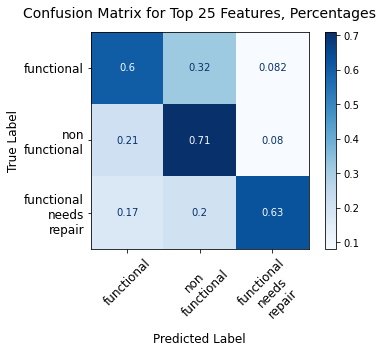

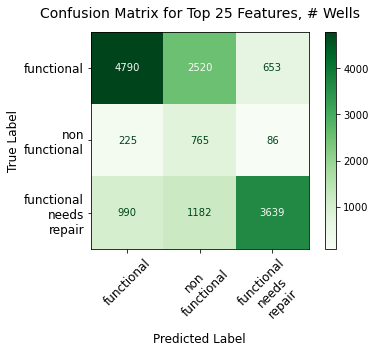

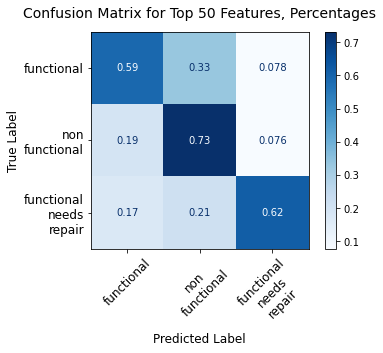

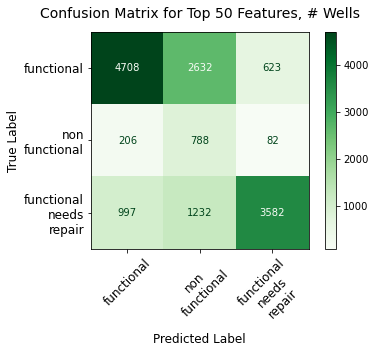

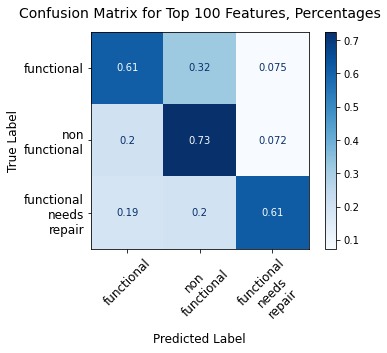

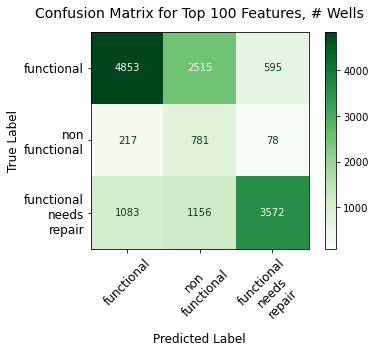

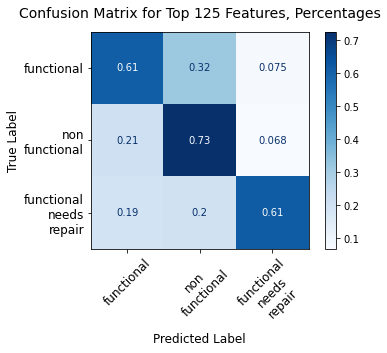

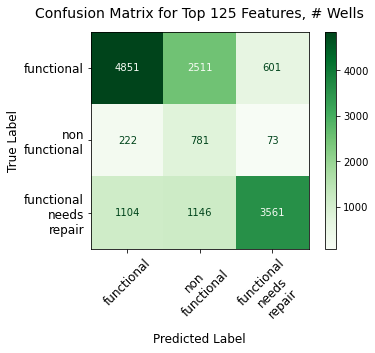

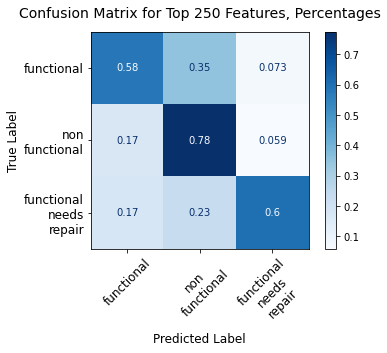

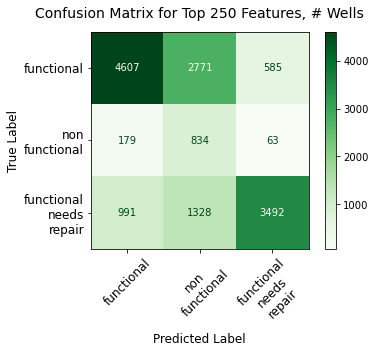

In [599]:
start = timeit.default_timer()


X_trains, clfs, acc_scores, \
jaccard_scores, \
feat_importances, parameters, \
imp_tables, summ_imp_tables = top_n_multiple_dt_model_cw(df, features, features_top_n, all_model_features, 
                                                         random_state=123, n_range = [25, 50, 100, 125, 250], 
                                                         criterion='gini', max_depth=20, min_samples_split=10,
                                                         col_title_length = 7, class_weight='balanced')


end = timeit.default_timer()
print('=====================================================')
print('TOTAL RUN TIME (seconds):', end-start)    
print('=====================================================')
print()


# Installer did worse on test scores than funder; except for n=50, installer also did not do as well with false negatives

# Last output, installer, lga, management, public_meeting, permit, max_depth=20, criterion='gini':
# [61.91245791245791,     (.21, .17)
#  61.131313131313135,     (.19, .17)
#  61.993265993265986,     (.2, .19)
#  61.90572390572391,     (.21, .19)
#  60.08754208754209]     (.17, .17)    (Best performance on false negatives of all models!!)

In [600]:
acc_scores

[61.91245791245791,
 61.131313131313135,
 61.993265993265986,
 61.90572390572391,
 60.15488215488215]

In [601]:
jaccard_scores

[array([0.5219002 , 0.16010883, 0.55557252]),
 array([0.51363736, 0.15951417, 0.54972376]),
 array([0.52391234, 0.16452496, 0.55089451]),
 array([0.5222306 , 0.16501162, 0.54911334]),
 array([0.50443447, 0.16115942, 0.54064097])]

### Modeling: class_weight='balanced' decision tree hyperparameter tuning

#### First, reset dataframe if necessary

In [602]:
# df = df_train1.copy()
df.head(3)

,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,permit,construction_year,extraction_type_class,management,payment,water_quality,quantity_group,source,waterpoint_type,status_group,pop_binned
id,,,,,,,,,,,,,,,,,,,,
69572,roman,roman,none,Lake Nyasa,mnyusi_b,Iringa,Ludewa,Mundindi,True,False,1999,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,functional,"(100, 150]"
8776,grumeti,grumeti,zahanati,Lake Victoria,nyamara,Mara,Serengeti,Natta,NaN,True,2010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional,"(200, 300]"
34310,lottery_club,world_vision,kwa_mahundi,Pangani,majengo,Manyara,Simanjiro,Ngorika,True,True,2009,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,functional,"(200, 300]"


#### Second, select appropriate columns for modeling

In [603]:
features = ['funder', 'management', 'lga', 'permit', 'public_meeting', 
            'payment', 'water_quality', 'quantity_group', 'source', 
            'extraction_type_class', 'status_group', 'waterpoint_type']

features_top_n = ['funder', 'lga']

all_model_features = ['funder_duplicate', 'management', 'lga_duplicate', 'permit', 'public_meeting', 
                      'payment', 'water_quality', 'quantity_group', 'source', 
                      'extraction_type_class', 'status_group', 'waterpoint_type']


#### Third, create rebalanced dataset, perform one-hot and label encoding, and split into train and test sets

In [604]:
df_n, X_train, X_test, y_train, y_test  = top_n_encode_tts(df, features, features_top_n, all_model_features, 
                                                           n=125, p=126, test_size=0.25, random_state=123)

#### Fourth, import GridSearchCV and set up parameter grid (max max_depth= 30)

In [605]:
from sklearn.model_selection import GridSearchCV

In [606]:
# set up GridSearchCV parameter grid
param_grid = {'criterion': ['gini', 'entropy'], 
              'max_depth': [2, 5, 10, 20, 30], 
              'min_samples_split': [2, 5, 10]}


#### Fifth, run GridSearchCV model on class_weight=balanced dataset (max max_depth= 30)

In [607]:
start = timeit.default_timer()

# Instantiate decision tree model
clf = DecisionTreeClassifier(random_state=123, class_weight='balanced')

# Run model with GridSearchCV
gs_tree = GridSearchCV(clf, param_grid, cv=3, return_train_score=True, n_jobs=-1)
gs_tree.fit(X_train, y_train)
gs_tree.best_params_


end = timeit.default_timer()
print('=====================================================')
print('TOTAL RUN TIME (seconds):', end-start)    
print('=====================================================')
print()

TOTAL RUN TIME (seconds): 9.478770332998465



In [609]:
# Mean training score
gs_tree_training_score = gs_tree.score(X_train, y_train)

# Mean test score
gs_tree_testing_score = gs_tree.score(X_test, y_test)

print(f"Mean Training Score: {gs_tree_training_score :.2%}")
print(f"Mean Test Score: {gs_tree_testing_score :.2%}")
print(f"Best Parameter Combination Found During Grid Search: {gs_tree.best_params_}")


Mean Training Score: 73.45%
Mean Test Score: 66.84%
Best Parameter Combination Found During Grid Search: {'criterion': 'gini', 'max_depth': 30, 'min_samples_split': 2}


In [610]:
gs_tree.best_estimator_

DecisionTreeClassifier(class_weight='balanced', max_depth=30, random_state=123)

In [611]:
y_preds = gs_tree.predict(X_test)
acc_jaccard_scores(y_test, y_preds, jac_average=None)

Test accuracy score:  66.83501683501683
Jaccard score:  [0.56944143 0.18918919 0.58840149]


(66.83501683501683, array([0.56944143, 0.18918919, 0.58840149]))

[[5240 1913  810]
 [ 244  728  104]
 [ 995  859 3957]]




Text(0, 0.5, 'True Label')

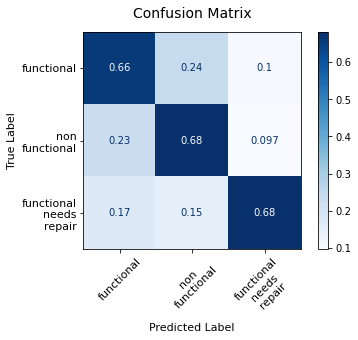

In [612]:
# Confusion Matrix
y_preds = gs_tree.predict(X_test)
conf_matrix = confusion_matrix(y_test, y_preds)
print(conf_matrix)
print()

# plot_confusion_matrix
print()
class_names = list(df_n.status_group.unique())
wrapped_labels = [label.replace(' ', '\n') for label in class_names]
disp = plot_confusion_matrix(gs_tree, X_test, y_test, display_labels=wrapped_labels, 
                             normalize='true', cmap=plt.cm.Blues, xticks_rotation=45);
disp.ax_.set_xticklabels(wrapped_labels, fontsize=11)
disp.ax_.set_yticklabels(wrapped_labels, fontsize=11)
disp.ax_.set_title("Confusion Matrix", fontsize=14, pad=14)
disp.ax_.set_xlabel('Predicted Label', fontsize=11)
disp.ax_.set_ylabel('True Label', fontsize=11)


#### Class_weight='balanced' DT model, funder, lga, management, ... max_depth=30

In [613]:
# df = df_train1.copy()
df.head(3)

,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,permit,construction_year,extraction_type_class,management,payment,water_quality,quantity_group,source,waterpoint_type,status_group,pop_binned
id,,,,,,,,,,,,,,,,,,,,
69572,roman,roman,none,Lake Nyasa,mnyusi_b,Iringa,Ludewa,Mundindi,True,False,1999,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,functional,"(100, 150]"
8776,grumeti,grumeti,zahanati,Lake Victoria,nyamara,Mara,Serengeti,Natta,NaN,True,2010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional,"(200, 300]"
34310,lottery_club,world_vision,kwa_mahundi,Pangani,majengo,Manyara,Simanjiro,Ngorika,True,True,2009,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,functional,"(200, 300]"


In [614]:
features = ['funder', 'management', 'lga', 'payment', 'water_quality', 'quantity_group', 'source', 
            'extraction_type_class', 'status_group', 'waterpoint_type', 'permit', 'public_meeting']

features_top_n = ['funder', 'lga']

all_model_features = ['funder_duplicate',  'management', 'lga_duplicate', 'permit', 'public_meeting', 
                      'payment', 'water_quality', 'quantity_group', 'source', 
                      'extraction_type_class', 'status_group', 'waterpoint_type']


Accuracy score, Jaccard score, and confusion matrix for n = 25:
Accuracy score:  67.76430976430976
Mean Training Score: 75.13%
Mean Test Score: 67.76%
Jaccard score:  [0.57837312 0.19484565 0.58709301]
Individual feature importances--showing top 10:


,Importance
quantity_group_seasonal,0.073327
extraction_type_class_other,0.072618
quantity_group_insufficient,0.039813
quantity_group_enough,0.038304
lga_duplicate_Bariadi,0.034195
lga_duplicate_Kigoma Rural,0.029301
permit_True,0.029216
source_spring,0.028140
payment_pay per bucket,0.026813
public_meeting_True,0.025878



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
lga_dup,0.184557
quantit,0.153959
funder_,0.123648
extract,0.107963
payment,0.104585
source_,0.090291
managem,0.088565
waterpo,0.056266
water_q,0.035072




Accuracy score, Jaccard score, and confusion matrix for n = 50:
Accuracy score:  68.45791245791246
Mean Training Score: 75.52%
Mean Test Score: 68.46%
Jaccard score:  [0.58568189 0.19982872 0.59704579]
Individual feature importances--showing top 10:


,Importance
quantity_group_seasonal,0.072199
extraction_type_class_other,0.071261
quantity_group_insufficient,0.038740
quantity_group_enough,0.037518
lga_duplicate_Bariadi,0.033401
lga_duplicate_Kigoma Rural,0.028334
source_spring,0.026036
public_meeting_True,0.023539
permit_True,0.023403
management_vwc,0.022935



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
lga_dup,0.243085
quantit,0.150701
funder_,0.128522
extract,0.105877
payment,0.081930
source_,0.081267
managem,0.077318
waterpo,0.052899
water_q,0.031459




Accuracy score, Jaccard score, and confusion matrix for n = 100:
Accuracy score:  67.14478114478113
Mean Training Score: 73.77%
Mean Test Score: 67.14%
Jaccard score:  [0.57412633 0.19202324 0.58760588]
Individual feature importances--showing top 10:


,Importance
quantity_group_seasonal,0.073657
extraction_type_class_other,0.072606
quantity_group_insufficient,0.039306
quantity_group_enough,0.038127
lga_duplicate_Bariadi,0.033917
lga_duplicate_Kigoma Rural,0.027406
source_spring,0.023744
funder_duplicate_government_of_tanzania,0.020952
payment_unknown,0.019678
waterpoint_type_hand pump,0.018858



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
lga_dup,0.314869
quantit,0.153376
funder_,0.122338
extract,0.104359
payment,0.072453
source_,0.067534
managem,0.058320
waterpo,0.050836
water_q,0.026535




Accuracy score, Jaccard score, and confusion matrix for n = 125:
Accuracy score:  66.83501683501683
Mean Training Score: 73.45%
Mean Test Score: 66.84%
Jaccard score:  [0.56944143 0.18918919 0.58840149]
Individual feature importances--showing top 10:


,Importance
quantity_group_seasonal,0.073753
extraction_type_class_other,0.072897
quantity_group_insufficient,0.039612
quantity_group_enough,0.039354
lga_duplicate_Bariadi,0.034155
lga_duplicate_Kigoma Rural,0.027900
source_spring,0.022476
funder_duplicate_government_of_tanzania,0.021161
payment_unknown,0.019661
waterpoint_type_hand pump,0.018201



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
lga_dup,0.320309
quantit,0.155014
funder_,0.125452
extract,0.101595
payment,0.070709
source_,0.066470
managem,0.058177
waterpo,0.048111
water_q,0.026369




Accuracy score, Jaccard score, and confusion matrix for n = 250:
Accuracy score:  66.65993265993266
Mean Training Score: 73.34%
Mean Test Score: 66.66%
Jaccard score:  [0.56523633 0.18850337 0.58916679]
Individual feature importances--showing top 10:


,Importance
quantity_group_seasonal,0.073408
extraction_type_class_other,0.072690
quantity_group_insufficient,0.039557
quantity_group_enough,0.039268
lga_duplicate_Bariadi,0.033955
lga_duplicate_Kigoma Rural,0.027294
source_spring,0.023169
funder_duplicate_government_of_tanzania,0.021840
payment_unknown,0.018549
waterpoint_type_hand pump,0.017849



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
lga_dup,0.309659
quantit,0.154682
funder_,0.140423
extract,0.101251
payment,0.069749
source_,0.067355
managem,0.054797
waterpo,0.049159
water_q,0.025088




TOTAL RUN TIME (seconds): 4.314691167001001



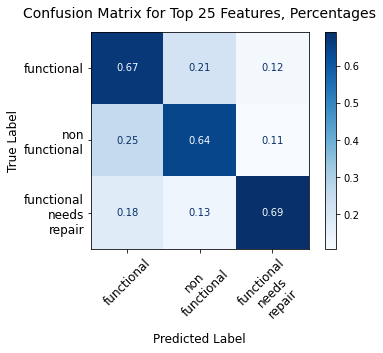

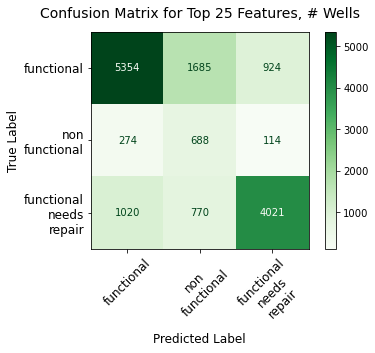

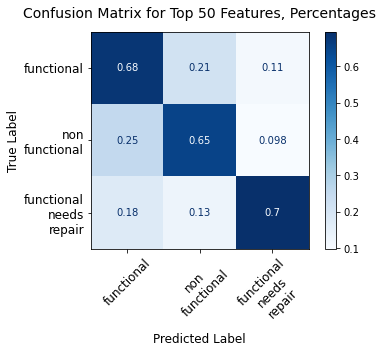

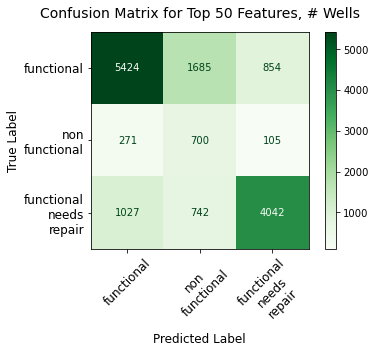

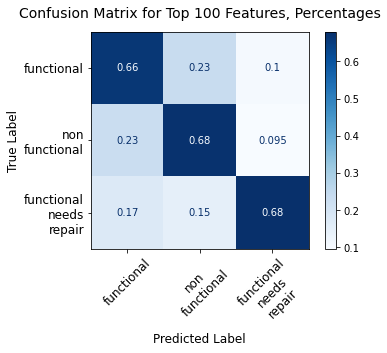

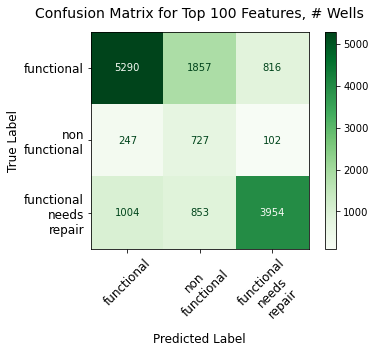

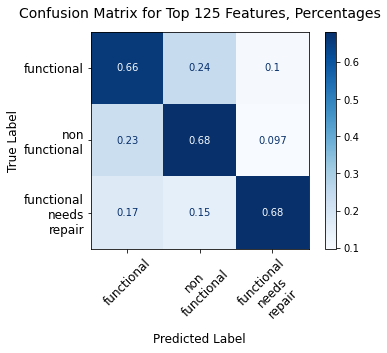

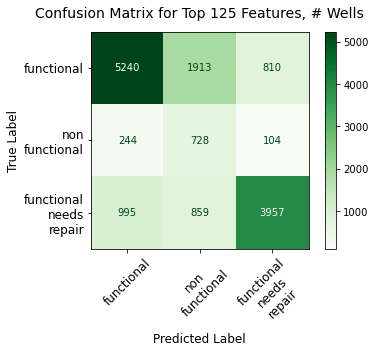

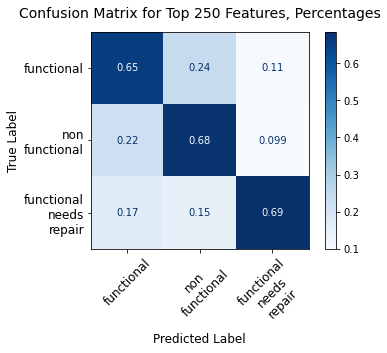

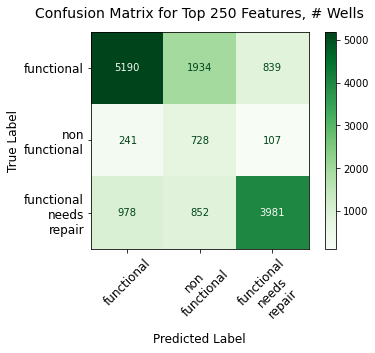

In [615]:
# Best Parameter Combination Found During Grid Search: {'criterion': 'gini', 'max_depth': 30, 'min_samples_split': 2}

start = timeit.default_timer()

X_train_vals_cw, clfs_cw, acc_scores_cw, \
jaccard_scores_cw, feat_importances_cw, \
parameters_cw, imp_tables_cw, \
summ_importance_tables_cw = top_n_multiple_dt_model_cw(df, features, features_top_n, all_model_features, 
                                                       n_range=[25, 50, 100, 125, 250], random_state=123, 
                                                       criterion='gini', max_depth=30, class_weight='balanced', 
                                                       min_samples_split=2, col_title_length=7, )

end = timeit.default_timer()
print('=====================================================')
print('TOTAL RUN TIME (seconds):', end-start)    
print('=====================================================')
print()

In [616]:
acc_scores_cw

[67.76430976430976,
 68.45791245791246,
 67.14478114478113,
 66.83501683501683,
 66.65993265993266]

In [617]:
jaccard_scores_cw

[array([0.57837312, 0.19484565, 0.58709301]),
 array([0.58568189, 0.19982872, 0.59704579]),
 array([0.57412633, 0.19202324, 0.58760588]),
 array([0.56944143, 0.18918919, 0.58840149]),
 array([0.56523633, 0.18850337, 0.58916679])]

In [618]:
summ_importance_tables_cw[3]

,Importance
var_abbr,
lga_dup,0.320309
quantit,0.155014
funder_,0.125452
extract,0.101595
payment,0.070709
source_,0.066470
managem,0.058177
waterpo,0.048111
water_q,0.026369


#### Class_weight='balanced' DT model, funder, lga, management, ... max_depth=20

Accuracy score, Jaccard score, and confusion matrix for n = 25:
Accuracy score:  64.53872053872054
Mean Training Score: 69.62%
Mean Test Score: 64.54%
Jaccard score:  [0.54757074 0.17560976 0.56172004]
Individual feature importances--showing top 10:


,Importance
quantity_group_seasonal,0.085884
extraction_type_class_other,0.085085
quantity_group_insufficient,0.046654
quantity_group_enough,0.044859
lga_duplicate_Bariadi,0.040066
lga_duplicate_Kigoma Rural,0.034261
source_spring,0.028937
payment_pay per bucket,0.025807
permit_True,0.025131
waterpoint_type_hand pump,0.023470



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
lga_dup,0.194618
quantit,0.180077
extract,0.121008
funder_,0.109894
payment,0.094605
source_,0.090686
managem,0.078027
waterpo,0.060813
water_q,0.025142




Accuracy score, Jaccard score, and confusion matrix for n = 50:
Accuracy score:  63.87878787878788
Mean Training Score: 68.12%
Mean Test Score: 63.88%
Jaccard score:  [0.54120172 0.16951896 0.56453577]
Individual feature importances--showing top 10:


,Importance
quantity_group_seasonal,0.087736
extraction_type_class_other,0.086747
quantity_group_insufficient,0.047230
quantity_group_enough,0.045568
lga_duplicate_Bariadi,0.040551
lga_duplicate_Kigoma Rural,0.033951
source_spring,0.029435
payment_pay per bucket,0.022500
waterpoint_type_hand pump,0.021935
funder_duplicate_government_of_tanzania,0.021283



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
lga_dup,0.243795
quantit,0.183267
extract,0.120405
funder_,0.103287
source_,0.082157
managem,0.074885
payment,0.073947
waterpo,0.060365
water_q,0.021816




Accuracy score, Jaccard score, and confusion matrix for n = 100:
Accuracy score:  64.24242424242425
Mean Training Score: 68.19%
Mean Test Score: 64.24%
Jaccard score:  [0.54438951 0.17715112 0.55762636]
Individual feature importances--showing top 10:


,Importance
quantity_group_seasonal,0.090144
extraction_type_class_other,0.088943
quantity_group_insufficient,0.047977
quantity_group_enough,0.046659
lga_duplicate_Bariadi,0.041499
lga_duplicate_Kigoma Rural,0.033358
source_spring,0.026797
funder_duplicate_government_of_tanzania,0.022967
waterpoint_type_hand pump,0.022071
payment_unknown,0.019918



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
lga_dup,0.303698
quantit,0.187580
extract,0.120618
funder_,0.100349
source_,0.069444
payment,0.065834
managem,0.058061
waterpo,0.053156
water_q,0.017012




Accuracy score, Jaccard score, and confusion matrix for n = 125:
Accuracy score:  64.16835016835016
Mean Training Score: 68.20%
Mean Test Score: 64.17%
Jaccard score:  [0.54256808 0.17624336 0.55773226]
Individual feature importances--showing top 10:


,Importance
quantity_group_seasonal,0.089948
extraction_type_class_other,0.088932
quantity_group_enough,0.047872
quantity_group_insufficient,0.047862
lga_duplicate_Bariadi,0.041621
lga_duplicate_Kigoma Rural,0.033356
source_spring,0.025837
funder_duplicate_government_of_tanzania,0.022832
waterpoint_type_hand pump,0.021894
payment_unknown,0.019841



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
lga_dup,0.305735
quantit,0.188482
extract,0.119037
funder_,0.100861
source_,0.069887
payment,0.064469
managem,0.056845
waterpo,0.053109
water_q,0.016942




Accuracy score, Jaccard score, and confusion matrix for n = 250:
Accuracy score:  63.82491582491583
Mean Training Score: 67.85%
Mean Test Score: 63.82%
Jaccard score:  [0.53779976 0.17434679 0.55757485]
Individual feature importances--showing top 10:


,Importance
quantity_group_seasonal,0.090363
extraction_type_class_other,0.089315
quantity_group_insufficient,0.048242
quantity_group_enough,0.048126
lga_duplicate_Bariadi,0.041673
lga_duplicate_Kigoma Rural,0.033498
source_spring,0.026791
funder_duplicate_government_of_tanzania,0.022735
waterpoint_type_hand pump,0.022070
payment_unknown,0.019145



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
lga_dup,0.298605
quantit,0.189646
extract,0.118913
funder_,0.109374
source_,0.071093
payment,0.065089
managem,0.054465
waterpo,0.053507
water_q,0.015004




TOTAL RUN TIME (seconds): 3.7440073340003437



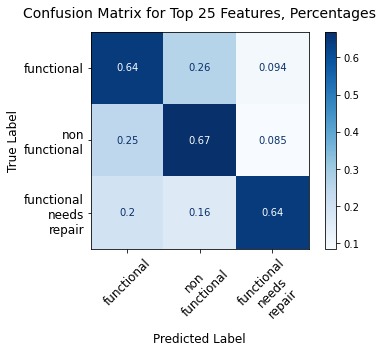

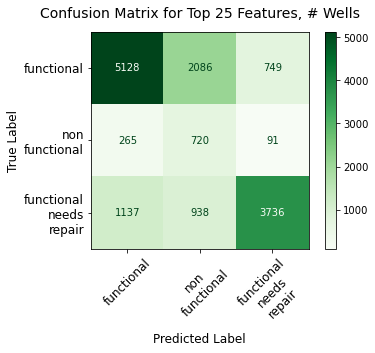

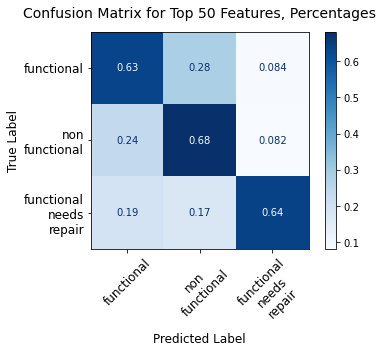

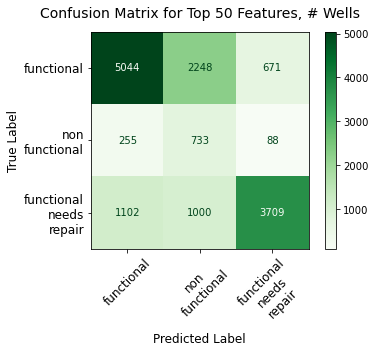

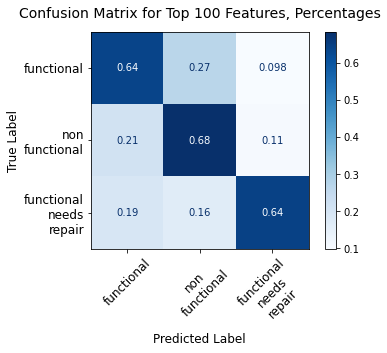

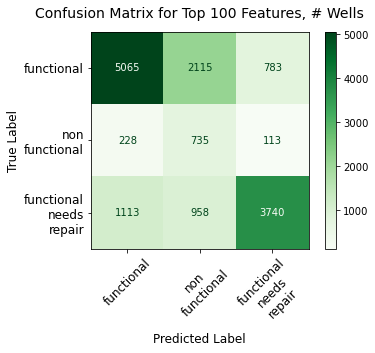

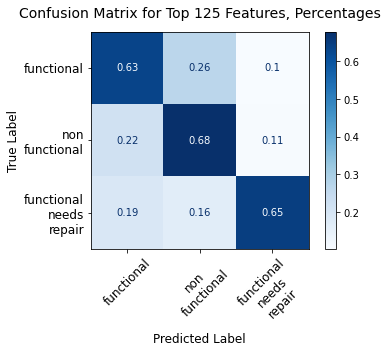

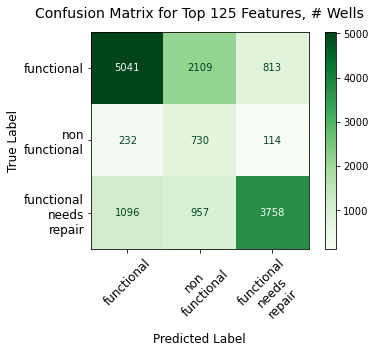

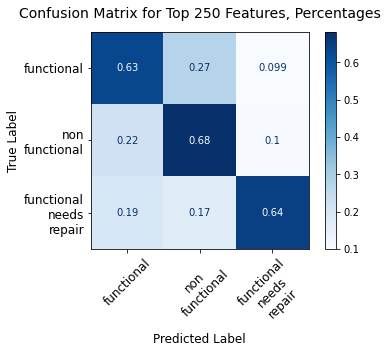

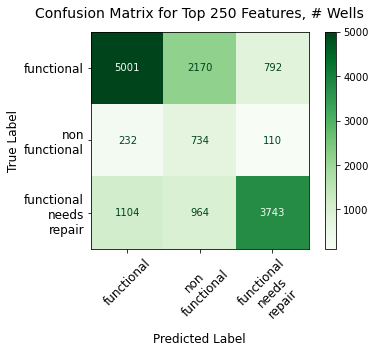

In [619]:
# criterion='gini', max_depth=20

start = timeit.default_timer()


X_train_vals_cw, clfs_cw, acc_scores_cw, \
jaccard_scores_cw, feat_importances_cw, \
parameters_cw, imp_tables_cw, \
summ_importance_tables_cw = top_n_multiple_dt_model_cw(df, features, features_top_n, all_model_features, 
                                                       n_range=[25, 50, 100, 125, 250], random_state=123, 
                                                       criterion='gini', max_depth=20, col_title_length=7, 
                                                       class_weight='balanced', min_samples_split=2)


end = timeit.default_timer()
print('=====================================================')
print('TOTAL RUN TIME (seconds):', end-start)    
print('=====================================================')
print()

In [620]:
acc_scores_cw

[64.53872053872054,
 63.87878787878788,
 64.24242424242425,
 64.16835016835016,
 63.82491582491583]

#### Comments on using class_weight='balanced' in DecisionTreeClassifier
Although the model does significantly better when class_weight = 'balanced' than when class_weight=None (default) at accurately predicting non-functional wells, the overall accuracy score drops significantly.  Perhaps a different class_weight parameter would give better results.  Will try hyperparameter optimization to see if that improves accuracy.

## Modeling, Decision Trees: SMOTE resampling 

In [621]:
import imblearn

In [622]:
from collections import Counter
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import cross_val_score
from imblearn import under_sampling,over_sampling
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE, ADASYN
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import BorderlineSMOTE
from imblearn.over_sampling import SVMSMOTE

In [623]:
# df = df_train1.copy()
df.head(3)

,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,permit,construction_year,extraction_type_class,management,payment,water_quality,quantity_group,source,waterpoint_type,status_group,pop_binned
id,,,,,,,,,,,,,,,,,,,,
69572,roman,roman,none,Lake Nyasa,mnyusi_b,Iringa,Ludewa,Mundindi,True,False,1999,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,functional,"(100, 150]"
8776,grumeti,grumeti,zahanati,Lake Victoria,nyamara,Mara,Serengeti,Natta,NaN,True,2010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional,"(200, 300]"
34310,lottery_club,world_vision,kwa_mahundi,Pangani,majengo,Manyara,Simanjiro,Ngorika,True,True,2009,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,functional,"(200, 300]"


### Functions for SMOTE resampling

#### Function for creating balanced training dataset (X_train, y_train) with SMOTE, single top 'n' value

In [624]:
def SMOTE_top_n_tts(df, features, features_top_n, all_model_features, 
                    n=125, p=126, test_size=0.25, random_state=123):

    start = timeit.default_timer()

    df = df.copy()
    df = df[features]
    
    # First:  use function "top_n_encode" from first modeling function section to create duplicate columns 
    #         for top 'n' features of interest and encode the features and targets 
    
    df_n, X_train, X_test, y_train, y_test = top_n_encode_tts(df, features, features_top_n, 
                                                              all_model_features, n=n, p=p, 
                                                              test_size=test_size, 
                                                              random_state=random_state)
        
    # Second:  use SMOTE resampling on X_train and y_train
    counter = Counter(y_train)
    print(counter)
    # define pipeline
    over = SMOTE(random_state=random_state)
    under = RandomUnderSampler(random_state=random_state)
    steps = [('o', over), ('u', under)]
    pipeline = Pipeline(steps=steps)
    # transform the dataset
    X_train_SMOTE, y_train_SMOTE = pipeline.fit_resample(X_train, y_train)
    # summarize the new class distribution
    counter = Counter(y_train_SMOTE)
    print(counter)
    
    
    end = timeit.default_timer()
    print('Run time (seconds):', end-start)    
    print()
    
    return df_n, X_train_SMOTE, X_test, y_train_SMOTE, y_test

# df_n, X_train_SMOTE, X_test, y_train_SMOTE, y_test  = SMOTE_top_n_tts(df, features, features_top_n, 
#                                                                       all_model_features, n=125, p=126, 
#                                                                       test_size=0.25, random_state=123)

#### Function for running X, y SMOTE decision tree model, taking in X_train_SMOTE, X_test, y_train_SMOTE, y_test from previous function


In [625]:
def run_SMOTE_dt_model(df_n, X_train_SMOTE, X_test, y_train_SMOTE, y_test, random_state=123, 
                       criterion='entropy', max_depth=20, min_samples_split=2, col_title_length=7):
    
    start = timeit.default_timer()
    
    # Producing decision tree classifier model with X, y encoded data 
    clf, y_preds_SMOTE = clf_model(X_train_SMOTE, X_test, y_train_SMOTE, y_test, 
                                   random_state=random_state, max_depth=max_depth, 
                                   criterion=criterion, min_samples_split=min_samples_split)
        
    # Print accuracy and jaccard scores
#     accuracy, jaccard = acc_jaccard_scores(y_test, y_preds_SMOTE, jac_average=None)
    accuracy, training_score, \
    testing_score, jaccard = acc_train_test_jaccard_scores(X_train_SMOTE, X_test, y_train_SMOTE, y_test, \
                                                           clf, y_preds_SMOTE, jac_average=None)

    # Generate detailed feature importances table
    print("Individual feature importances--showing top 10:")
    imp_table = importance_table(X_train_SMOTE, clf)
    display(imp_table.head(10))
    print()
    
    # Generate high-level feature importances table
    print("Roll-up summary feature importance table, all features:")
    summ_imp_table = summary_imp_table(X_train_SMOTE, clf, col_title_length=col_title_length)
    display(summ_imp_table)
    print()
    
    plot_conf_matrix_norm_abs(df_n, clf, X_test, y_test, title="Confusion Matrix", cmap=plt.cm.Blues)
    
    end = timeit.default_timer()
    print('Run time (seconds):', end-start)    
    print()
        
    return X_train_SMOTE, X_test, y_train_SMOTE, y_test, clf, accuracy, training_score, testing_score, \
           jaccard, clf.feature_importances_, clf.get_params(), imp_table, summ_imp_table


# To run formatted confusion matrices, use code below

# # Plot confusion matrices
# n=125
# title = "Confusion Matrix for Top {} Features".format(n)
# plot_conf_matrix_norm_abs(df_SMOTE, clf, X_test, y_test, title=title, cmap=plt.cm.Blues)


#### Function for running SMOTE resampling and decision tree, one 'n' value, and producing scores, feature importance tables, and confusion matrices


In [626]:
def top_n_features_SMOTE_dt_model(df, features, features_top_n, all_model_features, n=125, p=126, 
                                  criterion='entropy', max_depth=20, col_title_length=7, test_size=0.25,
                                  min_samples_split=2, random_state=123, cmap=plt.cm.Blues):
    
    df = df.copy()
    
    # Resample df using SMOTE and undersampling, encode features, and generate X_train_SMOTE and y_train_SMOTE
    df_n, X_train_SMOTE, X_test, \
    y_train_SMOTE, y_test = SMOTE_top_n_tts(df, features, features_top_n, all_model_features, 
                                            n=n, p=p, test_size=test_size, random_state=random_state)
    
    # Producing decision tree classifier model with X, y encoded data 
    clf, y_preds_SMOTE = clf_model(X_train_SMOTE, X_test, y_train_SMOTE, y_test, 
                                   random_state=random_state, max_depth=max_depth, 
                                   criterion=criterion, min_samples_split=min_samples_split)
    
    # Print accuracy and jaccard scores
#     accuracy, jaccard = acc_jaccard_scores(y_test, y_preds_SMOTE, jac_average=None)
    accuracy, training_score, \
    testing_score, jaccard = acc_train_test_jaccard_scores(X_train_SMOTE, X_test, y_train_SMOTE, y_test, \
                                                           clf, y_preds_SMOTE, jac_average=None)

    print()

    # Generate detailed feature importances table
    print("Individual feature importances--showing top 10:")
    imp_table = importance_table(X_train_SMOTE, clf)
    display(imp_table.head(10))
    print()
    
    # Generate high-level feature importances table
    print("Roll-up summary feature importance table, all features:")
    summ_imp_table = summary_imp_table(X_train_SMOTE, clf, col_title_length=7)
    display(summ_imp_table)
    print()
        
    # Plot confusion matrices
    title = "Confusion Matrix for Top {} Features".format(n)
    plot_conf_matrix_norm_abs(df_n, clf, X_test, y_test, title=title, cmap=cmap)
    
    return df_n, X_train_SMOTE, X_test, y_train_SMOTE, y_test, clf, accuracy, training_score, testing_score, jaccard,  \
           clf.feature_importances_, clf.get_params(), imp_table, summ_imp_table


#### Function for running SMOTE decision tree models, iterating through multiple top 'n' values and running decision tree models

In [627]:
# print subset feature importance summary table
# NOTE:  uses one hot encoding

def imb_mult_top_n_SMOTE_dt(df, features, features_top_n, all_model_features, random_state=123, 
                            n_range=[50, 100, 125, 250], test_size=0.25, criterion='entropy', 
                            max_depth=30, col_title_length = 7, min_samples_split=2, cmap=plt.cm.Blues):
    
    df = df.copy()
        
    # Set up variables to hold results for each 'n' value
    df_ns = []
    X_train_vals = []
    clfs = []
    acc_scores = []
    train_scores = []
    test_scores = []
    jaccard_scores = []
    feat_importances = []
    parameters = []
    imp_tables = []
    summ_importance_tables = []
    
    # Create iterative loop
    for n in n_range:
        df = df.copy()
        print()
        print('Accuracy score, Jaccard score, and confusion matrix for n = {}:'.format(n))
        print()
        
        df1 = df.copy()
        
        df_n, X_train_SMOTE, \
        X_test, y_train_SMOTE, \
        y_test, clf, acc, \
        train_score, test_score, js, \
        feat_imp, params, imp_table, \
        summ_imp_table = top_n_features_SMOTE_dt_model(df1, features, features_top_n, all_model_features, 
                                                       n=n, p=n+1, test_size=test_size, criterion=criterion, 
                                                       max_depth=max_depth, col_title_length=col_title_length, 
                                                       min_samples_split=min_samples_split, 
                                                       random_state=random_state, cmap=cmap)
        
        
        # Plot confusion matrices
        title = "Confusion Matrix for Top {} Features".format(n)
        plot_conf_matrix_norm_abs(df_n, clf, X_test, y_test, title=title, cmap=cmap)
        
        df_ns.append(df_n)
        X_train_vals.append(X_train_SMOTE)
        clfs.append(clf)
        acc_scores.append(acc)
        train_scores.append(train_score)
        test_scores.append(test_score)
        jaccard_scores.append(js)
        feat_importances.append(feat_imp)
        parameters.append(params)
        imp_tables.append(imp_table)
        summ_importance_tables.append(summ_imp_table)
        
        print()
    
    return df_ns, X_train_vals, clfs, acc_scores, train_scores, test_scores, jaccard_scores, feat_importances, \
           parameters, imp_tables, summ_importance_tables


### SMOTE modeling:  FUNDER, LGA (multiple 'n'), payment, water_quality, quantity_group, source, extraction_type_class, waterpoint_type, public_meeting, permit; max_depth=20, criterion='entropy'

In [628]:
# df = df_train1.copy()
df.head(3)

,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,permit,construction_year,extraction_type_class,management,payment,water_quality,quantity_group,source,waterpoint_type,status_group,pop_binned
id,,,,,,,,,,,,,,,,,,,,
69572,roman,roman,none,Lake Nyasa,mnyusi_b,Iringa,Ludewa,Mundindi,True,False,1999,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,functional,"(100, 150]"
8776,grumeti,grumeti,zahanati,Lake Victoria,nyamara,Mara,Serengeti,Natta,NaN,True,2010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional,"(200, 300]"
34310,lottery_club,world_vision,kwa_mahundi,Pangani,majengo,Manyara,Simanjiro,Ngorika,True,True,2009,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,functional,"(200, 300]"


In [629]:
features = ['funder', 'lga', 'management', 'payment', 'water_quality', 'quantity_group', 'source', 
            'extraction_type_class', 'status_group', 'waterpoint_type', 'permit', 'public_meeting']

features_top_n = ['funder', 'lga']

all_model_features = ['funder_duplicate', 'lga_duplicate', 'management', 'permit', 'public_meeting', 
                      'payment', 'water_quality', 'quantity_group', 'source', 
                      'extraction_type_class', 'status_group', 'waterpoint_type']



Accuracy score, Jaccard score, and confusion matrix for n = 50:

Counter({0: 24296, 2: 17013, 1: 3241})
Counter({0: 24296, 1: 24296, 2: 24296})
Run time (seconds): 4.648855583000113

Run time (seconds): 0.5551671249995707

Accuracy score:  63.582491582491585
Mean Training Score: 72.56%
Mean Test Score: 63.58%
Jaccard score:  [0.5522419  0.15410547 0.53799628]

Individual feature importances--showing top 10:


,Importance
extraction_type_class_other,0.096165
quantity_group_seasonal,0.096131
quantity_group_insufficient,0.061650
quantity_group_enough,0.051646
lga_duplicate_Bariadi,0.040855
lga_duplicate_Kigoma Rural,0.030455
payment_pay per bucket,0.030289
source_spring,0.024865
funder_duplicate_government_of_tanzania,0.023591
waterpoint_type_hand pump,0.023015



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
lga_dup,0.222744
quantit,0.213430
extract,0.123322
funder_,0.105322
payment,0.083881
source_,0.070160
waterpo,0.065690
managem,0.065461
water_q,0.018020





Accuracy score, Jaccard score, and confusion matrix for n = 100:

Counter({0: 24296, 2: 17013, 1: 3241})
Counter({0: 24296, 1: 24296, 2: 24296})
Run time (seconds): 5.106612458999734

Run time (seconds): 0.8950440000007802

Accuracy score:  65.7104377104377
Mean Training Score: 72.61%
Mean Test Score: 65.71%
Jaccard score:  [0.56560231 0.17280967 0.53199574]

Individual feature importances--showing top 10:


,Importance
extraction_type_class_other,0.096680
quantity_group_seasonal,0.095096
quantity_group_insufficient,0.060630
quantity_group_enough,0.053229
lga_duplicate_Bariadi,0.040465
lga_duplicate_Kigoma Rural,0.030587
funder_duplicate_government_of_tanzania,0.025387
source_spring,0.024232
waterpoint_type_hand pump,0.024216
payment_pay per bucket,0.019355



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
lga_dup,0.279662
quantit,0.212928
extract,0.123236
funder_,0.095668
waterpo,0.067153
source_,0.063105
payment,0.062805
managem,0.058444
water_q,0.016505





Accuracy score, Jaccard score, and confusion matrix for n = 125:

Counter({0: 24296, 2: 17013, 1: 3241})
Counter({0: 24296, 1: 24296, 2: 24296})
Run time (seconds): 5.513811333999911

Run time (seconds): 1.0239724580005714

Accuracy score:  63.52188552188552
Mean Training Score: 72.64%
Mean Test Score: 63.52%
Jaccard score:  [0.54900731 0.15749939 0.53713851]

Individual feature importances--showing top 10:


,Importance
extraction_type_class_other,0.095940
quantity_group_seasonal,0.095517
quantity_group_insufficient,0.060244
quantity_group_enough,0.054776
lga_duplicate_Bariadi,0.040967
lga_duplicate_Kigoma Rural,0.030188
funder_duplicate_government_of_tanzania,0.025788
source_spring,0.024748
waterpoint_type_hand pump,0.024007
payment_pay per bucket,0.023437



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
lga_dup,0.278794
quantit,0.214506
extract,0.121670
funder_,0.094829
payment,0.069384
source_,0.064958
waterpo,0.064237
managem,0.056576
water_q,0.016550




TOTAL RUN TIME (seconds): 18.424002167001163



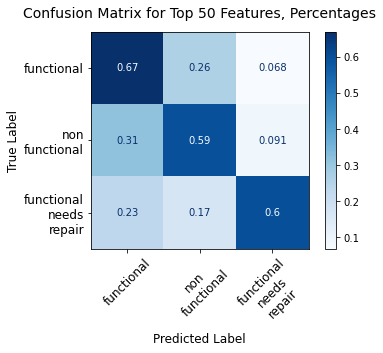

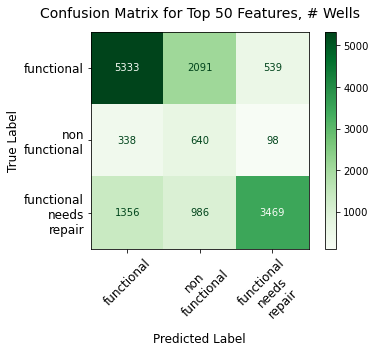

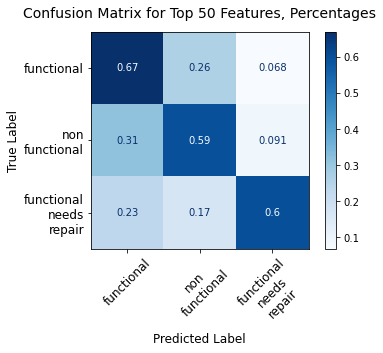

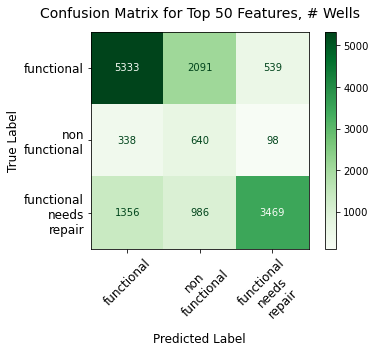

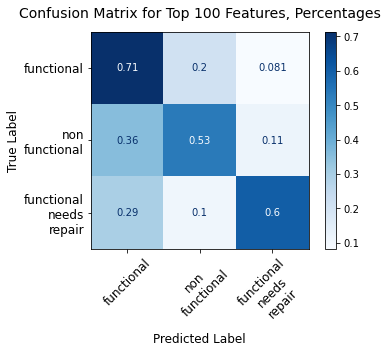

...

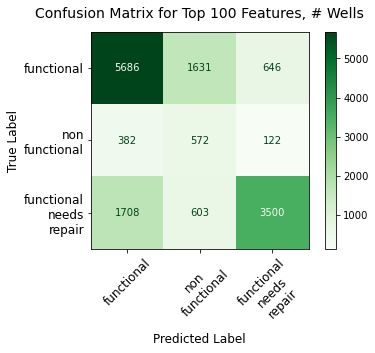

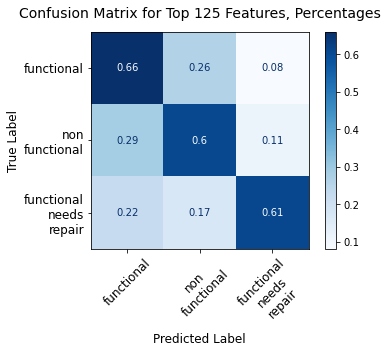

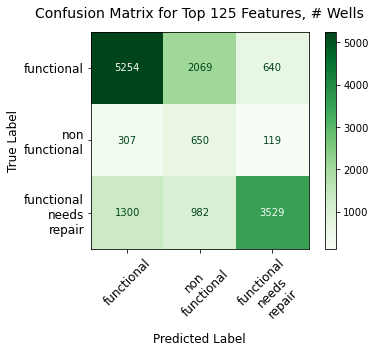

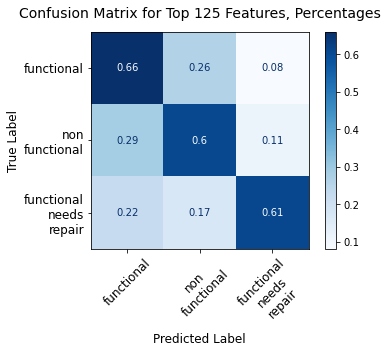

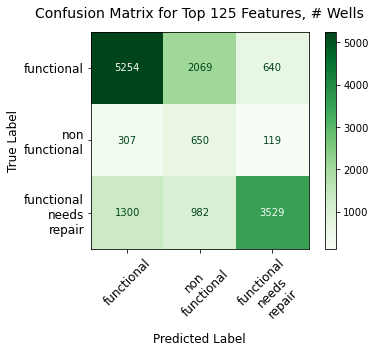

In [630]:
start = timeit.default_timer()

df_ns, X_trains_SMOTE, clfs_SMOTE, \
acc_scores_SMOTE, train_scores_SMOTE, \
test_scores_SMOTE, jaccard_scores_SMOTE, \
feat_importances_SMOTE, \
parameters_SMOTE, imp_tables_SMOTE, \
summ_importance_tables_SMOTE = imb_mult_top_n_SMOTE_dt(df, features, features_top_n, all_model_features, 
                                                       random_state=123, n_range=[50, 100, 125], criterion='gini', 
                                                       max_depth=20, col_title_length=7, cmap=plt.cm.Blues)


end = timeit.default_timer()
print('=====================================================')
print('TOTAL RUN TIME (seconds):', end-start)    
print('=====================================================')
print()

In [631]:
train_scores_SMOTE

[0.7256338491932829, 0.7261414773350895, 0.7263747118867303]

In [632]:
test_scores_SMOTE

[0.6358249158249158, 0.6571043771043771, 0.6352188552188552]

In [633]:
acc_scores_SMOTE

[63.582491582491585, 65.7104377104377, 63.52188552188552]

In [634]:
jaccard_scores_SMOTE

[array([0.5522419 , 0.15410547, 0.53799628]),
 array([0.56560231, 0.17280967, 0.53199574]),
 array([0.54900731, 0.15749939, 0.53713851])]

### Modeling: SMOTE Decision tree hyperparameter tuning 

#### First, reset dataframe if needed

In [635]:
# df = df_train1.copy()
df.head(3)

,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,permit,construction_year,extraction_type_class,management,payment,water_quality,quantity_group,source,waterpoint_type,status_group,pop_binned
id,,,,,,,,,,,,,,,,,,,,
69572,roman,roman,none,Lake Nyasa,mnyusi_b,Iringa,Ludewa,Mundindi,True,False,1999,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,functional,"(100, 150]"
8776,grumeti,grumeti,zahanati,Lake Victoria,nyamara,Mara,Serengeti,Natta,NaN,True,2010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional,"(200, 300]"
34310,lottery_club,world_vision,kwa_mahundi,Pangani,majengo,Manyara,Simanjiro,Ngorika,True,True,2009,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,functional,"(200, 300]"


#### Second, select appropriate columns for modeling

In [636]:
features = ['funder', 'lga', 'management', 'payment', 'water_quality', 'quantity_group', 'source', 
            'extraction_type_class', 'status_group', 'waterpoint_type', 'permit', 'public_meeting']

features_top_n = ['funder', 'lga']

all_model_features = ['funder_duplicate', 'lga_duplicate', 'management', 'permit', 'public_meeting', 
                      'payment', 'water_quality', 'quantity_group', 'source', 
                      'extraction_type_class', 'status_group', 'waterpoint_type']


#### Third, create SMOTE rebalanced dataset, perform one-hot and label encoding, and split into train and test sets

In [637]:
df_n, X_train_SMOTE, X_test, \
y_train_SMOTE, y_test  = SMOTE_top_n_tts(df, features, features_top_n, all_model_features, n=125, p=126, 
                                         test_size=0.25, random_state=123)

Counter({0: 24296, 2: 17013, 1: 3241})
Counter({0: 24296, 1: 24296, 2: 24296})
Run time (seconds): 5.439349374999438



#### Fourth, import GridSearchCV and set up parameter grid (max max_depth= 20)

In [638]:
from sklearn.model_selection import GridSearchCV

In [639]:
# set up GridSearchCV parameter grid
param_grid = {'criterion': ['gini', 'entropy'], 
              'max_depth': [2, 5, 10, 20], 
              'min_samples_split': [2, 5, 10]}


#### Fifth, run GridSearchCV model on SMOTE rebalanced dataset (max max_depth=20)

In [640]:
# Funder, LGA

start = timeit.default_timer()

# Instantiate decision tree model
clf = DecisionTreeClassifier(random_state=123)

# Run model with GridSearchCV
gs_tree_SMOTE = GridSearchCV(clf, param_grid, cv=3, return_train_score=True, n_jobs=-1)
gs_tree_SMOTE.fit(X_train_SMOTE, y_train_SMOTE)
gs_tree_SMOTE.best_params_


end = timeit.default_timer()
print('=====================================================')
print('TOTAL RUN TIME (seconds):', end-start)    
print('=====================================================')
print()

TOTAL RUN TIME (seconds): 10.003825750000033



In [641]:
# Funder, LGA
# Mean training score
gs_tree_training_score_SMOTE = gs_tree_SMOTE.score(X_train_SMOTE, y_train_SMOTE)

# Mean test score
gs_tree_testing_score_SMOTE = gs_tree_SMOTE.score(X_test, y_test)

print(f"Mean Training Score: {gs_tree_training_score_SMOTE :.2%}")
print(f"Mean Test Score: {gs_tree_testing_score_SMOTE :.2%}")
print(f"Best Parameter Combination Found During Grid Search: {gs_tree_SMOTE.best_params_}")


Mean Training Score: 73.10%
Mean Test Score: 63.69%
Best Parameter Combination Found During Grid Search: {'criterion': 'entropy', 'max_depth': 20, 'min_samples_split': 5}


In [642]:
gs_tree_SMOTE.best_estimator_


DecisionTreeClassifier(criterion='entropy', max_depth=20, min_samples_split=5,
                       random_state=123)

In [643]:
y_preds_SMOTE = gs_tree_SMOTE.predict(X_test)
acc_jaccard_scores(y_test, y_preds_SMOTE, jac_average=None)

Test accuracy score:  63.69023569023569
Jaccard score:  [0.5491557  0.16397849 0.53655533]


(63.69023569023569, array([0.5491557 , 0.16397849, 0.53655533]))

[[5301 2062  600]
 [ 319  671   86]
 [1371  954 3486]]




Text(0, 0.5, 'True Label')

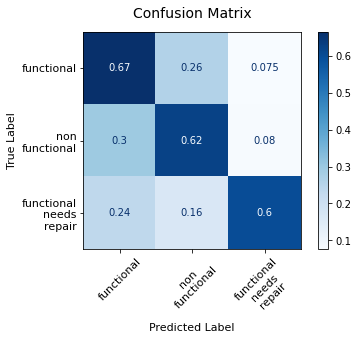

In [644]:
# Funder, LGA
# Confusion Matrix
y_preds_SMOTE = gs_tree_SMOTE.predict(X_test)
conf_matrix = confusion_matrix(y_test, y_preds_SMOTE)
print(conf_matrix)
print()

# plot_confusion_matrix
print()
class_names = list(df_n.status_group.unique())
wrapped_labels = [label.replace(' ', '\n') for label in class_names]
disp = plot_confusion_matrix(gs_tree_SMOTE, X_test, y_test, display_labels=wrapped_labels, 
                             normalize='true', cmap=plt.cm.Blues, xticks_rotation=45);
disp.ax_.set_xticklabels(wrapped_labels, fontsize=11)
disp.ax_.set_yticklabels(wrapped_labels, fontsize=11)
disp.ax_.set_title("Confusion Matrix", fontsize=14, pad=14)
disp.ax_.set_xlabel('Predicted Label', fontsize=11)
disp.ax_.set_ylabel('True Label', fontsize=11)

#### SMOTE DT: FUNDER, LGA (n=125), management, payment, water_quality, quantity_group, source, extraction_type_class, waterpoint_type, public_meeting, permit; max_depth=30, criterion='entropy'

In [645]:
# df = df_train1.copy()
df.head(3)

,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,permit,construction_year,extraction_type_class,management,payment,water_quality,quantity_group,source,waterpoint_type,status_group,pop_binned
id,,,,,,,,,,,,,,,,,,,,
69572,roman,roman,none,Lake Nyasa,mnyusi_b,Iringa,Ludewa,Mundindi,True,False,1999,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,functional,"(100, 150]"
8776,grumeti,grumeti,zahanati,Lake Victoria,nyamara,Mara,Serengeti,Natta,NaN,True,2010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional,"(200, 300]"
34310,lottery_club,world_vision,kwa_mahundi,Pangani,majengo,Manyara,Simanjiro,Ngorika,True,True,2009,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,functional,"(200, 300]"


In [646]:
features = ['funder', 'lga', 'management', 'payment', 'water_quality', 'quantity_group', 'source', 
            'extraction_type_class', 'status_group', 'waterpoint_type', 'permit', 'public_meeting']

features_top_n = ['funder', 'lga']

all_model_features = ['funder_duplicate', 'lga_duplicate', 'management', 'permit', 'public_meeting', 
                      'payment', 'water_quality', 'quantity_group', 'source', 
                      'extraction_type_class', 'status_group', 'waterpoint_type']


In [647]:
df_n, X_train_SMOTE, X_test, \
y_train_SMOTE, y_test  = SMOTE_top_n_tts(df, features, features_top_n, all_model_features, 
                                         n=125, p=126, test_size=0.25, random_state=123)

Counter({0: 24296, 2: 17013, 1: 3241})
Counter({0: 24296, 1: 24296, 2: 24296})
Run time (seconds): 5.518529999999373



In [648]:
# Funder, LGA, max_depth=30, criterion='entropy'
# optimized: max_depth=20:  {'criterion': 'entropy', 'max_depth': 20, 'min_samples_split': 2}

start = timeit.default_timer()

# instantiate DT classifier
clf = DecisionTreeClassifier(criterion='entropy', max_depth=30, min_samples_split=2, random_state=123)

# fit dt model
clf.fit(X_train_SMOTE, y_train_SMOTE)

# predictions
y_preds_SMOTE = clf.predict(X_test)

acc_jaccard_scores(y_test, y_preds_SMOTE, jac_average=None)


end = timeit.default_timer()
print('=====================================================')
print('TOTAL RUN TIME (seconds):', end-start)    
print('=====================================================')
print()

Test accuracy score:  70.006734006734
Jaccard score:  [0.61253532 0.20106007 0.57234237]
TOTAL RUN TIME (seconds): 1.21527983300075



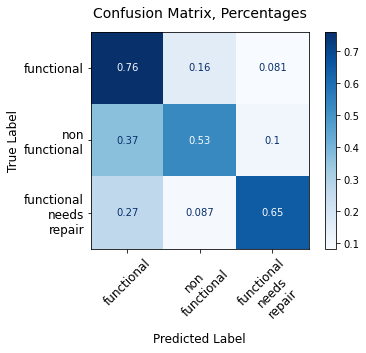

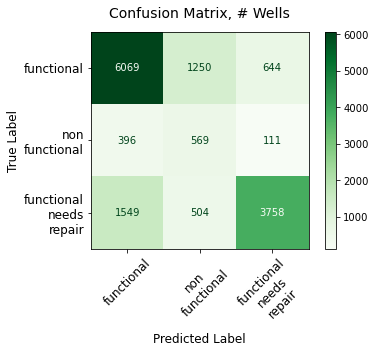

In [649]:
plot_conf_matrix_norm_abs(df_n, clf, X_test, y_test, title='Confusion Matrix', 
                          titlefont=14, x_y_tick_font=12, pad=14, x_y_label_font=12, 
                          xticks_rotation=45, cmap=plt.cm.Blues)


In [650]:
imp_table, summ_imp_table, \
summ_imp_sub_table = feat_imp_tables(X_train_SMOTE, clf, col_title_length=7, num_feats_incl=100)

Individual feature importances, top 10


,Importance
quantity_group_seasonal,0.070954
extraction_type_class_other,0.067388
quantity_group_enough,0.045076
quantity_group_insufficient,0.043757
lga_duplicate_Bariadi,0.030926
payment_pay per bucket,0.029362
source_spring,0.022493
payment_pay monthly,0.021648
lga_duplicate_Kigoma Rural,0.020662
funder_duplicate_government_of_tanzania,0.020659



Roll-up summary feature importance table, all features


,Importance
var_abbr,
lga_dup,0.281996
quantit,0.165216
funder_,0.141420
extract,0.093487
payment,0.090921
source_,0.064000
waterpo,0.062080
managem,0.048221
water_q,0.021891



Roll-up summary feature importances, summing up top 100 most important features ONLY:


,Importance
var_abbr,
lga_dup,0.223199
quantit,0.165216
extract,0.092164
payment,0.090921
funder_,0.090756
waterpo,0.062080
source_,0.060020
managem,0.045101
water_q,0.018210


In [651]:
imp_table.head(30)

,Importance
quantity_group_seasonal,0.070954
extraction_type_class_other,0.067388
quantity_group_enough,0.045076
quantity_group_insufficient,0.043757
lga_duplicate_Bariadi,0.030926
payment_pay per bucket,0.029362
source_spring,0.022493
payment_pay monthly,0.021648
lga_duplicate_Kigoma Rural,0.020662
funder_duplicate_government_of_tanzania,0.020659


#### SMOTE DT: INSTALLER, LGA (multiple 'n'), payment, water_quality, quantity_group, source, extraction_type_class, waterpoint_type, public_meeting, permit; max_depth=20, criterion='entropy'

In [652]:
df.head(3)

,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,permit,construction_year,extraction_type_class,management,payment,water_quality,quantity_group,source,waterpoint_type,status_group,pop_binned
id,,,,,,,,,,,,,,,,,,,,
69572,roman,roman,none,Lake Nyasa,mnyusi_b,Iringa,Ludewa,Mundindi,True,False,1999,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,functional,"(100, 150]"
8776,grumeti,grumeti,zahanati,Lake Victoria,nyamara,Mara,Serengeti,Natta,NaN,True,2010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional,"(200, 300]"
34310,lottery_club,world_vision,kwa_mahundi,Pangani,majengo,Manyara,Simanjiro,Ngorika,True,True,2009,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,functional,"(200, 300]"


In [653]:
features = ['installer', 'lga', 'management', 'payment', 'water_quality', 'quantity_group', 'source', 
            'extraction_type_class', 'status_group', 'waterpoint_type', 'permit', 'public_meeting']

features_top_n = ['installer', 'lga']

all_model_features = ['installer_duplicate', 'lga_duplicate', 'management', 'permit', 'public_meeting', 
                      'payment', 'water_quality', 'quantity_group', 'source', 
                      'extraction_type_class', 'status_group', 'waterpoint_type']



Accuracy score, Jaccard score, and confusion matrix for n = 50:

Counter({0: 24296, 2: 17013, 1: 3241})
Counter({0: 24296, 1: 24296, 2: 24296})
Run time (seconds): 4.512648125000851

Run time (seconds): 0.5575850420009374

Accuracy score:  65.25925925925927
Mean Training Score: 71.42%
Mean Test Score: 65.26%
Jaccard score:  [0.56358782 0.17249154 0.5323673 ]

Individual feature importances--showing top 10:


,Importance
quantity_group_seasonal,0.098845
extraction_type_class_other,0.098693
quantity_group_insufficient,0.065339
quantity_group_enough,0.053868
lga_duplicate_Bariadi,0.042920
lga_duplicate_Kigoma Rural,0.031930
source_spring,0.024111
installer_duplicate_government,0.019487
management_water_board,0.018575
waterpoint_type_hand pump,0.018478



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
lga_dup,0.243726
quantit,0.222187
extract,0.135991
install,0.088601
source_,0.077407
payment,0.070774
managem,0.068193
waterpo,0.052905
water_q,0.014015





Accuracy score, Jaccard score, and confusion matrix for n = 100:

Counter({0: 24296, 2: 17013, 1: 3241})
Counter({0: 24296, 1: 24296, 2: 24296})
Run time (seconds): 5.207257125000979

Run time (seconds): 0.9187442080001347

Accuracy score:  63.20538720538721
Mean Training Score: 70.71%
Mean Test Score: 63.21%
Jaccard score:  [0.54241932 0.15795959 0.53108404]

Individual feature importances--showing top 10:


,Importance
extraction_type_class_other,0.100246
quantity_group_seasonal,0.099465
quantity_group_insufficient,0.063265
quantity_group_enough,0.054582
lga_duplicate_Bariadi,0.042882
lga_duplicate_Kigoma Rural,0.032170
source_spring,0.023896
waterpoint_type_hand pump,0.021051
management_water_board,0.019204
installer_duplicate_government,0.018147



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
lga_dup,0.284376
quantit,0.222004
extract,0.136809
install,0.083202
source_,0.077198
managem,0.059063
payment,0.055788
waterpo,0.050979
water_q,0.011379





Accuracy score, Jaccard score, and confusion matrix for n = 125:

Counter({0: 24296, 2: 17013, 1: 3241})
Counter({0: 24296, 1: 24296, 2: 24296})
Run time (seconds): 5.358511415999601

Run time (seconds): 1.0069680419983342

Accuracy score:  60.83501683501683
Mean Training Score: 71.10%
Mean Test Score: 60.84%
Jaccard score:  [0.52011066 0.15295079 0.5331973 ]

Individual feature importances--showing top 10:


,Importance
extraction_type_class_other,0.100926
quantity_group_seasonal,0.099869
quantity_group_insufficient,0.063479
quantity_group_enough,0.056432
lga_duplicate_Bariadi,0.043007
lga_duplicate_Kigoma Rural,0.032706
source_spring,0.025216
payment_pay per bucket,0.023619
waterpoint_type_hand pump,0.019287
payment_pay monthly,0.019043



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
lga_dup,0.268058
quantit,0.224567
extract,0.139357
install,0.091738
payment,0.067672
source_,0.065017
waterpo,0.059449
managem,0.053844
water_q,0.011188




TOTAL RUN TIME (seconds): 18.21168866699918



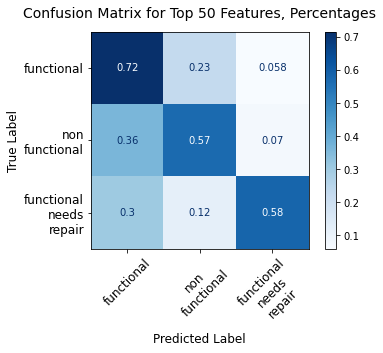

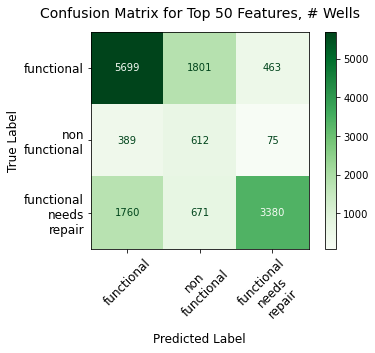

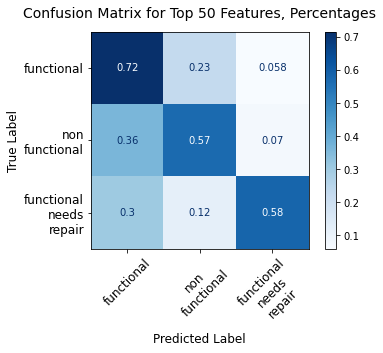

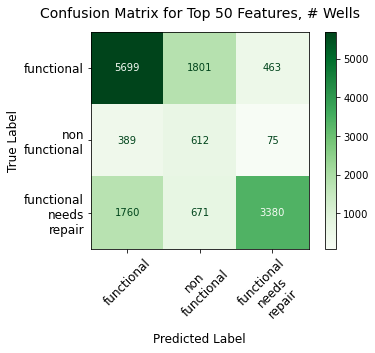

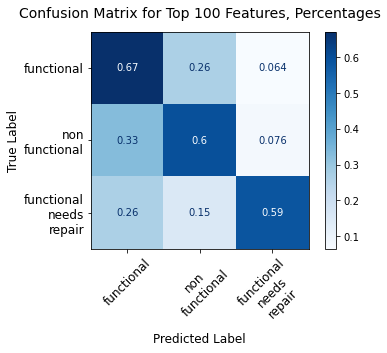

...

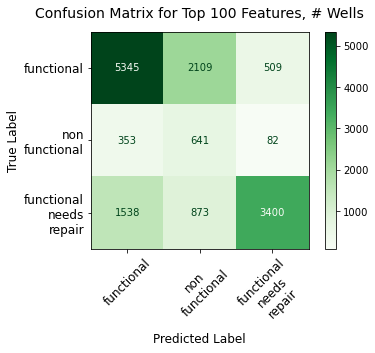

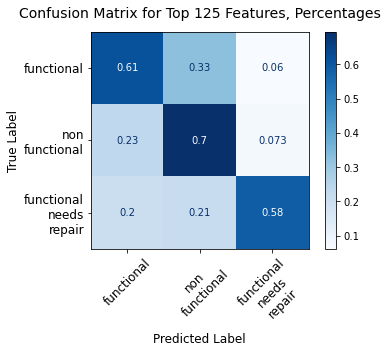

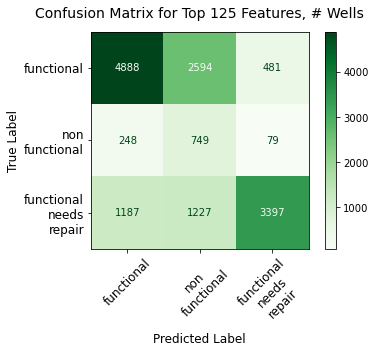

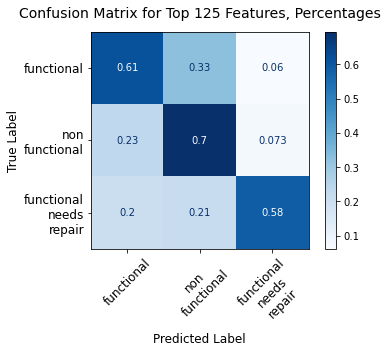

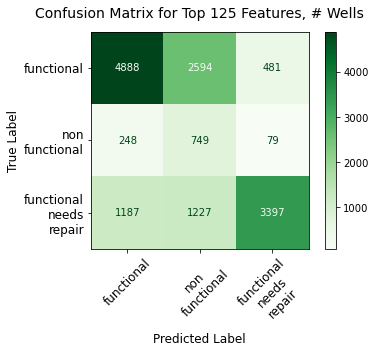

In [654]:
# optimized parameters:  {'criterion': 'gini', 'max_depth': 20, 'min_samples_split': 5}

start = timeit.default_timer()


df_ns, X_trains_SMOTE, clfs_SMOTE, \
acc_scores_SMOTE, train_scores_SMOTE, \
test_scores_SMOTE, jaccard_scores_SMOTE, \
feat_importances_SMOTE, \
parameters_SMOTE, imp_tables_SMOTE, \
summ_importance_tables_SMOTE = imb_mult_top_n_SMOTE_dt(df, features, features_top_n, all_model_features, 
                                                       random_state=123, n_range=[50, 100, 125], 
                                                       criterion='gini', max_depth=20, min_samples_split=5, 
                                                       col_title_length=7, cmap=plt.cm.Blues)



end = timeit.default_timer()
print('=====================================================')
print('TOTAL RUN TIME (seconds):', end-start)    
print('=====================================================')
print()

In [655]:
acc_scores_SMOTE

[65.25925925925927, 63.20538720538721, 60.83501683501683]

In [656]:
jaccard_scores_SMOTE

[array([0.56358782, 0.17249154, 0.5323673 ]),
 array([0.54241932, 0.15795959, 0.53108404]),
 array([0.52011066, 0.15295079, 0.5331973 ])]

#### Conclusion on decision tree hyperparameter tuning for SMOTE rebalanced data

For the features funder and lga (along with the following features included in all model runs:  'payment', 'water_quality', 'quantity_group', 'source', 'extraction_type_class', 'status_group', 'waterpoint_type', 'permit', and 'public_meeting'), the n-values yielding the best combination of accuracy and reduced false negatives were 25 and 50.  The optimized hyperparameters are 'criterion': 'gini', 'min_samples_split': 5, and 'max_depth': 30 (which was the maximum of the range I set).

### Decision Trees: Findings on class_weight vs. SMOTE (resampling) for reducing false negatives

In looking at the confusion matrices that result from using class_weight vs. resampling (SMOTE) using decision trees for modeling, we can see that both approaches do significantly better at correctly predicting wells that need repair or are non-functional ('false negatives').  This is an important finding, since such wells are more important to identify correctly than functional wells, as discussed above.

Overall accuracy levels are just slightly higher with SMOTE than in using the class_weight argument in the decision tree classifier.  However, class_weight = 'balanced' does a much better job of reducing costly false negatives (non-functional and needing-repair wells categorized as 'functional'--0.19 and 0.2, respectively for balanced class_weight vs. SMOTE, which ranged from 26% up to 40%).

__Note__:  while not providing the highest overall accuracy score, the rebalanced DT model (class_weight='balanced') with funder, scheme_name, and lga n=25 provide the _lowest false negatives_ (non-functional and needing-repair wells categorized as 'functional') that I've seen with decision tree models (0.11 and 0.20, respectively).

**_Final thoughts_**:  If overall accuracy of prediction is the goal, then the original (non-resampled) data set will give the highest accuracy scores for decision tree models.  However, if the goal is to more accurately predict non-functional or functional-needs-repairs wells, then it's critically important to use a rebalancing method.  Between SMOTE and class_weight='balanced' approaches, I found that class_weight='balanced' provided better performance in reducing false-negative errors, while giving overall accuracy scores that are only 1-2% less than SMOTE overall.

## Modeling:  Ensemble methods--Bagged Trees

### Bagged Trees model, no resampling, using 'lga' as geographic locator

In [657]:
from sklearn.metrics import classification_report
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier

In [658]:
# df = df_train1.copy()    # run this cell if dataframe reset is needed
df.head(3)

,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,permit,construction_year,extraction_type_class,management,payment,water_quality,quantity_group,source,waterpoint_type,status_group,pop_binned
id,,,,,,,,,,,,,,,,,,,,
69572,roman,roman,none,Lake Nyasa,mnyusi_b,Iringa,Ludewa,Mundindi,True,False,1999,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,functional,"(100, 150]"
8776,grumeti,grumeti,zahanati,Lake Victoria,nyamara,Mara,Serengeti,Natta,NaN,True,2010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional,"(200, 300]"
34310,lottery_club,world_vision,kwa_mahundi,Pangani,majengo,Manyara,Simanjiro,Ngorika,True,True,2009,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,functional,"(200, 300]"


In [659]:
features = ['funder', 'lga', 'management', 'payment', 'water_quality', 'quantity_group', 'source', 
            'extraction_type_class', 'status_group', 'waterpoint_type', 'permit', 'public_meeting']

features_top_n = ['funder', 'lga']

all_model_features = ['funder_duplicate', 'lga_duplicate', 'management', 'permit', 'public_meeting', 
                      'payment', 'water_quality', 'quantity_group', 'source', 
                      'extraction_type_class', 'status_group', 'waterpoint_type']


In [660]:
# Run function without resampling first

df, X, y = top_n_encode(df, features, features_top_n, all_model_features, n=125, p=126)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=123)

##### Max_depth=20

In [661]:
start = timeit.default_timer()

# Instantiate a BaggingClassifier
bagged_tree = BaggingClassifier(DecisionTreeClassifier(criterion='gini', max_depth=20, 
                                                       random_state=123), n_estimators=20)

# Fit to the training data
bagged_tree.fit(X_train, y_train)


print('Run time (seconds):', end-start)    
print()




Run time (seconds): -80.8410771660001



In [662]:
bagged_tree.get_params()

{'base_estimator__ccp_alpha': 0.0,
 'base_estimator__class_weight': None,
 'base_estimator__criterion': 'gini',
 'base_estimator__max_depth': 20,
 'base_estimator__max_features': None,
 'base_estimator__max_leaf_nodes': None,
 'base_estimator__min_impurity_decrease': 0.0,
 'base_estimator__min_impurity_split': None,
 'base_estimator__min_samples_leaf': 1,
 'base_estimator__min_samples_split': 2,
 'base_estimator__min_weight_fraction_leaf': 0.0,
 'base_estimator__random_state': 123,
 'base_estimator__splitter': 'best',
 'base_estimator': DecisionTreeClassifier(max_depth=20, random_state=123),
 'bootstrap': True,
 'bootstrap_features': False,
 'max_features': 1.0,
 'max_samples': 1.0,
 'n_estimators': 20,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

In [663]:
# Training accuracy score
bagged_train_score = bagged_tree.score(X_train, y_train)
bagged_train_score

0.8119640852974186

In [664]:
# Testing accuracy score
bagged_test_score = bagged_tree.score(X_test, y_test)
bagged_test_score

0.7760942760942761

In [665]:
# Model predictions
bagged_tree_train_preds = bagged_tree.predict(X_train)
bagged_tree_test_preds = bagged_tree.predict(X_test)

In [666]:
# Bagged tree confusion matrix

bagged_tree_confusion_matrix = confusion_matrix(y_test, bagged_tree_test_preds)
bagged_tree_confusion_matrix

array([[7426,   94,  443],
       [ 697,  241,  138],
       [1880,   73, 3858]])

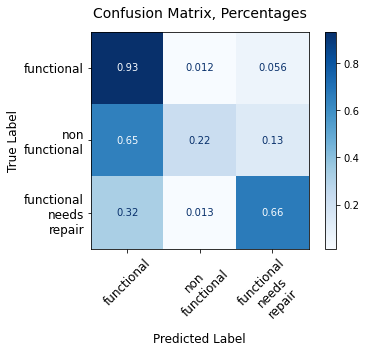

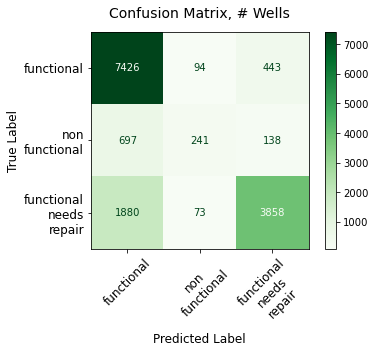

In [667]:
# Bagged tree plot_confusion_matrix

plot_conf_matrix_norm_abs(df, bagged_tree, X_test, y_test, title='Confusion Matrix', 
                          titlefont=14, x_y_tick_font=12, pad=14, x_y_label_font=12, 
                          xticks_rotation=45, cmap=plt.cm.Blues)

# (.65, .32)

We can see that bagged trees gives similar results as previous tree models in terms of false negative errors (miscategorizing 68% of non-functional wells as functional and 33% of functional-needing-repair wells as functional).  Let's look at bagged trees with SMOTE-resampled data.

### Bagged trees with SMOTE resampling

In [668]:
df = df_train1.copy()    # run this cell if dataframe reset is needed
df.head(3)

,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,permit,construction_year,extraction_type_class,management,payment,water_quality,quantity_group,source,waterpoint_type,status_group,pop_binned
id,,,,,,,,,,,,,,,,,,,,
69572,roman,roman,none,Lake Nyasa,mnyusi_b,Iringa,Ludewa,Mundindi,True,False,1999,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,functional,"(100, 150]"
8776,grumeti,grumeti,zahanati,Lake Victoria,nyamara,Mara,Serengeti,Natta,NaN,True,2010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional,"(200, 300]"
34310,lottery_club,world_vision,kwa_mahundi,Pangani,majengo,Manyara,Simanjiro,Ngorika,True,True,2009,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,functional,"(200, 300]"


In [669]:
features = ['funder', 'lga', 'management', 'payment', 'water_quality', 'quantity_group', 'source', 
            'extraction_type_class', 'status_group', 'waterpoint_type', 'permit', 'public_meeting']

features_top_n = ['funder', 'lga']

all_model_features = ['funder_duplicate', 'lga_duplicate', 'management', 'permit', 'public_meeting', 
                      'payment', 'water_quality', 'quantity_group', 'source', 
                      'extraction_type_class', 'status_group', 'waterpoint_type']


In [670]:
# train_test_split
df_n, X_train_SMOTE, X_test, \
y_train_SMOTE, y_test  = SMOTE_top_n_tts(df, features, features_top_n, all_model_features, 
                                         n=125, p=126, test_size=0.25, random_state=123)


Counter({0: 24296, 2: 17013, 1: 3241})
Counter({0: 24296, 1: 24296, 2: 24296})
Run time (seconds): 5.099356208000245



In [671]:
start = timeit.default_timer()

# Instantiate a BaggingClassifier
bagged_tree_SMOTE = BaggingClassifier(DecisionTreeClassifier(random_state=123, criterion='gini', max_depth=20, 
                                                             min_samples_split=5), n_estimators=10)  # using default for n_estimators (10)

# Fit to the training data
bagged_tree_SMOTE.fit(X_train_SMOTE, y_train_SMOTE)
print(bagged_tree_SMOTE.get_params())


end = timeit.default_timer()
print('Run time (seconds):', end-start)    
print()

{'base_estimator__ccp_alpha': 0.0, 'base_estimator__class_weight': None, 'base_estimator__criterion': 'gini', 'base_estimator__max_depth': 20, 'base_estimator__max_features': None, 'base_estimator__max_leaf_nodes': None, 'base_estimator__min_impurity_decrease': 0.0, 'base_estimator__min_impurity_split': None, 'base_estimator__min_samples_leaf': 1, 'base_estimator__min_samples_split': 5, 'base_estimator__min_weight_fraction_leaf': 0.0, 'base_estimator__random_state': 123, 'base_estimator__splitter': 'best', 'base_estimator': DecisionTreeClassifier(max_depth=20, min_samples_split=5, random_state=123), 'bootstrap': True, 'bootstrap_features': False, 'max_features': 1.0, 'max_samples': 1.0, 'n_estimators': 10, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}
Run time (seconds): 6.71463629200116



In [672]:
# Training accuracy score
bagged_train_score_SMOTE = bagged_tree_SMOTE.score(X_train_SMOTE, y_train_SMOTE)
print("Bagged tree training score:  {}".format(bagged_train_score_SMOTE))

# Testing accuracy score
bagged_test_score_SMOTE = bagged_tree_SMOTE.score(X_test, y_test)
print("Bagged tree test score:  {}".format(bagged_test_score_SMOTE))

# Model predictions
bagged_tree_train_preds_SMOTE = bagged_tree_SMOTE.predict(X_train_SMOTE)
bagged_tree_test_preds_SMOTE = bagged_tree_SMOTE.predict(X_test)


Bagged tree training score:  0.7571342333443091
Bagged tree test score:  0.6727946127946128


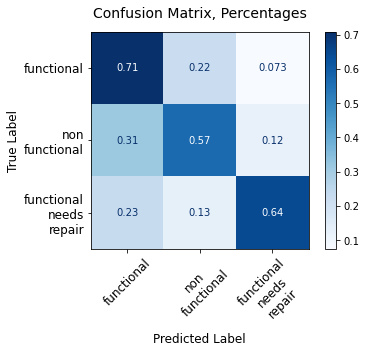

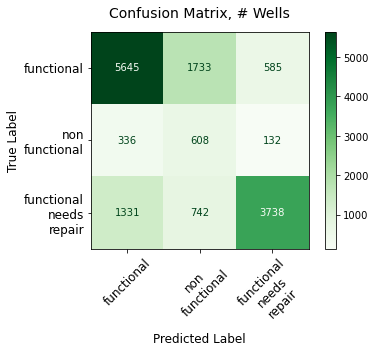

In [673]:
disp_bagged_tree_SMOTE = plot_conf_matrix_norm_abs(df_n, bagged_tree_SMOTE, X_test, y_test, title='Confusion Matrix', 
                                                   titlefont=14, x_y_tick_font=12, pad=14, x_y_label_font=12, 
                                                   xticks_rotation=45, cmap=plt.cm.Blues)


In [674]:
bagged_tree_SMOTE.get_params()

{'base_estimator__ccp_alpha': 0.0,
 'base_estimator__class_weight': None,
 'base_estimator__criterion': 'gini',
 'base_estimator__max_depth': 20,
 'base_estimator__max_features': None,
 'base_estimator__max_leaf_nodes': None,
 'base_estimator__min_impurity_decrease': 0.0,
 'base_estimator__min_impurity_split': None,
 'base_estimator__min_samples_leaf': 1,
 'base_estimator__min_samples_split': 5,
 'base_estimator__min_weight_fraction_leaf': 0.0,
 'base_estimator__random_state': 123,
 'base_estimator__splitter': 'best',
 'base_estimator': DecisionTreeClassifier(max_depth=20, min_samples_split=5, random_state=123),
 'bootstrap': True,
 'bootstrap_features': False,
 'max_features': 1.0,
 'max_samples': 1.0,
 'n_estimators': 10,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

##### Findings

While the test accuracy score is much lower for the SMOTE example than the non-resampled model (77.2% vs. 68.3%), the SMOTE model does substantially better at classifying wells needing repair or replacement.

### Tuning: SMOTE resampled data

In [675]:
# Using X_train_SMOTE, y_train_SMOTE from above

start = timeit.default_timer()

# {'criterion': 'gini', 'max_depth': 20, 'min_samples_split': 5}

# Instantiate a BaggingClassifier
bagged_tree_tuned = BaggingClassifier(DecisionTreeClassifier(random_state=123, criterion='gini', 
                                                             max_depth=20, min_samples_split=5), n_jobs=-1)

# set up GridSearchCV parameter grid for bagged trees
n_estimators = [10, 20, 100, 1000]
grid = dict(n_estimators = n_estimators)
                                
# GridSearchCV tuning
grid_search = GridSearchCV(bagged_tree_tuned, param_grid=grid, scoring='accuracy', error_score=0)
grid_result = grid_search.fit(X_train_SMOTE, y_train_SMOTE)
grid_result.best_params_

end = timeit.default_timer()
print('Run time (seconds):', end-start)    
print()


Run time (seconds): 924.7241401249994



In [676]:
# Mean training score
grid_result_training_score = grid_result.score(X_train_SMOTE, y_train_SMOTE)

# Mean test score
grid_result_testing_score = grid_result.score(X_test, y_test)

print(f"Mean Training Score: {grid_result_training_score :.2%}")
print(f"Mean Test Score: {grid_result_testing_score :.2%}")
print(f"Best Parameter Combination Found During Grid Search: {grid_result.best_params_}")


Mean Training Score: 76.47%
Mean Test Score: 67.73%
Best Parameter Combination Found During Grid Search: {'n_estimators': 100}


In [677]:
grid_result.cv_results_

{'mean_fit_time': array([  2.38717499,   3.62289281,  15.65405197, 156.03413339]),
 'std_fit_time': array([0.30580654, 0.14801826, 0.13666273, 2.4045817 ]),
 'mean_score_time': array([0.17732244, 0.1955442 , 0.35283041, 2.28911262]),
 'std_score_time': array([0.00199348, 0.00650688, 0.01481926, 0.05750879]),
 'param_n_estimators': masked_array(data=[10, 20, 100, 1000],
              mask=[False, False, False, False],
        fill_value='?',
             dtype=object),
 'params': [{'n_estimators': 10},
  {'n_estimators': 20},
  {'n_estimators': 100},
  {'n_estimators': 1000}],
 'split0_test_score': array([0.72972973, 0.73933324, 0.74036219, 0.73837289]),
 'split1_test_score': array([0.73185622, 0.73151324, 0.7380985 , 0.73864728]),
 'split2_test_score': array([0.73947043, 0.74633009, 0.74838798, 0.74955412]),
 'split3_test_score': array([0.741785  , 0.73458188, 0.73650271, 0.7358853 ]),
 'split4_test_score': array([0.73519929, 0.74439185, 0.74356864, 0.74322563]),
 'mean_test_score': ar

## Running bagged tree model with SMOTE data and optimized n_estimators parameter (max_depth=20) 

In [365]:
# Instantiate a BaggingClassifier
bagged_tree_20 = BaggingClassifier(DecisionTreeClassifier(random_state=123, criterion='gini', max_depth=20, 
                                                          min_samples_split=5), n_jobs=-1, n_estimators=1000)

# Fit to the training data
bagged_tree_20.fit(X_train_SMOTE, y_train_SMOTE)
print(bagged_tree_20.get_params())

{'base_estimator__ccp_alpha': 0.0, 'base_estimator__class_weight': None, 'base_estimator__criterion': 'gini', 'base_estimator__max_depth': 20, 'base_estimator__max_features': None, 'base_estimator__max_leaf_nodes': None, 'base_estimator__min_impurity_decrease': 0.0, 'base_estimator__min_impurity_split': None, 'base_estimator__min_samples_leaf': 1, 'base_estimator__min_samples_split': 5, 'base_estimator__min_weight_fraction_leaf': 0.0, 'base_estimator__random_state': 123, 'base_estimator__splitter': 'best', 'base_estimator': DecisionTreeClassifier(max_depth=20, min_samples_split=5, random_state=123), 'bootstrap': True, 'bootstrap_features': False, 'max_features': 1.0, 'max_samples': 1.0, 'n_estimators': 1000, 'n_jobs': -1, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}


In [366]:
# Training accuracy score
bagged_train_score_20 = bagged_tree_20.score(X_train_SMOTE, y_train_SMOTE)
print("Bagged tree training score:  {}".format(bagged_train_score_20))

# Testing accuracy score
bagged_test_score_20 = bagged_tree_20.score(X_test, y_test)
print("Bagged tree test score:  {}".format(bagged_test_score_20))

# Model predictions
bagged_tree_train_preds_20 = bagged_tree_20.predict(X_train_SMOTE)
bagged_tree_test_preds_20 = bagged_tree_20.predict(X_test)


Bagged tree training score:  0.7651876852156734
Bagged tree test score:  0.6779124579124579


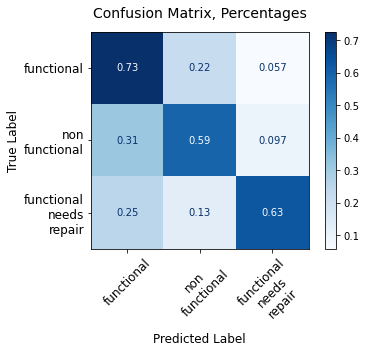

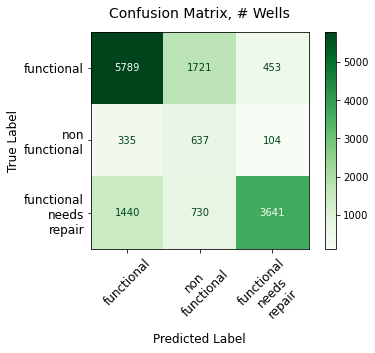

In [367]:
disp_bagged_tree_20 = plot_conf_matrix_norm_abs(df_n, bagged_tree_20, X_test, y_test, 
                                                title='Confusion Matrix', titlefont=14, x_y_tick_font=12, 
                                                pad=14, x_y_label_font=12, xticks_rotation=45, cmap=plt.cm.Blues)

# false negatives = .31, .25

### Tuning bagged trees: SMOTE resampled data, max_depth=30

In [368]:
# Using X_train_SMOTE, y_train_SMOTE from above
# {'criterion': 'gini', 'max_depth': 30, 'min_samples_split': 5}

# Instantiate a BaggingClassifier
bagged_tree_tuned = BaggingClassifier(DecisionTreeClassifier(random_state=123, criterion='gini', 
                                                             max_depth=30, min_samples_split=5), n_jobs=-1)

# set up GridSearchCV parameter grid for bagged trees
n_estimators = [10, 20, 100, 1000]
grid = dict(n_estimators = n_estimators)
                                
# GridSearchCV tuning
grid_search = GridSearchCV(bagged_tree_tuned, param_grid=grid, scoring='accuracy', error_score=0)
grid_result = grid_search.fit(X_train_SMOTE, y_train_SMOTE)
grid_result.best_params_

{'n_estimators': 1000}

In [369]:
# Mean training score
grid_result_training_score = grid_result.score(X_train_SMOTE, y_train_SMOTE)

# Mean test score
grid_result_testing_score = grid_result.score(X_test, y_test)

print(f"Mean Training Score: {grid_result_training_score :.2%}")
print(f"Mean Test Score: {grid_result_testing_score :.2%}")
print(f"Best Parameter Combination Found During Grid Search: {grid_result.best_params_}")

# Last output:  
# Mean Training Score: 82.75%
# Mean Test Score: 73.71%
# Best Parameter Combination Found During Grid Search: {'n_estimators': 100}


Mean Training Score: 82.75%
Mean Test Score: 73.95%
Best Parameter Combination Found During Grid Search: {'n_estimators': 1000}


In [370]:
grid_result.cv_results_ 

{'mean_fit_time': array([  2.64751215,   4.51863027,  20.86355462, 214.14222951]),
 'std_fit_time': array([0.01904502, 0.05526167, 0.07716543, 6.51485264]),
 'mean_score_time': array([0.20601783, 0.20833697, 0.42152162, 3.21578503]),
 'std_score_time': array([0.00857662, 0.00729737, 0.00705594, 0.33365482]),
 'param_n_estimators': masked_array(data=[10, 20, 100, 1000],
              mask=[False, False, False, False],
        fill_value='?',
             dtype=object),
 'params': [{'n_estimators': 10},
  {'n_estimators': 20},
  {'n_estimators': 100},
  {'n_estimators': 1000}],
 'split0_test_score': array([0.7774729 , 0.78693922, 0.78508712, 0.78597887]),
 'split1_test_score': array([0.78172589, 0.78220606, 0.78241185, 0.78103992]),
 'split2_test_score': array([0.78062834, 0.78570449, 0.78831115, 0.78789957]),
 'split3_test_score': array([0.77498799, 0.77690883, 0.77725184, 0.78136791]),
 'split4_test_score': array([0.77265555, 0.77793785, 0.77951568, 0.7811621 ]),
 'mean_test_score': ar

In [381]:
# Instantiate a BaggingClassifier


bagged_tree_30 = BaggingClassifier(DecisionTreeClassifier(random_state=123, criterion='gini', max_depth=30, 
                                                          min_samples_split=5), n_jobs=-1, n_estimators=1000)

# Fit to the training data
bagged_tree_30.fit(X_train_SMOTE, y_train_SMOTE)
print(bagged_tree_30.get_params())


0.304043296
{'base_estimator__ccp_alpha': 0.0, 'base_estimator__class_weight': None, 'base_estimator__criterion': 'gini', 'base_estimator__max_depth': 30, 'base_estimator__max_features': None, 'base_estimator__max_leaf_nodes': None, 'base_estimator__min_impurity_decrease': 0.0, 'base_estimator__min_impurity_split': None, 'base_estimator__min_samples_leaf': 1, 'base_estimator__min_samples_split': 5, 'base_estimator__min_weight_fraction_leaf': 0.0, 'base_estimator__random_state': 123, 'base_estimator__splitter': 'best', 'base_estimator': DecisionTreeClassifier(max_depth=30, min_samples_split=5, random_state=123), 'bootstrap': True, 'bootstrap_features': False, 'max_features': 1.0, 'max_samples': 1.0, 'n_estimators': 1000, 'n_jobs': -1, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}
0.305274818


In [380]:
time.process_time()/1000

0.304026163

In [382]:
# Training accuracy score
bagged_train_score_30 = bagged_tree_30.score(X_train_SMOTE, y_train_SMOTE)
print("Bagged tree training score:  {}".format(bagged_train_score_30))

# Testing accuracy score
bagged_test_score_30 = bagged_tree_30.score(X_test, y_test)
print("Bagged tree test score:  {}".format(bagged_test_score_30))

# Model predictions
bagged_tree_train_preds_30 = bagged_tree_30.predict(X_train_SMOTE)
bagged_tree_test_preds_30 = bagged_tree_30.predict(X_test)


Bagged tree training score:  0.8280238173636264
Bagged tree test score:  0.7396632996632997


Execution time (seconds): 5.6565495830000145


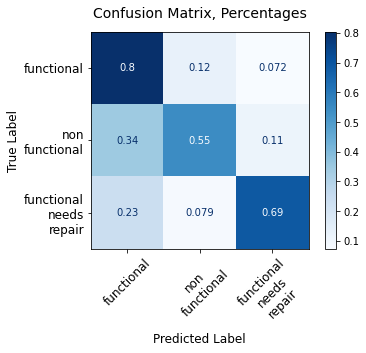

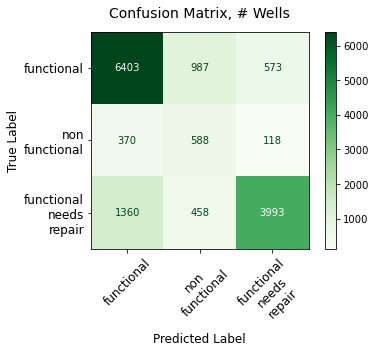

In [388]:
start = timeit.default_timer()

disp_bagged_tree_30 = plot_conf_matrix_norm_abs(df_n, bagged_tree_30, X_test, y_test, 
                                                title='Confusion Matrix', titlefont=14, x_y_tick_font=12, 
                                                pad=14, x_y_label_font=12, xticks_rotation=45, cmap=plt.cm.Blues)

end = timeit.default_timer()
print('Execution time (seconds):', end-start)

# false negatives:  0.35, 0.24

### Findings on performance of bagged tree models

As with decision trees, bagged trees require rebalancing to minimize costly false negatives.  And similar to decision trees, max_depth is a very important parameter.  When max_depth=30 with SMOTE data, training accuracy is ~82% and test accuracy is ~74%.  When max_depth=20, however, these values fall to 74.7% and 71.7%, respectively.

## Modeling: Ensemble methods--Random Forest

### Random Forest Functions

#### Random Forest Function: perform resampling (if applicable), encoding, train-test-split, and modeling; display results

In [384]:
# import timeit
# start = timeit.default_timer()
# end = timeit.default_timer()
# print('Run time (seconds):', end-start)

In [678]:
def rf_model_run(df, features, features_top_n, all_model_features, n=125, p=126, 
                      run_SMOTE=False, test_size=0.25, random_state=123, criterion='gini', 
                      n_estimators=20, max_depth=20, n_jobs=-1, min_samples_leaf=1, 
                      min_samples_split=5):
    
    start = timeit.default_timer()
    
    # copy df
    df = df.copy()
    
    df_n, X_train, X_test, y_train, y_test = top_n_encode_tts(df, features, features_top_n, 
                                                              all_model_features, n=n, p=p, 
                                                              test_size=test_size, random_state=random_state)
    
    # rebalance data?
    if run_SMOTE:
        # Use SMOTE resampling on X_train and y_train
        counter = Counter(y_train)
        print(counter)
        # define pipeline
        over = SMOTE(random_state=random_state)
        under = RandomUnderSampler(random_state=random_state)
        steps = [('o', over), ('u', under)]
        pipeline = Pipeline(steps=steps)
        # transform the dataset
        X_train, y_train = pipeline.fit_resample(X_train, y_train)
        # summarize the new class distribution
        counter = Counter(y_train)
        print(counter)
        
        
    # Instantiate and fit a RandomForestClassifier
    clf_rf = RandomForestClassifier(n_estimators=n_estimators, random_state=random_state, 
                                    criterion=criterion, min_samples_leaf=min_samples_leaf, 
                                    min_samples_split=min_samples_split,
                                    max_depth=max_depth, n_jobs=n_jobs)
    
    # Fit RF classifier
    clf_rf.fit(X_train, y_train)
    
    # Training accuracy score
    train_score = clf_rf.score(X_train, y_train)
    print(train_score)
    
    # Testing accuracy score
    test_score = clf_rf.score(X_test, y_test)
    print(test_score)
    
    # Get parameters
    params = clf_rf.get_params()
    
    # Generate detailed feature importances table
    print("Individual feature importances--showing top 10:")
    imp_table = importance_table(X_train, clf_rf)
    display(imp_table.head(10))
    print()
    
    # Generate high-level feature importances table
    print("Roll-up summary feature importance table, all features:")
    summ_imp_table = summary_imp_table(X_train, clf_rf, col_title_length=7)
    display(summ_imp_table)
    print()
     
    # print formatted confusion matrix
    disp_rf = plot_conf_matrix_norm_abs(df_n, clf_rf, X_test, y_test, title='Confusion Matrix', 
                                        titlefont=14, x_y_tick_font=12, pad=14, x_y_label_font=12, 
                                        xticks_rotation=45, cmap=plt.cm.Blues)
    
    print()
    end = timeit.default_timer()
    print('Run time (seconds):', end-start)
    print()
    
    return df_n, X_train, clf_rf, train_score, test_score, params, imp_table, summ_imp_table
    
    
    

#### Random Forest Function: perform class_weight resampling, encoding, train-test-split, and modeling; display results, include subset of dummy variables roll-up table

In [679]:
def rf_model_run_cw(df, features, features_top_n, all_model_features, n=125, p=126, test_size=0.25, 
                         random_state=123, criterion='gini', max_depth=20, min_samples_leaf=1, 
                         min_samples_split=5, class_weight='balanced', n_estimators=20, n_jobs=-1):
    
    start = timeit.default_timer()
    
    # copy df
    df = df.copy()
    
    df_n, X_train, X_test, y_train, y_test = top_n_encode_tts(df, features, features_top_n, 
                                                              all_model_features, n=n, p=p, 
                                                              test_size=test_size, random_state=random_state)        
        
    # Instantiate and fit a RandomForestClassifier
    clf_rf = RandomForestClassifier(n_estimators=n_estimators, random_state=random_state, 
                                    min_samples_leaf=min_samples_leaf, criterion=criterion, 
                                    min_samples_split=min_samples_split, max_depth=max_depth, 
                                    class_weight=class_weight, n_jobs=n_jobs)
    
    # Fit RF classifier
    clf_rf.fit(X_train, y_train)
    
    # Training accuracy score
    train_score = clf_rf.score(X_train, y_train)
    print(train_score)
    
    # Testing accuracy score
    test_score = clf_rf.score(X_test, y_test)
    print(test_score)
    
    # Get parameters
    params = clf_rf.get_params()
    
    # Generate detailed feature importances table
    print("Individual feature importances--showing top 10:")
    imp_table = importance_table(X_train, clf_rf)
    display(imp_table.head(10))
    print()
    
    # Generate high-level feature importances table
    print("Roll-up summary feature importance table, all features:")
    summ_imp_table = summary_imp_table(X_train, clf_rf, col_title_length=7)
    display(summ_imp_table)
    print()
     
    # print formatted confusion matrix
    disp_rf = plot_conf_matrix_norm_abs(df_n, clf_rf, X_test, y_test, title='Confusion Matrix', 
                                        titlefont=14, x_y_tick_font=12, pad=14, x_y_label_font=12, 
                                        xticks_rotation=45, cmap=plt.cm.Blues)

    print()
    end = timeit.default_timer()
    print('Run time (seconds):', end-start)
    print()
    
    return df_n, X_train, clf_rf, train_score, test_score, params, imp_table, summ_imp_table
    
#     df_n, X_train, clf_rf, \
#     train_score, test_score, \
#     params, imp_table, \
#     summ_imp_table = rf_model_run_subs_cw(df, features, features_top_n, all_model_features, n=125, p=126, 
#                                               test_size=0.25, random_state=123, criterion='gini', max_depth=20, 
#                                               min_samples_leaf=1, min_samples_split=2, class_weight='balanced', 
#                                               n_estimators=20, n_jobs=-1, num_feats_incl=100)
    

### Modeling--Random Forest, non-rebalanced data

In [680]:
# df = df_train1.copy()    # run this cell if dataframe reset is needed
df.head(3)

,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,permit,construction_year,extraction_type_class,management,payment,water_quality,quantity_group,source,waterpoint_type,status_group,pop_binned
id,,,,,,,,,,,,,,,,,,,,
69572,roman,roman,none,Lake Nyasa,mnyusi_b,Iringa,Ludewa,Mundindi,True,False,1999,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,functional,"(100, 150]"
8776,grumeti,grumeti,zahanati,Lake Victoria,nyamara,Mara,Serengeti,Natta,NaN,True,2010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional,"(200, 300]"
34310,lottery_club,world_vision,kwa_mahundi,Pangani,majengo,Manyara,Simanjiro,Ngorika,True,True,2009,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,functional,"(200, 300]"


#### Funder, LGA (n=125); permit, public_meeting; max_depth=20

In [681]:
features = ['funder', 'lga', 'management', 'payment', 'water_quality', 'quantity_group', 'source', 
            'extraction_type_class', 'status_group', 'waterpoint_type', 'permit', 'public_meeting']

features_top_n = ['funder', 'lga']

all_model_features = ['funder_duplicate', 'lga_duplicate', 'management', 'permit', 'public_meeting', 
                      'payment', 'water_quality', 'quantity_group', 'source', 
                      'extraction_type_class', 'status_group', 'waterpoint_type']


0.7955106621773288
0.7643097643097643
Individual feature importances--showing top 10:


,Importance
quantity_group_enough,0.078093
extraction_type_class_other,0.060578
waterpoint_type_other,0.043387
quantity_group_insufficient,0.039997
waterpoint_type_communal standpipe,0.035302
payment_pay per bucket,0.024424
waterpoint_type_hand pump,0.022998
extraction_type_class_handpump,0.021937
payment_pay monthly,0.021220
public_meeting_True,0.018275



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
lga_dup,0.211396
quantit,0.139955
funder_,0.134374
waterpo,0.118894
extract,0.106727
payment,0.085410
source_,0.070862
managem,0.055778
water_q,0.040666




Run time (seconds): 0.6379050409996125



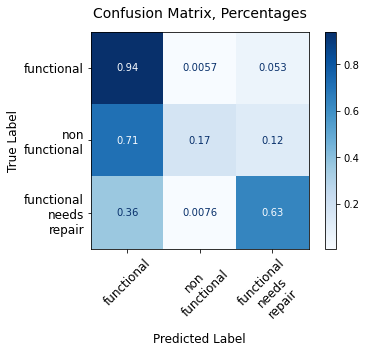

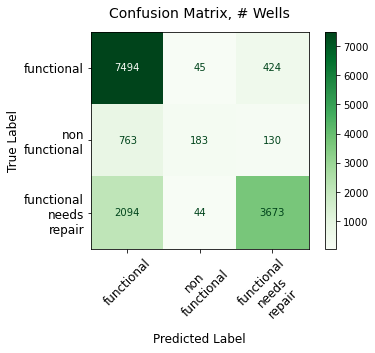

In [683]:
df1, X_train, clf_rf, \
train_score, test_score, \
params, imp_table, \
summ_imp_table = rf_model_run(df, features, features_top_n, all_model_features, n=125, p=126, 
                              run_SMOTE=False, test_size=0.25, random_state=123, criterion='entropy', 
                              n_estimators=20, max_depth=20, n_jobs=-1, min_samples_leaf=1, 
                              min_samples_split=2)


In [684]:
imp_table.head(30)

,Importance
quantity_group_enough,0.078093
extraction_type_class_other,0.060578
waterpoint_type_other,0.043387
quantity_group_insufficient,0.039997
waterpoint_type_communal standpipe,0.035302
payment_pay per bucket,0.024424
waterpoint_type_hand pump,0.022998
extraction_type_class_handpump,0.021937
payment_pay monthly,0.021220
public_meeting_True,0.018275


In [685]:
summ_imp_table

,Importance
var_abbr,
lga_dup,0.211396
quantit,0.139955
funder_,0.134374
waterpo,0.118894
extract,0.106727
payment,0.085410
source_,0.070862
managem,0.055778
water_q,0.040666


Still need to address class imbalance issue due to poor performance on false negatives 

### Modeling--Random Forest, class_weight='balanced'

In [686]:
# df = df_train1.copy()    # run this cell if dataframe reset is needed
df.head(3)

,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,permit,construction_year,extraction_type_class,management,payment,water_quality,quantity_group,source,waterpoint_type,status_group,pop_binned
id,,,,,,,,,,,,,,,,,,,,
69572,roman,roman,none,Lake Nyasa,mnyusi_b,Iringa,Ludewa,Mundindi,True,False,1999,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,functional,"(100, 150]"
8776,grumeti,grumeti,zahanati,Lake Victoria,nyamara,Mara,Serengeti,Natta,NaN,True,2010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional,"(200, 300]"
34310,lottery_club,world_vision,kwa_mahundi,Pangani,majengo,Manyara,Simanjiro,Ngorika,True,True,2009,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,functional,"(200, 300]"


#### Funder, LGA (n=125); class_weight='balanced', max_depth=20

In [687]:
features = ['funder', 'lga', 'management', 'payment', 'water_quality', 'quantity_group', 'source', 
            'extraction_type_class', 'status_group', 'waterpoint_type', 'permit', 'public_meeting']

features_top_n = ['funder', 'lga']

all_model_features = ['funder_duplicate', 'lga_duplicate', 'management', 'permit', 'public_meeting', 
                      'payment', 'water_quality', 'quantity_group', 'source', 
                      'extraction_type_class', 'status_group', 'waterpoint_type']


0.7540965207631875
0.707946127946128
Individual feature importances--showing top 10:


,Importance
quantity_group_enough,0.058371
extraction_type_class_other,0.053917
quantity_group_insufficient,0.037512
waterpoint_type_other,0.030856
payment_pay per bucket,0.026372
lga_duplicate_Kigoma Rural,0.024265
lga_duplicate_Bariadi,0.022965
payment_pay monthly,0.022727
waterpoint_type_communal standpipe,0.022305
extraction_type_class_handpump,0.021896



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
lga_dup,0.246940
funder_,0.148723
quantit,0.116101
extract,0.100334
waterpo,0.086460
source_,0.085823
payment,0.085375
managem,0.056682
water_q,0.039717




Run time (seconds): 0.7315240419993643



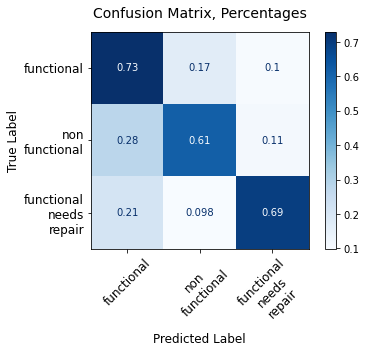

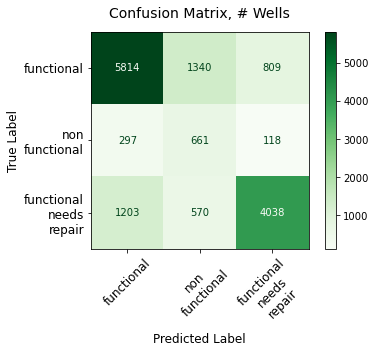

In [688]:
df_n, X_train, clf_rf, \
train_score, test_score, \
params, imp_table, \
summ_imp_table = rf_model_run_cw(df, features, features_top_n, all_model_features, n=125, p=126, test_size=0.25, 
                                 random_state=123, criterion='gini', max_depth=20, min_samples_leaf=1, 
                                 min_samples_split=2, class_weight='balanced', n_estimators=20, n_jobs=-1)


In [689]:
imp_table.head(50)

,Importance
quantity_group_enough,0.058371
extraction_type_class_other,0.053917
quantity_group_insufficient,0.037512
waterpoint_type_other,0.030856
payment_pay per bucket,0.026372
lga_duplicate_Kigoma Rural,0.024265
lga_duplicate_Bariadi,0.022965
payment_pay monthly,0.022727
waterpoint_type_communal standpipe,0.022305
extraction_type_class_handpump,0.021896


In [690]:
summ_imp_table

,Importance
var_abbr,
lga_dup,0.246940
funder_,0.148723
quantit,0.116101
extract,0.100334
waterpo,0.086460
source_,0.085823
payment,0.085375
managem,0.056682
water_q,0.039717


#### Hyperparameter tuning for class_weight resampled data

In [691]:
# df = df_train1.copy()    # run this cell if dataframe reset is needed
df.head(3)

,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,permit,construction_year,extraction_type_class,management,payment,water_quality,quantity_group,source,waterpoint_type,status_group,pop_binned
id,,,,,,,,,,,,,,,,,,,,
69572,roman,roman,none,Lake Nyasa,mnyusi_b,Iringa,Ludewa,Mundindi,True,False,1999,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,functional,"(100, 150]"
8776,grumeti,grumeti,zahanati,Lake Victoria,nyamara,Mara,Serengeti,Natta,NaN,True,2010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional,"(200, 300]"
34310,lottery_club,world_vision,kwa_mahundi,Pangani,majengo,Manyara,Simanjiro,Ngorika,True,True,2009,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,functional,"(200, 300]"


In [692]:
features = ['funder', 'lga', 'management', 'payment', 'water_quality', 'quantity_group', 'source', 
            'extraction_type_class', 'status_group', 'waterpoint_type', 'permit', 'public_meeting']

features_top_n = ['funder', 'lga']

all_model_features = ['funder_duplicate', 'lga_duplicate', 'management', 'permit', 'public_meeting', 
                      'payment', 'water_quality', 'quantity_group', 'source', 
                      'extraction_type_class', 'status_group', 'waterpoint_type']


In [693]:
df = df.copy()

df_n, X_train, X_test, \
y_train, y_test = top_n_encode_tts(df, features, features_top_n, all_model_features, 
                                   n=125, p=126, test_size=0.25, random_state=123)        


In [694]:
start = timeit.default_timer()

# Instantiate and fit a RandomForestClassifier
forest_cw_opt = RandomForestClassifier(random_state = 123, class_weight='balanced')
forest_cw_opt.fit(X_train, y_train)

print()
end = timeit.default_timer()
print('Run time (seconds):', end-start)



Run time (seconds): 8.39926933300012


In [695]:
rf_param_grid = {
    'n_estimators': [10, 30, 100],
    'criterion': ['gini', 'entropy'],
    'max_depth': [2, 6, 10, 20],           # note maximum value here is 20
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 3, 6]
}

In [696]:
start = timeit.default_timer()

rf_grid_search_cw = GridSearchCV(forest_cw_opt, rf_param_grid, cv=3, 
                                    return_train_score=True, n_jobs=-1)
rf_grid_search_cw.fit(X_train, y_train)

print(f"Test Accuracy: {rf_grid_search_cw.best_score_ :.2%}")
print()
print(f"Optimal Parameters: {rf_grid_search_cw.best_params_}")

end = timeit.default_timer()
print('Run time (seconds):', end-start)


Test Accuracy: 71.84%

Optimal Parameters: {'criterion': 'gini', 'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Run time (seconds): 141.39858408299915


In [697]:
start = timeit.default_timer()
rf_train_score_cw = rf_grid_search_cw.score(X_train, y_train)

print('Random forest grid search train score: ', rf_train_score_cw)

end = timeit.default_timer()
print('Run time (seconds):', end-start)

Random forest grid search train score:  0.7726599326599327
Run time (seconds): 0.48095733300215215


In [698]:
start = timeit.default_timer()
rf_test_score_cw = rf_grid_search_cw.score(X_test, y_test)

print('Random forest grid search test score: ', rf_test_score_cw)

end = timeit.default_timer()
print('Run time (seconds):', end-start)

Random forest grid search test score:  0.7207407407407408
Run time (seconds): 0.1734374999978172


In [699]:
rf_grid_search_cw.get_params()

{'cv': 3,
 'error_score': nan,
 'estimator__bootstrap': True,
 'estimator__ccp_alpha': 0.0,
 'estimator__class_weight': 'balanced',
 'estimator__criterion': 'gini',
 'estimator__max_depth': None,
 'estimator__max_features': 'auto',
 'estimator__max_leaf_nodes': None,
 'estimator__max_samples': None,
 'estimator__min_impurity_decrease': 0.0,
 'estimator__min_impurity_split': None,
 'estimator__min_samples_leaf': 1,
 'estimator__min_samples_split': 2,
 'estimator__min_weight_fraction_leaf': 0.0,
 'estimator__n_estimators': 100,
 'estimator__n_jobs': None,
 'estimator__oob_score': False,
 'estimator__random_state': 123,
 'estimator__verbose': 0,
 'estimator__warm_start': False,
 'estimator': RandomForestClassifier(class_weight='balanced', random_state=123),
 'n_jobs': -1,
 'param_grid': {'n_estimators': [10, 30, 100],
  'criterion': ['gini', 'entropy'],
  'max_depth': [2, 6, 10, 20],
  'min_samples_split': [2, 5, 10],
  'min_samples_leaf': [1, 3, 6]},
 'pre_dispatch': '2*n_jobs',
 'refit'

#### Random Forest with class_weight-rebalanced data and optimized hyperparameters (max_depth=20)

In [705]:
# df = df_train1.copy()    # run this cell if dataframe reset is needed
df.head(3)

,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,permit,construction_year,extraction_type_class,management,payment,water_quality,quantity_group,source,waterpoint_type,status_group,pop_binned
id,,,,,,,,,,,,,,,,,,,,
69572,roman,roman,none,Lake Nyasa,mnyusi_b,Iringa,Ludewa,Mundindi,True,False,1999,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,functional,"(100, 150]"
8776,grumeti,grumeti,zahanati,Lake Victoria,nyamara,Mara,Serengeti,Natta,NaN,True,2010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional,"(200, 300]"
34310,lottery_club,world_vision,kwa_mahundi,Pangani,majengo,Manyara,Simanjiro,Ngorika,True,True,2009,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,functional,"(200, 300]"


In [706]:
features = ['funder', 'lga', 'management', 'payment', 'water_quality', 'quantity_group', 'source', 
            'extraction_type_class', 'status_group', 'waterpoint_type', 'permit', 'public_meeting']

features_top_n = ['funder', 'lga']

all_model_features = ['funder_duplicate', 'lga_duplicate', 'management', 'permit', 'public_meeting', 
                      'payment', 'water_quality', 'quantity_group', 'source', 
                      'extraction_type_class', 'status_group', 'waterpoint_type']


0.7726599326599327
0.7207407407407408
Individual feature importances--showing top 10:


,Importance
quantity_group_enough,0.058334
extraction_type_class_other,0.047728
waterpoint_type_other,0.042880
quantity_group_insufficient,0.041509
lga_duplicate_Bariadi,0.030109
payment_pay per bucket,0.023973
payment_pay monthly,0.021833
source_spring,0.021473
source_river,0.021108
waterpoint_type_communal standpipe,0.020121



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
lga_dup,0.250031
funder_,0.145549
quantit,0.120140
waterpo,0.097304
source_,0.090849
extract,0.086905
payment,0.081604
managem,0.056346
water_q,0.038125




Run time (seconds): 2.010975832999975



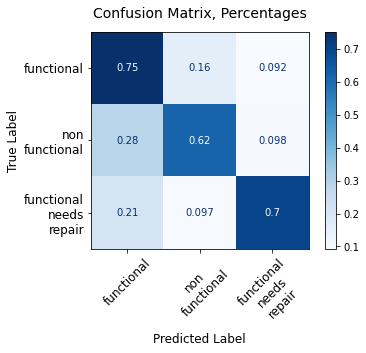

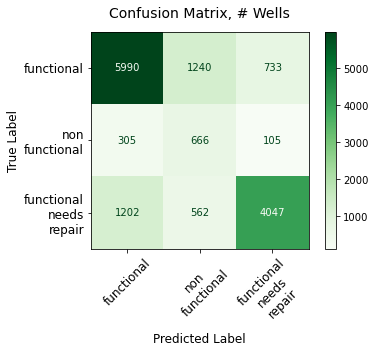

In [707]:
df_n, X_train, clf_rf, \
train_score, test_score, \
params, imp_table, \
summ_imp_table = rf_model_run_cw(df, features, features_top_n, all_model_features, n=125, p=126, 
                                 test_size=0.25, random_state=123, criterion='gini', max_depth=20, 
                                 min_samples_leaf=1, min_samples_split=2, class_weight='balanced', 
                                 n_estimators=100, n_jobs=-1)



In [708]:
imp_table.head(50)

,Importance
quantity_group_enough,0.058334
extraction_type_class_other,0.047728
waterpoint_type_other,0.042880
quantity_group_insufficient,0.041509
lga_duplicate_Bariadi,0.030109
payment_pay per bucket,0.023973
payment_pay monthly,0.021833
source_spring,0.021473
source_river,0.021108
waterpoint_type_communal standpipe,0.020121


In [709]:
summ_imp_table

,Importance
var_abbr,
lga_dup,0.250031
funder_,0.145549
quantit,0.120140
waterpo,0.097304
source_,0.090849
extract,0.086905
payment,0.081604
managem,0.056346
water_q,0.038125


#### Random Forest with class_weight-rebalanced data, n=250, and previously optimized hyperparameters (max_depth=20)

In [710]:
# df = df_train1.copy()    # run this cell if dataframe reset is needed
df.head(3)

,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,permit,construction_year,extraction_type_class,management,payment,water_quality,quantity_group,source,waterpoint_type,status_group,pop_binned
id,,,,,,,,,,,,,,,,,,,,
69572,roman,roman,none,Lake Nyasa,mnyusi_b,Iringa,Ludewa,Mundindi,True,False,1999,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,functional,"(100, 150]"
8776,grumeti,grumeti,zahanati,Lake Victoria,nyamara,Mara,Serengeti,Natta,NaN,True,2010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional,"(200, 300]"
34310,lottery_club,world_vision,kwa_mahundi,Pangani,majengo,Manyara,Simanjiro,Ngorika,True,True,2009,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,functional,"(200, 300]"


In [711]:
features = ['funder', 'lga', 'management', 'payment', 'water_quality', 'quantity_group', 'source', 
            'extraction_type_class', 'status_group', 'waterpoint_type', 'permit', 'public_meeting']

features_top_n = ['funder', 'lga']

all_model_features = ['funder_duplicate', 'lga_duplicate', 'management', 'permit', 'public_meeting', 
                      'payment', 'water_quality', 'quantity_group', 'source', 
                      'extraction_type_class', 'status_group', 'waterpoint_type']


0.8104601571268238
0.7385185185185185
Individual feature importances--showing top 10:


,Importance
quantity_group_enough,0.055922
quantity_group_insufficient,0.041842
extraction_type_class_other,0.037276
waterpoint_type_other,0.031947
lga_duplicate_Bariadi,0.023878
payment_pay per bucket,0.023091
payment_pay monthly,0.021567
permit_True,0.020530
quantity_group_seasonal,0.018339
public_meeting_True,0.017987



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
lga_dup,0.249582
funder_,0.182095
quantit,0.119175
payment,0.085092
source_,0.080734
waterpo,0.076101
extract,0.071192
managem,0.059436
water_q,0.038077




Run time (seconds): 3.3287577500013867



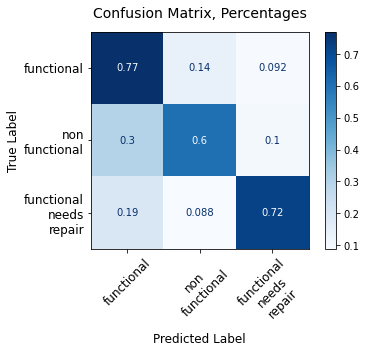

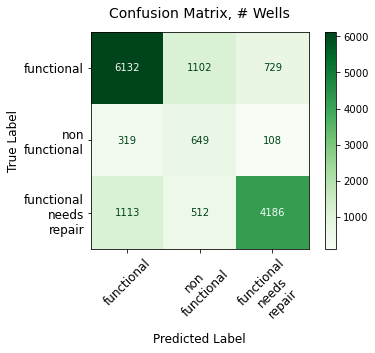

In [712]:
df_n, X_train, clf_rf, \
train_score, test_score, \
params, imp_table, \
summ_imp_table = rf_model_run_cw(df, features, features_top_n, all_model_features, n=250, p=251, 
                                 test_size=0.25, random_state=123, criterion='gini', max_depth=30, 
                                 min_samples_leaf=1, min_samples_split=2, class_weight='balanced', 
                                 n_estimators=100, n_jobs=-1)


In [713]:
imp_table.head(50)

,Importance
quantity_group_enough,0.055922
quantity_group_insufficient,0.041842
extraction_type_class_other,0.037276
waterpoint_type_other,0.031947
lga_duplicate_Bariadi,0.023878
payment_pay per bucket,0.023091
payment_pay monthly,0.021567
permit_True,0.020530
quantity_group_seasonal,0.018339
public_meeting_True,0.017987


In [714]:
summ_imp_table

,Importance
var_abbr,
lga_dup,0.249582
funder_,0.182095
quantit,0.119175
payment,0.085092
source_,0.080734
waterpo,0.076101
extract,0.071192
managem,0.059436
water_q,0.038077


### Modeling--Random Forest, SMOTE resampled data

#### FUNDER, LGA, management, payment, water_quality, quantity_group, source, extraction_type_class, status_group, waterpoint_type, permit, public_meeting

In [715]:
# df = df_train1.copy()    # run this cell if dataframe reset is needed
df.head(3)

,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,permit,construction_year,extraction_type_class,management,payment,water_quality,quantity_group,source,waterpoint_type,status_group,pop_binned
id,,,,,,,,,,,,,,,,,,,,
69572,roman,roman,none,Lake Nyasa,mnyusi_b,Iringa,Ludewa,Mundindi,True,False,1999,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,functional,"(100, 150]"
8776,grumeti,grumeti,zahanati,Lake Victoria,nyamara,Mara,Serengeti,Natta,NaN,True,2010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional,"(200, 300]"
34310,lottery_club,world_vision,kwa_mahundi,Pangani,majengo,Manyara,Simanjiro,Ngorika,True,True,2009,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,functional,"(200, 300]"


In [716]:
features = ['funder', 'lga', 'management', 'payment', 'water_quality', 'quantity_group', 'source', 
            'extraction_type_class', 'status_group', 'waterpoint_type', 'permit', 'public_meeting']

features_top_n = ['funder', 'lga']

all_model_features = ['funder_duplicate', 'lga_duplicate', 'management', 'permit', 'public_meeting', 
                      'payment', 'water_quality', 'quantity_group', 'source', 
                      'extraction_type_class', 'status_group', 'waterpoint_type']


Counter({0: 24296, 2: 17013, 1: 3241})
Counter({0: 24296, 1: 24296, 2: 24296})
0.7899242673691143
0.7115824915824915
Individual feature importances--showing top 10:


,Importance
quantity_group_enough,0.067228
waterpoint_type_other,0.060845
quantity_group_insufficient,0.058794
payment_pay per bucket,0.034060
extraction_type_class_other,0.033993
lga_duplicate_Bariadi,0.031792
payment_pay monthly,0.026812
source_spring,0.024150
waterpoint_type_communal standpipe,0.022742
quantity_group_seasonal,0.022716



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
lga_dup,0.200542
quantit,0.151859
funder_,0.131999
waterpo,0.113856
payment,0.101523
source_,0.091059
extract,0.072178
managem,0.061782
water_q,0.039506




Run time (seconds): 5.252919792001194



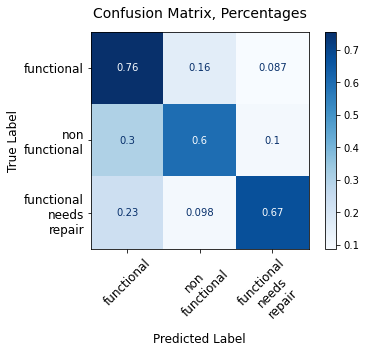

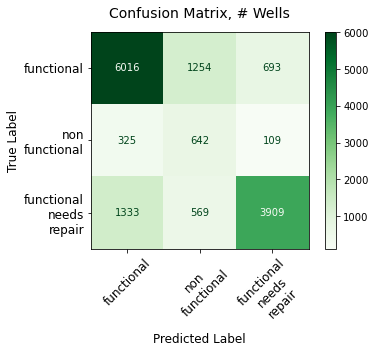

In [717]:
df_SMOTE_rf, X_train_SMOTE_rf, \
clf_rf, train_score_rf, \
test_score_rf, params_rf, \
imp_table_rf, summ_imp_table = rf_model_run(df, features, features_top_n, all_model_features, 
                                       n=50, p=51, run_SMOTE=True, test_size=0.25, 
                                       random_state=123, criterion='gini', n_estimators=20, 
                                       max_depth=20, n_jobs=-1, min_samples_leaf=1, min_samples_split=5)



In [718]:
df_SMOTE_rf.head()

,funder_duplicate,lga_duplicate,management,permit,public_meeting,payment,water_quality,quantity_group,source,extraction_type_class,status_group,waterpoint_type
id,,,,,,,,,,,,
69572,roman,Ludewa,vwc,False,True,pay annually,soft,enough,spring,gravity,functional,communal standpipe
8776,other,Serengeti,wug,True,NaN,never pay,soft,insufficient,rainwater harvesting,gravity,functional,communal standpipe
34310,other,other,vwc,True,True,pay per bucket,soft,enough,dam,gravity,functional,communal standpipe multiple
67743,unicef,other,vwc,True,True,never pay,soft,dry,machine dbh,submersible,non functional,communal standpipe multiple
19728,other,Karagwe,other,True,True,never pay,soft,seasonal,rainwater harvesting,gravity,functional,communal standpipe


##### Feature importance horizontal plot

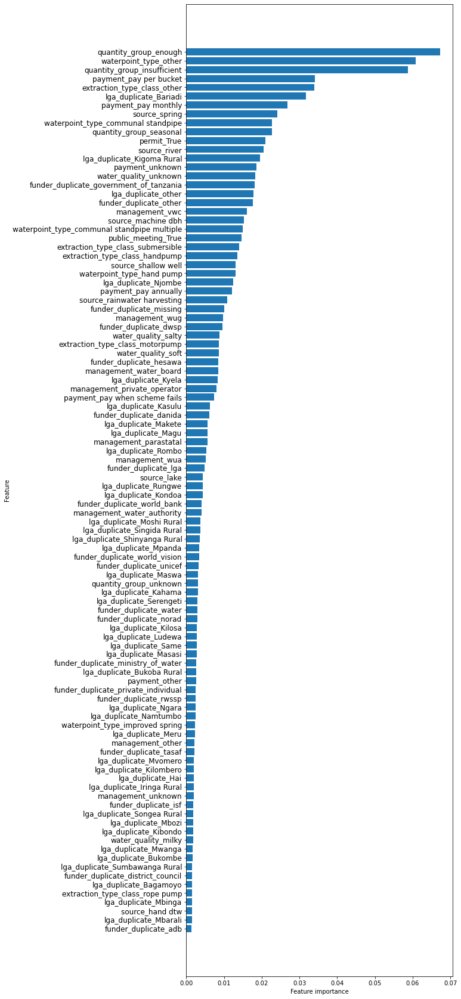

In [719]:
plot_feature_importances(imp_table_rf, n=100)

#### Hyperparameter tuning for SMOTE resampled data

In [720]:
# df = df_train1.copy()    # run this cell if dataframe reset is needed
df.head(3)

,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,permit,construction_year,extraction_type_class,management,payment,water_quality,quantity_group,source,waterpoint_type,status_group,pop_binned
id,,,,,,,,,,,,,,,,,,,,
69572,roman,roman,none,Lake Nyasa,mnyusi_b,Iringa,Ludewa,Mundindi,True,False,1999,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,functional,"(100, 150]"
8776,grumeti,grumeti,zahanati,Lake Victoria,nyamara,Mara,Serengeti,Natta,NaN,True,2010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional,"(200, 300]"
34310,lottery_club,world_vision,kwa_mahundi,Pangani,majengo,Manyara,Simanjiro,Ngorika,True,True,2009,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,functional,"(200, 300]"


In [721]:
df_n, X_train_SMOTE, X_test, \
y_train_SMOTE, y_test  = SMOTE_top_n_tts(df, features, features_top_n, 
                                         all_model_features, n=50, p=51, 
                                         test_size=0.25, random_state=123)

Counter({0: 24296, 2: 17013, 1: 3241})
Counter({0: 24296, 1: 24296, 2: 24296})
Run time (seconds): 4.70892083400031



In [723]:
# Instantiate and fit a RandomForestClassifier

start = timeit.default_timer()

forest_SMOTE_opt = RandomForestClassifier(random_state = 123, bootstrap=False)
forest_SMOTE_opt.fit(X_train_SMOTE, y_train_SMOTE)

print()
end = timeit.default_timer()
print('Run time (seconds):', end-start)
print()


Run time (seconds): 11.596557207998558



In [724]:
rf_param_grid = {
    'n_estimators': [10, 30, 100],
    'criterion': ['gini', 'entropy'],
    'max_depth': [2, 6, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 3, 6]
}

In [725]:
start = timeit.default_timer()

rf_grid_search_SMOTE = GridSearchCV(forest_SMOTE_opt, rf_param_grid, cv=3, 
                                    return_train_score=True, n_jobs=-1)

rf_grid_search_SMOTE.fit(X_train_SMOTE, y_train_SMOTE)

print(f"Training Accuracy: {rf_grid_search_SMOTE.best_score_ :.2%}")
print()
print(f"Optimal Parameters: {rf_grid_search_SMOTE.best_params_}")

print()
end = timeit.default_timer()
print('Run time (seconds):', end-start)

Training Accuracy: 76.74%

Optimal Parameters: {'criterion': 'entropy', 'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}

Run time (seconds): 220.84491804199934


In [726]:
rf_train_score_SMOTE = rf_grid_search_SMOTE.score(X_train_SMOTE, y_train_SMOTE)

print('Random forest grid search train score: ', rf_train_score_SMOTE)

Random forest grid search train score:  0.8068680715618484


In [727]:
rf_test_score_SMOTE = rf_grid_search_SMOTE.score(X_test, y_test)

print('Random forest grid search test score: ', rf_test_score_SMOTE)


Random forest grid search test score:  0.7229629629629629


In [728]:
rf_grid_search_SMOTE.get_params()


{'cv': 3,
 'error_score': nan,
 'estimator__bootstrap': False,
 'estimator__ccp_alpha': 0.0,
 'estimator__class_weight': None,
 'estimator__criterion': 'gini',
 'estimator__max_depth': None,
 'estimator__max_features': 'auto',
 'estimator__max_leaf_nodes': None,
 'estimator__max_samples': None,
 'estimator__min_impurity_decrease': 0.0,
 'estimator__min_impurity_split': None,
 'estimator__min_samples_leaf': 1,
 'estimator__min_samples_split': 2,
 'estimator__min_weight_fraction_leaf': 0.0,
 'estimator__n_estimators': 100,
 'estimator__n_jobs': None,
 'estimator__oob_score': False,
 'estimator__random_state': 123,
 'estimator__verbose': 0,
 'estimator__warm_start': False,
 'estimator': RandomForestClassifier(bootstrap=False, random_state=123),
 'n_jobs': -1,
 'param_grid': {'n_estimators': [10, 30, 100],
  'criterion': ['gini', 'entropy'],
  'max_depth': [2, 6, 10, 20],
  'min_samples_split': [2, 5, 10],
  'min_samples_leaf': [1, 3, 6]},
 'pre_dispatch': '2*n_jobs',
 'refit': True,
 'ret

#### Random Forest with SMOTE resampled data (max_depth=20, criterion='gini')

In [357]:
# df = df_train1.copy()    # run this cell if dataframe reset is needed
df.head(3)

,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,permit,construction_year,extraction_type_class,management,payment,water_quality,quantity_group,source,waterpoint_type,status_group,pop_binned
id,,,,,,,,,,,,,,,,,,,,
69572,roman,roman,none,Lake Nyasa,mnyusi_b,Iringa,Ludewa,Mundindi,True,False,1999,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,functional,"(100, 150]"
8776,grumeti,grumeti,zahanati,Lake Victoria,nyamara,Mara,Serengeti,Natta,NaN,True,2010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional,"(200, 300]"
34310,lottery_club,world_vision,kwa_mahundi,Pangani,majengo,Manyara,Simanjiro,Ngorika,True,True,2009,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,functional,"(200, 300]"


In [358]:
features = ['funder', 'lga', 'management', 'payment', 'water_quality', 'quantity_group', 'source', 
            'extraction_type_class', 'status_group', 'waterpoint_type', 'permit', 'public_meeting']

features_top_n = ['funder', 'lga']

all_model_features = ['funder_duplicate', 'lga_duplicate', 'management', 'permit', 'public_meeting', 
                      'payment', 'water_quality', 'quantity_group', 'source', 
                      'extraction_type_class', 'status_group', 'waterpoint_type']


Counter({0: 24296, 2: 17013, 1: 3241})
Counter({0: 24296, 1: 24296, 2: 24296})
0.7936423005158599
0.7218181818181818
Individual feature importances--showing top 10:


,Importance
quantity_group_enough,0.057978
extraction_type_class_other,0.056857
waterpoint_type_other,0.050121
quantity_group_insufficient,0.041115
lga_duplicate_Bariadi,0.033372
payment_pay per bucket,0.029111
payment_pay monthly,0.026392
waterpoint_type_communal standpipe,0.020452
lga_duplicate_Kigoma Rural,0.020275
source_spring,0.020074



Roll-up summary feature importance table, all features:


,Importance
var_abbr,
lga_dup,0.238118
funder_,0.141737
quantit,0.117443
waterpo,0.105921
payment,0.094076
extract,0.091097
source_,0.087864
managem,0.055285
water_q,0.038762




Run time (seconds): 7.9755952910018095



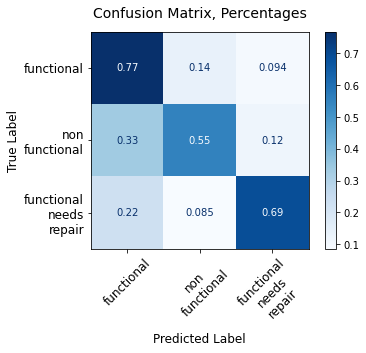

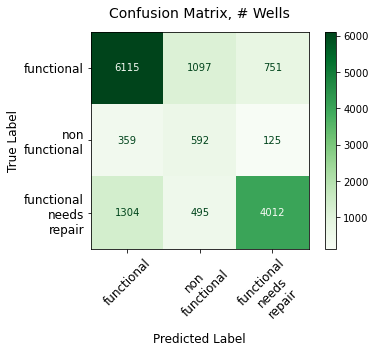

In [729]:
df_SMOTE_rf, X_train_SMOTE_rf, \
clf_rf, rf_train_score, rf_test_score, \
rf_params, rf_imp_table, \
rf_summ_imp_table = rf_model_run(df, features, features_top_n, all_model_features, 
                                 n=125, p=126, run_SMOTE=True, test_size=0.25, 
                                 random_state=123, criterion='gini', n_estimators=100, 
                                 max_depth=20, n_jobs=-1, min_samples_leaf=1, min_samples_split=2)


##### Feature importance findings

In [730]:
rf_imp_table.head(30)

,Importance
quantity_group_enough,0.057978
extraction_type_class_other,0.056857
waterpoint_type_other,0.050121
quantity_group_insufficient,0.041115
lga_duplicate_Bariadi,0.033372
payment_pay per bucket,0.029111
payment_pay monthly,0.026392
waterpoint_type_communal standpipe,0.020452
lga_duplicate_Kigoma Rural,0.020275
source_spring,0.020074


In [731]:
rf_summ_imp_table

,Importance
var_abbr,
lga_dup,0.238118
funder_,0.141737
quantit,0.117443
waterpo,0.105921
payment,0.094076
extract,0.091097
source_,0.087864
managem,0.055285
water_q,0.038762


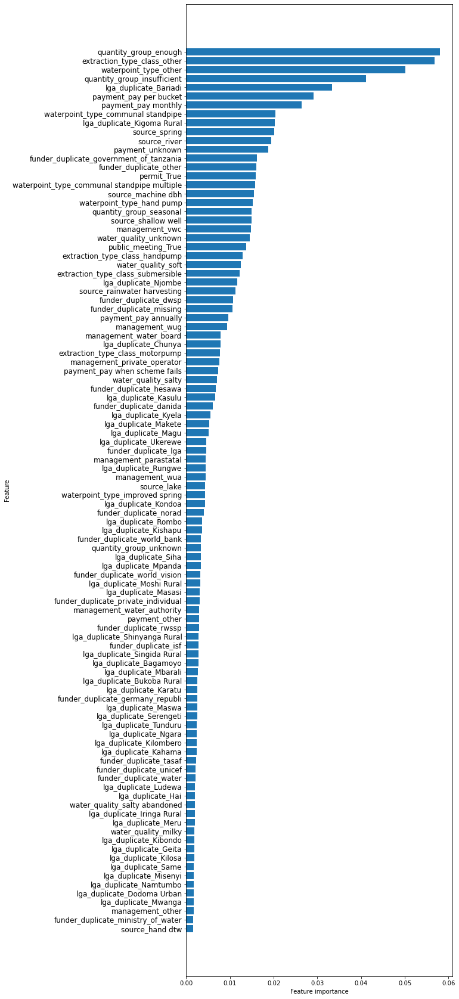

In [732]:
plot_feature_importances(rf_imp_table, n=100)

### Commentary:  Random Forest models

As with both decision trees and bagged trees, we find that rebalancing is necessary to minimize costly false negative errors.  Further, max_depth = 20 vs. max_depth=30 makes a big difference in both training and test scores, and can result in further minimizing false negatives; however, it's important to review the confusion matrix for any given result to evaluate performance in reducing false negatives. 

Finally, as model performance increases, the overall importance of the LGA feature increases.

## Modeling: Ensemble methods--Gradient Boosting and AdaBoosting--using SMOTE resampled data

In [733]:
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, classification_report

In [734]:
df = df_train1.copy()    # run this cell if dataframe reset is needed
df.head(3)

,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,permit,construction_year,extraction_type_class,management,payment,water_quality,quantity_group,source,waterpoint_type,status_group,pop_binned
id,,,,,,,,,,,,,,,,,,,,
69572,roman,roman,none,Lake Nyasa,mnyusi_b,Iringa,Ludewa,Mundindi,True,False,1999,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,functional,"(100, 150]"
8776,grumeti,grumeti,zahanati,Lake Victoria,nyamara,Mara,Serengeti,Natta,NaN,True,2010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional,"(200, 300]"
34310,lottery_club,world_vision,kwa_mahundi,Pangani,majengo,Manyara,Simanjiro,Ngorika,True,True,2009,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,functional,"(200, 300]"


In [735]:
features = ['funder', 'lga', 'management', 'payment', 'water_quality', 'quantity_group', 'source', 
            'extraction_type_class', 'status_group', 'waterpoint_type', 'permit', 'public_meeting']

features_top_n = ['funder', 'lga']

all_model_features = ['funder_duplicate', 'lga_duplicate', 'management', 'permit', 'public_meeting', 
                      'payment', 'water_quality', 'quantity_group', 'source', 
                      'extraction_type_class', 'status_group', 'waterpoint_type']


In [736]:
df_n, X_train_SMOTE, X_test, \
y_train_SMOTE, y_test  = SMOTE_top_n_tts(df, features, features_top_n, 
                                         all_model_features, n=125, p=126, 
                                         test_size=0.25, random_state=123)

Counter({0: 24296, 2: 17013, 1: 3241})
Counter({0: 24296, 1: 24296, 2: 24296})
Run time (seconds): 5.396825874999195



In [737]:
start = timeit.default_timer()

# Instantiate an AdaBoostClassifier
adaboost_clf = AdaBoostClassifier(random_state = 123)

# Instantiate an GradientBoostingClassifier
gbt_clf = GradientBoostingClassifier(random_state = 123)

print()
end = timeit.default_timer()
print('Run time (seconds):', end-start)


Run time (seconds): 0.0007013340000412427


In [738]:
start = timeit.default_timer()

adaboost_clf.fit(X_train_SMOTE, y_train_SMOTE)

end = timeit.default_timer()
print('Run time (seconds):', end-start)


Run time (seconds): 4.932241999998951


In [739]:
start = timeit.default_timer()

gbt_clf.fit(X_train_SMOTE, y_train_SMOTE)

end = timeit.default_timer()
print('Run time (seconds):', end-start)

Run time (seconds): 49.60474287499892


In [740]:
# AdaBoost model predictions

start = timeit.default_timer()

adaboost_train_preds = adaboost_clf.predict(X_train_SMOTE)
adaboost_test_preds = adaboost_clf.predict(X_test)

print()
end = timeit.default_timer()
print('Run time (seconds):', end-start)
print()


Run time (seconds): 1.4404629999989993



In [741]:
# GradientBoosting model predictions

start = timeit.default_timer()

gbt_clf_train_preds = gbt_clf.predict(X_train_SMOTE)
gbt_clf_test_preds = gbt_clf.predict(X_test)

print()
end = timeit.default_timer()
print('Run time (seconds):', end-start)



Run time (seconds): 0.6354787079981179


In [742]:
def display_acc_and_f1_score(true, preds, model_name):
    acc = accuracy_score(true, preds)
    f1 = f1_score(true, preds, average=None)
    print("Model: {}".format(model_name))
    print("Accuracy: {}".format(acc))
    print("F1-Score: {}".format(f1))

In [743]:
print("Training Metrics")
display_acc_and_f1_score(y_train_SMOTE, adaboost_train_preds, model_name='AdaBoost')
print("")
display_acc_and_f1_score(y_train_SMOTE, gbt_clf_train_preds, model_name='Gradient Boosted Trees')
print("")
print("Testing Metrics")
display_acc_and_f1_score(y_test, adaboost_test_preds, model_name='AdaBoost')
print("")
display_acc_and_f1_score(y_test, gbt_clf_test_preds, model_name='Gradient Boosted Trees')


Training Metrics
Model: AdaBoost
Accuracy: 0.635097684118099
F1-Score: [0.63085539 0.63549961 0.64004909]

Model: Gradient Boosted Trees
Accuracy: 0.6901959170233783
F1-Score: [0.67284624 0.69909748 0.70244036]

Testing Metrics
Model: AdaBoost
Accuracy: 0.6686868686868687
F1-Score: [0.73136358 0.29626947 0.67001208]

Model: Gradient Boosted Trees
Accuracy: 0.69003367003367
F1-Score: [0.75248022 0.31406959 0.71372624]


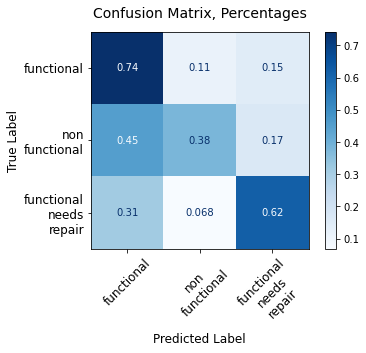

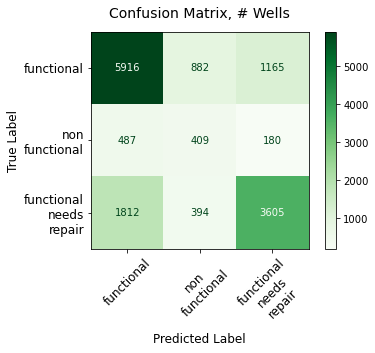

In [745]:
# AdaBoost SMOTE Confusion Matrix
disp_ada = plot_conf_matrix_norm_abs(df_n, adaboost_clf, X_test, y_test, 
                                     title='Confusion Matrix', titlefont=14, x_y_tick_font=12, 
                                     pad=14, x_y_label_font=12, xticks_rotation=45, cmap=plt.cm.Blues)



In [746]:
gbt_confusion_matrix = confusion_matrix(y_test, gbt_clf_test_preds)
gbt_confusion_matrix


array([[5992, 1177,  794],
       [ 429,  519,  128],
       [1542,  533, 3736]])

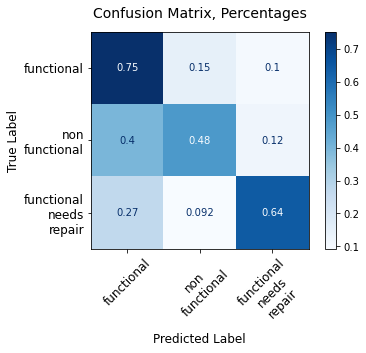

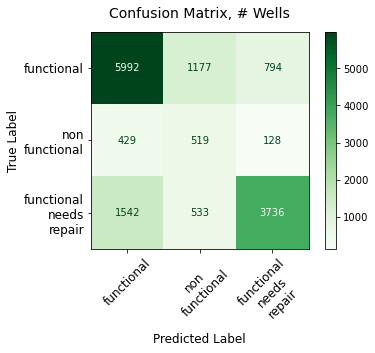

In [747]:
# GBT SMOTE Confusion Matrix
disp_gbt = plot_conf_matrix_norm_abs(df_n, gbt_clf, X_test, y_test, 
                                     title='Confusion Matrix', titlefont=14, x_y_tick_font=12, 
                                     pad=14, x_y_label_font=12, xticks_rotation=45, cmap=plt.cm.Blues)


In [748]:
adaboost_classification_report = classification_report(y_test, adaboost_test_preds)
print(adaboost_classification_report)


              precision    recall  f1-score   support

           0       0.72      0.74      0.73      7963
           1       0.24      0.38      0.30      1076
           2       0.73      0.62      0.67      5811

    accuracy                           0.67     14850
   macro avg       0.56      0.58      0.57     14850
weighted avg       0.69      0.67      0.68     14850



In [749]:
gbt_classification_report = classification_report(y_test, gbt_clf_test_preds)
print(gbt_classification_report)


              precision    recall  f1-score   support

           0       0.75      0.75      0.75      7963
           1       0.23      0.48      0.31      1076
           2       0.80      0.64      0.71      5811

    accuracy                           0.69     14850
   macro avg       0.60      0.63      0.59     14850
weighted avg       0.73      0.69      0.71     14850



### Results
 

Baseline gradient boosting and AdaBoost don't perform particularly well relative to other models.  In the interest of time, I'm moving on to XGBoost and SVM approaches, rather than spending time optimizing hyperparameters for these boosting algorithms.

## Modeling: Ensemble methods--XGBoost

### XGBoost Functions

#### Functions for running XGB models after initial rebalancing (if applicable), encoding, and train-test-split

In [750]:
# function for running xgb model after initial rebalance (if applicable), encoding, and train-test-split 

def model_xgb(df, X_train, X_test, y_train, y_test, learning_rate=0.6, max_depth=15, 
              random_state=123, min_child_weight=1, subsample=0.7, n_estimators=100, 
              n_jobs=-1, cache_size=1000):
    
    start = timeit.default_timer()

    clf_xgb = xgb.XGBClassifier(learning_rate=learning_rate, max_depth=max_depth, 
                                min_child_weight=min_child_weight, subsample=subsample, 
                                n_estimators=n_estimators, n_jobs=n_jobs, 
                                cache_size=cache_size, random_state=random_state)
    
    clf_xgb.fit(X_train, y_train)
    training_preds = clf_xgb.predict(X_train)
    val_preds = clf_xgb.predict(X_test)
    training_accuracy = accuracy_score(y_train, training_preds)
    val_accuracy = accuracy_score(y_test, val_preds)
    print("Training Accuracy: {:.4}%".format(training_accuracy * 100))
    print("Validation accuracy: {:.4}%".format(val_accuracy * 100))
    print()
    disp_xgb = plot_conf_matrix_norm_abs(df, clf_xgb, X_test, y_test, pad=14, 
                                         title='Confusion Matrix', titlefont=14, 
                                         x_y_tick_font=12, x_y_label_font=12, 
                                         xticks_rotation=45, cmap=plt.cm.Blues)

    print()
    end = timeit.default_timer()
    print('Run time (seconds):', end-start)
    print()
    
    return clf_xgb, training_accuracy, val_accuracy


In [754]:
# function for running xgb model AND summary tables after initial rebalance (if applicable), encoding, and train-test-split 

def model_xgb_tables(df, X_train, X_test, y_train, y_test, learning_rate=0.6, 
                     max_depth=15, random_state=123, min_child_weight=1, 
                     subsample=0.7, n_estimators=100, n_jobs=-1, 
                     cache_size=1000, num_feats_incl=100):
    
    start = timeit.default_timer()
    
    clf_xgb = xgb.XGBClassifier(learning_rate=learning_rate, max_depth=max_depth, 
                                min_child_weight=min_child_weight, subsample=subsample, 
                                n_estimators=n_estimators, n_jobs=n_jobs, 
                                cache_size=cache_size, random_state=random_state)
    clf_xgb.fit(X_train, y_train)
    training_preds = clf_xgb.predict(X_train)
    val_preds = clf_xgb.predict(X_test)
    training_accuracy = accuracy_score(y_train, training_preds)
    val_accuracy = accuracy_score(y_test, val_preds)
    print("Training Accuracy: {:.4}%".format(training_accuracy * 100))
    print("Validation accuracy: {:.4}%".format(val_accuracy * 100))
    print()
    imp_table, summ_imp_table, \
    summ_imp_sub_table = feat_imp_tables(X_train, clf_xgb, col_title_length=7,
                                         num_feats_incl=num_feats_incl)
    
    disp_xgb = plot_conf_matrix_norm_abs(df, clf_xgb, X_test, y_test, pad=14, 
                                         title='Confusion Matrix', titlefont=14, 
                                         x_y_tick_font=12, x_y_label_font=12, 
                                         xticks_rotation=45, cmap=plt.cm.Blues)
    
    print()
    end = timeit.default_timer()
    print('Run time (seconds):', end-start)
    print()

    return clf_xgb, training_accuracy, val_accuracy, imp_table, summ_imp_table, summ_imp_sub_table


#### Baseline model, default parameters

In [ ]:
import xgboost as xgb

In [382]:
# df = df_train1.copy()    # run this cell if dataframe reset is needed
df.head(3)

,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,permit,construction_year,extraction_type_class,management,payment,water_quality,quantity_group,source,waterpoint_type,status_group,pop_binned
id,,,,,,,,,,,,,,,,,,,,
69572,roman,roman,none,Lake Nyasa,mnyusi_b,Iringa,Ludewa,Mundindi,True,False,1999,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,functional,"(100, 150]"
8776,grumeti,grumeti,zahanati,Lake Victoria,nyamara,Mara,Serengeti,Natta,NaN,True,2010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional,"(200, 300]"
34310,lottery_club,world_vision,kwa_mahundi,Pangani,majengo,Manyara,Simanjiro,Ngorika,True,True,2009,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,functional,"(200, 300]"


In [383]:
features = ['funder', 'lga', 'management', 'payment', 'water_quality', 'quantity_group', 'source', 
            'extraction_type_class', 'status_group', 'waterpoint_type', 'permit', 'public_meeting']

features_top_n = ['funder', 'lga']

all_model_features = ['funder_duplicate', 'lga_duplicate', 'management', 'permit', 'public_meeting', 
                      'payment', 'water_quality', 'quantity_group', 'source', 
                      'extraction_type_class', 'status_group', 'waterpoint_type']


In [384]:
df_n, X_train, X_test, \
y_train, y_test  = top_n_encode_tts(df, features, features_top_n, all_model_features,
                                    n=125, p=126, test_size=0.25, random_state=123)


In [385]:
clf_xgb = xgb.XGBClassifier(random_state=123)
clf_xgb.fit(X_train, y_train)

XGBClassifier(objective='multi:softprob', random_state=123)

In [386]:
training_preds = clf_xgb.predict(X_train)

In [387]:
val_preds = clf_xgb.predict(X_test)

In [388]:
training_accuracy = accuracy_score(y_train, training_preds)
val_accuracy = accuracy_score(y_test, val_preds)
print("Training Accuracy: {:.4}%".format(training_accuracy * 100))
print("Validation accuracy: {:.4}%".format(val_accuracy * 100))

# Last output:
# Training Accuracy: 74.44%
# Validation accuracy: 73.91%


Training Accuracy: 74.44%
Validation accuracy: 73.91%


Training Accuracy: 85.07%
Validation accuracy: 78.96%

Individual feature importances, top 10


,Importance
waterpoint_type_other,0.029932
lga_duplicate_Kongwa,0.012922
quantity_group_seasonal,0.012673
lga_duplicate_Rombo,0.011806
lga_duplicate_Kahama,0.009962
lga_duplicate_Bariadi,0.009664
quantity_group_unknown,0.009559
lga_duplicate_Makete,0.009051
lga_duplicate_Hanang,0.008958
lga_duplicate_Geita,0.008561



Roll-up summary feature importance table, all features


,Importance
var_abbr,
lga_dup,0.525668
funder_,0.297731
waterpo,0.040991
quantit,0.030417
source_,0.028676
managem,0.025003
extract,0.019549
water_q,0.016494
payment,0.012113



Roll-up summary feature importances, summing up top 100 most important features ONLY:


,Importance
var_abbr,
lga_dup,0.383551
funder_,0.059590
waterpo,0.034316
quantit,0.030417
source_,0.017697
extract,0.009555
water_q,0.003802
managem,0.003629


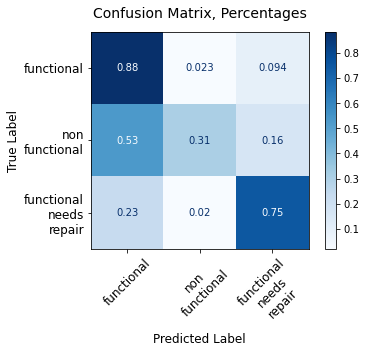

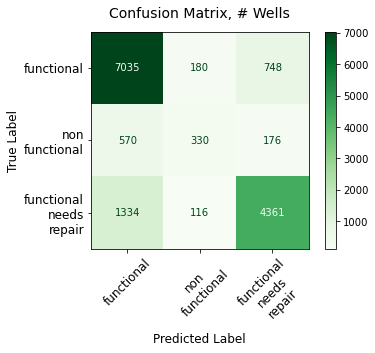

In [389]:
# Running with parameters learning_rate=0.6, max_depth=15, random_state=123, 
# min_child_weight=1, subsample=0.7, n_estimators=100, n_jobs=-1, cache_size=1000

clf_xgb, training_accuracy, \
val_accuracy, imp_table, \
summ_imp_table, summ_imp_sub_table = model_xgb_tables(df_n, X_train=X_train, X_test=X_test, 
                                                      y_train=y_train, y_test=y_test, 
                                                      learning_rate=0.6, max_depth=15, 
                                                      random_state=123, min_child_weight=1, 
                                                      subsample=0.7, n_estimators=100, 
                                                      n_jobs=-1, cache_size=1000, 
                                                      num_feats_incl=100)

# Last output, max_depth=15, non-resampled dataset
# Training Accuracy: 85.07%        false negatives = .53, .23
# Validation accuracy: 78.96%

### XGB: SMOTE rebalanced data

#### FUNDER, management, lga:  n=125; max_depth=15)

In [390]:
# df = df_train1.copy()    # run this line if dataframe reset is needed
df.head(3)

,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,permit,construction_year,extraction_type_class,management,payment,water_quality,quantity_group,source,waterpoint_type,status_group,pop_binned
id,,,,,,,,,,,,,,,,,,,,
69572,roman,roman,none,Lake Nyasa,mnyusi_b,Iringa,Ludewa,Mundindi,True,False,1999,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,functional,"(100, 150]"
8776,grumeti,grumeti,zahanati,Lake Victoria,nyamara,Mara,Serengeti,Natta,NaN,True,2010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional,"(200, 300]"
34310,lottery_club,world_vision,kwa_mahundi,Pangani,majengo,Manyara,Simanjiro,Ngorika,True,True,2009,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,functional,"(200, 300]"


In [391]:
features = ['funder', 'lga', 'management', 'payment', 'water_quality', 'quantity_group', 'source', 
            'extraction_type_class', 'status_group', 'waterpoint_type', 'permit', 'public_meeting']

features_top_n = ['funder', 'lga']

all_model_features = ['funder_duplicate', 'lga_duplicate', 'management', 'permit', 'public_meeting', 
                      'payment', 'water_quality', 'quantity_group', 'source', 
                      'extraction_type_class', 'status_group', 'waterpoint_type']


In [392]:
# n=125

df_n, X_train_SMOTE, X_test, \
y_train_SMOTE, y_test  = SMOTE_top_n_tts(df, features, features_top_n, 
                                         all_model_features, n=125, p=126, 
                                         test_size=0.25, random_state=123)

Counter({0: 24296, 2: 17013, 1: 3241})
Counter({0: 24296, 1: 24296, 2: 24296})


Training Accuracy: 85.73%
Validation accuracy: 74.94%

Individual feature importances, top 10


,Importance
lga_duplicate_Bariadi,0.032915
lga_duplicate_Kigoma Rural,0.020907
lga_duplicate_Makete,0.015684
lga_duplicate_Kongwa,0.014564
lga_duplicate_Siha,0.013451
lga_duplicate_Rombo,0.013188
extraction_type_class_other,0.012909
lga_duplicate_Kyela,0.011203
lga_duplicate_Njombe,0.010823
lga_duplicate_Chunya,0.010807



Roll-up summary feature importance table, all features


,Importance
var_abbr,
lga_dup,0.586990
funder_,0.262168
source_,0.029204
extract,0.027144
managem,0.022706
quantit,0.021565
waterpo,0.018533
payment,0.015393
water_q,0.013359



Roll-up summary feature importances, summing up top 100 most important features ONLY:


,Importance
var_abbr,
lga_dup,0.470114
funder_,0.048562
quantit,0.018555
extract,0.017290
source_,0.016775
waterpo,0.011058
payment,0.004278
water_q,0.003564


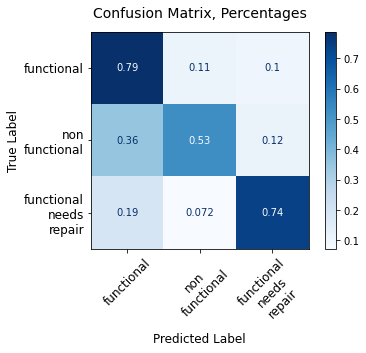

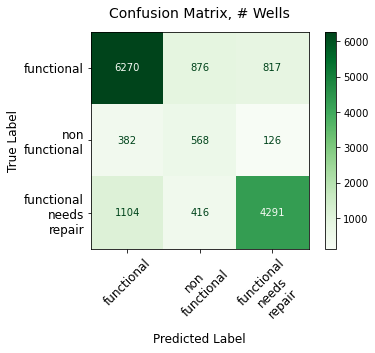

In [393]:
# funder, lga, max_depth=15:

clf_xgb, training_accuracy_xgb_SMOTE, \
val_accuracy_xgb_SMOTE, \
imp_table_xgb_SMOTE, \
summ_imp_table_xgb_SMOTE, \
summ_imp_sub_table_xgb_SMOTE = model_xgb_tables(df_n, X_train_SMOTE, X_test, y_train_SMOTE, 
                                                y_test, random_state=123, max_depth=15, 
                                                learning_rate=0.6, min_child_weight=1, 
                                                subsample=0.7, n_estimators=100, n_jobs=-1, 
                                                cache_size=1000, num_feats_incl=100)

# Last output:
# Training Accuracy: 85.73%    false negatives .36, .19
# Validation accuracy: 74.94%


#### Running SMOTE rebalanced data (INSTALLER, scheme_name, lga:  n=125, max_depth=15)

In [394]:
features = ['installer', 'lga', 'management', 'payment', 'water_quality', 'quantity_group', 'source', 
            'extraction_type_class', 'status_group', 'waterpoint_type', 'permit', 'public_meeting']

features_top_n = ['installer', 'lga']

all_model_features = ['installer_duplicate', 'lga_duplicate', 'management', 'permit', 'public_meeting', 
                      'payment', 'water_quality', 'quantity_group', 'source', 
                      'extraction_type_class', 'status_group', 'waterpoint_type']


In [395]:
df_n, X_train_SMOTE, X_test, \
y_train_SMOTE, y_test  = SMOTE_top_n_tts(df, features, features_top_n, 
                                         all_model_features, n=125, p=126, 
                                         test_size=0.25, random_state=123)

Counter({0: 24296, 2: 17013, 1: 3241})
Counter({0: 24296, 1: 24296, 2: 24296})


Training Accuracy: 84.87%
Validation accuracy: 74.34%

Individual feature importances, top 10


,Importance
lga_duplicate_Bariadi,0.033472
lga_duplicate_Makete,0.025046
lga_duplicate_Siha,0.019400
lga_duplicate_Kigoma Rural,0.016053
lga_duplicate_Rombo,0.015081
lga_duplicate_Kongwa,0.013032
lga_duplicate_Kyela,0.012701
lga_duplicate_Ludewa,0.011462
extraction_type_class_other,0.011321
lga_duplicate_Njombe,0.010527



Roll-up summary feature importance table, all features


,Importance
var_abbr,
lga_dup,0.596081
install,0.263442
source_,0.027659
extract,0.022771
managem,0.021684
quantit,0.020372
waterpo,0.018717
payment,0.014300
water_q,0.012181



Roll-up summary feature importances, summing up top 100 most important features ONLY:


,Importance
var_abbr,
lga_dup,0.470655
install,0.066069
source_,0.017798
quantit,0.017470
extract,0.014927
waterpo,0.011120
payment,0.003803
water_q,0.003391


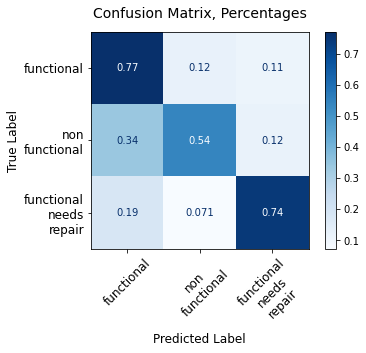

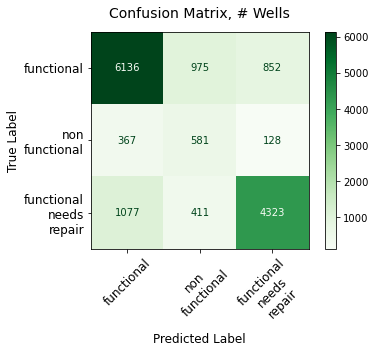

In [396]:
clf_xgb, training_accuracy_xgb_SMOTE, \
val_accuracy_xgb_SMOTE, \
imp_table_xgb_SMOTE, \
summ_imp_table_xgb_SMOTE, \
summ_imp_sub_table_xgb_SMOTE = model_xgb_tables(df_n, X_train_SMOTE, X_test, y_train_SMOTE, 
                                                y_test, random_state=123, max_depth=15, 
                                                learning_rate=0.6, min_child_weight=1, 
                                                subsample=0.7, n_estimators=100, n_jobs=-1, 
                                                cache_size=1000, num_feats_incl=100)



# Last output, installer, lga, management, permit, public_meeting (max_depth=15)
# Training Accuracy: 84.87%      False negatives:  .34, .19
# Validation accuracy: 74.34%


#### Tuning XGBoost

In [397]:
# df = df_train1.copy()
df.head(3)

,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,permit,construction_year,extraction_type_class,management,payment,water_quality,quantity_group,source,waterpoint_type,status_group,pop_binned
id,,,,,,,,,,,,,,,,,,,,
69572,roman,roman,none,Lake Nyasa,mnyusi_b,Iringa,Ludewa,Mundindi,True,False,1999,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,functional,"(100, 150]"
8776,grumeti,grumeti,zahanati,Lake Victoria,nyamara,Mara,Serengeti,Natta,NaN,True,2010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional,"(200, 300]"
34310,lottery_club,world_vision,kwa_mahundi,Pangani,majengo,Manyara,Simanjiro,Ngorika,True,True,2009,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,functional,"(200, 300]"


In [398]:
features = ['funder', 'lga', 'management', 'payment', 'water_quality', 'quantity_group', 'source', 
            'extraction_type_class', 'status_group', 'waterpoint_type', 'permit', 'public_meeting']

features_top_n = ['funder', 'lga']

all_model_features = ['funder_duplicate', 'lga_duplicate', 'management', 'permit', 'public_meeting', 
                      'payment', 'water_quality', 'quantity_group', 'source', 
                      'extraction_type_class', 'status_group', 'waterpoint_type']


In [399]:
df_n, X_train_SMOTE, X_test, \
y_train_SMOTE, y_test  = SMOTE_top_n_tts(df, features, features_top_n, 
                                         all_model_features, n=125, p=126, 
                                         test_size=0.25, random_state=123)

Counter({0: 24296, 2: 17013, 1: 3241})
Counter({0: 24296, 1: 24296, 2: 24296})


In [400]:
clf_xgb = xgb.XGBClassifier(random_state=123)


In [401]:
param_grid = {
"learning_rate": [0.1, 0.6],
'max_depth': [6, 10, 15],
'min_child_weight': [1, 5],
'subsample': [0.5, 0.7],
'n_estimators': [30, 100]
}

In [402]:
grid_clf_xgb = GridSearchCV(clf_xgb, param_grid, scoring='accuracy', cv=None, n_jobs=-1)
grid_clf_xgb.fit(X_train_SMOTE, y_train_SMOTE)
best_parameters = grid_clf_xgb.best_params_


In [403]:
print("Grid Search found the following optimal parameters: ")
for param_name in sorted(best_parameters.keys()):
    print("%s: %r" % (param_name, best_parameters[param_name]))


Grid Search found the following optimal parameters: 
learning_rate: 0.6
max_depth: 15
min_child_weight: 1
n_estimators: 100
subsample: 0.7


In [404]:
grid_training_preds = grid_clf_xgb.predict(X_train_SMOTE)
grid_val_preds = grid_clf_xgb.predict(X_test)
grid_training_accuracy = accuracy_score(y_train_SMOTE, grid_training_preds)
grid_val_accuracy = accuracy_score(y_test, grid_val_preds)

In [405]:
print("")
print("Training Accuracy: {:.4}%".format(grid_training_accuracy * 100))
print("Validation accuracy: {:.4}%".format(grid_val_accuracy * 100))

# Last output (max_depth=15):
# Training Accuracy: 85.73%
# Validation accuracy: 74.94%


Training Accuracy: 85.73%
Validation accuracy: 74.94%


#### FUNDER, LGA, management, payment, water_quality, quantity_group, source, extraction_type_class, waterpoint_type, public_meeting, permit; max_depth=15

In [406]:
df.head(3)

,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,permit,construction_year,extraction_type_class,management,payment,water_quality,quantity_group,source,waterpoint_type,status_group,pop_binned
id,,,,,,,,,,,,,,,,,,,,
69572,roman,roman,none,Lake Nyasa,mnyusi_b,Iringa,Ludewa,Mundindi,True,False,1999,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,functional,"(100, 150]"
8776,grumeti,grumeti,zahanati,Lake Victoria,nyamara,Mara,Serengeti,Natta,NaN,True,2010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional,"(200, 300]"
34310,lottery_club,world_vision,kwa_mahundi,Pangani,majengo,Manyara,Simanjiro,Ngorika,True,True,2009,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,functional,"(200, 300]"


In [407]:
# # Last output (funder, lga, management, permit, public_meeting, max_depth=15):  
# ----------------
# Grid Search found the following optimal parameters: 
# learning_rate: 0.6
# max_depth: 15
# min_child_weight: 1
# n_estimators: 100
# subsample: 0.7

features = ['funder', 'lga', 'management', 'payment', 'water_quality', 'quantity_group', 'source', 
            'extraction_type_class', 'status_group', 'waterpoint_type', 'permit', 'public_meeting']

features_top_n = ['funder', 'lga']

all_model_features = ['funder_duplicate', 'lga_duplicate', 'management', 'permit', 'public_meeting', 
                      'payment', 'water_quality', 'quantity_group', 'source', 
                      'extraction_type_class', 'status_group', 'waterpoint_type']


In [408]:
# Running n=125

df_n, X_train_SMOTE, X_test, \
y_train_SMOTE, y_test  = SMOTE_top_n_tts(df, features, features_top_n, 
                                         all_model_features, n=125, p=126, 
                                         test_size=0.25, random_state=123)

Counter({0: 24296, 2: 17013, 1: 3241})
Counter({0: 24296, 1: 24296, 2: 24296})


Training Accuracy: 85.73%
Validation accuracy: 74.94%

Individual feature importances, top 10


,Importance
lga_duplicate_Bariadi,0.032915
lga_duplicate_Kigoma Rural,0.020907
lga_duplicate_Makete,0.015684
lga_duplicate_Kongwa,0.014564
lga_duplicate_Siha,0.013451
lga_duplicate_Rombo,0.013188
extraction_type_class_other,0.012909
lga_duplicate_Kyela,0.011203
lga_duplicate_Njombe,0.010823
lga_duplicate_Chunya,0.010807



Roll-up summary feature importance table, all features


,Importance
var_abbr,
lga_dup,0.586990
funder_,0.262168
source_,0.029204
extract,0.027144
managem,0.022706
quantit,0.021565
waterpo,0.018533
payment,0.015393
water_q,0.013359



Roll-up summary feature importances, summing up top 100 most important features ONLY:


,Importance
var_abbr,
lga_dup,0.470114
funder_,0.048562
quantit,0.018555
extract,0.017290
source_,0.016775
waterpo,0.011058
payment,0.004278
water_q,0.003564


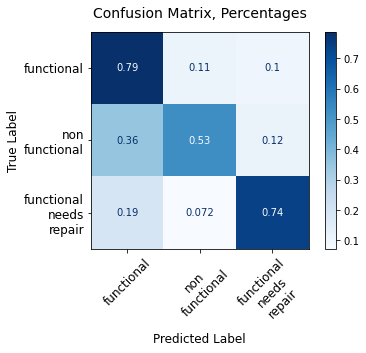

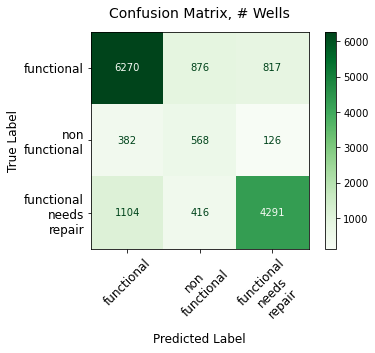

In [409]:
clf_xgb, training_accuracy_xgb_SMOTE, \
val_accuracy_xgb_SMOTE, \
imp_table_xgb_SMOTE, \
summ_imp_table_xgb_SMOTE, \
summ_imp_sub_table_xgb_SMOTE = model_xgb_tables(df_n, X_train_SMOTE, X_test, 
                                                y_train_SMOTE, y_test, random_state=123, 
                                                learning_rate=0.6, max_depth=15, 
                                                min_child_weight=1, subsample=0.7, 
                                                n_estimators=100, n_jobs=-1, 
                                                cache_size=1000, num_feats_incl=100)

# Last output (funder, lga, management, permit, public_meeting, n=100, max_depth=15): 
# Training Accuracy: 85.81%
# Validation accuracy: 74.71%

# Last output (funder, lga, management, permit, public_meeting, n=125, max_depth=15): 
# Training Accuracy: 85.73%        (.36, .19)
# Validation accuracy: 74.94%


In [410]:
imp_table_xgb_SMOTE[:50]

,Importance
lga_duplicate_Bariadi,0.032915
lga_duplicate_Kigoma Rural,0.020907
lga_duplicate_Makete,0.015684
lga_duplicate_Kongwa,0.014564
lga_duplicate_Siha,0.013451
lga_duplicate_Rombo,0.013188
extraction_type_class_other,0.012909
lga_duplicate_Kyela,0.011203
lga_duplicate_Njombe,0.010823
lga_duplicate_Chunya,0.010807


In [411]:
summ_imp_table_xgb_SMOTE   

,Importance
var_abbr,
lga_dup,0.586990
funder_,0.262168
source_,0.029204
extract,0.027144
managem,0.022706
quantit,0.021565
waterpo,0.018533
payment,0.015393
water_q,0.013359


In [412]:
imp_table_xgb_SMOTE[:100].sum()

Importance    0.590197
dtype: float64

In [413]:
summ_imp_sub_table_xgb_SMOTE      # top 100 dummy-variable features


,Importance
var_abbr,
lga_dup,0.470114
funder_,0.048562
quantit,0.018555
extract,0.017290
source_,0.016775
waterpo,0.011058
payment,0.004278
water_q,0.003564


In [414]:
imp_table_xgb_SMOTE[:200].sum()

Importance    0.844739
dtype: float64

In [415]:
imp_table_xgb_SMOTE[:400].sum()

Importance    1.0
dtype: float64

#### INSTALLER, LGA, management, payment, water_quality, quantity_group, source, extraction_type_class, waterpoint_type, public_meeting, permit; max_depth=15

In [416]:
df.head(3)

,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,permit,construction_year,extraction_type_class,management,payment,water_quality,quantity_group,source,waterpoint_type,status_group,pop_binned
id,,,,,,,,,,,,,,,,,,,,
69572,roman,roman,none,Lake Nyasa,mnyusi_b,Iringa,Ludewa,Mundindi,True,False,1999,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,functional,"(100, 150]"
8776,grumeti,grumeti,zahanati,Lake Victoria,nyamara,Mara,Serengeti,Natta,NaN,True,2010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional,"(200, 300]"
34310,lottery_club,world_vision,kwa_mahundi,Pangani,majengo,Manyara,Simanjiro,Ngorika,True,True,2009,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,functional,"(200, 300]"


In [417]:
features = ['installer', 'lga', 'management', 'payment', 'water_quality', 'quantity_group', 'source', 
            'extraction_type_class', 'status_group', 'waterpoint_type', 'permit', 'public_meeting']

features_top_n = ['installer', 'lga']

all_model_features = ['installer_duplicate', 'lga_duplicate', 'management', 'permit', 'public_meeting', 
                      'payment', 'water_quality', 'quantity_group', 'source', 
                      'extraction_type_class', 'status_group', 'waterpoint_type']


In [418]:
df_n, X_train_SMOTE, X_test, \
y_train_SMOTE, y_test  = SMOTE_top_n_tts(df, features, features_top_n, 
                                         all_model_features, n=125, p=126, 
                                         test_size=0.25, random_state=123)

Counter({0: 24296, 2: 17013, 1: 3241})
Counter({0: 24296, 1: 24296, 2: 24296})


Training Accuracy: 84.87%
Validation accuracy: 74.34%

Individual feature importances, top 10


,Importance
lga_duplicate_Bariadi,0.033472
lga_duplicate_Makete,0.025046
lga_duplicate_Siha,0.019400
lga_duplicate_Kigoma Rural,0.016053
lga_duplicate_Rombo,0.015081
lga_duplicate_Kongwa,0.013032
lga_duplicate_Kyela,0.012701
lga_duplicate_Ludewa,0.011462
extraction_type_class_other,0.011321
lga_duplicate_Njombe,0.010527



Roll-up summary feature importance table, all features


,Importance
var_abbr,
lga_dup,0.596081
install,0.263442
source_,0.027659
extract,0.022771
managem,0.021684
quantit,0.020372
waterpo,0.018717
payment,0.014300
water_q,0.012181



Roll-up summary feature importances, summing up top 100 most important features ONLY:


,Importance
var_abbr,
lga_dup,0.470655
install,0.066069
source_,0.017798
quantit,0.017470
extract,0.014927
waterpo,0.011120
payment,0.003803
water_q,0.003391


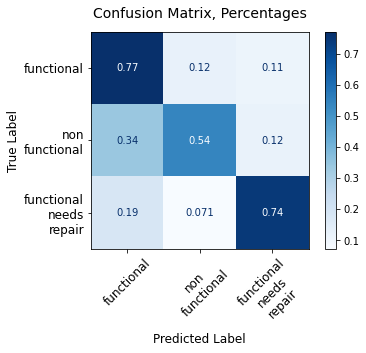

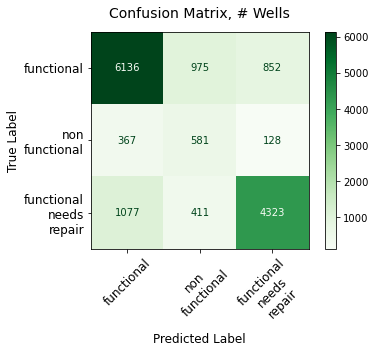

In [419]:
clf_xgb, training_accuracy_xgb_SMOTE, \
val_accuracy_xgb_SMOTE, \
imp_table_xgb_SMOTE, \
summ_imp_table_xgb_SMOTE, \
summ_imp_sub_table_xgb_SMOTE = model_xgb_tables(df_n, X_train_SMOTE, X_test, 
                                                y_train_SMOTE, y_test, random_state=123, 
                                                learning_rate=0.6, max_depth=15, 
                                                min_child_weight=1, subsample=0.7, 
                                                n_estimators=100, n_jobs=-1, 
                                                cache_size=1000, num_feats_incl=100)


# Last output: installers, max_depth=15:
# Training Accuracy: 84.87%       (.34, .19)
# Validation accuracy: 74.34%

In [420]:
imp_table_xgb_SMOTE[:50]

,Importance
lga_duplicate_Bariadi,0.033472
lga_duplicate_Makete,0.025046
lga_duplicate_Siha,0.019400
lga_duplicate_Kigoma Rural,0.016053
lga_duplicate_Rombo,0.015081
lga_duplicate_Kongwa,0.013032
lga_duplicate_Kyela,0.012701
lga_duplicate_Ludewa,0.011462
extraction_type_class_other,0.011321
lga_duplicate_Njombe,0.010527


In [421]:
summ_imp_table_xgb_SMOTE   

,Importance
var_abbr,
lga_dup,0.596081
install,0.263442
source_,0.027659
extract,0.022771
managem,0.021684
quantit,0.020372
waterpo,0.018717
payment,0.014300
water_q,0.012181


In [422]:
imp_table_xgb_SMOTE[:100].sum()

Importance    0.605234
dtype: float64

In [423]:
imp_table_xgb_SMOTE[:200].sum()

Importance    0.856301
dtype: float64

In [424]:
summ_imp_sub_table_xgb_SMOTE      # top 100 dummy-variable features; these account for ~51% of all importances

,Importance
var_abbr,
lga_dup,0.470655
install,0.066069
source_,0.017798
quantit,0.017470
extract,0.014927
waterpo,0.011120
payment,0.003803
water_q,0.003391


In [425]:
imp_table_xgb_SMOTE[:400].sum()

Importance    1.0
dtype: float64

### Findings

XGBoost provides highest overall accuracy scores of any of the models used so far.  XGB also provides good--but not great--reduction of false negatives.  

Although the reduction of false negatives isn't as good as for class_weight='balanced' decision tree models, the overall accuracy is higher, and  it's worthwhile to compare features for XGB models with models that provide good performance on reducing false negatives. 

## Modeling: Support Vector Machines

In [757]:
from sklearn import svm

### Function for running SVM models 

In [758]:
def model_svm(df, X_train, y_train, X_test, y_test, C=1.0, gamma='scale',     
              class_weight='balanced', random_state=123, cache_size=1000):
    
    start = timeit.default_timer()

    df = df.copy()
    
    clf_svm = svm.SVC(C=C, gamma=gamma, random_state=random_state, 
                      cache_size=cache_size, class_weight=class_weight)           

    clf_svm.fit(X_train, y_train)
    training_preds = clf_svm.predict(X_train)
    val_preds = clf_svm.predict(X_test)
    svm_training_accuracy = accuracy_score(y_train, training_preds)
    svm_val_accuracy = accuracy_score(y_test, val_preds)
    
    print(f'Gamma = {gamma}')
    print(f'C = {C}')
    print("Training Accuracy: {:.4}%".format(svm_training_accuracy * 100))
    print("Validation accuracy: {:.4}%".format(svm_val_accuracy * 100))
    print()
    
    disp_svm = plot_conf_matrix_norm_abs(df, clf_svm, X_test, y_test, pad=14, title='Confusion Matrix', 
                                         titlefont=14, x_y_tick_font=12, x_y_label_font=12, 
                                         xticks_rotation=45, cmap=plt.cm.Blues)
    
    print()
    end = timeit.default_timer()
    print('Run time (seconds):', end-start)
    print()
    
    return clf_svm, svm_training_accuracy, svm_val_accuracy


### Run model with class_weight='balanced' and default kernel (rbf)

#### FUNDER, LGA (n=100), permit, public_meeting; C=1.0 (default), gamma='scale' (default), class_weight='balanced'

In [759]:
df.head()

,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,permit,construction_year,extraction_type_class,management,payment,water_quality,quantity_group,source,waterpoint_type,status_group,pop_binned
id,,,,,,,,,,,,,,,,,,,,
69572,roman,roman,none,Lake Nyasa,mnyusi_b,Iringa,Ludewa,Mundindi,True,False,1999,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,functional,"(100, 150]"
8776,grumeti,grumeti,zahanati,Lake Victoria,nyamara,Mara,Serengeti,Natta,NaN,True,2010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional,"(200, 300]"
34310,lottery_club,world_vision,kwa_mahundi,Pangani,majengo,Manyara,Simanjiro,Ngorika,True,True,2009,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,functional,"(200, 300]"
67743,unicef,unicef,zahanati_ya_nanyumbu,Ruvuma / Southern Coast,mahakamani,Mtwara,Nanyumbu,Nanyumbu,True,True,1986,submersible,vwc,never pay,soft,dry,machine dbh,communal standpipe multiple,non functional,"(50, 100]"
19728,action_in_a,artisan,shuleni,Lake Victoria,kyanyamisa,Kagera,Karagwe,Nyakasimbi,True,True,Missing,gravity,other,never pay,soft,seasonal,rainwater harvesting,communal standpipe,functional,"(-1, 0]"


In [760]:
features = ['funder', 'lga', 'management', 'payment', 'water_quality', 'quantity_group', 'source', 
            'extraction_type_class', 'status_group', 'waterpoint_type', 'permit', 'public_meeting']

features_top_n = ['funder', 'lga']

all_model_features = ['funder_duplicate', 'lga_duplicate', 'management', 'permit', 'public_meeting', 
                      'payment', 'water_quality', 'quantity_group', 'source', 
                      'extraction_type_class', 'status_group', 'waterpoint_type']


In [761]:
# features:  installer & scheme_name (n=100); region

df_svm, X, y = top_n_encode(df, features, features_top_n, all_model_features, n=100, p=101)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=123)

Gamma = scale
C = 1.0
Training Accuracy: 72.19%
Validation accuracy: 69.99%


Run time (seconds): 766.5377266249998



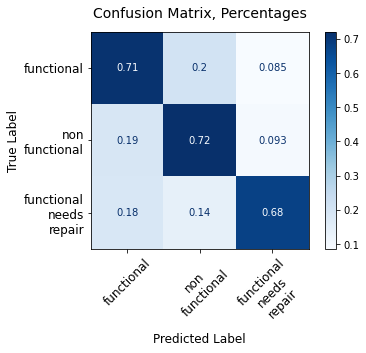

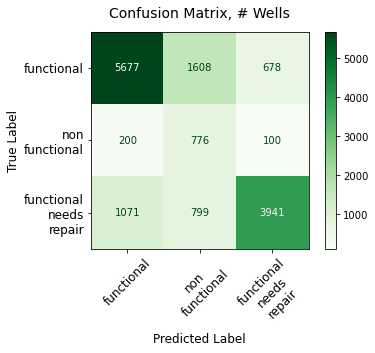

In [762]:
# function just for SVM modeling (takes in X_train, y_train, X_test, y_test from above)

clf_svm, svm_training_accuracy, \
svm_val_accuracy = model_svm(df_svm, X_train, y_train, X_test, y_test, C=1.0, gamma='scale', 
                             random_state=123, cache_size=1000, class_weight='balanced')

# Better performance on false negatives than most other models (.19, .18) -- note n=100

In [763]:
clf_svm.get_params()

{'C': 1.0,
 'break_ties': False,
 'cache_size': 1000,
 'class_weight': 'balanced',
 'coef0': 0.0,
 'decision_function_shape': 'ovr',
 'degree': 3,
 'gamma': 'scale',
 'kernel': 'rbf',
 'max_iter': -1,
 'probability': False,
 'random_state': 123,
 'shrinking': True,
 'tol': 0.001,
 'verbose': False}

### Hyperparameter tuning:  rfb kernel

In [773]:
# df = df_train1.copy()
df.head(3)

,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,permit,construction_year,extraction_type_class,management,payment,water_quality,quantity_group,source,waterpoint_type,status_group,pop_binned
id,,,,,,,,,,,,,,,,,,,,
69572,roman,roman,none,Lake Nyasa,mnyusi_b,Iringa,Ludewa,Mundindi,True,False,1999,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,functional,"(100, 150]"
8776,grumeti,grumeti,zahanati,Lake Victoria,nyamara,Mara,Serengeti,Natta,NaN,True,2010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional,"(200, 300]"
34310,lottery_club,world_vision,kwa_mahundi,Pangani,majengo,Manyara,Simanjiro,Ngorika,True,True,2009,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,functional,"(200, 300]"


In [774]:
features = ['funder', 'lga', 'management', 'payment', 'water_quality', 'quantity_group', 'source', 
            'extraction_type_class', 'status_group', 'waterpoint_type', 'permit', 'public_meeting']

features_top_n = ['funder', 'lga']

all_model_features = ['funder_duplicate', 'lga_duplicate', 'management', 'permit', 'public_meeting', 
                      'payment', 'water_quality', 'quantity_group', 'source', 
                      'extraction_type_class', 'status_group', 'waterpoint_type']


In [775]:
# run for non-resampled data
# features:  installer & scheme_name (n=125); lga

df_svm, X, y = top_n_encode(df, features, features_top_n, all_model_features, n=125, p=126)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=123)

Gamma = 0.1
C = 1
Training Accuracy: 71.91%
Validation accuracy: 69.93%


Run time (seconds): 888.1303981249948

Gamma = 1.0
C = 1
Training Accuracy: 80.52%
Validation accuracy: 72.09%


Run time (seconds): 1072.6938697500009

Gamma = 100.0
C = 1
Training Accuracy: 80.75%
Validation accuracy: 67.57%


Run time (seconds): 1223.0258026250012

Gamma = 0.1
C = 10
Training Accuracy: 77.75%
Validation accuracy: 72.21%


Run time (seconds): 790.9789273749993

Gamma = 1.0
C = 10
Training Accuracy: 80.53%
Validation accuracy: 71.66%


Run time (seconds): 1086.0018470840005

Gamma = 100.0
C = 10
Training Accuracy: 80.53%
Validation accuracy: 66.63%


Run time (seconds): 1161.7277884159994

[0.7191245791245792, 0.8052300785634119, 0.8074971941638608, 0.7774635241301908, 0.8053198653198653, 0.8053423120089787]

[0.6993265993265994, 0.7208754208754209, 0.6756902356902357, 0.7220875420875421, 0.7165656565656565, 0.6663299663299663]


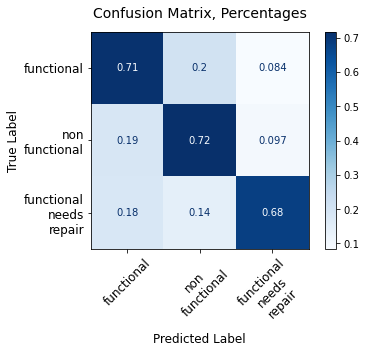

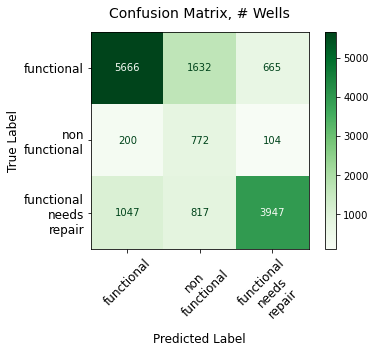

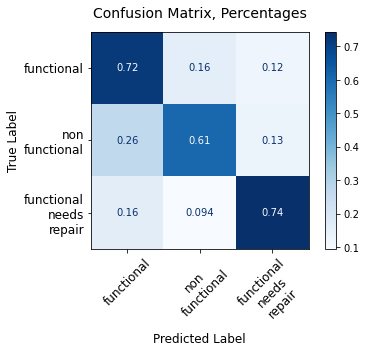

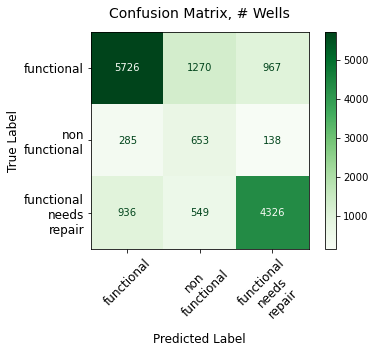

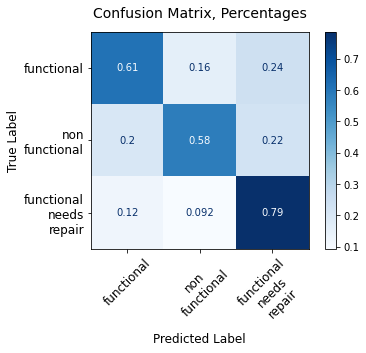

...

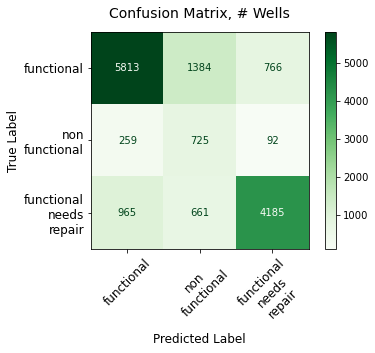

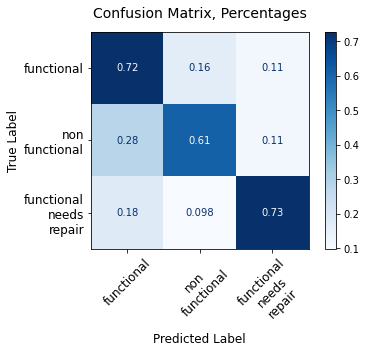

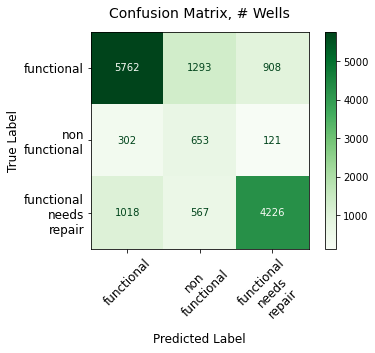

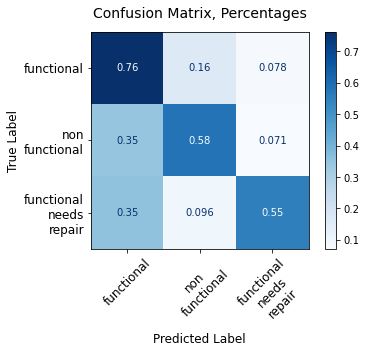

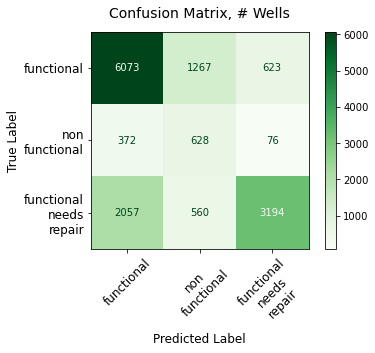

In [776]:
# running model with installer, scheme_name, lga and values for C and gamma

C_range = np.array([1, 10])     
gamma_range = np.array([0.1, 1, 100])
param_grid = dict(gamma=gamma_range, C=C_range)
details_train = []
svm_train_accs = []
svm_val_accs = []
for C in C_range:
    for gamma in gamma_range:
        clf_svm, svm_training_accuracy, \
        svm_val_accuracy = model_svm(df_svm, X_train, y_train, X_test, y_test, C=C, gamma=gamma, 
                                     class_weight='balanced', random_state=123, cache_size=1000)
        
        details_train.append((C, gamma, clf_svm))
        svm_train_accs.append(svm_training_accuracy)
        svm_val_accs.append(svm_val_accuracy)
        
print(svm_train_accs)
print()
print(svm_val_accs)


# Last output (7/27/20):
# --------------------
# Gamma = 0.1
# C = 1
# Training Accuracy: 71.91%      false negatives = .19, .18  **** BEST PERFORMANCE ON FALSE NEGATIVES****
# Validation accuracy: 69.97%

# Gamma = 1.0
# C = 1
# Training Accuracy: 80.48%      false negatives = .26, .16
# Validation accuracy: 72.07%

# Gamma = 100.0
# C = 1
# Training Accuracy: 80.71%      false negatives = .2, .12  
# Validation accuracy: 67.54%

# Gamma = 0.1
# C = 10
# Training Accuracy: 77.73%      false negatives = .24, .17
# Validation accuracy: 72.17%

# Gamma = 1.0
# C = 10
# Training Accuracy: 80.49%      false negatives = .28, .17
# Validation accuracy: 71.62%

# Gamma = 100.0
# C = 10
# Training Accuracy: 80.49%      false negatives = .34, .35
# Validation accuracy: 66.61%

# Training scores:
# [0.7191245791245792, 0.8048260381593715, 0.807070707070707, 0.777283950617284, 0.8048933782267116, 0.8049158249158249]
# Test scores:
# [0.6996632996632997, 0.7206734006734007, 0.6754208754208754, 0.7216835016835017, 0.7161616161616161, 0.666060606060606]



### Run optimized SVM model with class_weight='balanced' and default kernel (rbf)

#### Funder, LGA (n=100); C=1.0 (default), gamma=1, class_weight='balanced'

In [767]:
# df = df_train1.copy()    # run this cell if dataframe reset is needed
df.head()

,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,permit,construction_year,extraction_type_class,management,payment,water_quality,quantity_group,source,waterpoint_type,status_group,pop_binned
id,,,,,,,,,,,,,,,,,,,,
69572,roman,roman,none,Lake Nyasa,mnyusi_b,Iringa,Ludewa,Mundindi,True,False,1999,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,functional,"(100, 150]"
8776,grumeti,grumeti,zahanati,Lake Victoria,nyamara,Mara,Serengeti,Natta,NaN,True,2010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional,"(200, 300]"
34310,lottery_club,world_vision,kwa_mahundi,Pangani,majengo,Manyara,Simanjiro,Ngorika,True,True,2009,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,functional,"(200, 300]"
67743,unicef,unicef,zahanati_ya_nanyumbu,Ruvuma / Southern Coast,mahakamani,Mtwara,Nanyumbu,Nanyumbu,True,True,1986,submersible,vwc,never pay,soft,dry,machine dbh,communal standpipe multiple,non functional,"(50, 100]"
19728,action_in_a,artisan,shuleni,Lake Victoria,kyanyamisa,Kagera,Karagwe,Nyakasimbi,True,True,Missing,gravity,other,never pay,soft,seasonal,rainwater harvesting,communal standpipe,functional,"(-1, 0]"


In [768]:
features = ['funder', 'lga', 'management', 'payment', 'water_quality', 'quantity_group', 'source', 
            'extraction_type_class', 'status_group', 'waterpoint_type', 'permit', 'public_meeting']

features_top_n = ['funder', 'lga']

all_model_features = ['funder_duplicate', 'lga_duplicate', 'management', 'permit', 'public_meeting', 
                      'payment', 'water_quality', 'quantity_group', 'source', 
                      'extraction_type_class', 'status_group', 'waterpoint_type']


In [769]:
# features:  funder, LGA, permit, public_meeting

df_svm, X, y = top_n_encode(df, features, features_top_n, all_model_features, n=125, p=126)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=123)

Gamma = 1
C = 1.0
Training Accuracy: 80.52%
Validation accuracy: 72.09%


Run time (seconds): 1115.5950249169982



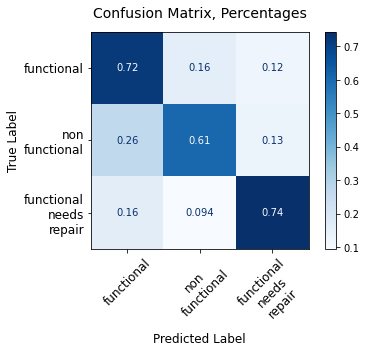

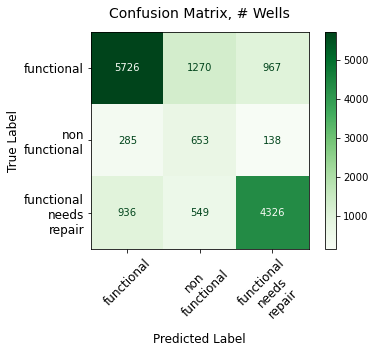

In [770]:
# function just for SVM modeling (takes in X_train, y_train, X_test, y_test from above)

clf_svm, svm_training_accuracy, \
svm_val_accuracy = model_svm(df_svm, X_train, y_train, X_test, y_test, C=1.0, gamma=1, 
                             random_state=123, cache_size=1000, class_weight='balanced')

# Last output (n=125, class_weight='balanced'; funder, lga, mgmt, permit, public_meeting; C=1.0, gamma='scale')
# Gamma = 1
# C = 1.0
# Training Accuracy: 80.52%           false negatives = .26, .16
# Validation accuracy: 72.09%

In [771]:
clf_svm.get_params()

{'C': 1.0,
 'break_ties': False,
 'cache_size': 1000,
 'class_weight': 'balanced',
 'coef0': 0.0,
 'decision_function_shape': 'ovr',
 'degree': 3,
 'gamma': 1,
 'kernel': 'rbf',
 'max_iter': -1,
 'probability': False,
 'random_state': 123,
 'shrinking': True,
 'tol': 0.001,
 'verbose': False}

#### FUNDER, LGA (n=125); C=1.0 (default), gamma=50, class_weight='balanced'

In [777]:
# df = df_train1.copy()    # run this line if dataframe reset is needed
df.head()

,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,permit,construction_year,extraction_type_class,management,payment,water_quality,quantity_group,source,waterpoint_type,status_group,pop_binned
id,,,,,,,,,,,,,,,,,,,,
69572,roman,roman,none,Lake Nyasa,mnyusi_b,Iringa,Ludewa,Mundindi,True,False,1999,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,functional,"(100, 150]"
8776,grumeti,grumeti,zahanati,Lake Victoria,nyamara,Mara,Serengeti,Natta,NaN,True,2010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional,"(200, 300]"
34310,lottery_club,world_vision,kwa_mahundi,Pangani,majengo,Manyara,Simanjiro,Ngorika,True,True,2009,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,functional,"(200, 300]"
67743,unicef,unicef,zahanati_ya_nanyumbu,Ruvuma / Southern Coast,mahakamani,Mtwara,Nanyumbu,Nanyumbu,True,True,1986,submersible,vwc,never pay,soft,dry,machine dbh,communal standpipe multiple,non functional,"(50, 100]"
19728,action_in_a,artisan,shuleni,Lake Victoria,kyanyamisa,Kagera,Karagwe,Nyakasimbi,True,True,Missing,gravity,other,never pay,soft,seasonal,rainwater harvesting,communal standpipe,functional,"(-1, 0]"


In [778]:
features = ['funder', 'lga', 'management', 'payment', 'water_quality', 'quantity_group', 'source', 
            'extraction_type_class', 'status_group', 'waterpoint_type', 'permit', 'public_meeting']

features_top_n = ['funder', 'lga']

all_model_features = ['funder_duplicate', 'lga_duplicate', 'management', 'permit', 'public_meeting', 
                      'payment', 'water_quality', 'quantity_group', 'source', 
                      'extraction_type_class', 'status_group', 'waterpoint_type']


In [779]:
# run for non-resampled data

df_svm, X, y = top_n_encode(df, features, features_top_n, all_model_features, n=125, p=126)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=123)

Gamma = 50
C = 1.0
Training Accuracy: 80.75%
Validation accuracy: 67.57%


Run time (seconds): 1254.4639979580024



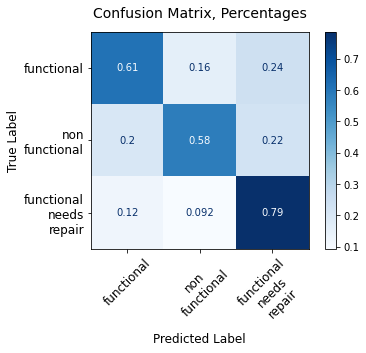

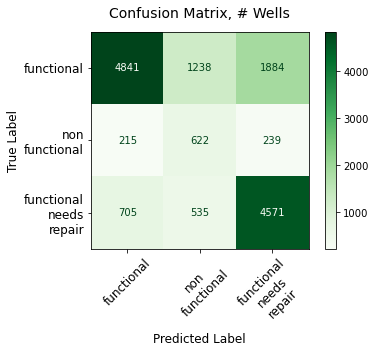

In [780]:
# function just for SVM modeling (takes in X_train, y_train, X_test, y_test from above)

clf_svm, svm_training_accuracy, \
svm_val_accuracy = model_svm(df_svm, X_train, y_train, X_test, y_test, C=1.0, gamma=50, 
                             random_state=123, cache_size=1000, class_weight='balanced')

# Last output (class_weight='balanced'; installer, scheme_name, region; C=1.0, gamma='scale')
# Gamma = 50
# C = 1.0
# Training Accuracy: 80.75%     false negatives = 0.2, 0.12
# Validation accuracy: 67.57%

# higher gamma value (50) yields slightly higher training score but lower test score.  
# Higher gamma value does a better job of minimizing the false negative errors for non-functional 
# and functional needs repair wells.

### Commentary:  SVM

In terms of minimizing false negatives (non-functional wells being labeled as functional), SVM models performed better than all other modeling approaches--although XGBoost gave very good results.  

Given the importance of minimizing false negatives, addressing class imbalances during the modeling process is extremely important.  SVM models do the best of all modeling approaches when the balanced class parameter is used.

## Findings

### Model Performance: Accuracy and Reduction of False Negatives 
* Imbalanced dataset (original)
  * Training accuracies ranged 77% to 85%
  * Test accuracies ranged from 74% to 80%
  * False negatives were unacceptably high  (up to 77% and 40% for mis-classification of 'functional needs repair' and 'non functional' wells as 'functional', respectively)
* SMOTE resampled data
  * Training accuracies ranged 73% to 80%
  * Test accuracies ranged from 69% to 78%
  * False negatives were noticeably better than for imbalanced dataset, but still higher than for models run with class_weight='balanced' (~30-35% and ~23-30% for mis-classification of 'functional needs repair' and 'non functional' wells as 'functional', respectively)
* class_weight='balanced' (in models where this parameter is available)
  * Training accuracies ranged 65% to 78%
  * Test accuracies ranged from 62% to 74%
  * Best performance of the three options for false negatives (as low as 17% and 17% for mis-classification of 'functional needs repair' and 'non functional' wells as 'functional', respectively)
*   **Conclusion--Class imbalances:**  There is a significant trade-off between overall accuracy and minimizing costly false negatives by addressing class imbalances that contribute to the errors in the smaller classes ('non-functional' and 'functional needs repair'). 
  
### Feature Importances 
* At a macro level, I found that the features that showed up most frequently in the aggregate feature importance list were the following (roughly in order of importance):
     * Quantity ('dry', 'enough', 'insufficient', 'seasonal', or 'unknown')
     * Region or lga (depending on which was used in the model)
     * Waterpoint type (standpipe, borehole, improved spring, cattle trough, other)
     * Installer or funder (depending on which was used in the model)
     * Extraction type (e.g., gravity, hand pump, motor, submersible)
     * Source (e.g., river, spring, shallow well, rainwater harvesting)
     * Payment type (e.g., pay by bucket, pay by month, never pay)
* At a more granular level, the top 30 or so dummy variables tended to include a mix of:
     * Water abundance
     * Waterpoint type
     * Geographic location (e.g., LGA)
     * Extraction type
     * Installer/funder
     * Payment type
* I recommend looking more closely at these values, since they are likely to contain those specific values that have more wells needing replacement or repair

## Future Work

With more time, I would like to explore additional modeling with a subset of parameters:
* As indicated above, most of the models show very similar lists of dummy variables as having the greatest influence on the model algorithms
* While my experience so far is that the accuracy scores remained in the 75-80% range (regardless which model or subset of variables I use), I'd like to find out whether running a smaller subset of dummy variables might improve results
* There are significant holes in this data set (e.g., missing values or values such as ‘other’ for type of well); with more time, I would like to research a few of these values, such as:
  * ‘Other’ in the category ‘extraction_type’, as the majority of wells in this category are non-functional
  * Year constructed—no date recorded for significant percentage of wells; do these wells have something in common, such as:
    * Clustered in certain locations where data was/is not collected?
    * Constructed before a certain date?
    * Constructed by certain installers or funded by certain funders?
    * Of a certain type, e.g., handpump?  

Some features that I was not able to use due to incomplete information are likely to have an impact on the accuracy scores, but would require more research to flesh out
* Significant funding for projects comes from outside Tanzania
  * My initial quick review of some of the top funders and installers suggests that funding / installation management by certain international entities have a substantially higher rate of functional projects, with few projects in need of maintenance or equipment replacement--most notably Germany (perhaps not surprising, given the cultural emphasis on efficiency and high standards for technical expertise and performance
  * There is some geographic / country information on a small subset of funders and/or the installers, but this information is not captured in the dataset provided, except incidentallly (e.g., the rare country reference in the name of the funder or installer)
  * Thus, it would be necessary to research these entities to identify their locations
  * As there are at least 100 that have funded dozens or hundreds of projects, this would be a time-consuming effort.
* Latitude / longitude—Looking at functional status of wells at various geographic locations to identify possible patterns due to geological differences


# -------------

# Appendix

## Additional visualizations

In [446]:
# prepare a table with percentage of one feature by another (default is status_group)

colors = ['#019600', '#219AD8', '#3C5F5A']

# sorting by two columns; graphing stacked bar chart of top n items, starting at number m from top
def dataset_eda_subset_any(df, col1, col2='status_group', figsize=(12, 6), m=0, n=20, colors=None,
                           legend = True, legend_loc = 'best', legend_cols=1):
    
    df_subset = df.copy()
    
    # Create dataframe grouped by primary variable of interest, sorted by number of projects (greatest number to fewest)
    df_subset_grpd = df_subset.groupby(col1).count().sort_values(by='id', ascending=False).reset_index()
    
    # Convert sorted variable column to list
    sorted_list = df_subset_grpd[col1].tolist()
    
    # Convert column of primary variable of interest to categorical, to maintain sort order
    df_subset[col1] = pd.Categorical(df_subset[col1], sorted_list)
    
    # group dataframe by primary and secondary columns of interest
    df_subset_grpd = df_subset.groupby([col1, col2])[col1].count().unstack(col2)
    
    # plot on stacked bar graph and show results
    if legend:
        ax = df_subset_grpd[m:n].plot(kind='bar', stacked=True, figsize=figsize, alpha=0.8, color=colors,
                                      title='Feature {} by {}'.format(col1, col2))
        ax.legend(loc=legend_loc, ncol=legend_cols)
        ax.set_xlabel("{}: m = {} through n = {}".format(col1, m, n))
    else:
        ax = df_subset_grpd[m:n].plot(kind='bar', stacked=True, figsize=figsize, color=colors,
                                      title='Feature {} by {}'.format(col1, col2), legend=False)        
        ax.set_xlabel("{}: m = {} through n = {}".format(col1, m, n))
        
    return df_subset_grpd[m:n]
    

### Quantity by LGA

quantity_group,dry,enough,insufficient,seasonal,unknown
lga,,,,,
Bukoba Rural,43,214,215,14,1
Mbeya Rural,75,262,119,27,2
Meatu,47,234,138,49,0
Rufiji,39,294,96,24,1
Bunda,48,254,47,47,42
Siha,0,434,0,0,0
Nkasi,16,276,79,5,52
Mtwara Rural,3,375,40,0,5
Tunduru,0,313,99,7,4


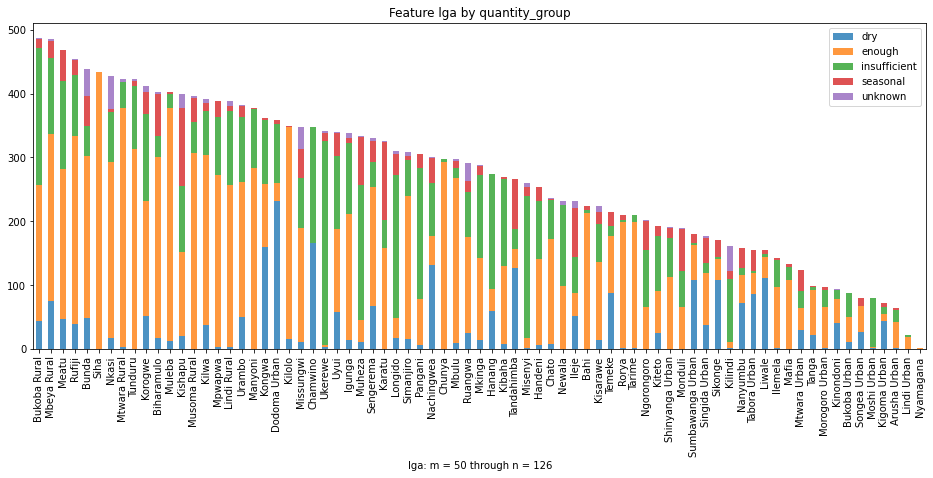

In [447]:
quantity_by_lga = dataset_eda_subset_any(df_train, col1='lga', col2='quantity_group', figsize=(16, 6), m=50, n=126)
quantity_by_lga

### Source by LGA

source,dam,hand dtw,lake,machine dbh,other,rainwater harvesting,river,shallow well,spring,unknown
lga,,,,,,,,,,
Njombe,1,231,0,9,0,0,863,43,1355,1
Arusha Rural,0,1,0,77,0,36,2,1,1134,1
Moshi Rural,0,0,0,136,0,2,156,0,952,5
Bariadi,0,0,0,25,6,46,0,1098,0,2
Rungwe,0,0,0,0,1,7,308,1,789,0
Kilosa,0,0,0,266,2,7,141,586,92,0
Kasulu,12,3,1,78,0,36,600,77,237,3
Mbozi,0,21,1,99,0,0,91,765,57,0
Meru,0,0,0,47,0,126,244,2,586,4


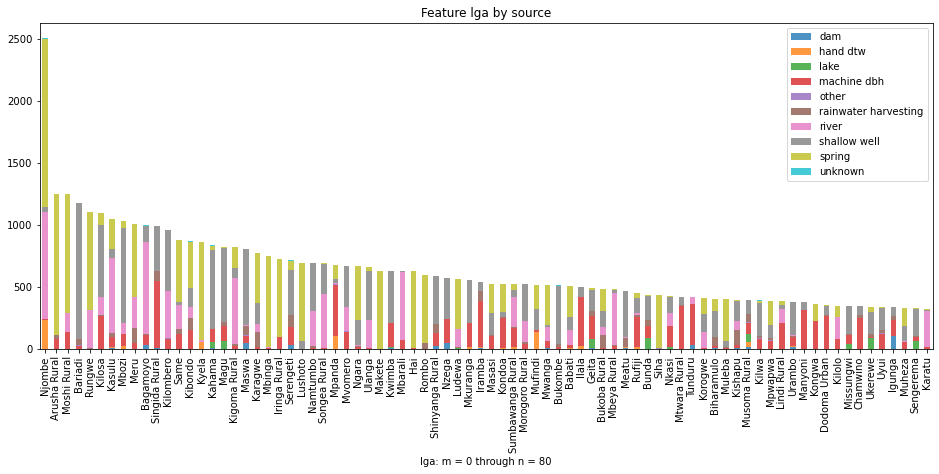

In [448]:
source_by_lga = dataset_eda_subset_any(df_train, col1='lga', col2='source', figsize=(16, 6), m=0, n=80)
source_by_lga

### Top LGAs by Feature Importance

In [449]:
top_lgas = ['Bariadi', 'Kigoma Rural', 'Kongwa', 'Makete', 'Siha', 'Rombo', 'Njombe', 
            'Chunya', 'Kyela', 'Newala', 'Hanang']

In [450]:
df_train.head(3)

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group,pop_binned
0,69572,6000.0,2011-03-14,roman,1390,roman,34.938093,-9.856322,none,0,Lake Nyasa,mnyusi_b,Iringa,11,5,Ludewa,Mundindi,109,True,GeoData Consultants Ltd,vwc,roman,False,1999,gravity,gravity,gravity,vwc,usergroup,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional,"(100, 150]"
1,8776,0.0,2013-03-06,grumeti,1399,grumeti,34.698766,-2.147466,zahanati,0,Lake Victoria,nyamara,Mara,20,2,Serengeti,Natta,280,NaN,GeoData Consultants Ltd,other,missing,True,2010,gravity,gravity,gravity,wug,usergroup,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional,"(200, 300]"
2,34310,25.0,2013-02-25,lottery_club,686,world_vision,37.460664,-3.821329,kwa_mahundi,0,Pangani,majengo,Manyara,21,4,Simanjiro,Ngorika,250,True,GeoData Consultants Ltd,vwc,nyumba_ya_mungu_pipe_scheme,True,2009,gravity,gravity,gravity,vwc,usergroup,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional,"(200, 300]"


In [451]:
df_top_lgas = df_train.loc[df_train['lga'].isin(top_lgas)]
df_top_lgas

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group,pop_binned
13,50495,0.0,2013-03-15,lawatefuka_water_supply,1368,lawatefuka_water_sup,37.092574,-3.181783e+00,kwa_john_izack_mmari,0,Pangani,omarini,Kilimanjaro,3,7,Siha,Siha Kaskazini,1,True,GeoData Consultants Ltd,water_board,bl_bondeni,True,2009,gravity,gravity,gravity,water_board,usergroup,pay monthly,monthly,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional,"(0, 1]"
16,48451,500.0,2011-07-04,unicef,1703,dwe,34.642439,-9.106185e+00,kwa_john_mtenzi,0,Rufiji,kidudumo,Iringa,11,4,Njombe,Mdandu,35,True,GeoData Consultants Ltd,wua,wangingombe_water_supply_s,True,1978,gravity,gravity,gravity,wua,usergroup,pay monthly,monthly,soft,good,dry,dry,river,river/lake,surface,communal standpipe,communal standpipe,non functional,"(25, 50]"
17,58155,0.0,2011-09-04,unicef,1656,dwe,34.569266,-9.085515e+00,kwa_rose_chaula,0,Rufiji,yeriko,Iringa,11,4,Njombe,Usuka,50,True,GeoData Consultants Ltd,wua,wangingombe_water_supply_s,True,1978,gravity,gravity,gravity,wua,usergroup,pay when scheme fails,on failure,soft,good,dry,dry,river,river/lake,surface,communal standpipe,communal standpipe,non functional,"(25, 50]"
20,48375,200.0,2011-02-27,twe,2216,twe,34.473430,-9.594990e+00,none,0,Lake Nyasa,majengo,Iringa,11,4,Njombe,Matola,4,True,GeoData Consultants Ltd,vwc,kidabu,False,2008,gravity,gravity,gravity,vwc,usergroup,pay monthly,monthly,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional,"(2, 5]"
21,6091,0.0,2013-02-10,dwsp,0,dwe,0.000000,-2.000000e-08,muungano,0,Lake Victoria,ibabachegu,Shinyanga,17,1,Bariadi,Ikungulyabashashi,0,NaN,GeoData Consultants Ltd,wug,missing,False,Missing,swn 80,swn 80,handpump,wug,usergroup,unknown,unknown,unknown,unknown,unknown,unknown,shallow well,shallow well,groundwater,hand pump,hand pump,functional,"(-1, 0]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59367,73019,2000.0,2011-03-09,government_of_tanzania,1977,commu,34.338899,-9.565553e+00,none,0,Lake Nyasa,chunya,Iringa,11,3,Makete,Lupila,0,True,GeoData Consultants Ltd,vwc,lupila,False,1976,gravity,gravity,gravity,vwc,usergroup,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional,"(-1, 0]"
59374,49651,0.0,2012-10-29,rwssp,0,dwe,0.000000,-2.000000e-08,nguvu_kazi,0,Lake Victoria,mwamtani_a,Shinyanga,17,1,Bariadi,Sagata,0,True,GeoData Consultants Ltd,wug,missing,False,Missing,nira/tanira,nira/tanira,handpump,wug,usergroup,other,other,soft,good,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump,functional,"(-1, 0]"
59378,38067,500.0,2011-03-21,rc,2101,acra,34.620387,-9.358405e+00,michael_msigwa,0,Rufiji,igelango,Iringa,11,4,Njombe,Imalinyi,36,True,GeoData Consultants Ltd,vwc,tove_mtwango,True,2008,gravity,gravity,gravity,wua,usergroup,pay monthly,monthly,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional,"(25, 50]"
59392,40607,0.0,2011-04-15,government_of_tanzania,0,government,33.009440,-8.520888e+00,benard_charles,0,Lake Rukwa,mbuyuni_a,Mbeya,12,1,Chunya,Mbuyuni,0,True,GeoData Consultants Ltd,vwc,missing,True,Missing,gravity,gravity,gravity,vwc,usergroup,never pay,never pay,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,non functional,"(-1, 0]"


status_group,functional,functional needs repair,non functional
lga,,,
Njombe,2007,94,402
Bariadi,580,409,188
Kyela,360,8,491
Kigoma Rural,285,327,212
Makete,564,0,66
Rombo,208,17,369
Siha,412,2,20
Kongwa,203,0,158
Chunya,72,100,126


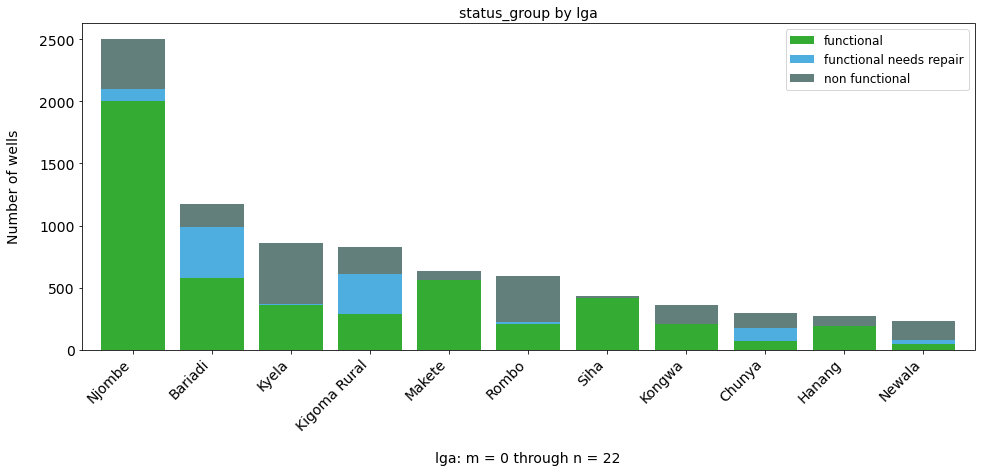

In [452]:
status_by_top_lgas = dataset_eda_subset(df_top_lgas, col1='lga', col2='status_group', figsize=(16, 6), m=0, n=22)
status_by_top_lgas

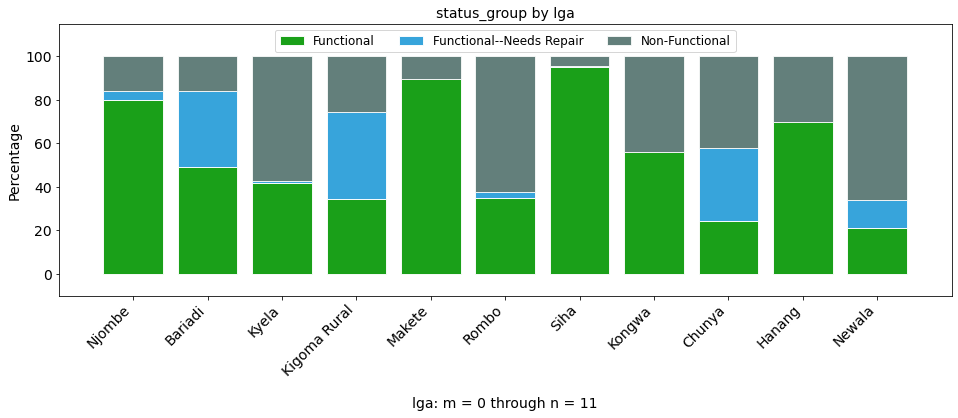

In [453]:
status_top_lgas_pct = dataset_eda_subset_pct(df_top_lgas, col1='lga', col2='status_group', figsize=(16, 5), m=0, n=11)

quantity_group,dry,enough,insufficient,seasonal,unknown
lga,,,,,
Njombe,198,2094,178,32,1
Bariadi,70,875,170,45,17
Kyela,492,326,31,9,1
Kigoma Rural,11,644,124,45,0
Makete,29,561,32,0,8
Rombo,0,216,345,33,0
Siha,0,434,0,0,0
Kongwa,159,99,100,3,0
Chunya,0,293,4,1,0


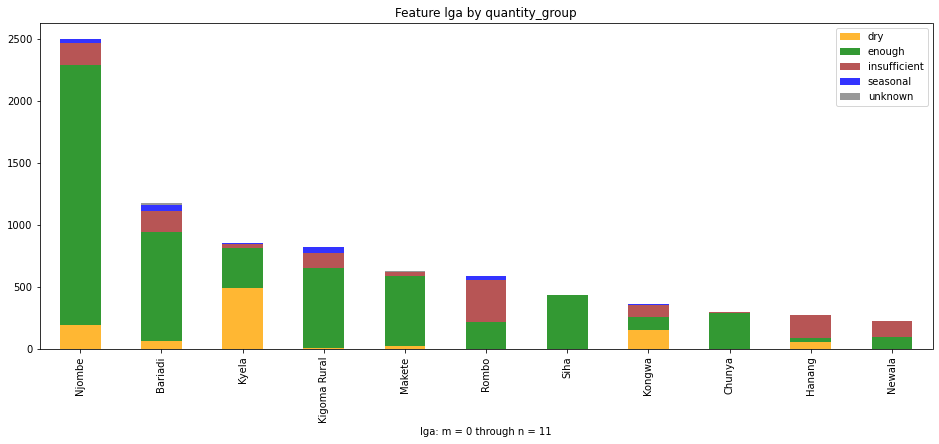

In [454]:
colors = ['orange', 'green', 'brown', 'blue', 'gray']

quantity_by_top_lgas = dataset_eda_subset_any(df_top_lgas, col1='lga', col2='quantity_group', 
                                              colors=colors, figsize=(16, 6), m=0, n=11)
quantity_by_top_lgas

source,dam,hand dtw,machine dbh,other,rainwater harvesting,river,shallow well,spring,unknown
lga,,,,,,,,,
Njombe,1,231,9,0,0,863,43,1355,1
Bariadi,0,0,25,6,46,0,1098,0,2
Kyela,0,56,0,0,0,20,0,783,0
Kigoma Rural,0,0,22,0,18,536,77,171,0
Makete,0,0,0,0,0,0,0,630,0
Rombo,0,0,3,1,43,0,0,547,0
Siha,0,0,1,7,0,0,0,426,0
Kongwa,0,0,225,0,0,0,2,134,0
Chunya,0,1,61,0,1,49,71,115,0


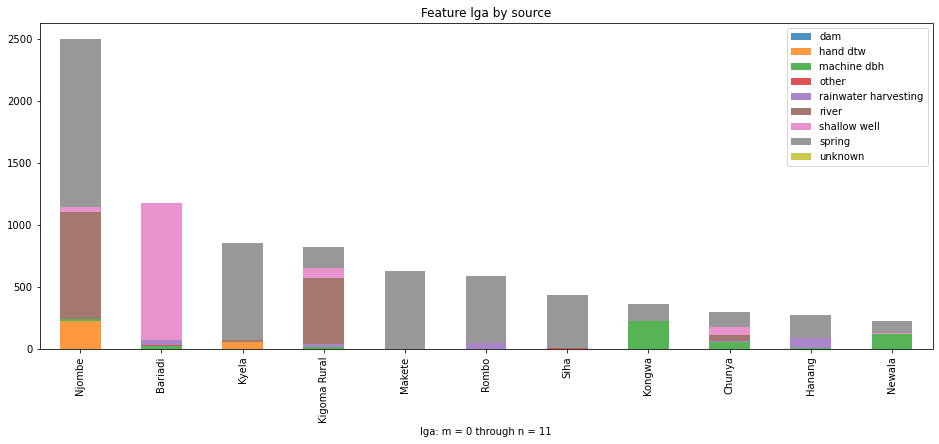

In [455]:
source_by_top_lgas = dataset_eda_subset_any(df_top_lgas, col1='lga', col2='source', figsize=(16, 6), m=0, n=11)
source_by_top_lgas

### Dividing up top LGAs by performance

In [456]:
top_lgas_good = ['Njombe', 'Makete', 'Siha', 'Kongwa']
df_top_lgas_good = df_train.loc[df_train['lga'].isin(top_lgas_good)]

top_lgas_okay = ['Bariadi', 'Kyela']
df_top_lgas_okay = df_train.loc[df_train['lga'].isin(top_lgas_okay)]

top_lgas_poor = ['Kigoma Rural', 'Rombo', 'Chunya', 'Newala']
df_top_lgas_poor = df_train.loc[df_train['lga'].isin(top_lgas_poor)]


In [457]:
df_top_lgas_good

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group,pop_binned
13,50495,0.0,2013-03-15,lawatefuka_water_supply,1368,lawatefuka_water_sup,37.092574,-3.181783,kwa_john_izack_mmari,0,Pangani,omarini,Kilimanjaro,3,7,Siha,Siha Kaskazini,1,True,GeoData Consultants Ltd,water_board,bl_bondeni,True,2009,gravity,gravity,gravity,water_board,usergroup,pay monthly,monthly,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional,"(0, 1]"
16,48451,500.0,2011-07-04,unicef,1703,dwe,34.642439,-9.106185,kwa_john_mtenzi,0,Rufiji,kidudumo,Iringa,11,4,Njombe,Mdandu,35,True,GeoData Consultants Ltd,wua,wangingombe_water_supply_s,True,1978,gravity,gravity,gravity,wua,usergroup,pay monthly,monthly,soft,good,dry,dry,river,river/lake,surface,communal standpipe,communal standpipe,non functional,"(25, 50]"
17,58155,0.0,2011-09-04,unicef,1656,dwe,34.569266,-9.085515,kwa_rose_chaula,0,Rufiji,yeriko,Iringa,11,4,Njombe,Usuka,50,True,GeoData Consultants Ltd,wua,wangingombe_water_supply_s,True,1978,gravity,gravity,gravity,wua,usergroup,pay when scheme fails,on failure,soft,good,dry,dry,river,river/lake,surface,communal standpipe,communal standpipe,non functional,"(25, 50]"
20,48375,200.0,2011-02-27,twe,2216,twe,34.473430,-9.594990,none,0,Lake Nyasa,majengo,Iringa,11,4,Njombe,Matola,4,True,GeoData Consultants Ltd,vwc,kidabu,False,2008,gravity,gravity,gravity,vwc,usergroup,pay monthly,monthly,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional,"(2, 5]"
22,58500,0.0,2011-10-04,unicef,1510,dwe,34.586901,-8.980014,shuleni,0,Rufiji,mkanivega,Iringa,11,4,Njombe,Usuka,350,True,GeoData Consultants Ltd,wua,wangingombe_water_supply_s,True,1978,gravity,gravity,gravity,wua,usergroup,never pay,never pay,soft,good,enough,enough,river,river/lake,surface,communal standpipe,communal standpipe,functional needs repair,"(300, 400]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59362,18917,0.0,2011-03-02,samlo,2190,shipo,34.716812,-9.537797,none,0,Lake Nyasa,mnogelwa,Iringa,11,4,Njombe,Luponde,60,True,GeoData Consultants Ltd,NaN,missing,False,2007,other - rope pump,rope pump,rope pump,private_operator,commercial,never pay,never pay,soft,good,insufficient,insufficient,shallow well,shallow well,groundwater,hand pump,hand pump,functional,"(50, 100]"
59365,8810,0.0,2011-09-04,unicef,1656,dwe,34.594790,-9.072904,kwa_yohane_mhanza,0,Rufiji,kati,Iringa,11,4,Njombe,Usuka,35,True,GeoData Consultants Ltd,wua,wangingombe_water_supply_s,True,1978,gravity,gravity,gravity,wua,usergroup,pay when scheme fails,on failure,soft,good,enough,enough,river,river/lake,surface,communal standpipe,communal standpipe,functional needs repair,"(25, 50]"
59367,73019,2000.0,2011-03-09,government_of_tanzania,1977,commu,34.338899,-9.565553,none,0,Lake Nyasa,chunya,Iringa,11,3,Makete,Lupila,0,True,GeoData Consultants Ltd,vwc,lupila,False,1976,gravity,gravity,gravity,vwc,usergroup,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional,"(-1, 0]"
59378,38067,500.0,2011-03-21,rc,2101,acra,34.620387,-9.358405,michael_msigwa,0,Rufiji,igelango,Iringa,11,4,Njombe,Imalinyi,36,True,GeoData Consultants Ltd,vwc,tove_mtwango,True,2008,gravity,gravity,gravity,wua,usergroup,pay monthly,monthly,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional,"(25, 50]"


In [458]:
df_top_lgas_okay

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group,pop_binned
21,6091,0.0,2013-02-10,dwsp,0,dwe,0.000000,-2.000000e-08,muungano,0,Lake Victoria,ibabachegu,Shinyanga,17,1,Bariadi,Ikungulyabashashi,0,NaN,GeoData Consultants Ltd,wug,missing,False,Missing,swn 80,swn 80,handpump,wug,usergroup,unknown,unknown,unknown,unknown,unknown,unknown,shallow well,shallow well,groundwater,hand pump,hand pump,functional,"(-1, 0]"
36,67359,0.0,2011-07-16,danida,0,central_government,33.854345,-9.638520e+00,office_ya_kijiji,0,Lake Nyasa,ndanganyika,Mbeya,12,3,Kyela,Katumbasongwe,0,True,GeoData Consultants Ltd,vwc,ngana_water_supplied_scheme,True,Missing,gravity,gravity,gravity,vwc,usergroup,never pay,never pay,soft,good,dry,dry,spring,spring,groundwater,communal standpipe,communal standpipe,non functional,"(-1, 0]"
52,10745,0.0,2011-07-31,kkkt_makwale,0,kkkt___konde_and_dwe,33.958163,-9.448122e+00,kwa_abeli_mwamakula,0,Lake Nyasa,isimba,Mbeya,12,3,Kyela,Makwale,0,True,GeoData Consultants Ltd,vwc,makwale_water_supplied_sche,True,Missing,gravity,gravity,gravity,vwc,usergroup,never pay,never pay,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional,"(-1, 0]"
140,49585,0.0,2011-10-07,sida,0,central_government,33.860845,-9.596084e+00,kwa_mwabibi_mstafa,0,Lake Nyasa,mikoroshini,Mbeya,12,3,Kyela,Kyela Urban,0,True,GeoData Consultants Ltd,water_authority,kanga_water_supplied_scheme,True,Missing,gravity,gravity,gravity,water_authority,commercial,never pay,never pay,soft,good,dry,dry,river,river/lake,surface,communal standpipe,communal standpipe,non functional,"(-1, 0]"
168,72678,0.0,2013-01-30,wvt,0,wvt,0.000000,-2.000000e-08,wvt_tanzania,0,Lake Victoria,ilula,Shinyanga,17,1,Bariadi,Chinamili,0,False,GeoData Consultants Ltd,parastatal,missing,False,Missing,gravity,gravity,gravity,parastatal,parastatal,other,other,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional,"(-1, 0]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59287,37867,0.0,2011-07-24,brown,0,brown,33.809813,-9.495367e+00,kwa_brown_mwalutambi,0,Lake Nyasa,lusungo,Mbeya,12,3,Kyela,Ipande,0,True,GeoData Consultants Ltd,vwc,sinyanga__water_supplied_sc,True,Missing,gravity,gravity,gravity,vwc,usergroup,never pay,never pay,soft,good,dry,dry,spring,spring,groundwater,communal standpipe,communal standpipe,non functional,"(-1, 0]"
59295,60843,0.0,2011-07-19,rwssp,0,dwe,0.000000,-2.000000e-08,maendeleo,0,Lake Victoria,mwamalizi,Shinyanga,17,1,Bariadi,Chinamili,0,True,GeoData Consultants Ltd,wug,missing,False,Missing,nira/tanira,nira/tanira,handpump,wug,usergroup,never pay,never pay,soft,good,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump,functional needs repair,"(-1, 0]"
59324,748,0.0,2013-01-22,world_vision,0,world_vision,0.000000,-2.000000e-08,mwazwilo,0,Lake Victoria,mbita,Shinyanga,17,1,Bariadi,Mbita,0,NaN,GeoData Consultants Ltd,wug,missing,False,Missing,nira/tanira,nira/tanira,handpump,wug,usergroup,unknown,unknown,soft,good,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump,functional,"(-1, 0]"
59352,32775,0.0,2011-01-08,kkkt_makwale,0,kkkt___konde_and_dwe,33.993468,-9.441295e+00,kwa_tilani,0,Lake Nyasa,kilombero,Mbeya,12,3,Kyela,Matema,0,True,GeoData Consultants Ltd,vwc,makwale_water_supplied_sche,True,Missing,gravity,gravity,gravity,vwc,usergroup,never pay,never pay,soft,good

In [459]:
df_top_lgas_poor

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group,pop_binned
24,51058,0.0,2013-01-21,african_development_bank,1645,dwe,29.747066,-4.495568,kamsasa,0,Lake Tanganyika,msasa,Kigoma,16,3,Kigoma Rural,Mkigo,156,False,GeoData Consultants Ltd,vwc,quick_wins_program,True,2009,gravity,gravity,gravity,vwc,usergroup,unknown,unknown,soft,good,enough,enough,spring,spring,groundwater,improved spring,improved spring,functional,"(150, 200]"
28,19685,0.0,2013-03-05,government_of_tanzania,1443,district_council,37.611126,-3.263526,kwa_kibakaya,0,Pangani,kiyao,Kilimanjaro,3,1,Rombo,Mengwe Manda,1,True,GeoData Consultants Ltd,company,kitukuni_water_supply,True,2000,gravity,gravity,gravity,company,commercial,pay monthly,monthly,soft,good,insufficient,insufficient,spring,spring,groundwater,communal standpipe,communal standpipe,non functional,"(0, 1]"
62,2127,500.0,2013-01-16,norad,954,rwe,29.669720,-4.779758,kwa_jakata,0,Lake Tanganyika,kiganza_centre,Kigoma,16,3,Kigoma Rural,Kagongo,567,True,GeoData Consultants Ltd,vwc,mkongoro_one,True,1985,gravity,gravity,gravity,vwc,usergroup,pay monthly,monthly,soft,good,enough,enough,river,river/lake,surface,communal standpipe multiple,communal standpipe,functional needs repair,"(500, 600]"
69,54801,0.0,2013-02-04,government_of_tanzania,1694,dwe,29.768009,-4.471809,zahanati,0,Lake Tanganyika,kisoro,Kigoma,16,2,Kigoma Rural,Mkigo,1,True,GeoData Consultants Ltd,water_authority,missing,False,2004,other,other,other,private_operator,commercial,never pay,never pay,soft,good,dry,dry,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,non functional,"(0, 1]"
90,43237,200.0,2013-01-17,isftacare,1002,isf_and_tacare,29.670989,-4.726850,muungano,0,Lake Tanganyika,kilundo,Kigoma,16,3,Kigoma Rural,Mwamgongo,120,True,GeoData Consultants Ltd,wug,chankelebubango_water_project,True,2006,gravity,gravity,gravity,vwc,usergroup,pay monthly,monthly,soft,good,enough,enough,river,river/lake,surface,communal standpipe,communal standpipe,functional needs repair,"(100, 150]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59317,39611,100.0,2013-01-19,norad,1095,rwe,29.711784,-4.675407,kwa_majid,0,Lake Tanganyika,majengo_b,Kigoma,16,3,Kigoma Rural,Bitale,145,True,GeoData Consultants Ltd,vwc,mkongoro_one,True,1980,gravity,gravity,gravity,vwc,usergroup,pay monthly,monthly,soft,good,enough,enough,river,river/lake,surface,communal standpipe multiple,communal standpipe,functional needs repair,"(100, 150]"
59319,31234,250.0,2013-01-29,norad,1099,norad,29.959029,-4.840482,kwa_zakaria,0,Lake Tanganyika,kwaga_b,Kigoma,16,2,Kigoma Rural,Matendo,680,True,GeoData Consultants Ltd,water_authority,kasangezi,True,1983,gravity,gravity,gravity,water_board,usergroup,pay monthly,monthly,soft,good,enough,enough,river,river/lake,surface,communal standpipe,communal standpipe,functional,"(600, 700]"
59337,29915,600.0,2013-01-28,isf,834,dwe,29.749577,-4.899134,shule_ya_msingi_muhamani,0,Lake Tanganyika,kaskazini,Kigoma,16,3,Kigoma Rural,Simbo,788,True,GeoData Consultants Ltd,parastatal,mkongoro_two,True,2009,gravity,gravity,gravity,parastatal,parastatal,unknown,unknown,soft,good,enough,enough,river,river/lake,surface,communal standpipe multiple,communal standpipe,non functional,"(700, 800]"
59345,68576,600.0,2013-01-25,isf,962,dwe,29.729909,-4.801508,tupendane,0,Lake Tanganyika,kabanga,Kigoma,16,3,Kigoma Rural,Mahembe,500,True,GeoData Consultants Ltd,wug,mkongoro_two,True

status_group,functional,functional needs repair,non functional
lga,,,
Njombe,2007,94,402
Makete,564,0,66
Siha,412,2,20
Kongwa,203,0,158


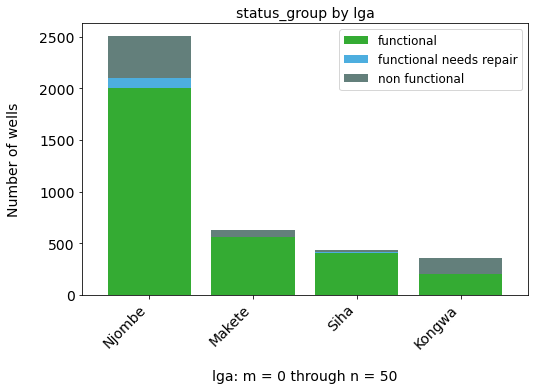

In [460]:
status_by_top_lgas_good = dataset_eda_subset(df_top_lgas_good, col1='lga', col2='status_group', figsize=(8, 5), m=0, n=50)
status_by_top_lgas_good

quantity_group,dry,enough,insufficient,seasonal,unknown
lga,,,,,
Njombe,198,2094,178,32,1
Makete,29,561,32,0,8
Siha,0,434,0,0,0
Kongwa,159,99,100,3,0


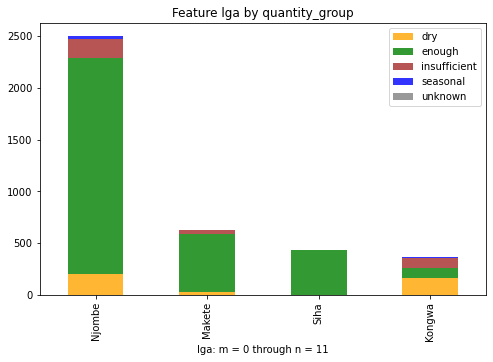

In [461]:
colors = ['orange', 'green', 'brown', 'blue', 'gray']

quantity_by_top_lgas_good = dataset_eda_subset_any(df_top_lgas_good, col1='lga', col2='quantity_group', 
                                                   colors=colors, figsize=(8, 5), m=0, n=11)
quantity_by_top_lgas_good

source,dam,hand dtw,machine dbh,other,river,shallow well,spring,unknown
lga,,,,,,,,
Njombe,1,231,9,0,863,43,1355,1
Makete,0,0,0,0,0,0,630,0
Siha,0,0,1,7,0,0,426,0
Kongwa,0,0,225,0,0,2,134,0


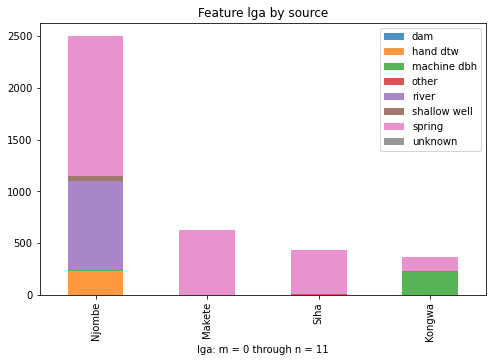

In [462]:
source_by_top_lgas_good = dataset_eda_subset_any(df_top_lgas_good, col1='lga', col2='source', figsize=(8, 5), m=0, n=11)
source_by_top_lgas_good

status_group,functional,functional needs repair,non functional
lga,,,
Bariadi,580,409,188
Kyela,360,8,491


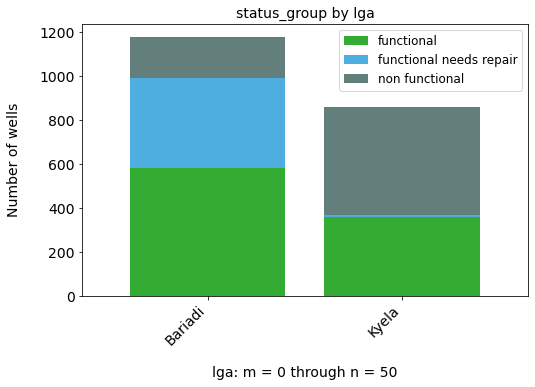

In [463]:
status_by_top_lgas_okay = dataset_eda_subset(df_top_lgas_okay, col1='lga', col2='status_group', figsize=(8, 5), m=0, n=50)
status_by_top_lgas_okay

quantity_group,dry,enough,insufficient,seasonal,unknown
lga,,,,,
Bariadi,70,875,170,45,17
Kyela,492,326,31,9,1


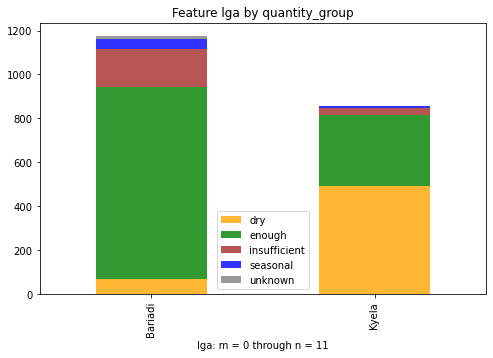

In [464]:
colors = ['orange', 'green', 'brown', 'blue', 'gray']

quantity_by_top_lgas_okay = dataset_eda_subset_any(df_top_lgas_okay, col1='lga', col2='quantity_group', 
                                                   colors=colors, figsize=(8, 5), m=0, n=11)
quantity_by_top_lgas_okay

source,hand dtw,machine dbh,other,rainwater harvesting,river,shallow well,spring,unknown
lga,,,,,,,,
Bariadi,0,25,6,46,0,1098,0,2
Kyela,56,0,0,0,20,0,783,0


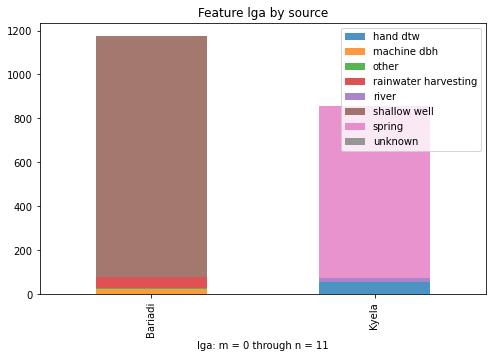

In [465]:
source_by_top_lgas_okay = dataset_eda_subset_any(df_top_lgas_okay, col1='lga', col2='source', figsize=(8, 5), m=0, n=11)
source_by_top_lgas_okay

status_group,functional,functional needs repair,non functional
lga,,,
Kigoma Rural,285,327,212
Rombo,208,17,369
Chunya,72,100,126
Newala,49,30,152


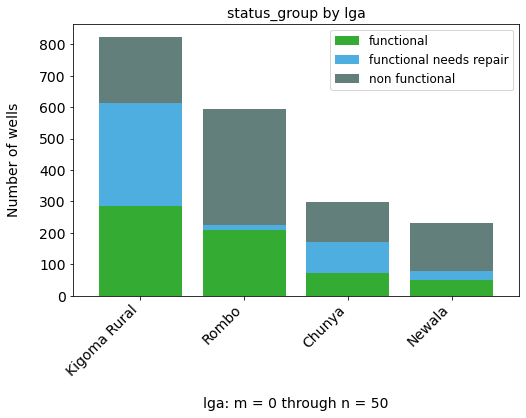

In [466]:
status_by_top_lgas_poor = dataset_eda_subset(df_top_lgas_poor, col1='lga', col2='status_group', figsize=(8, 5), m=0, n=50)
status_by_top_lgas_poor

quantity_group,dry,enough,insufficient,seasonal,unknown
lga,,,,,
Kigoma Rural,11,644,124,45,0
Rombo,0,216,345,33,0
Chunya,0,293,4,1,0
Newala,0,98,128,0,5


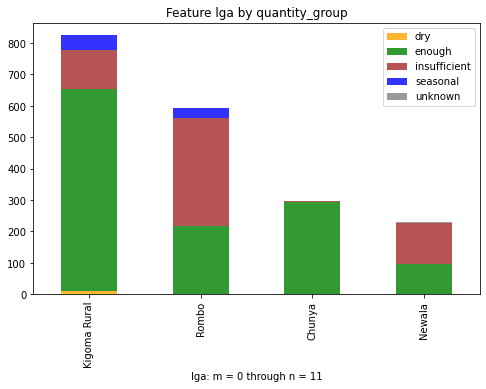

In [467]:
colors = ['orange', 'green', 'brown', 'blue', 'gray']

quantity_by_top_lgas_poor = dataset_eda_subset_any(df_top_lgas_poor, col1='lga', col2='quantity_group', 
                                                   colors=colors, figsize=(8, 5), m=0, n=11)
quantity_by_top_lgas_poor

source,hand dtw,machine dbh,other,rainwater harvesting,river,shallow well,spring
lga,,,,,,,
Kigoma Rural,0,22,0,18,536,77,171
Rombo,0,3,1,43,0,0,547
Chunya,1,61,0,1,49,71,115
Newala,0,121,0,0,0,9,101


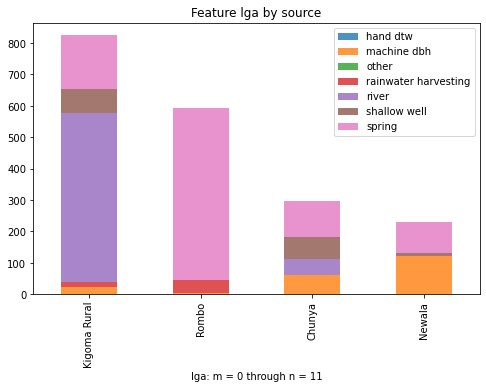

In [468]:
source_by_top_lgas_poor = dataset_eda_subset_any(df_top_lgas_poor, col1='lga', col2='source', figsize=(8, 5), m=0, n=11)
source_by_top_lgas_poor

## Code for additional XGBoost hyperparameter tuning options

In [469]:
# From https://towardsdatascience.com/doing-xgboost-hyper-parameter-tuning-the-smart-way-part-1-of-2-f6d255a45dde

# {"learning_rate"    : [0.05, 0.10, 0.15, 0.20, 0.25, 0.30 ] ,
#  "max_depth"        : [ 3, 4, 5, 6, 8, 10, 12, 15],
#  "min_child_weight" : [ 1, 3, 5, 7 ],
#  "gamma"            : [ 0.0, 0.1, 0.2 , 0.3, 0.4 ],
#  "colsample_bytree" : [ 0.3, 0.4, 0.5 , 0.7 ] }